# IDENTFICICATION OF STORMS FOR THE SYM-H INDEX OF EACH INTENSITY CLASS

In [1]:
import pandas as pd
import utils
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm

# Set seaborn styles for the plots
sns.set_style('whitegrid')
sns.set_context("paper")

In [2]:
print('Finding storms based on the findings of the distribution of the maximum (minimum) of the ASY-H (SYM-H) index when grouping in 27 days to avoid persistence\n')

# Print threshold information for classification
print(f'Times when the SYM-H is over {utils.SYM_H_THRESHOLD_LOW} (percentile 40) will be ignored')
print(f'Times when the SYM-H is between {utils.SYM_H_THRESHOLD_LOW} and {utils.SYM_H_THRESHOLD_MODERATE} (percentile 20) will be classified as "LOW"')
print(f'Times when the SYM-H is between {utils.SYM_H_THRESHOLD_MODERATE} and {utils.SYM_H_THRESHOLD_INTENSE} (percentile 5) will be classified as "MODERATE"')
print(f'Times when the SYM-H is between {utils.SYM_H_THRESHOLD_INTENSE} and {utils.SYM_H_THRESHOLD_SUPERINTENSE} (percentile 1) will be classified as "INTENSE"')
print(f'Times when the SYM-H is below {utils.SYM_H_THRESHOLD_SUPERINTENSE} will be classified as "SUPERINTENSE"')

Finding storms based on the findings of the distribution of the maximum (minimum) of the ASY-H (SYM-H) index when grouping in 27 days to avoid persistence

Times when the SYM-H is over -90 (percentile 40) will be ignored
Times when the SYM-H is between -90 and -130 (percentile 20) will be classified as "LOW"
Times when the SYM-H is between -130 and -230 (percentile 5) will be classified as "MODERATE"
Times when the SYM-H is between -230 and -390 (percentile 1) will be classified as "INTENSE"
Times when the SYM-H is below -390 will be classified as "SUPERINTENSE"


In [3]:
# Read data from pickle file
dfx = pd.read_pickle('./sym_asy_indices.pkl', compression = 'gzip')

# Extract dates with ASY-H index values above or equal to the low threshold
dates_sym = dfx['SYM_H'].reset_index().copy()
dates_sym = dates_sym.loc[dates_sym['SYM_H'] <= utils.SYM_H_THRESHOLD_LOW]

# Set the last valid year for storm classification
last_valid_year = 2022

# Initialize empty list to store storm data
storms_sym = []

Iterate over the dates with SYM-H values below the low intensity threshold.

* Calculate the start and end dates for the storm period based on the current date using one day as the offset.
* Find the minimum SYM-H value within the storm period.
* Find the index of the storm center (first occurrence of the minimum SYM-H value).
* Calculates the extended start and end dates for the storm period, considering 2 additional days before and 4 days after for the storm, the number of days before and after are estimated using the superposed epoch analysis.
* Checks if the end date exceeds the last valid year for classification and skips the current date if it does.
* Extracts the storm data within the extended period.
* Checks if there are more storms within the extended period with higher SYM-H values and updates the storm data accordingly.
* Checks if the new storm period overlaps with the previous storm and merges them if it does.
* Adds the new storm data to the list.

In [4]:
# Iterate over dates with SYM-H index values below the low intensity threshold
for i in tqdm(range(len(dates_sym))):
    st = dates_sym.iloc[i]['datetime'] - utils.MINIMUM_DAYS_BEFORE
    nd = dates_sym.iloc[i]['datetime'] + utils.MINIMUM_DAYS_AFTER
    
    
    # Find the last and first values over the low threshold within a minimum offset of one day before and after
    last_low_value = dfx[st:nd].loc[dfx[st:nd]['SYM_H'] <= utils.SYM_H_THRESHOLD_LOW].last_valid_index()
    first_low_value = dfx[st:nd].loc[dfx[st:nd]['SYM_H'] <= utils.SYM_H_THRESHOLD_LOW].first_valid_index()
    
    # Adjust the start and end dates of the storm period determined with the superposed epoch analysis
    newst = first_low_value - utils.STORM_DAYS_BEFORE_OFFSET
    newst = newst.floor('D')
    newnd = last_low_value + utils.STORM_DAYS_AFTER_OFFSET
    newnd = newnd.ceil('D')
    
    # If the end year exceeds the last valid year, continue to the next date
    if (newnd.year > last_valid_year):
        continue
    
    # Create a new DataFrame to store the storm data within the adjusted storm period
    new_df = dfx[newst:newnd].copy()
    
    # Extend the storm period if there are additional last low values beyond the initial range
    while dfx[newst:newnd].loc[dfx[newst:newnd]['SYM_H'] <= utils.SYM_H_THRESHOLD_LOW].last_valid_index() > last_low_value:
        last_low_value = dfx[newst:newnd].loc[dfx[newst:newnd]['SYM_H'] <= utils.SYM_H_THRESHOLD_LOW].last_valid_index()
        newnd = last_low_value + utils.STORM_DAYS_AFTER_OFFSET
        newnd = newnd.floor('D') - pd.DateOffset(minutes=5) + pd.DateOffset(days = 1)
        new_df = dfx[newst : newnd].copy()    
        
    # Check if there is already a storm in the list and its end date is greater than or equal to the adjusted start date
    if (len(storms_sym) >= 1):
        if storms_sym[-1].index[-1] >= newst:
            # Concatenate the new storm data with the previous storm data
            new_df = pd.concat([storms_sym[-1], new_df])            
            new_df = new_df[~new_df.index.duplicated(keep='first')]            
            storms_sym[-1] = new_df
            continue
    
    # Append the new storm data to the list
    storms_sym.append(new_df)
    
# Print the total number of storms
print(f"Total storms: {len(storms_sym)}")

  0%|          | 0/43860 [00:00<?, ?it/s]

Total storms: 275


In [5]:
# Create a summary dataframe with the start and end dates, the duration, the minimum SYM-H value 
# of the storm and the corresponding class of the storm
summary_df_sym = utils.get_summary_df_sym(storms_sym)
summary_df_sym['classification'] = 'LOW'
summary_df_sym.loc[(summary_df_sym['Min SYM-H'] <= utils.SYM_H_THRESHOLD_MODERATE) & (summary_df_sym['Min SYM-H'] > utils.SYM_H_THRESHOLD_INTENSE), 'classification'] = 'MODERATE'
summary_df_sym.loc[(summary_df_sym['Min SYM-H'] <= utils.SYM_H_THRESHOLD_INTENSE) & (summary_df_sym['Min SYM-H'] > utils.SYM_H_THRESHOLD_SUPERINTENSE), 'classification'] = 'INTENSE'
summary_df_sym.loc[summary_df_sym['Min SYM-H'] <= utils.SYM_H_THRESHOLD_SUPERINTENSE, 'classification'] = 'SUPERINTENSE'

In [6]:
# Display all the identified storms
with pd.option_context('display.max_rows', 400, 'display.max_columns', 20):
    display(summary_df_sym) 
print(f'Total storms shown: {len(summary_df_sym)}')

,Start date,End date,TD,Min SYM-H,classification
0,1981-02-04,1981-02-12,8 days,-153,MODERATE
1,1981-03-03,1981-03-11,8 days,-235,INTENSE
2,1981-03-12,1981-03-19,7 days,-93,LOW
3,1981-04-10,1981-05-02,22 days,-338,INTENSE
4,1981-05-07,1981-05-23,16 days,-140,MODERATE
5,1981-06-27,1981-07-04,7 days,-95,LOW
6,1981-07-21,1981-08-01,11 days,-255,INTENSE
7,1981-08-21,1981-08-28,7 days,-116,LOW
8,1981-10-09,1981-10-28,19 days,-215,MODERATE
9,1981-11-09,1981-11-17,8 days,-132,MODERATE


Total storms shown: 275


LOW             157
MODERATE         88
INTENSE          23
SUPERINTENSE      7
Name: classification, dtype: int64
Total number of storms 275


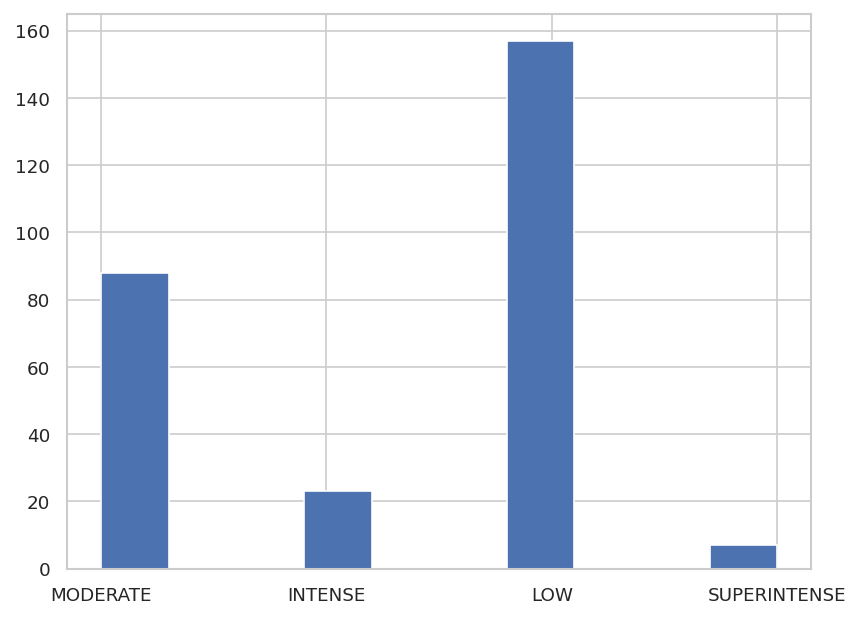

In [7]:
# Plot a histogram of the storm classifications
plt.hist(summary_df_sym['classification'], align = 'mid')
# Print the count of each storm classification
print(summary_df_sym['classification'].value_counts())
# Print the total number of storms
print('Total number of storms', len(summary_df_sym))
plt.show();

In [8]:
# Get the indices of storms classified as 'LOW'
low_indices = summary_df_sym.loc[(summary_df_sym['Min SYM-H'] < utils.SYM_H_THRESHOLD_LOW ) & 
                                ((summary_df_sym['Min SYM-H'] > utils.SYM_H_THRESHOLD_MODERATE ))].index

# Get the indices of storms classified as 'MODERATE'
moderate_indices = summary_df_sym.loc[(summary_df_sym['Min SYM-H'] < utils.SYM_H_THRESHOLD_MODERATE ) & 
                                ((summary_df_sym['Min SYM-H'] > utils.SYM_H_THRESHOLD_INTENSE ))].index

# Get the indices of storms classified as 'INTENSE'
intense_indices  = summary_df_sym.loc[(summary_df_sym['Min SYM-H'] < utils.SYM_H_THRESHOLD_INTENSE ) & 
                                ((summary_df_sym['Min SYM-H'] > utils.SYM_H_THRESHOLD_SUPERINTENSE ))].index

# Get the indices of storms classified as 'SUPERINTENSE'
superintense_indices  = summary_df_sym.loc[summary_df_sym['Min SYM-H'] < utils.SYM_H_THRESHOLD_SUPERINTENSE].index


print('low_indices',  len(low_indices))
print('moderate_indices', len(moderate_indices))
print('intense_indices',  len(intense_indices))
print('superintense_indices',  len(superintense_indices))

low_indices 150
moderate_indices 85
intense_indices 23
superintense_indices 7


150 storms of low intensity
Plotting storm 2
Start date        1981-03-12 00:00:00
End date          1981-03-19 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -93
classification                    LOW
Name: 2, dtype: object
Minimum SYM-H value -93 at: 1981-03-14 15:10:00


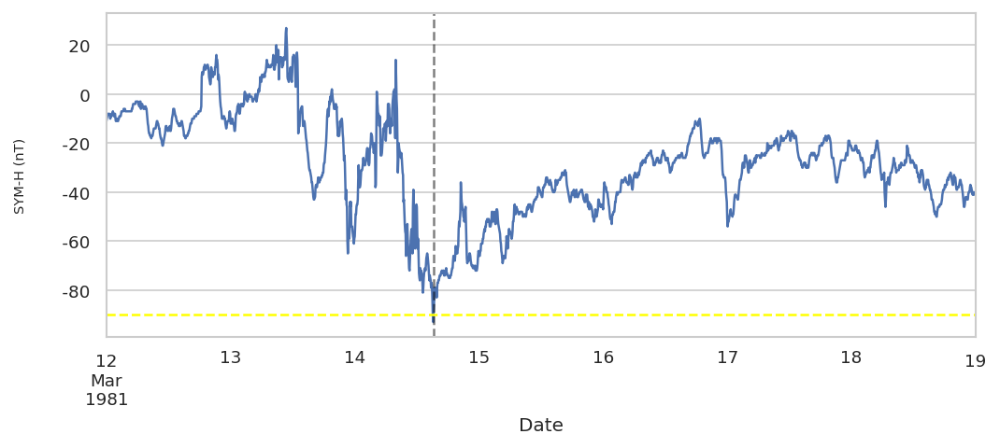

Plotting storm 5
Start date        1981-06-27 00:00:00
End date          1981-07-04 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -95
classification                    LOW
Name: 5, dtype: object
Minimum SYM-H value -95 at: 1981-06-29 12:00:00


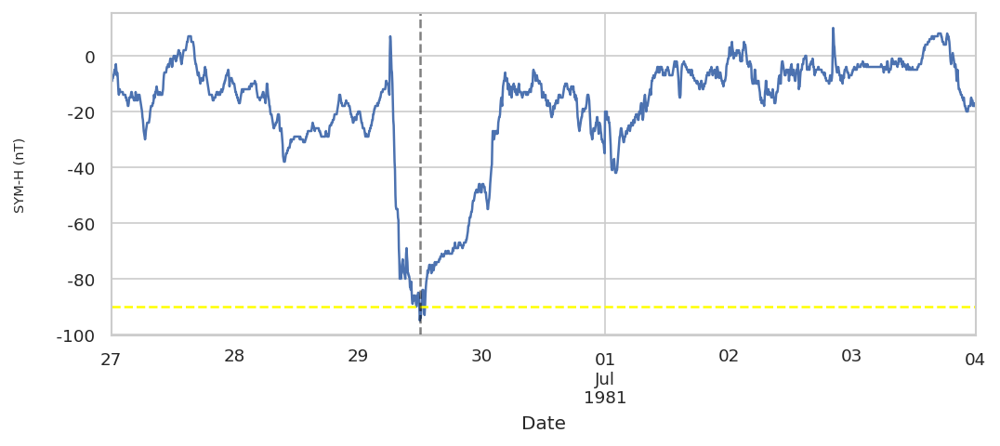

Plotting storm 7
Start date        1981-08-21 00:00:00
End date          1981-08-28 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -116
classification                    LOW
Name: 7, dtype: object
Minimum SYM-H value -116 at: 1981-08-23 23:10:00


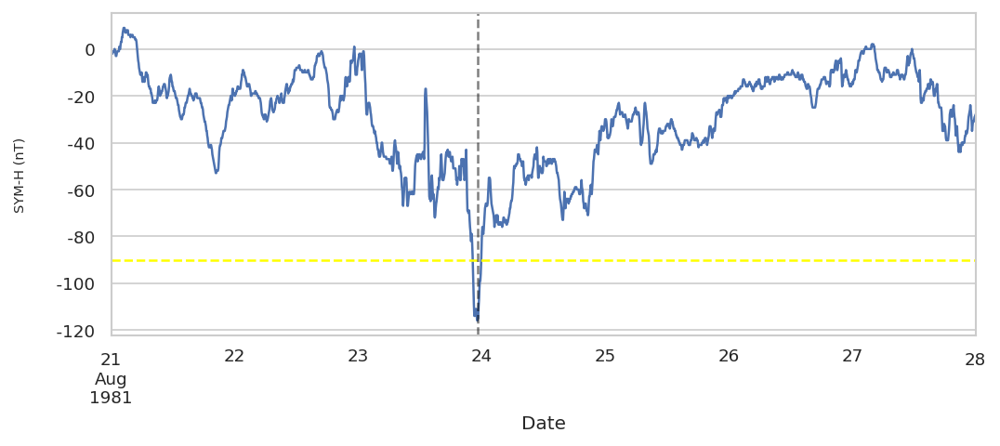

Plotting storm 10
Start date        1982-01-29 00:00:00
End date          1982-02-10 00:00:00
TD                   12 days 00:00:00
Min SYM-H                        -118
classification                    LOW
Name: 10, dtype: object
Minimum SYM-H value -118 at: 1982-02-02 09:10:00


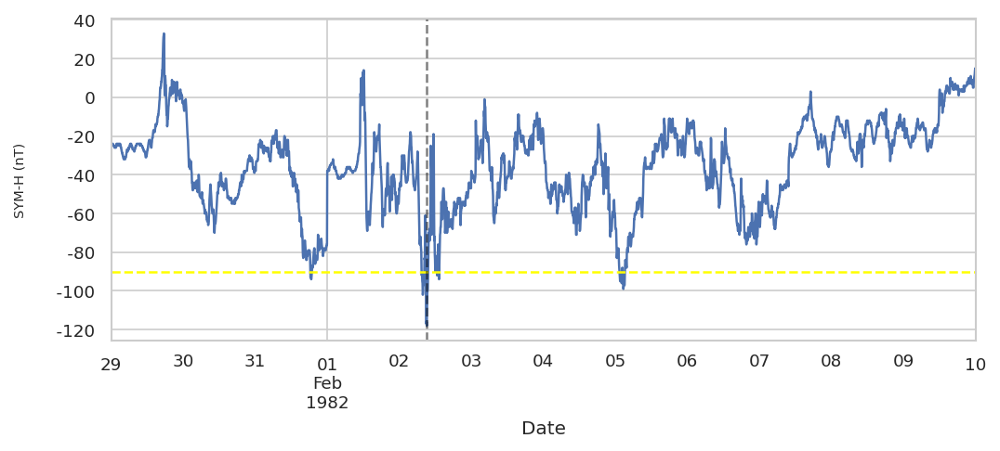

Plotting storm 18
Start date        1982-10-05 00:00:00
End date          1982-10-19 00:00:00
TD                   14 days 00:00:00
Min SYM-H                        -105
classification                    LOW
Name: 18, dtype: object
Minimum SYM-H value -105 at: 1982-10-07 08:00:00


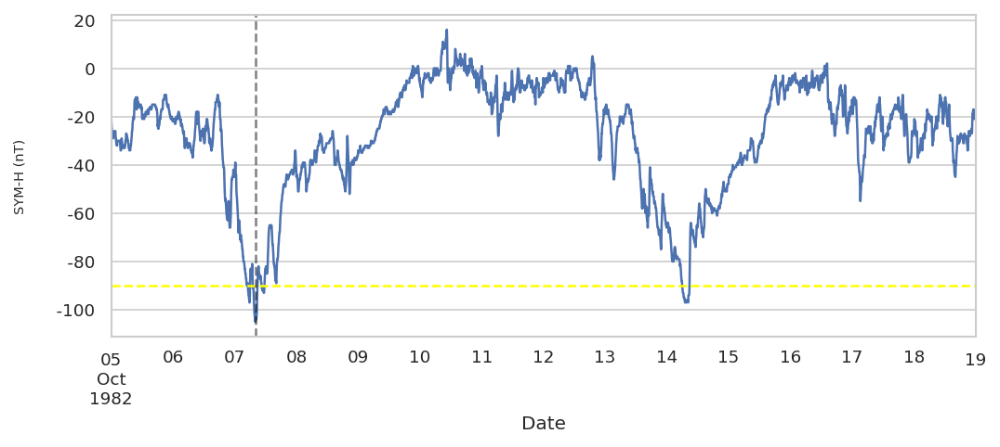

Plotting storm 20
Start date        1982-12-05 00:00:00
End date          1982-12-12 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -91
classification                    LOW
Name: 20, dtype: object
Minimum SYM-H value -91 at: 1982-12-07 23:00:00


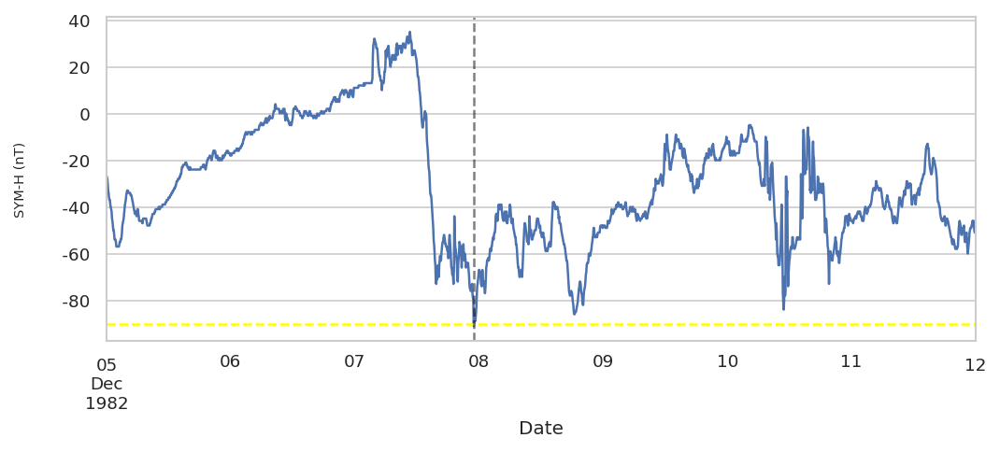

Plotting storm 21
Start date        1982-12-15 00:00:00
End date          1982-12-27 00:00:00
TD                   12 days 00:00:00
Min SYM-H                        -115
classification                    LOW
Name: 21, dtype: object
Minimum SYM-H value -115 at: 1982-12-22 04:45:00


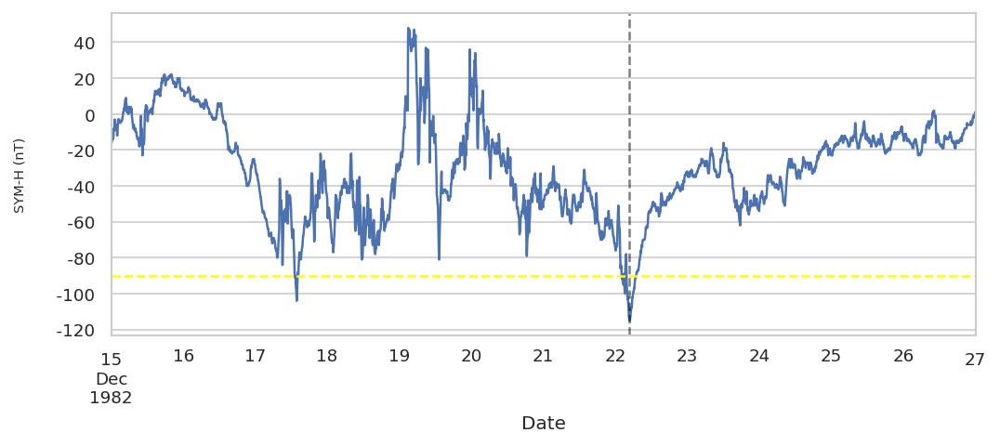

Plotting storm 24
Start date        1983-02-18 00:00:00
End date          1983-02-25 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -95
classification                    LOW
Name: 24, dtype: object
Minimum SYM-H value -95 at: 1983-02-20 21:30:00


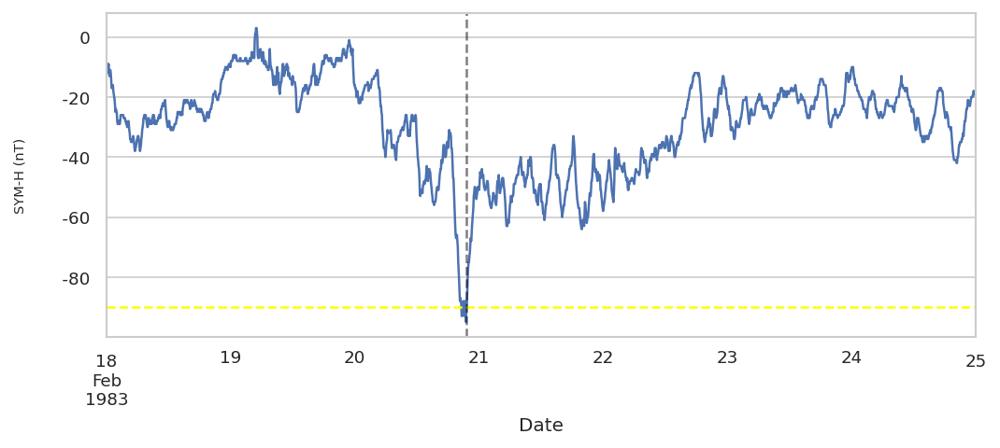

Plotting storm 26
Start date        1983-03-10 00:00:00
End date          1983-03-18 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -119
classification                    LOW
Name: 26, dtype: object
Minimum SYM-H value -119 at: 1983-03-12 23:50:00


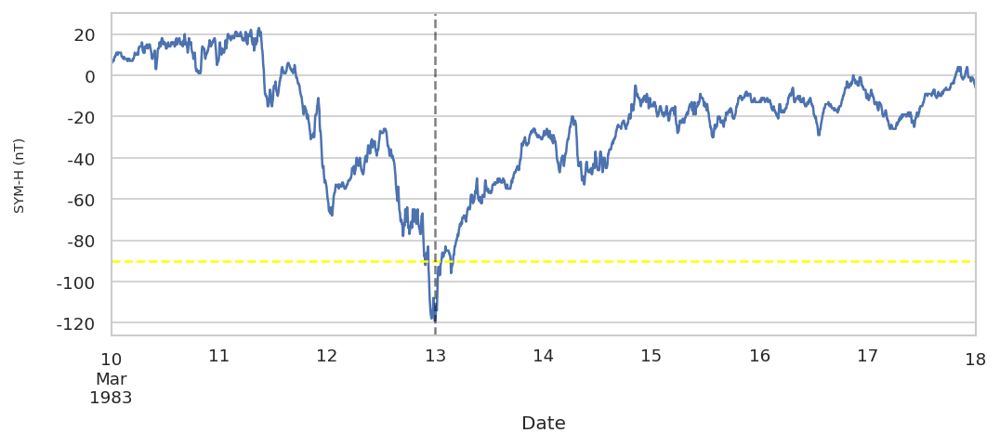

Plotting storm 27
Start date        1983-03-23 00:00:00
End date          1983-03-30 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -124
classification                    LOW
Name: 27, dtype: object
Minimum SYM-H value -124 at: 1983-03-25 07:45:00


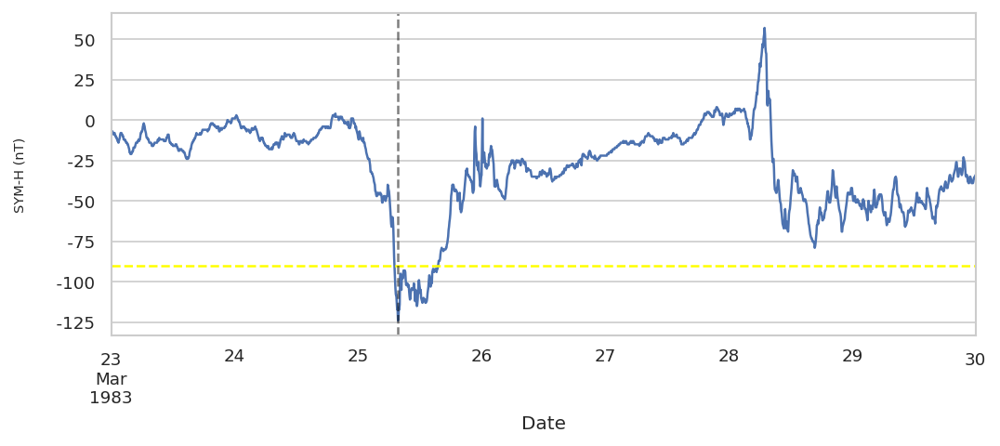

Plotting storm 31
Start date        1983-11-10 00:00:00
End date          1983-11-17 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -110
classification                    LOW
Name: 31, dtype: object
Minimum SYM-H value -110 at: 1983-11-12 08:45:00


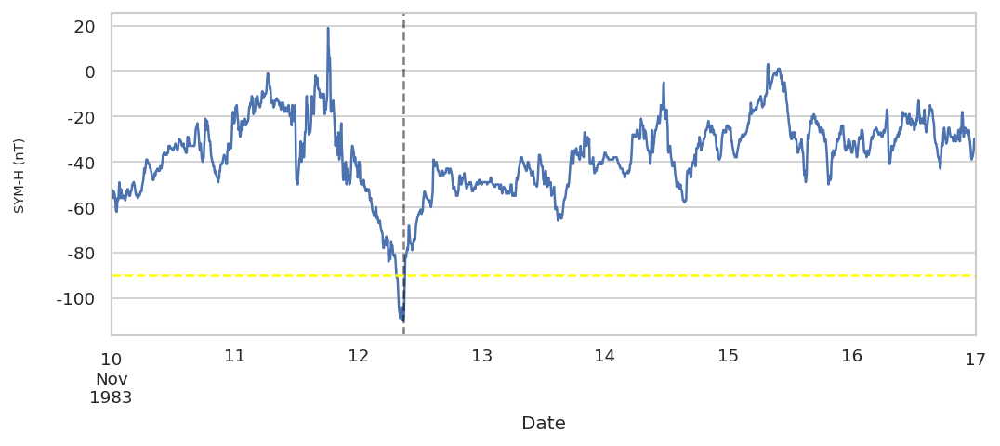

Plotting storm 32
Start date        1984-01-02 00:00:00
End date          1984-01-09 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -94
classification                    LOW
Name: 32, dtype: object
Minimum SYM-H value -94 at: 1984-01-04 08:10:00


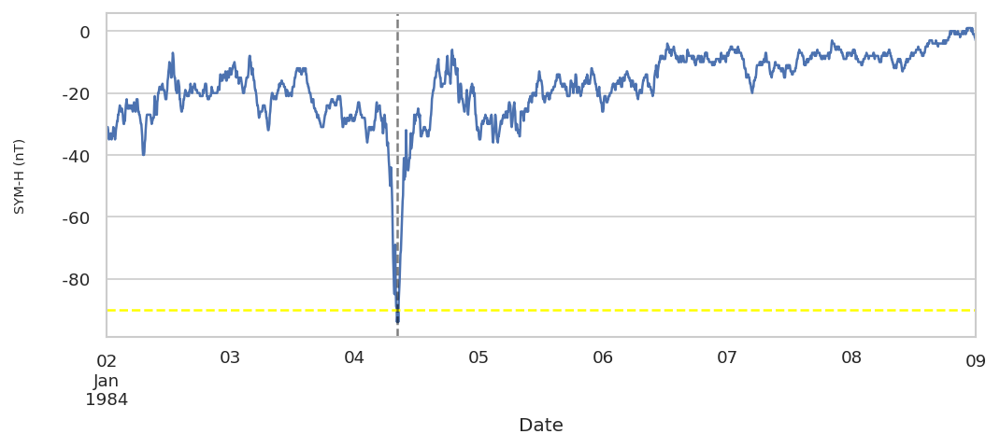

Plotting storm 33
Start date        1984-02-02 00:00:00
End date          1984-02-09 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -94
classification                    LOW
Name: 33, dtype: object
Minimum SYM-H value -94 at: 1984-02-04 21:40:00


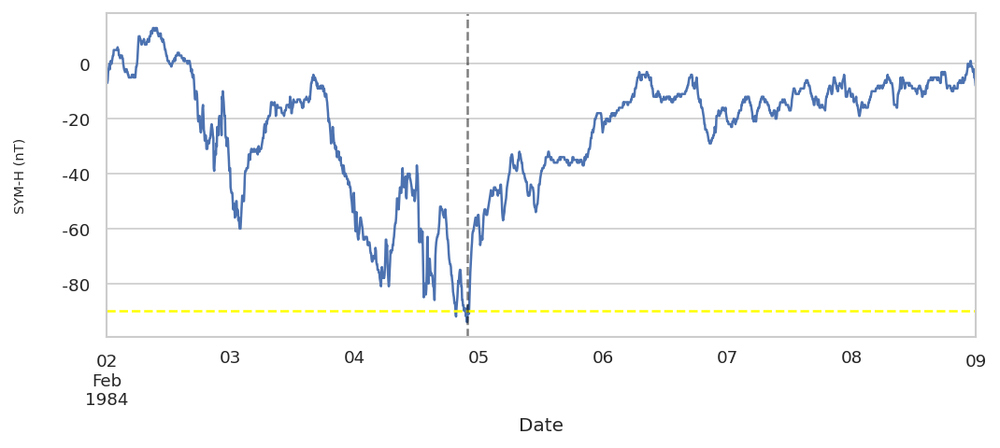

Plotting storm 34
Start date        1984-03-26 00:00:00
End date          1984-04-14 00:00:00
TD                   19 days 00:00:00
Min SYM-H                        -119
classification                    LOW
Name: 34, dtype: object
Minimum SYM-H value -119 at: 1984-03-28 21:25:00


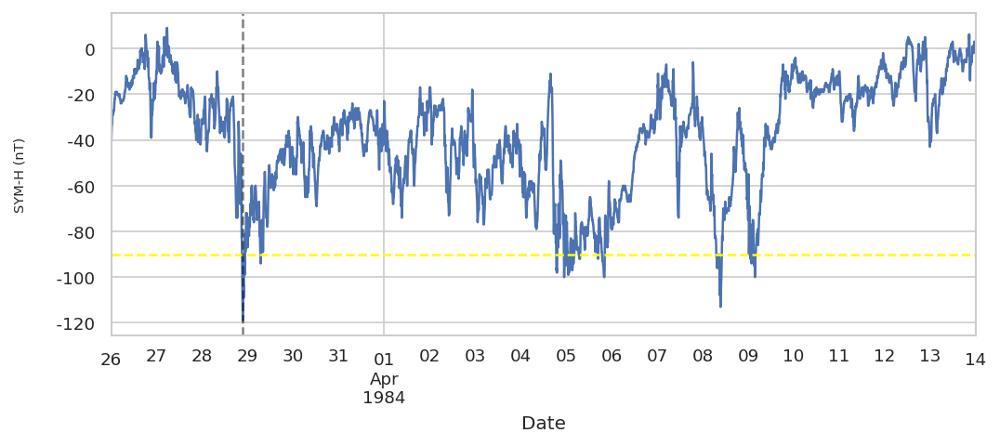

Plotting storm 35
Start date        1984-04-24 00:00:00
End date          1984-05-02 00:00:00
TD                    8 days 00:00:00
Min SYM-H                         -98
classification                    LOW
Name: 35, dtype: object
Minimum SYM-H value -98 at: 1984-04-26 04:40:00


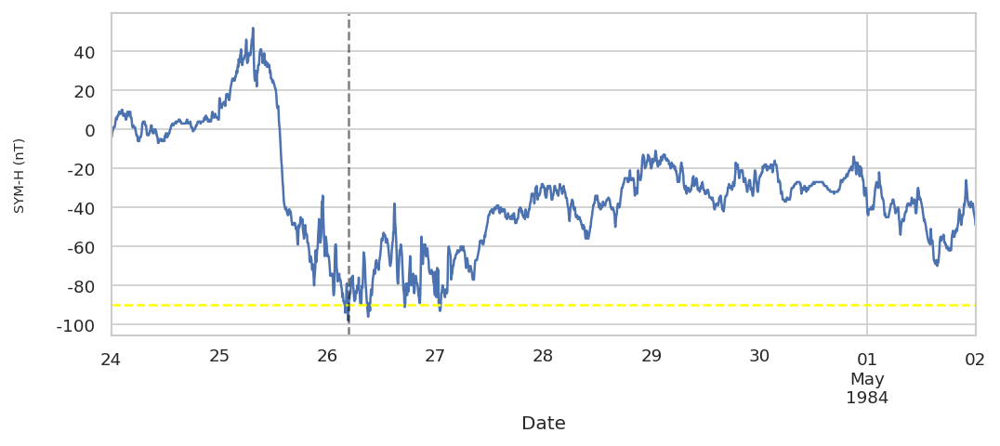

Plotting storm 36
Start date        1984-05-19 00:00:00
End date          1984-05-26 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -92
classification                    LOW
Name: 36, dtype: object
Minimum SYM-H value -92 at: 1984-05-21 08:45:00


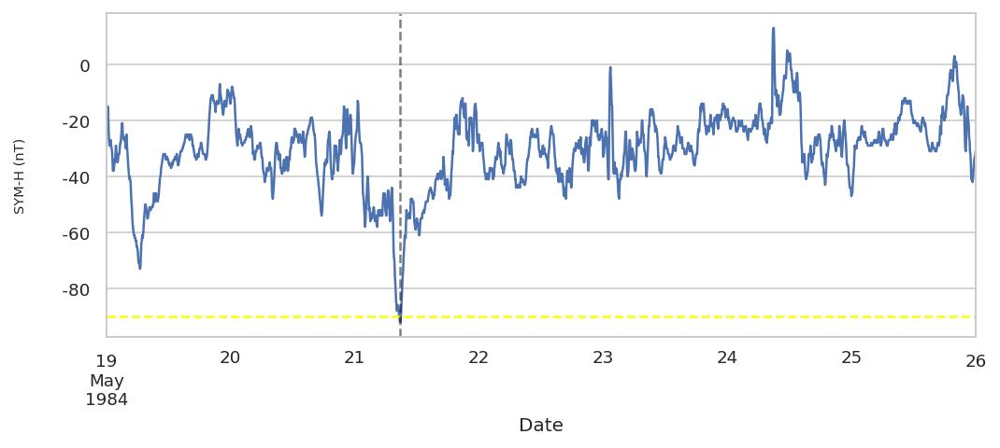

Plotting storm 37
Start date        1984-07-11 00:00:00
End date          1984-07-18 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -95
classification                    LOW
Name: 37, dtype: object
Minimum SYM-H value -95 at: 1984-07-13 13:35:00


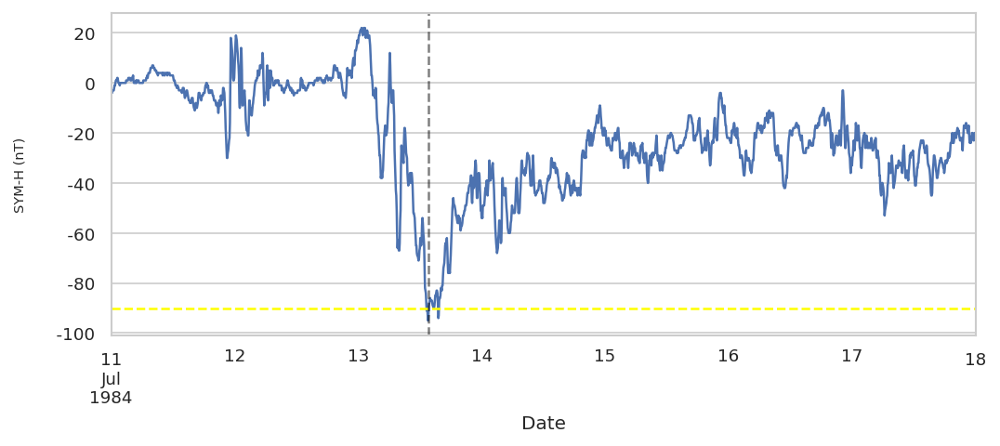

Plotting storm 40
Start date        1984-09-21 00:00:00
End date          1984-09-28 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -110
classification                    LOW
Name: 40, dtype: object
Minimum SYM-H value -110 at: 1984-09-23 14:50:00


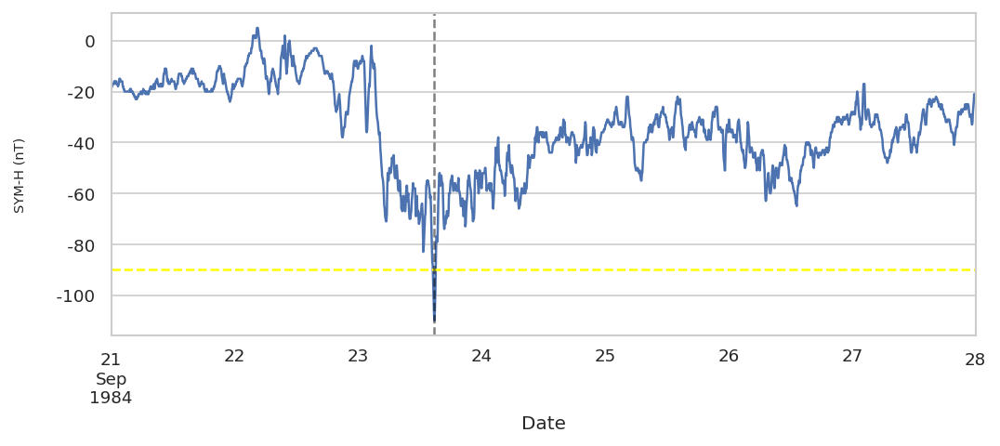

Plotting storm 44
Start date        1985-02-26 00:00:00
End date          1985-03-05 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -104
classification                    LOW
Name: 44, dtype: object
Minimum SYM-H value -104 at: 1985-02-28 06:30:00


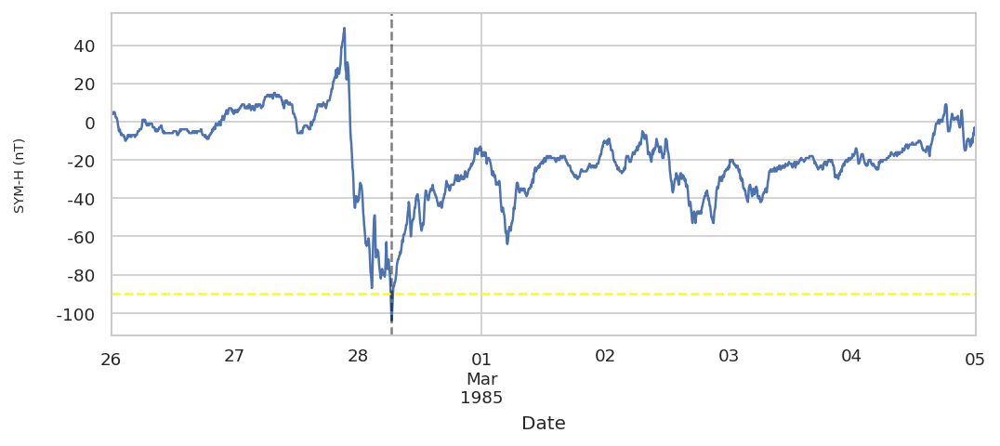

Plotting storm 48
Start date        1986-05-01 00:00:00
End date          1986-05-11 00:00:00
TD                   10 days 00:00:00
Min SYM-H                        -106
classification                    LOW
Name: 48, dtype: object
Minimum SYM-H value -106 at: 1986-05-06 17:35:00


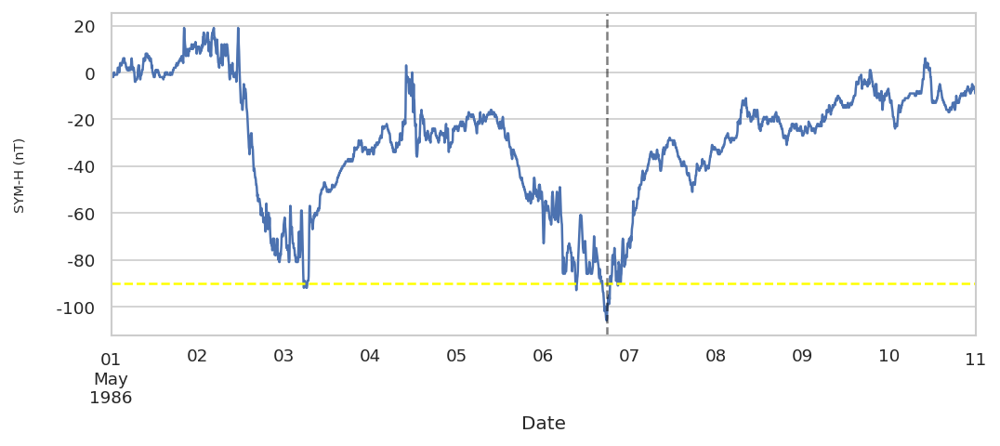

Plotting storm 50
Start date        1986-10-11 00:00:00
End date          1986-10-19 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -116
classification                    LOW
Name: 50, dtype: object
Minimum SYM-H value -116 at: 1986-10-13 20:45:00


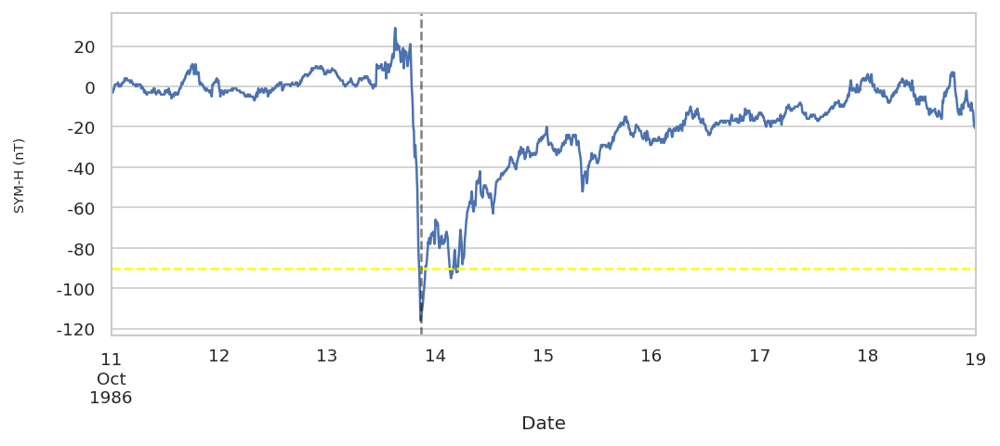

Plotting storm 51
Start date        1986-11-02 00:00:00
End date          1986-11-10 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -118
classification                    LOW
Name: 51, dtype: object
Minimum SYM-H value -118 at: 1986-11-04 18:35:00


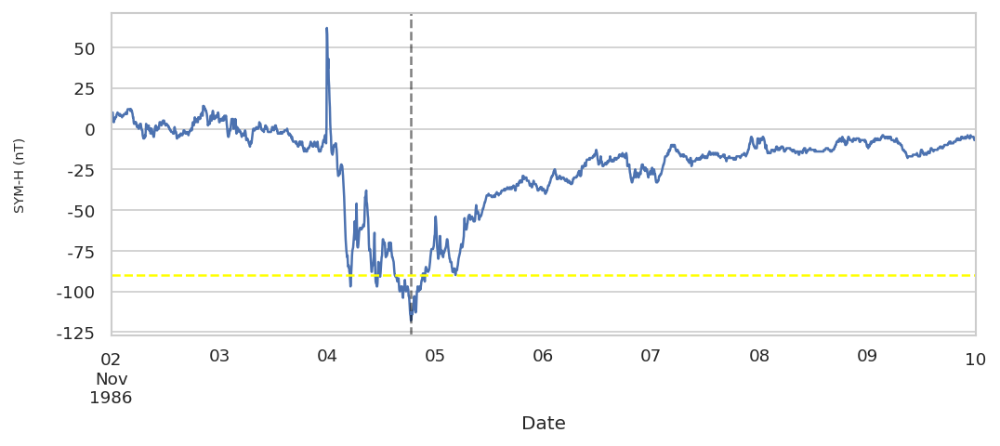

Plotting storm 52
Start date        1986-11-23 00:00:00
End date          1986-11-30 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -112
classification                    LOW
Name: 52, dtype: object
Minimum SYM-H value -112 at: 1986-11-25 18:20:00


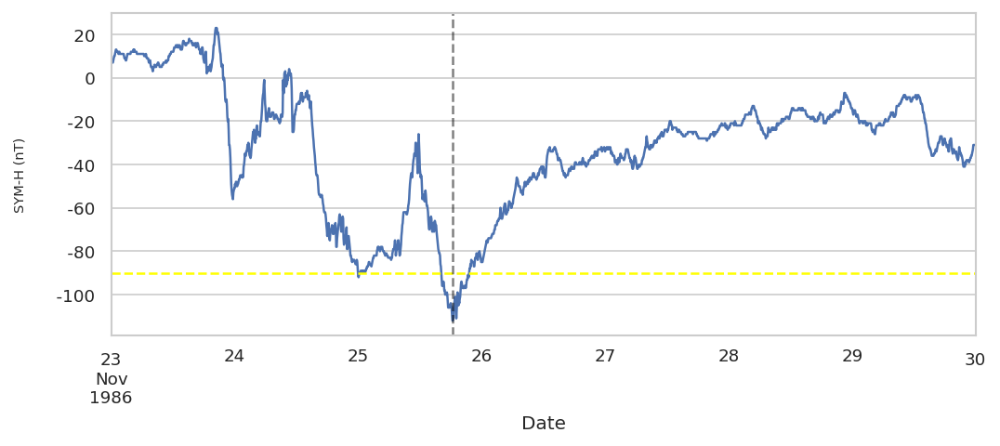

Plotting storm 53
Start date        1987-07-27 00:00:00
End date          1987-08-03 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -115
classification                    LOW
Name: 53, dtype: object
Minimum SYM-H value -115 at: 1987-07-29 09:00:00


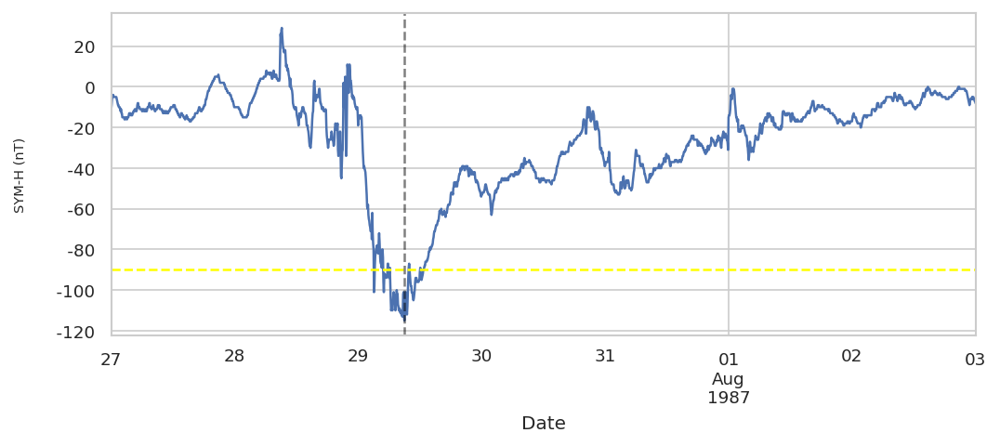

Plotting storm 54
Start date        1987-08-23 00:00:00
End date          1987-08-30 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -96
classification                    LOW
Name: 54, dtype: object
Minimum SYM-H value -96 at: 1987-08-25 18:10:00


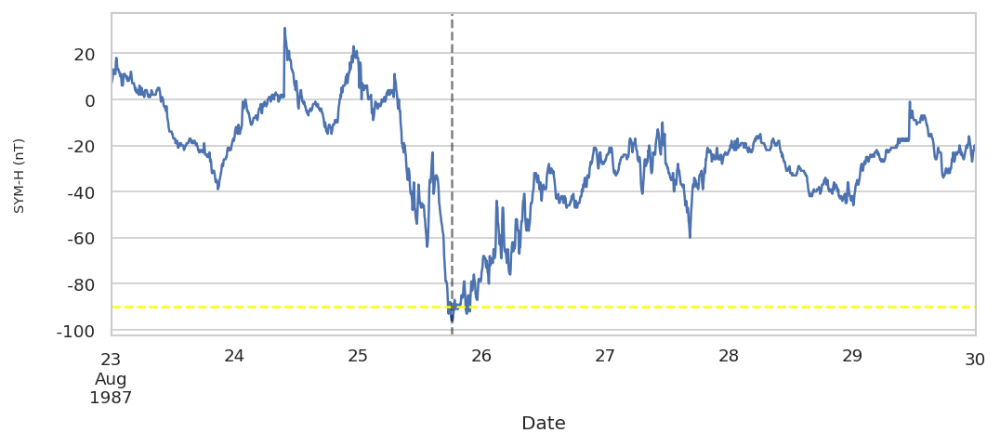

Plotting storm 55
Start date        1987-12-31 00:00:00
End date          1988-01-07 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -97
classification                    LOW
Name: 55, dtype: object
Minimum SYM-H value -97 at: 1988-01-02 20:30:00


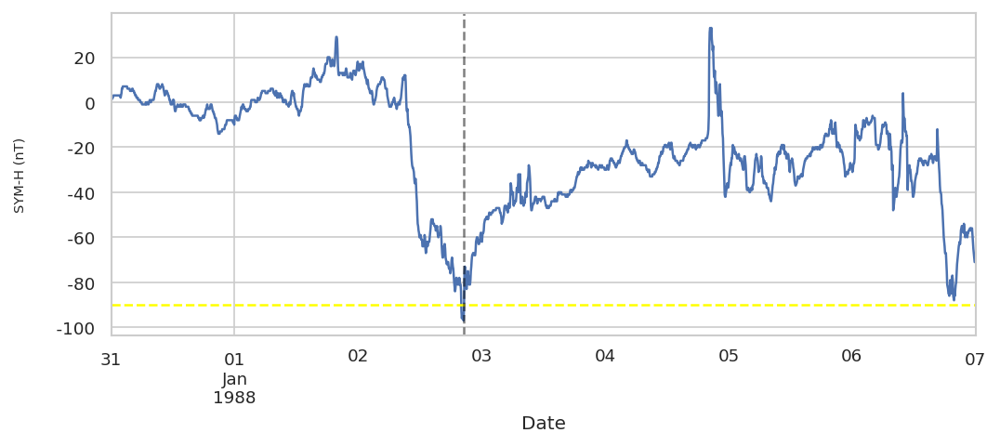

Plotting storm 59
Start date        1988-04-20 00:00:00
End date          1988-04-27 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -115
classification                    LOW
Name: 59, dtype: object
Minimum SYM-H value -115 at: 1988-04-22 10:30:00


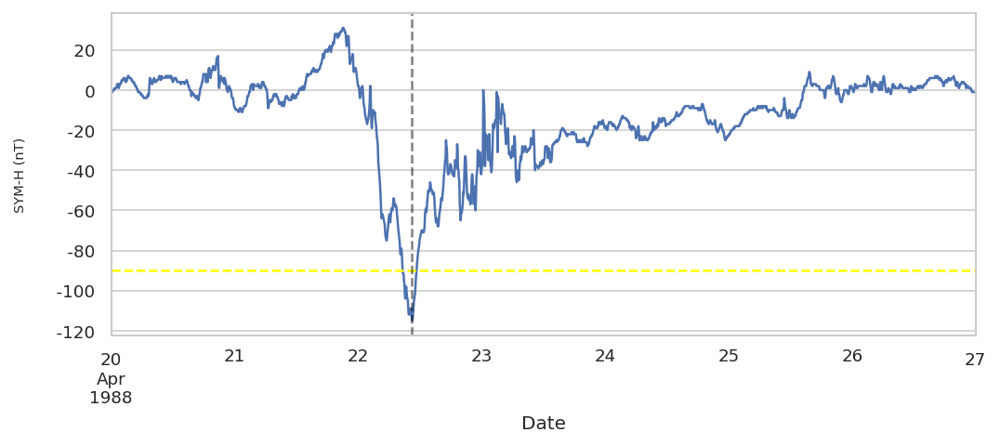

Plotting storm 61
Start date        1988-09-09 00:00:00
End date          1988-09-16 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -106
classification                    LOW
Name: 61, dtype: object
Minimum SYM-H value -106 at: 1988-09-11 13:05:00


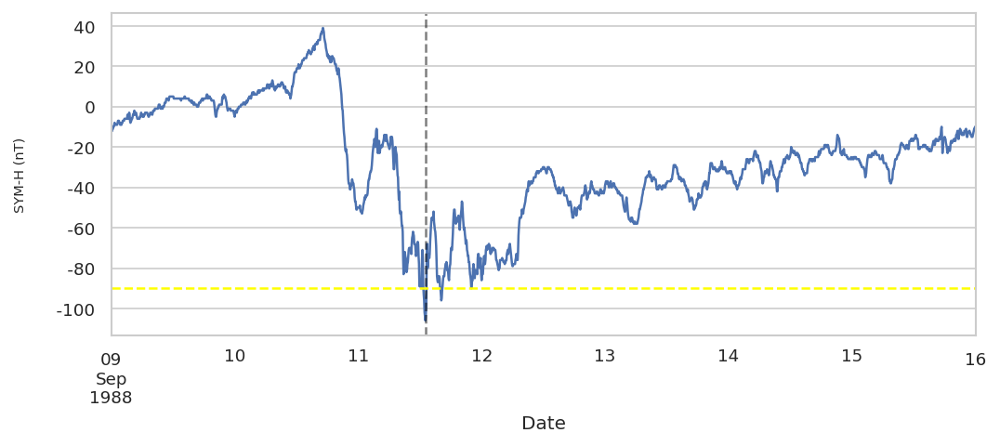

Plotting storm 63
Start date        1988-11-28 00:00:00
End date          1988-12-05 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -108
classification                    LOW
Name: 63, dtype: object
Minimum SYM-H value -108 at: 1988-11-30 15:25:00


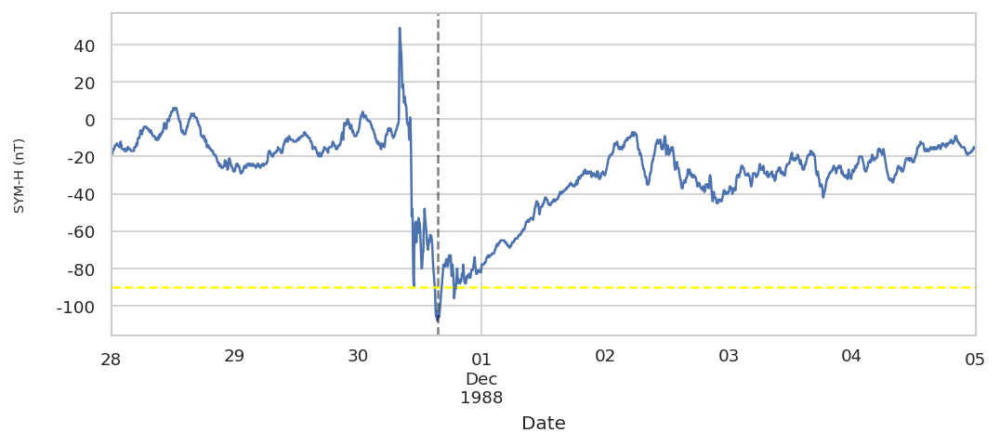

Plotting storm 64
Start date        1988-12-23 00:00:00
End date          1988-12-30 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -94
classification                    LOW
Name: 64, dtype: object
Minimum SYM-H value -94 at: 1988-12-25 17:30:00


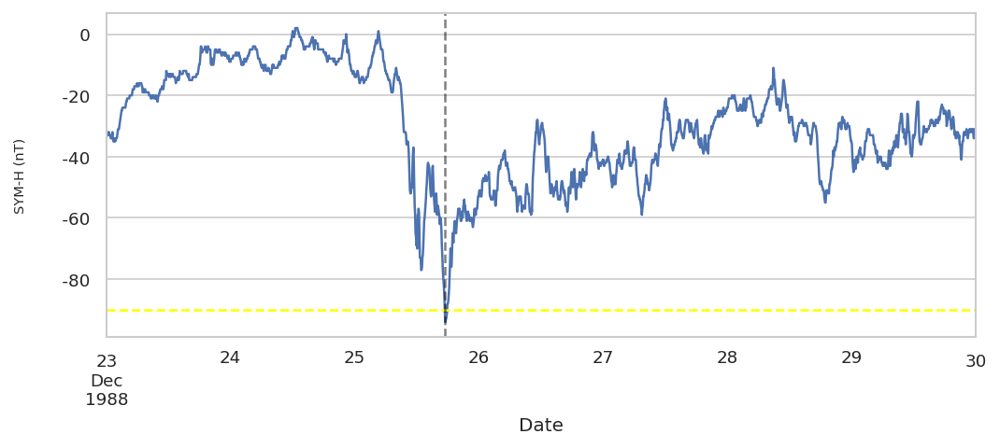

Plotting storm 67
Start date        1989-03-27 00:00:00
End date          1989-04-10 00:00:00
TD                   14 days 00:00:00
Min SYM-H                        -117
classification                    LOW
Name: 67, dtype: object
Minimum SYM-H value -117 at: 1989-04-05 08:35:00


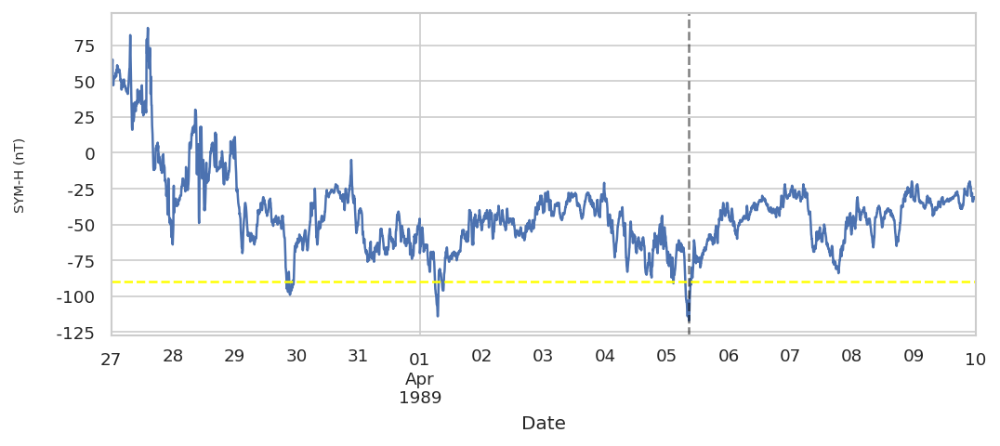

Plotting storm 68
Start date        1989-04-12 00:00:00
End date          1989-04-20 00:00:00
TD                    8 days 00:00:00
Min SYM-H                         -98
classification                    LOW
Name: 68, dtype: object
Minimum SYM-H value -98 at: 1989-04-15 05:30:00


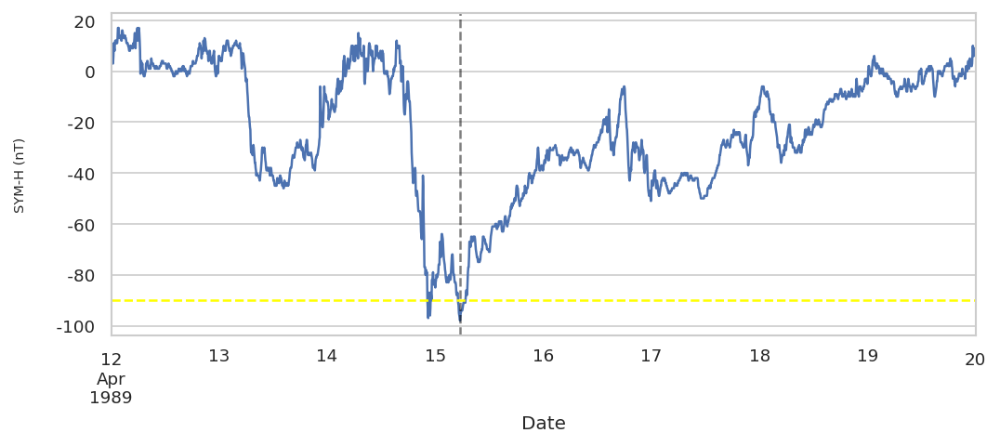

Plotting storm 70
Start date        1989-05-03 00:00:00
End date          1989-05-10 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -94
classification                    LOW
Name: 70, dtype: object
Minimum SYM-H value -94 at: 1989-05-05 05:30:00


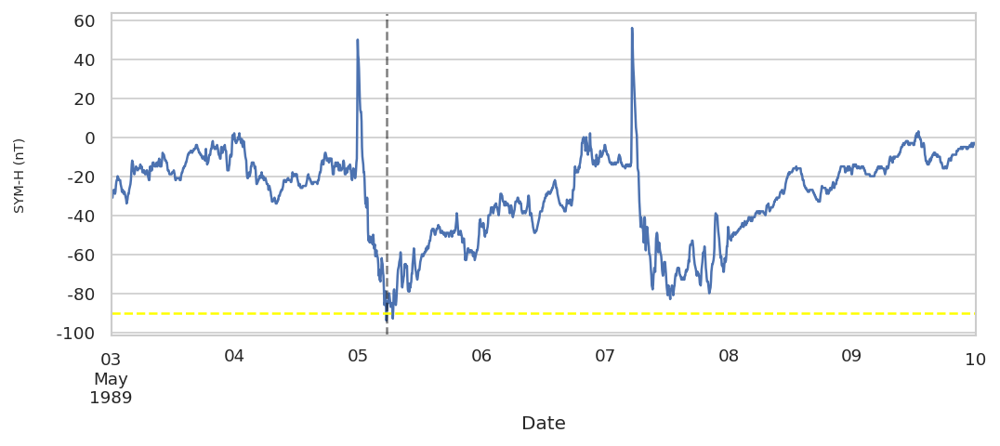

Plotting storm 71
Start date        1989-05-22 00:00:00
End date          1989-05-29 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -96
classification                    LOW
Name: 71, dtype: object
Minimum SYM-H value -96 at: 1989-05-24 06:50:00


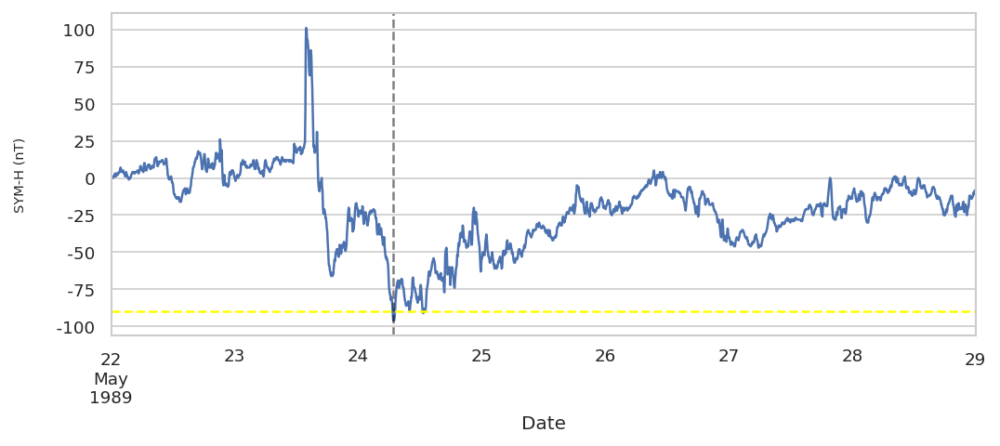

Plotting storm 77
Start date        1989-12-02 00:00:00
End date          1989-12-09 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -95
classification                    LOW
Name: 77, dtype: object
Minimum SYM-H value -95 at: 1989-12-04 04:10:00


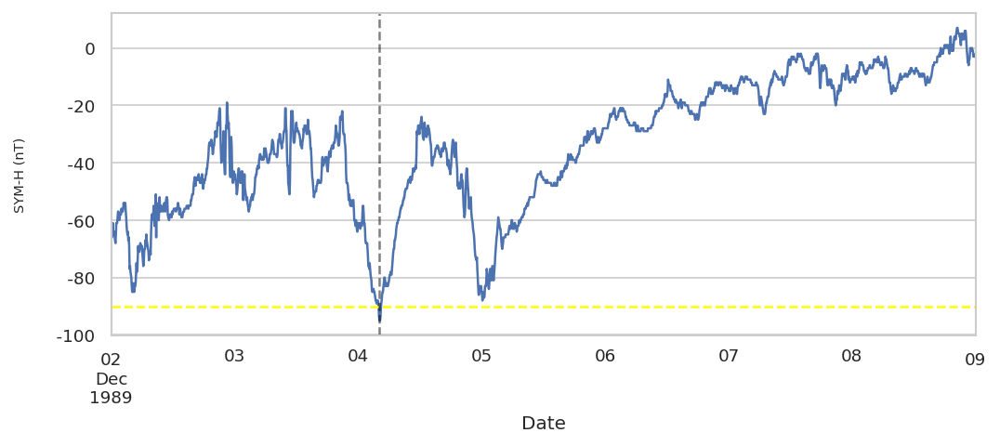

Plotting storm 78
Start date        1989-12-27 00:00:00
End date          1990-01-05 00:00:00
TD                    9 days 00:00:00
Min SYM-H                        -121
classification                    LOW
Name: 78, dtype: object
Minimum SYM-H value -121 at: 1989-12-31 05:40:00


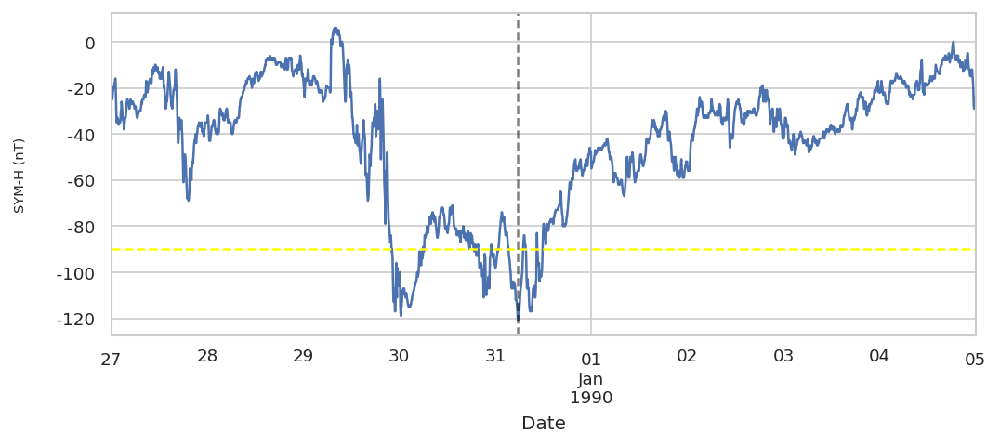

Plotting storm 79
Start date        1990-02-14 00:00:00
End date          1990-02-21 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -105
classification                    LOW
Name: 79, dtype: object
Minimum SYM-H value -105 at: 1990-02-16 02:10:00


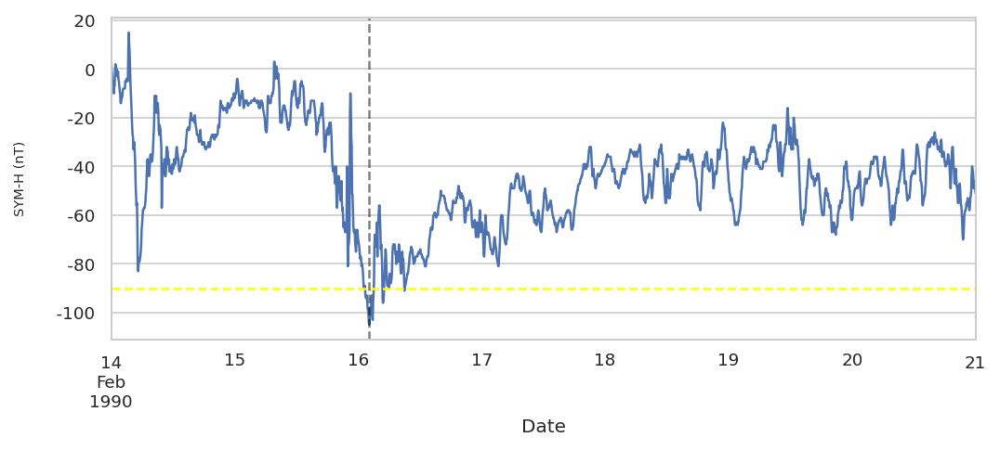

Plotting storm 83
Start date        1990-05-20 00:00:00
End date          1990-06-01 00:00:00
TD                   12 days 00:00:00
Min SYM-H                        -120
classification                    LOW
Name: 83, dtype: object
Minimum SYM-H value -120 at: 1990-05-27 08:30:00


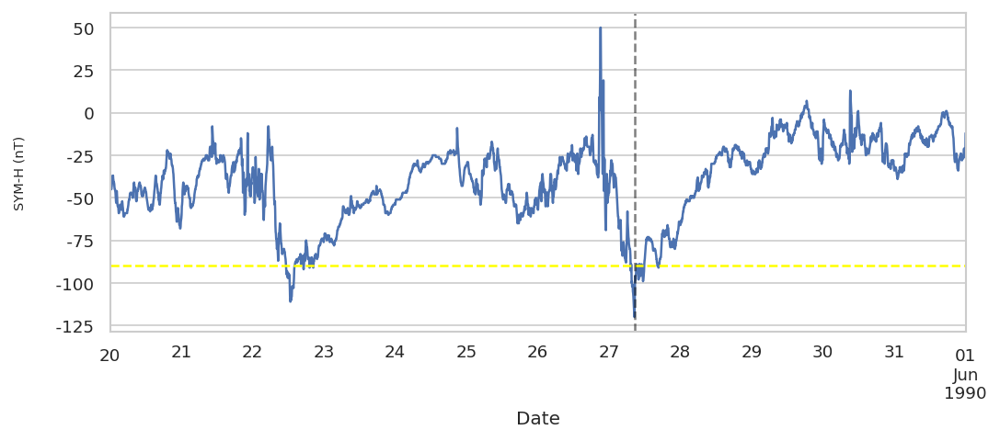

Plotting storm 86
Start date        1990-08-20 00:00:00
End date          1990-08-31 00:00:00
TD                   11 days 00:00:00
Min SYM-H                        -117
classification                    LOW
Name: 86, dtype: object
Minimum SYM-H value -117 at: 1990-08-26 17:25:00


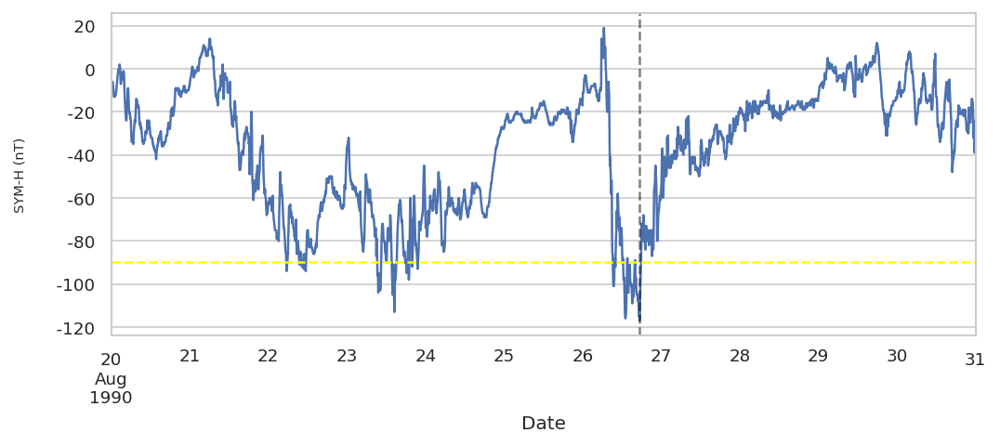

Plotting storm 90
Start date        1991-04-27 00:00:00
End date          1991-05-04 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -106
classification                    LOW
Name: 90, dtype: object
Minimum SYM-H value -106 at: 1991-04-29 14:15:00


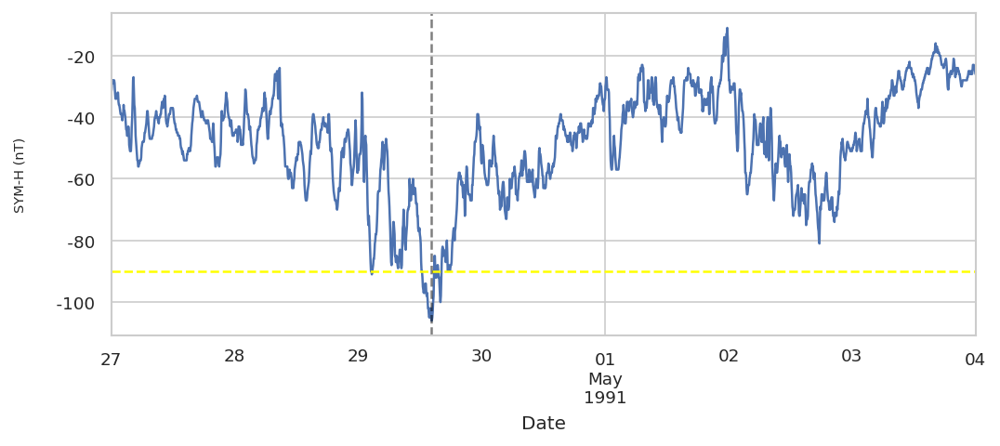

Plotting storm 91
Start date        1991-05-15 00:00:00
End date          1991-05-22 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -111
classification                    LOW
Name: 91, dtype: object
Minimum SYM-H value -111 at: 1991-05-17 09:35:00


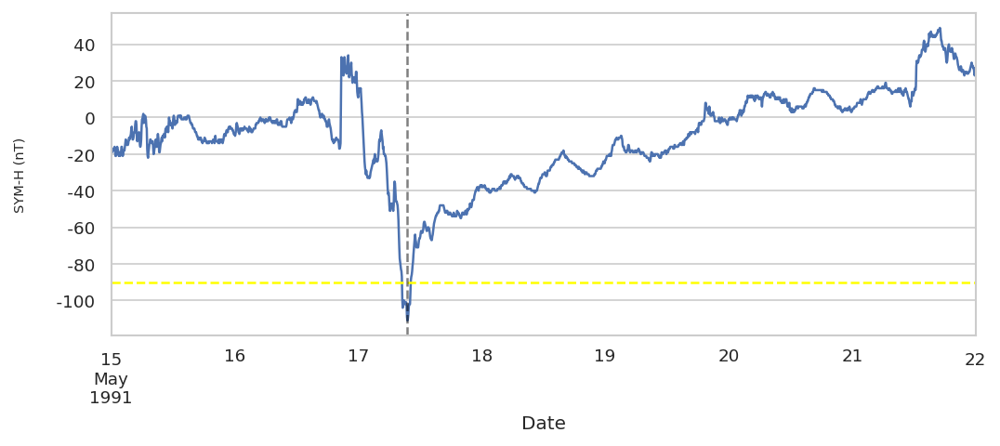

Plotting storm 94
Start date        1991-07-31 00:00:00
End date          1991-08-07 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -94
classification                    LOW
Name: 94, dtype: object
Minimum SYM-H value -94 at: 1991-08-02 13:30:00


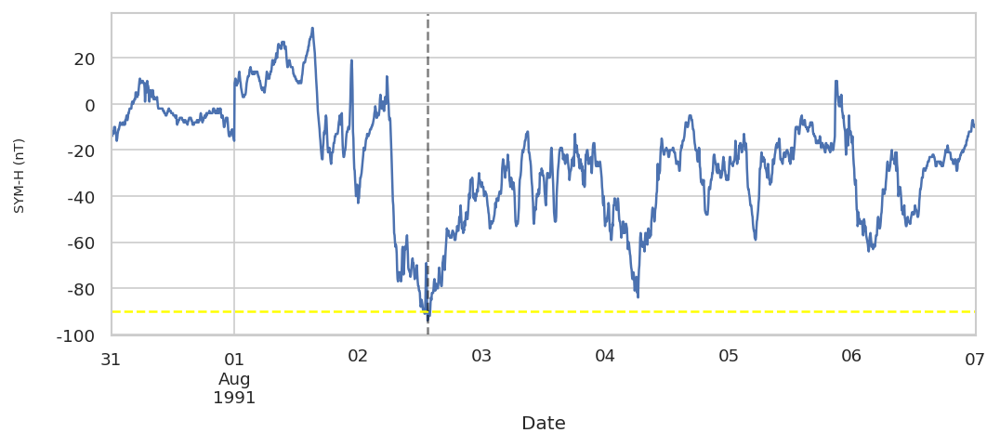

Plotting storm 96
Start date        1991-08-28 00:00:00
End date          1991-09-04 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -101
classification                    LOW
Name: 96, dtype: object
Minimum SYM-H value -101 at: 1991-08-30 19:55:00


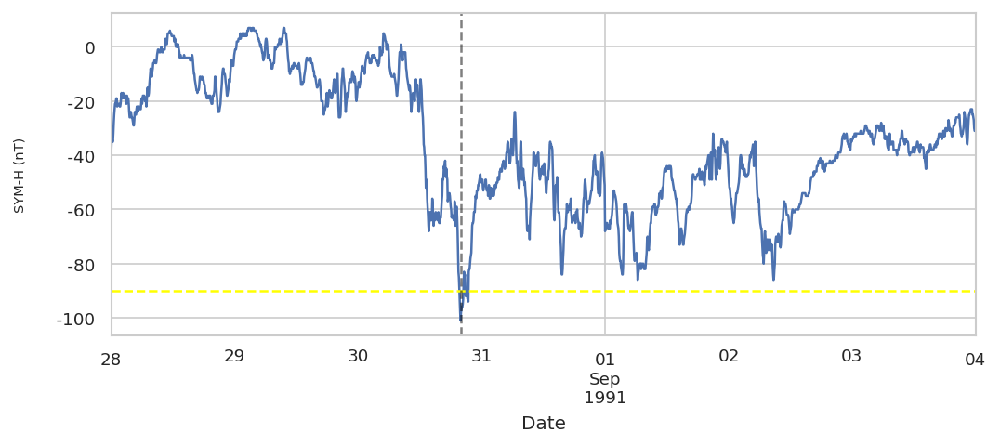

Plotting storm 97
Start date        1991-09-08 00:00:00
End date          1991-09-15 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -105
classification                    LOW
Name: 97, dtype: object
Minimum SYM-H value -105 at: 1991-09-10 04:25:00


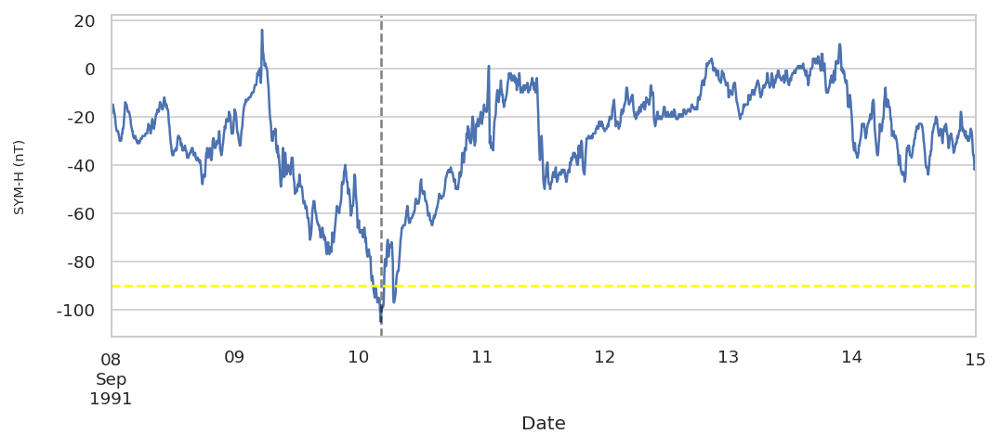

Plotting storm 101
Start date        1992-01-09 00:00:00
End date          1992-01-16 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -97
classification                    LOW
Name: 101, dtype: object
Minimum SYM-H value -97 at: 1992-01-11 20:45:00


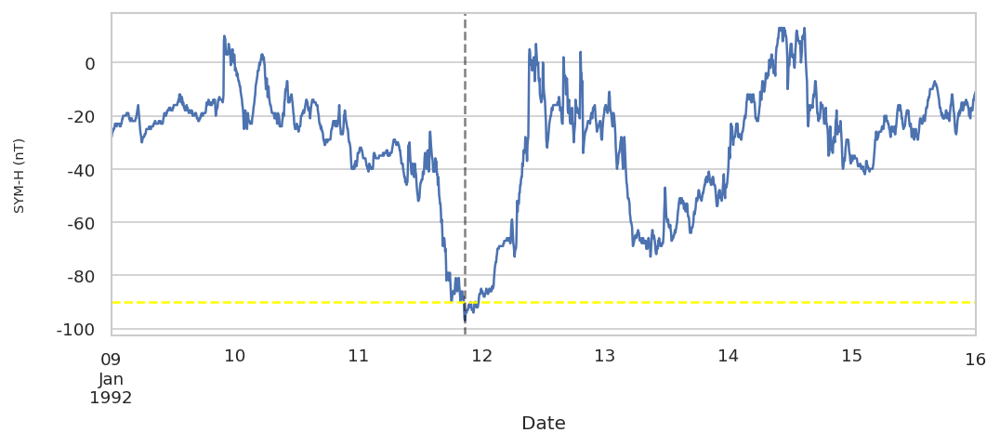

Plotting storm 104
Start date        1992-04-01 00:00:00
End date          1992-04-08 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -114
classification                    LOW
Name: 104, dtype: object
Minimum SYM-H value -114 at: 1992-04-03 16:00:00


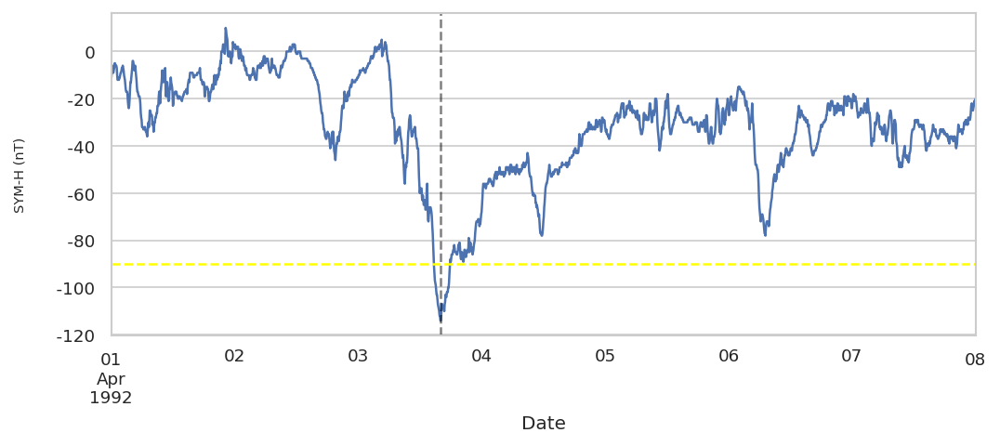

Plotting storm 106
Start date        1992-05-20 00:00:00
End date          1992-05-27 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -106
classification                    LOW
Name: 106, dtype: object
Minimum SYM-H value -106 at: 1992-05-22 17:00:00


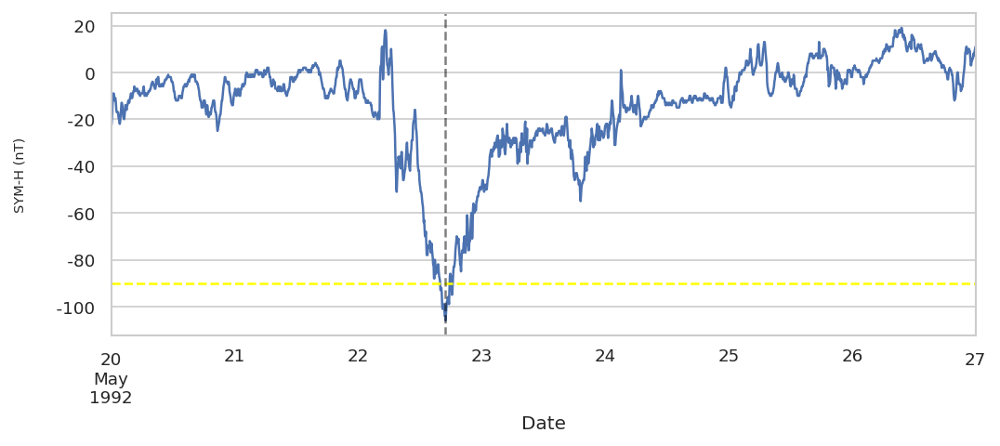

Plotting storm 107
Start date        1992-06-06 00:00:00
End date          1992-06-13 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -106
classification                    LOW
Name: 107, dtype: object
Minimum SYM-H value -106 at: 1992-06-08 16:05:00


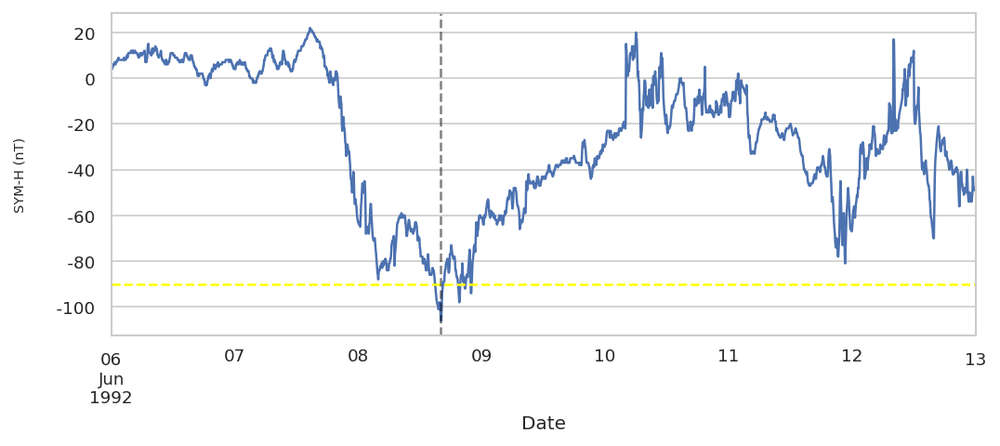

Plotting storm 108
Start date        1992-06-28 00:00:00
End date          1992-07-05 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -114
classification                    LOW
Name: 108, dtype: object
Minimum SYM-H value -114 at: 1992-06-30 04:00:00


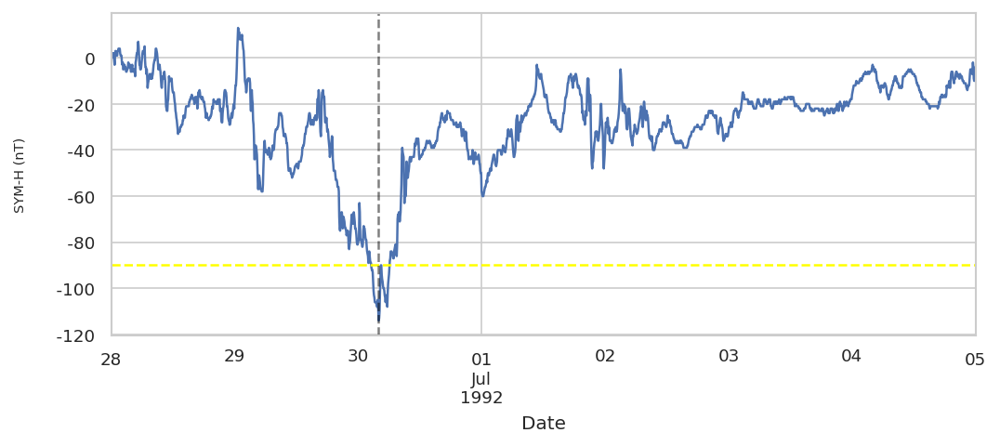

Plotting storm 109
Start date        1992-07-20 00:00:00
End date          1992-07-27 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -94
classification                    LOW
Name: 109, dtype: object
Minimum SYM-H value -94 at: 1992-07-22 19:05:00


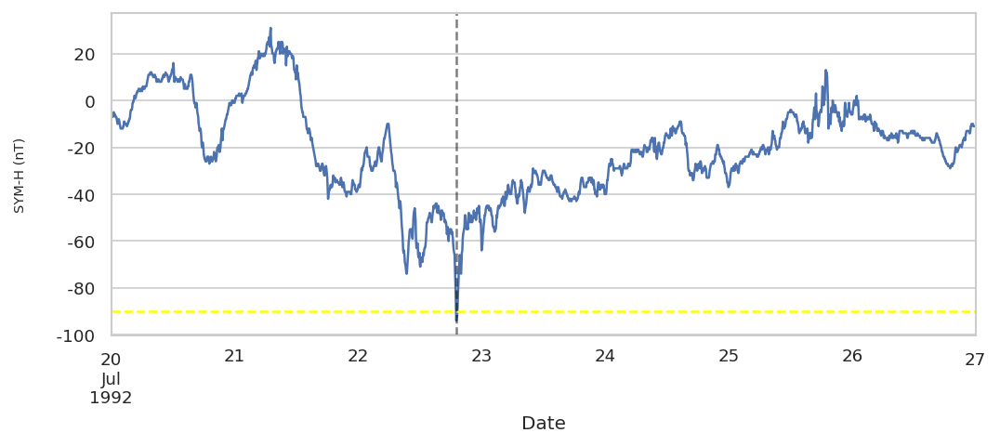

Plotting storm 110
Start date        1992-08-03 00:00:00
End date          1992-08-10 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -93
classification                    LOW
Name: 110, dtype: object
Minimum SYM-H value -93 at: 1992-08-05 05:15:00


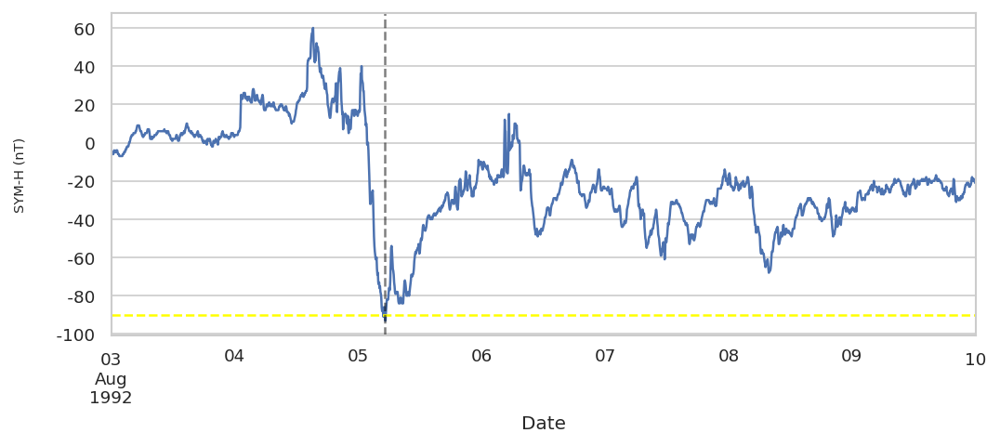

Plotting storm 114
Start date        1992-11-07 00:00:00
End date          1992-11-14 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -95
classification                    LOW
Name: 114, dtype: object
Minimum SYM-H value -95 at: 1992-11-09 10:30:00


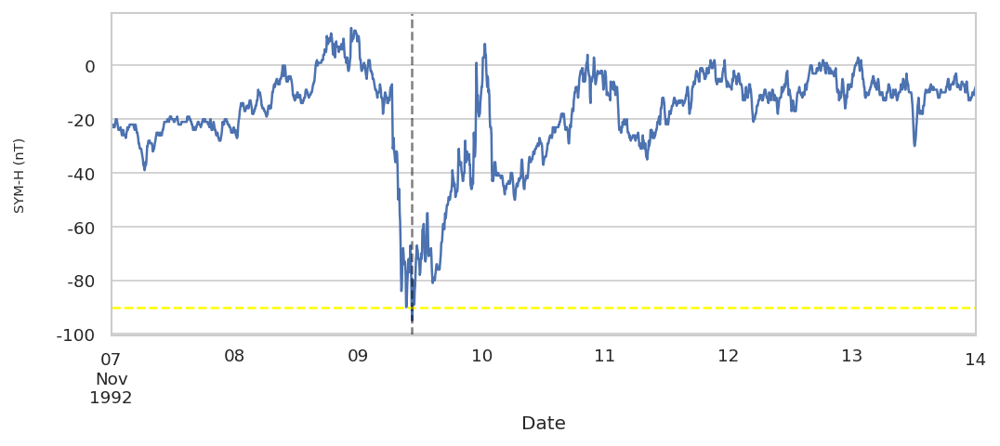

Plotting storm 115
Start date        1992-12-26 00:00:00
End date          1993-01-03 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -123
classification                    LOW
Name: 115, dtype: object
Minimum SYM-H value -123 at: 1992-12-29 04:45:00


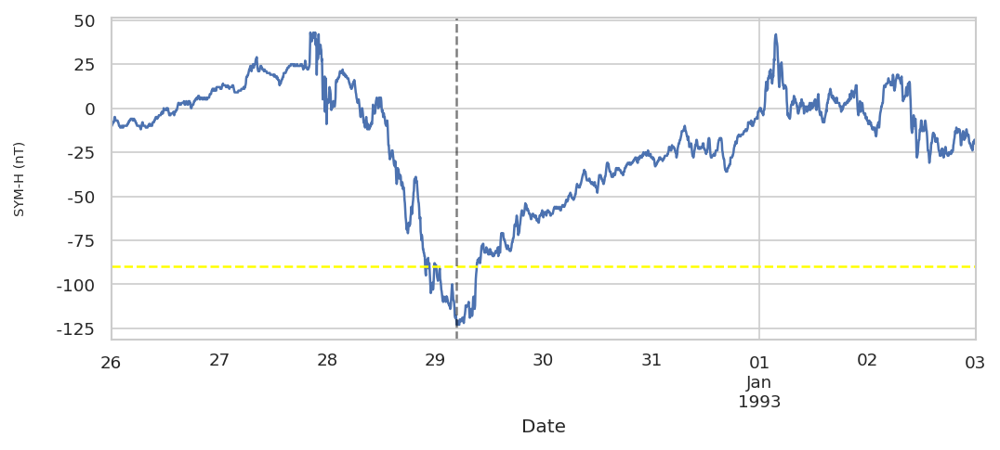

Plotting storm 116
Start date        1993-01-29 00:00:00
End date          1993-02-05 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -92
classification                    LOW
Name: 116, dtype: object
Minimum SYM-H value -92 at: 1993-01-31 21:55:00


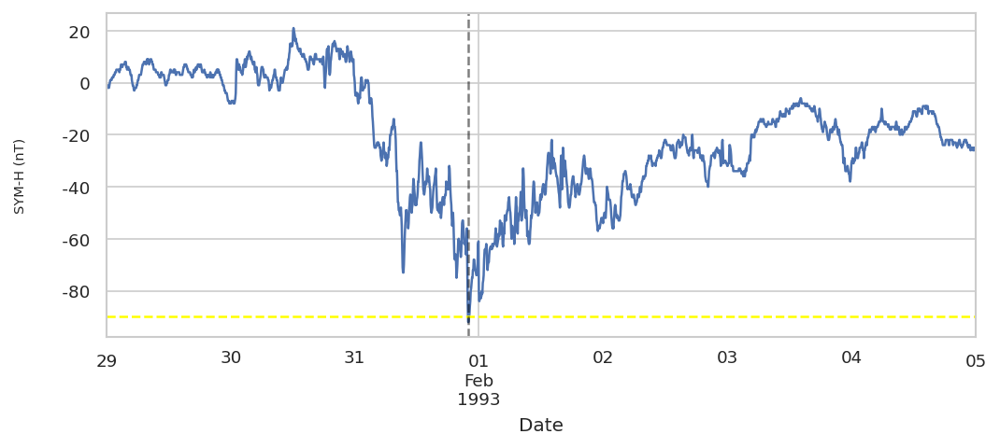

Plotting storm 117
Start date        1993-02-15 00:00:00
End date          1993-02-22 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -103
classification                    LOW
Name: 117, dtype: object
Minimum SYM-H value -103 at: 1993-02-17 15:30:00


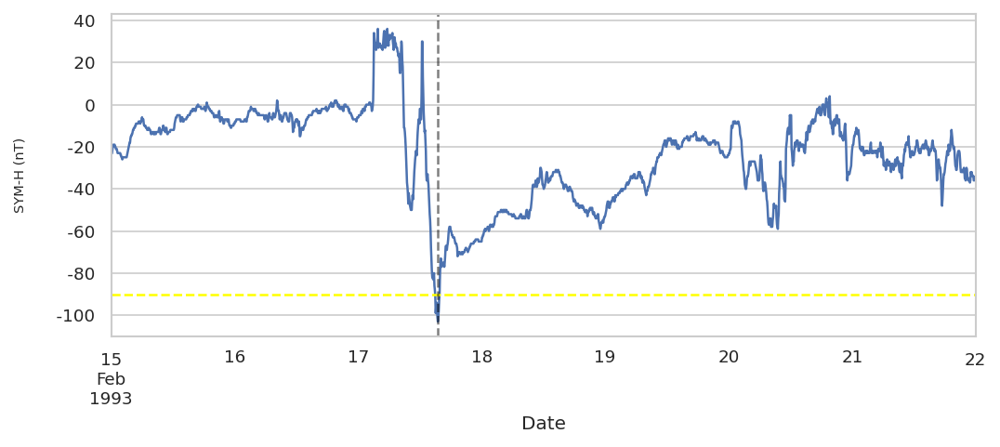

Plotting storm 119
Start date        1993-03-22 00:00:00
End date          1993-03-29 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -91
classification                    LOW
Name: 119, dtype: object
Minimum SYM-H value -91 at: 1993-03-24 07:20:00


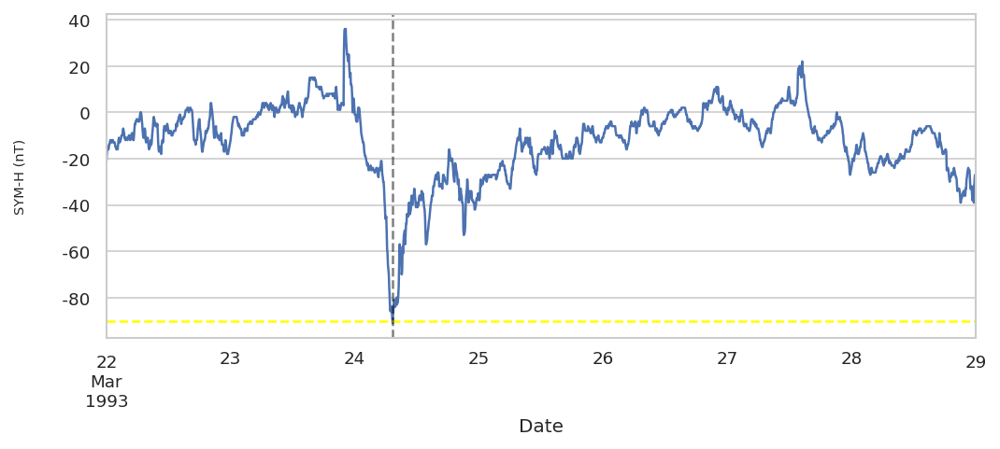

Plotting storm 121
Start date        1993-05-06 00:00:00
End date          1993-05-15 00:00:00
TD                    9 days 00:00:00
Min SYM-H                        -120
classification                    LOW
Name: 121, dtype: object
Minimum SYM-H value -120 at: 1993-05-10 06:35:00


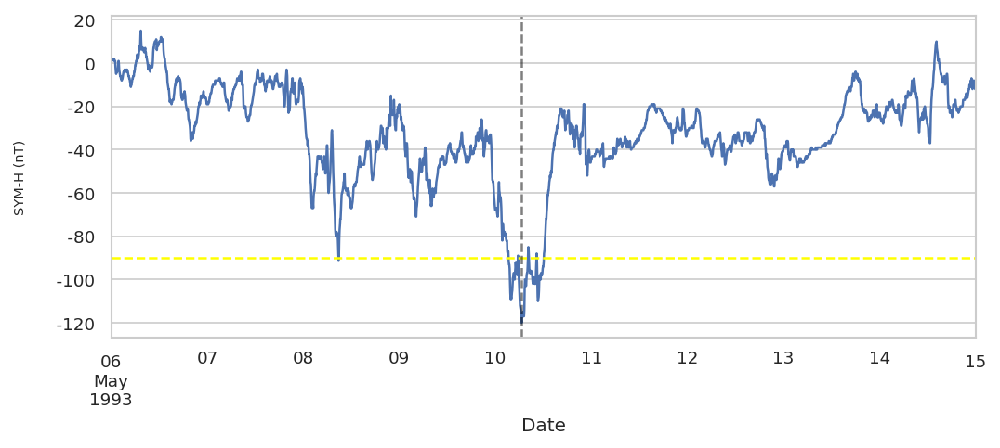

Plotting storm 122
Start date        1993-08-15 00:00:00
End date          1993-08-22 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -93
classification                    LOW
Name: 122, dtype: object
Minimum SYM-H value -93 at: 1993-08-17 02:00:00


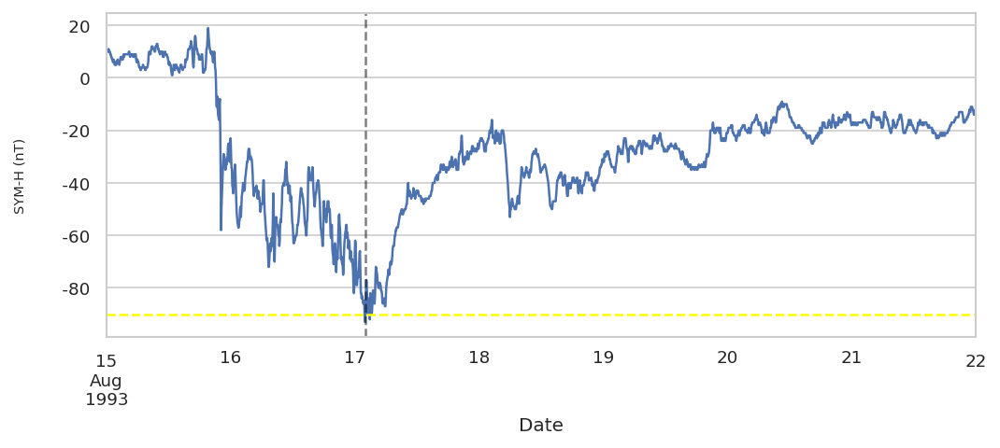

Plotting storm 124
Start date        1993-10-07 00:00:00
End date          1993-10-14 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -104
classification                    LOW
Name: 124, dtype: object
Minimum SYM-H value -104 at: 1993-10-09 07:20:00


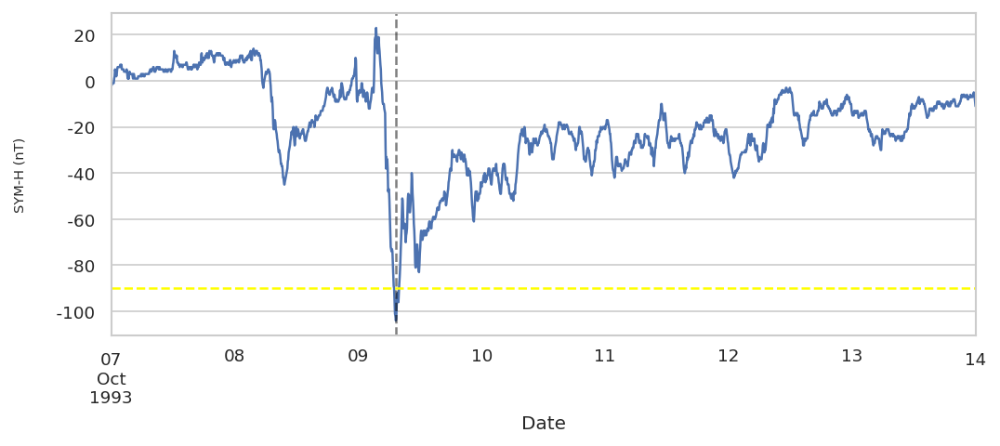

Plotting storm 125
Start date        1993-11-02 00:00:00
End date          1993-11-09 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -127
classification                    LOW
Name: 125, dtype: object
Minimum SYM-H value -127 at: 1993-11-04 06:25:00


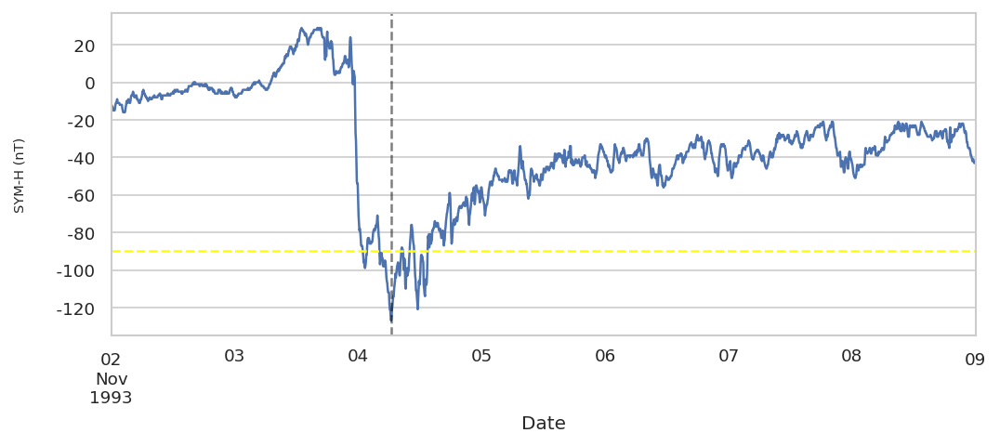

Plotting storm 126
Start date        1993-11-30 00:00:00
End date          1993-12-13 00:00:00
TD                   13 days 00:00:00
Min SYM-H                        -114
classification                    LOW
Name: 126, dtype: object
Minimum SYM-H value -114 at: 1993-12-03 00:45:00


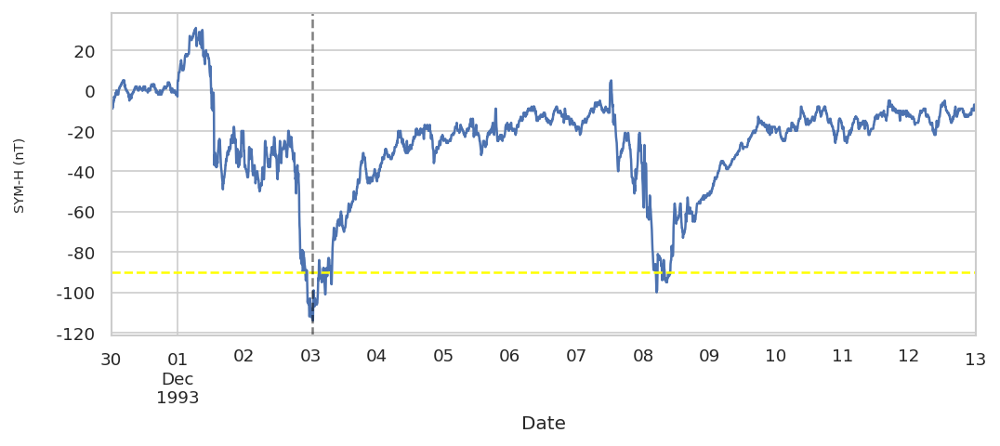

Plotting storm 127
Start date        1994-02-04 00:00:00
End date          1994-02-11 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -116
classification                    LOW
Name: 127, dtype: object
Minimum SYM-H value -116 at: 1994-02-06 19:30:00


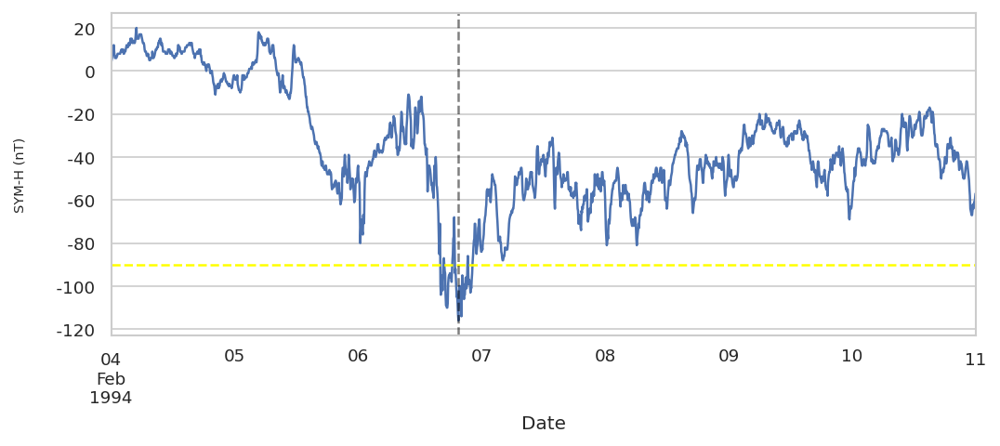

Plotting storm 129
Start date        1994-03-05 00:00:00
End date          1994-03-12 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -104
classification                    LOW
Name: 129, dtype: object
Minimum SYM-H value -104 at: 1994-03-07 22:05:00


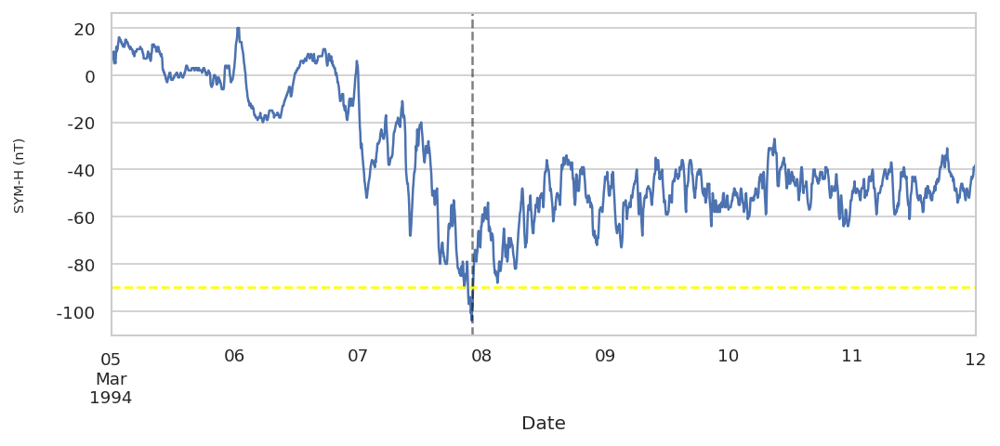

Plotting storm 130
Start date        1994-03-31 00:00:00
End date          1994-04-09 00:00:00
TD                    9 days 00:00:00
Min SYM-H                        -128
classification                    LOW
Name: 130, dtype: object
Minimum SYM-H value -128 at: 1994-04-04 01:55:00


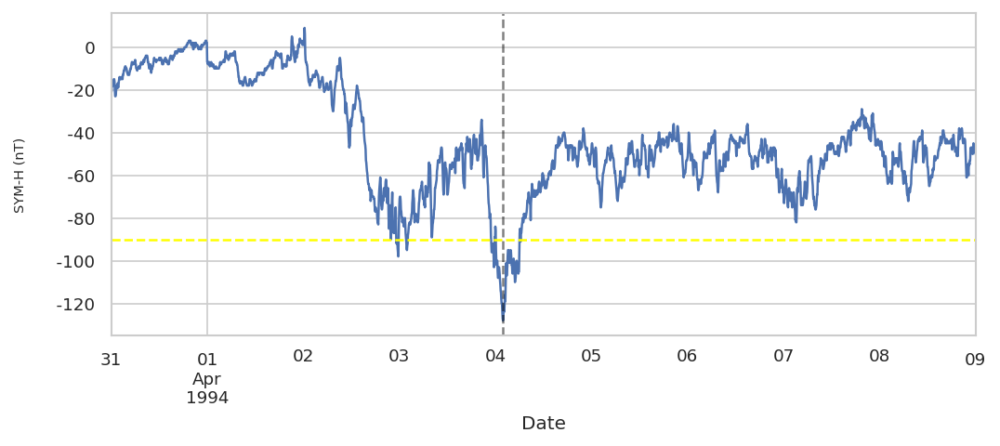

Plotting storm 132
Start date        1994-10-01 00:00:00
End date          1994-10-08 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -110
classification                    LOW
Name: 132, dtype: object
Minimum SYM-H value -110 at: 1994-10-03 08:20:00


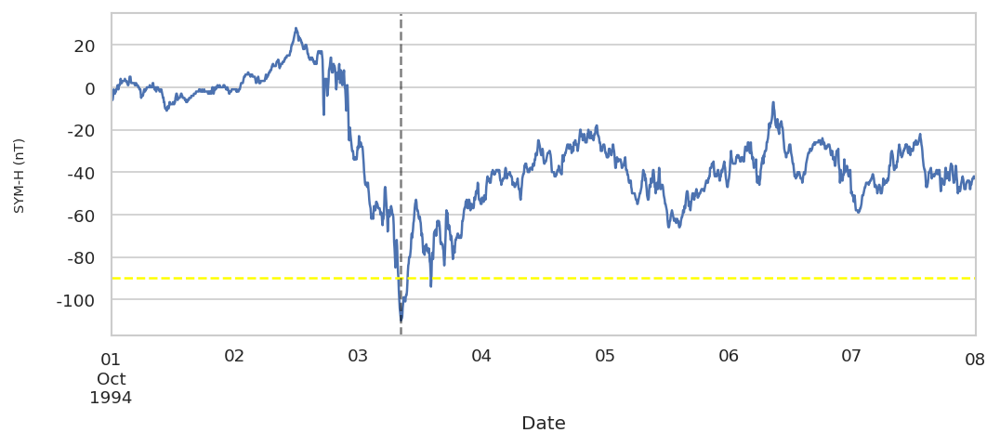

Plotting storm 133
Start date        1994-10-27 00:00:00
End date          1994-11-04 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -119
classification                    LOW
Name: 133, dtype: object
Minimum SYM-H value -119 at: 1994-10-29 14:50:00


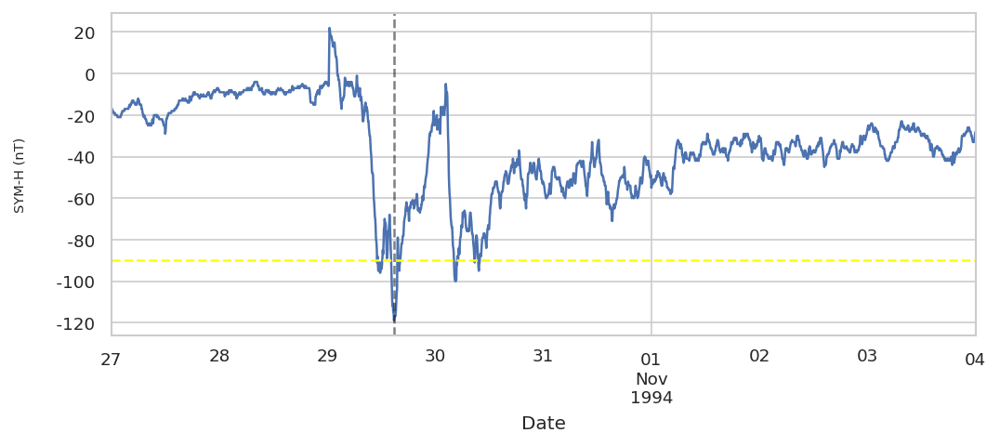

Plotting storm 134
Start date        1994-11-24 00:00:00
End date          1994-12-01 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -115
classification                    LOW
Name: 134, dtype: object
Minimum SYM-H value -115 at: 1994-11-26 12:30:00


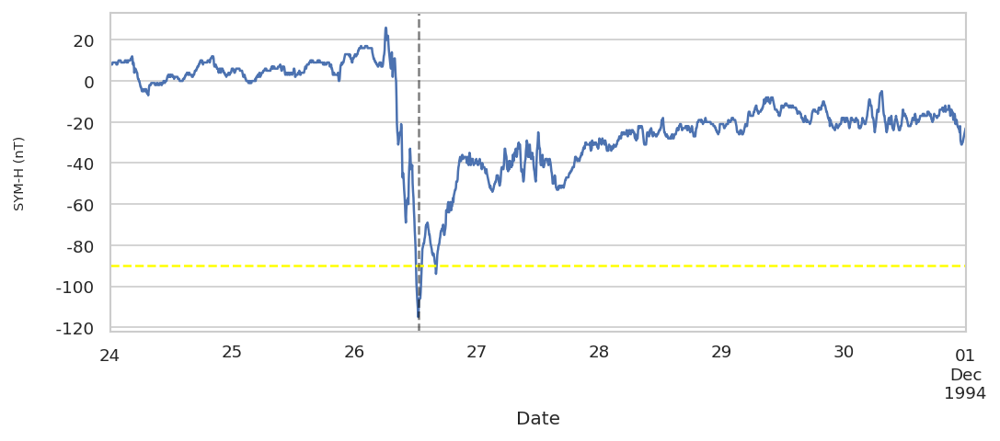

Plotting storm 135
Start date        1995-01-16 00:00:00
End date          1995-01-23 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -105
classification                    LOW
Name: 135, dtype: object
Minimum SYM-H value -105 at: 1995-01-18 06:30:00


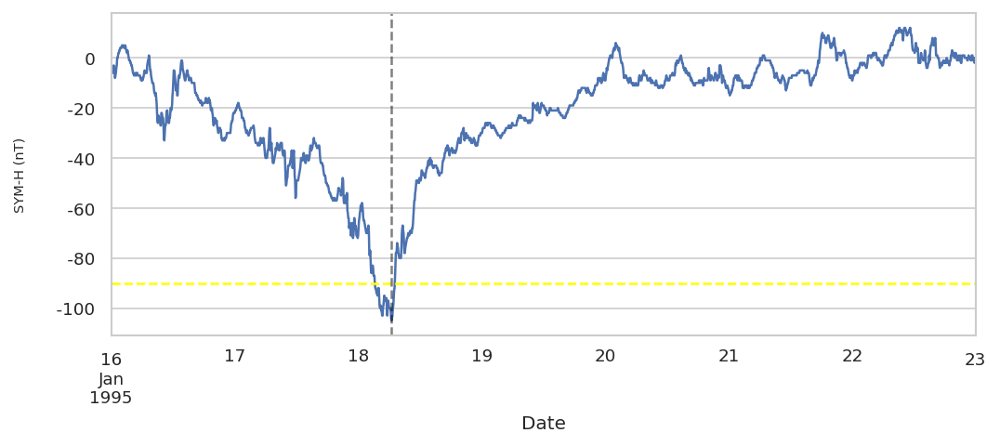

Plotting storm 136
Start date        1995-02-06 00:00:00
End date          1995-02-13 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -93
classification                    LOW
Name: 136, dtype: object
Minimum SYM-H value -93 at: 1995-02-08 10:00:00


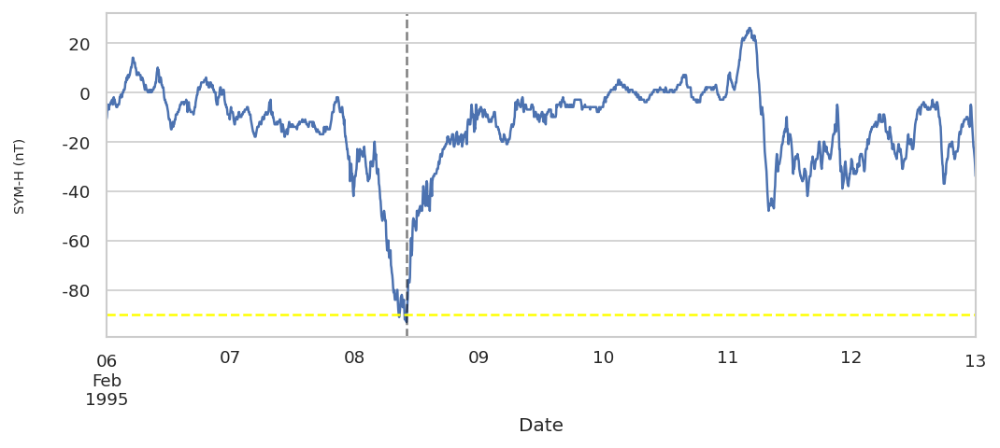

Plotting storm 137
Start date        1995-03-02 00:00:00
End date          1995-03-09 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -92
classification                    LOW
Name: 137, dtype: object
Minimum SYM-H value -92 at: 1995-03-04 21:55:00


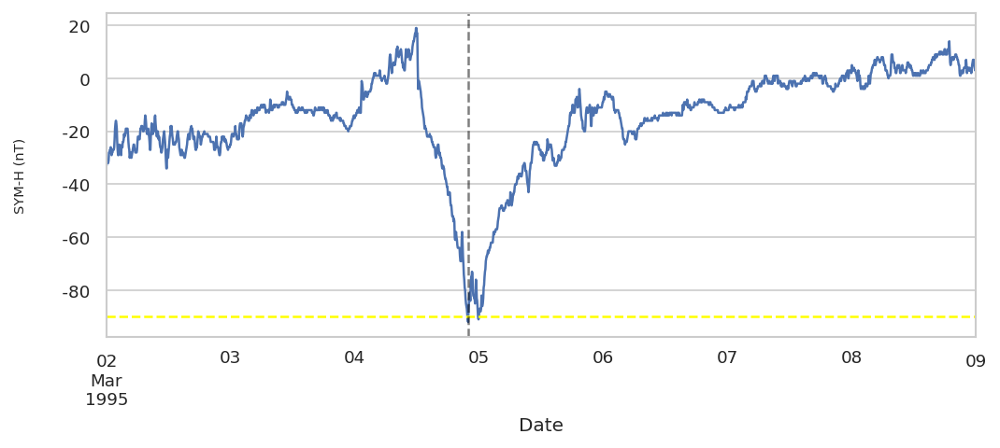

Plotting storm 138
Start date        1995-03-24 00:00:00
End date          1995-03-31 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -99
classification                    LOW
Name: 138, dtype: object
Minimum SYM-H value -99 at: 1995-03-26 14:00:00


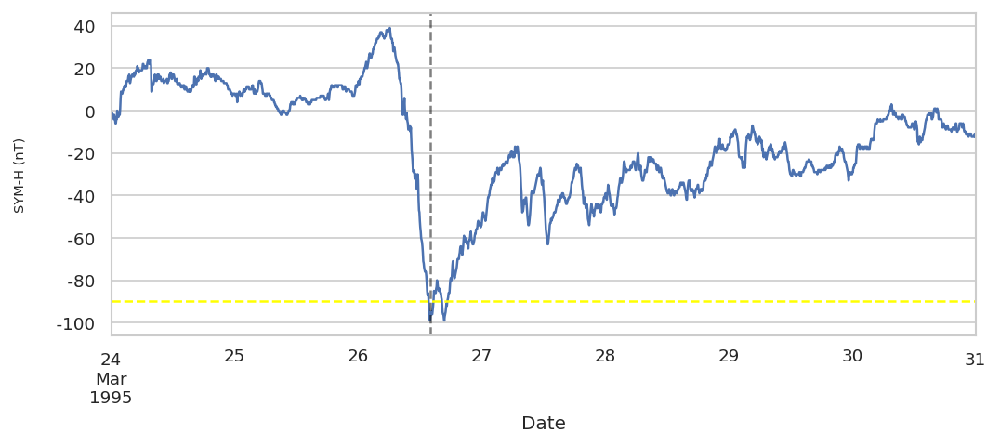

Plotting storm 140
Start date        1995-05-14 00:00:00
End date          1995-05-21 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -92
classification                    LOW
Name: 140, dtype: object
Minimum SYM-H value -92 at: 1995-05-16 22:20:00


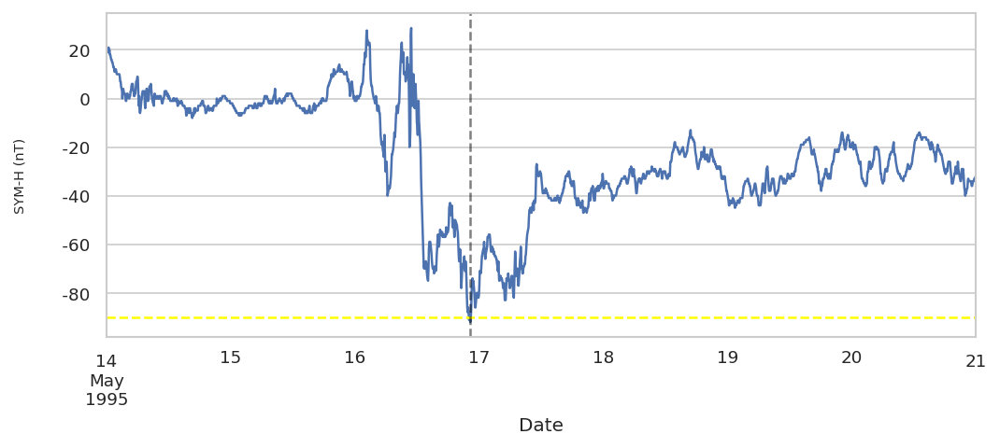

Plotting storm 141
Start date        1995-09-25 00:00:00
End date          1995-10-09 00:00:00
TD                   14 days 00:00:00
Min SYM-H                        -113
classification                    LOW
Name: 141, dtype: object
Minimum SYM-H value -113 at: 1995-09-27 20:15:00


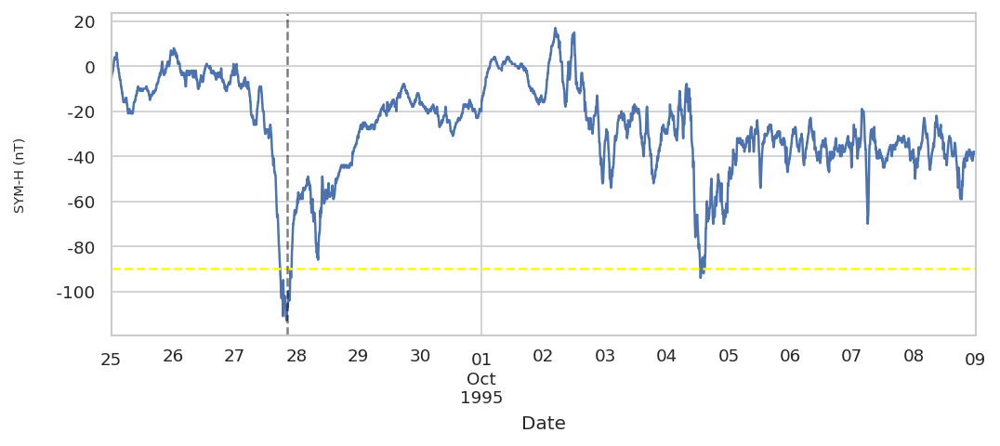

Plotting storm 142
Start date        1995-10-16 00:00:00
End date          1995-10-24 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -124
classification                    LOW
Name: 142, dtype: object
Minimum SYM-H value -124 at: 1995-10-19 05:05:00


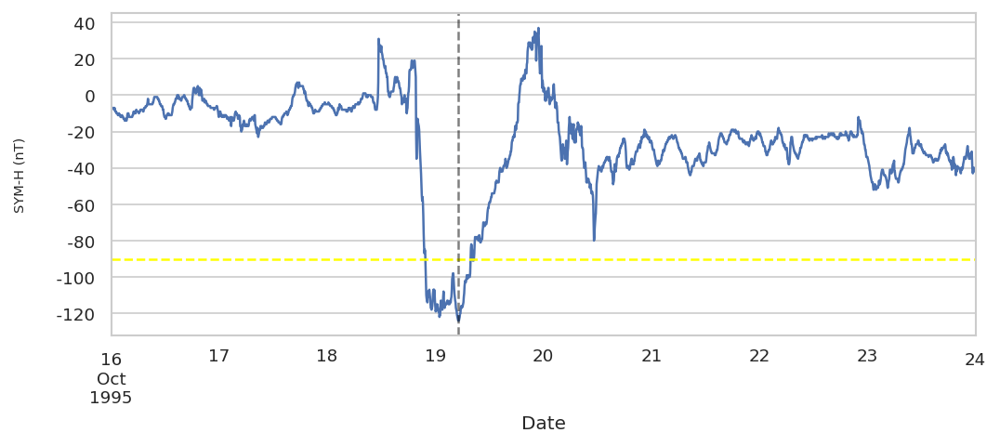

Plotting storm 143
Start date        1996-10-21 00:00:00
End date          1996-10-28 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -122
classification                    LOW
Name: 143, dtype: object
Minimum SYM-H value -122 at: 1996-10-23 03:30:00


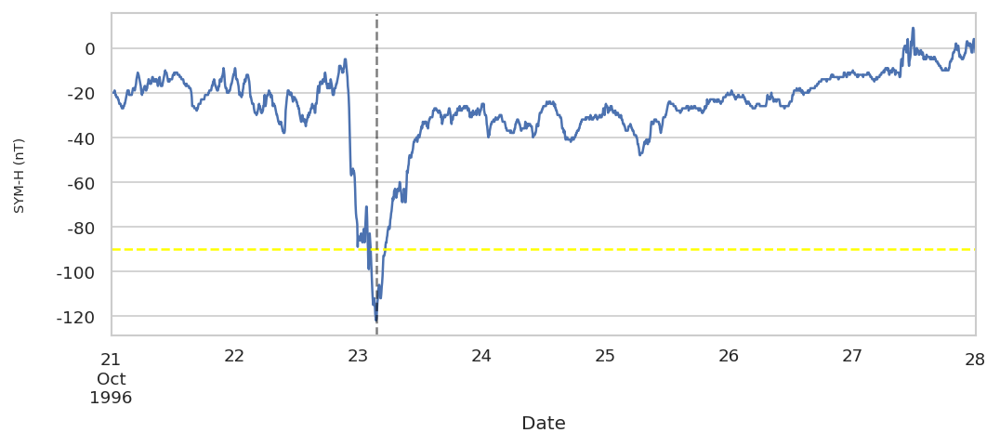

Plotting storm 144
Start date        1997-04-09 00:00:00
End date          1997-04-16 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -91
classification                    LOW
Name: 144, dtype: object
Minimum SYM-H value -91 at: 1997-04-11 04:40:00


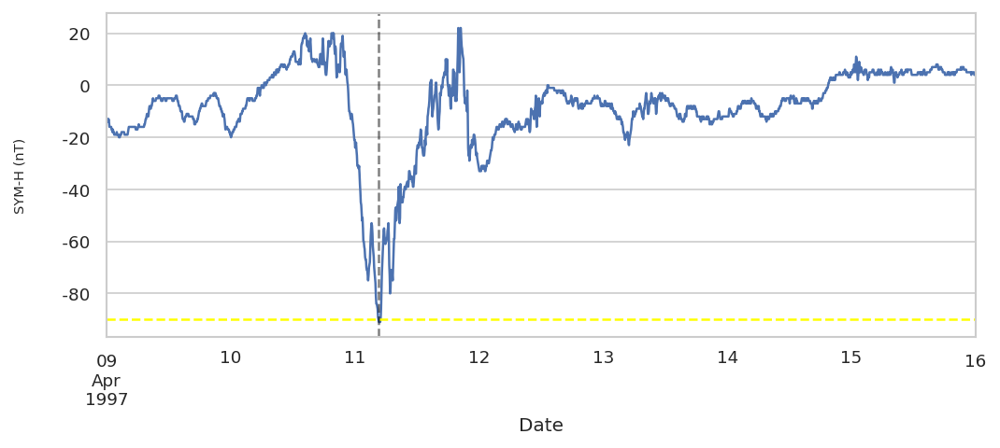

Plotting storm 145
Start date        1997-04-19 00:00:00
End date          1997-04-27 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -100
classification                    LOW
Name: 145, dtype: object
Minimum SYM-H value -100 at: 1997-04-21 23:30:00


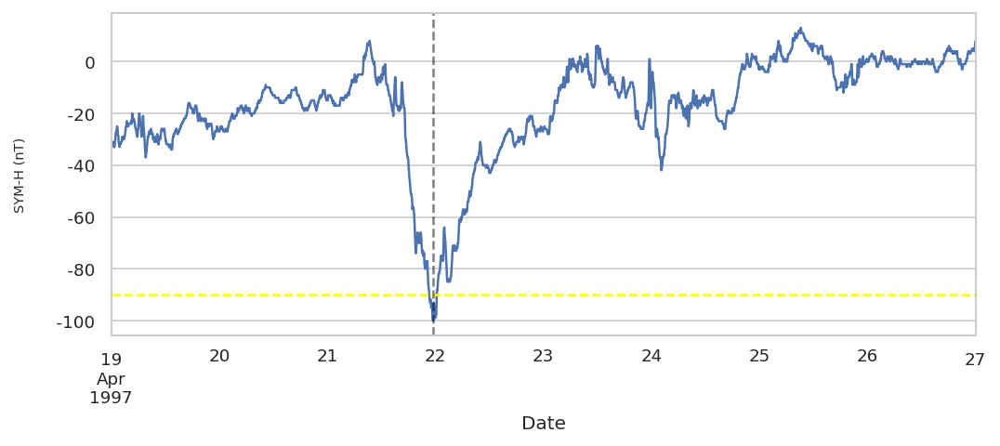

Plotting storm 146
Start date        1997-05-13 00:00:00
End date          1997-05-20 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -128
classification                    LOW
Name: 146, dtype: object
Minimum SYM-H value -128 at: 1997-05-15 11:45:00


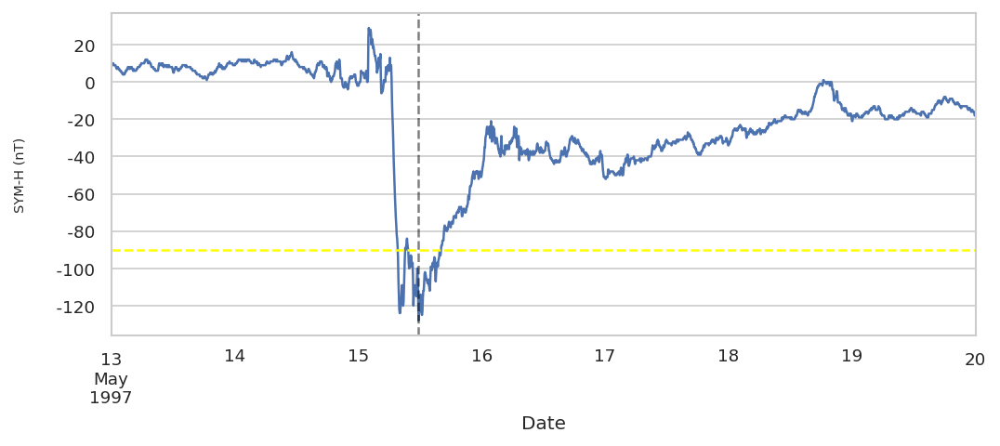

Plotting storm 147
Start date        1997-09-01 00:00:00
End date          1997-09-08 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -99
classification                    LOW
Name: 147, dtype: object
Minimum SYM-H value -99 at: 1997-09-03 22:30:00


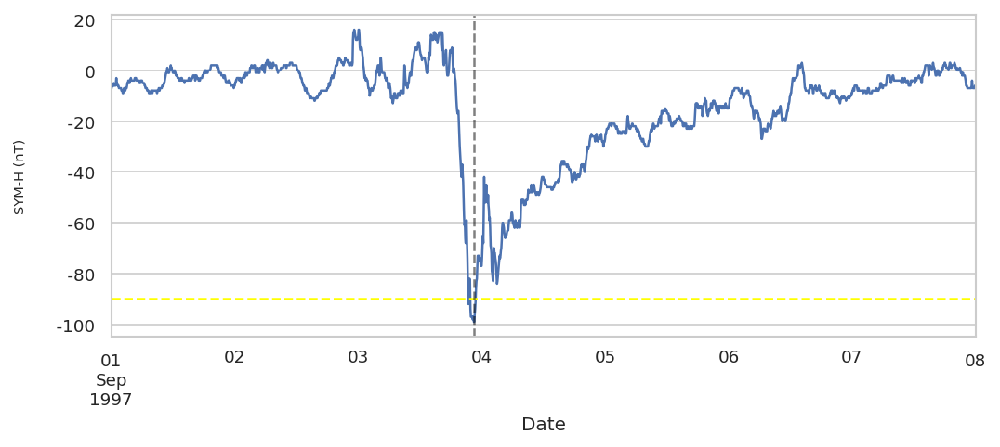

Plotting storm 148
Start date        1997-09-29 00:00:00
End date          1997-10-06 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -100
classification                    LOW
Name: 148, dtype: object
Minimum SYM-H value -100 at: 1997-10-01 16:00:00


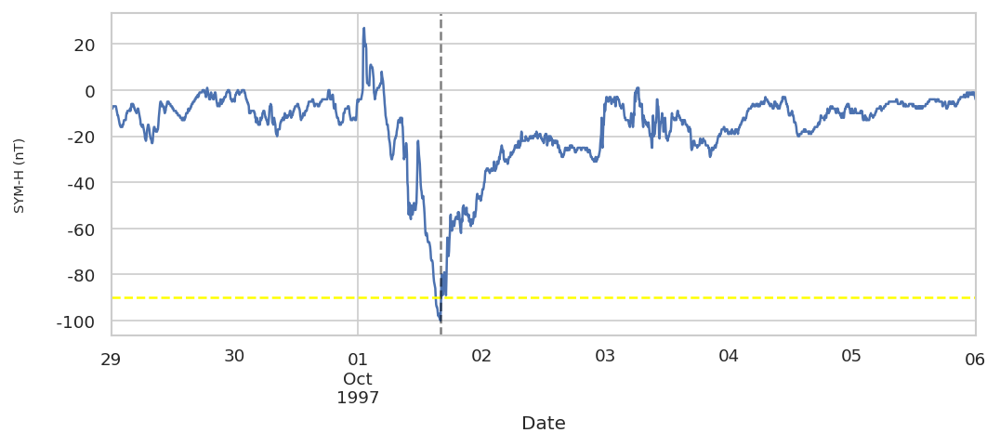

Plotting storm 150
Start date        1997-11-05 00:00:00
End date          1997-11-12 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -123
classification                    LOW
Name: 150, dtype: object
Minimum SYM-H value -123 at: 1997-11-07 03:40:00


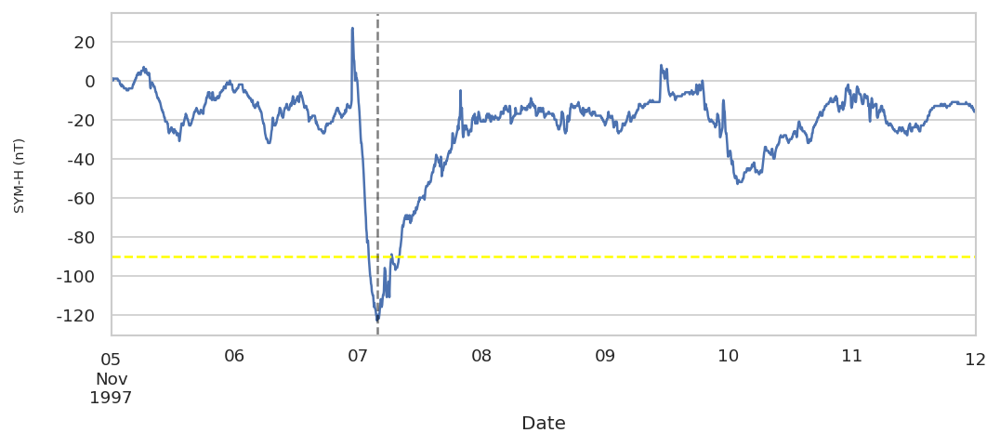

Plotting storm 151
Start date        1997-11-21 00:00:00
End date          1997-11-28 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -121
classification                    LOW
Name: 151, dtype: object
Minimum SYM-H value -121 at: 1997-11-23 02:45:00


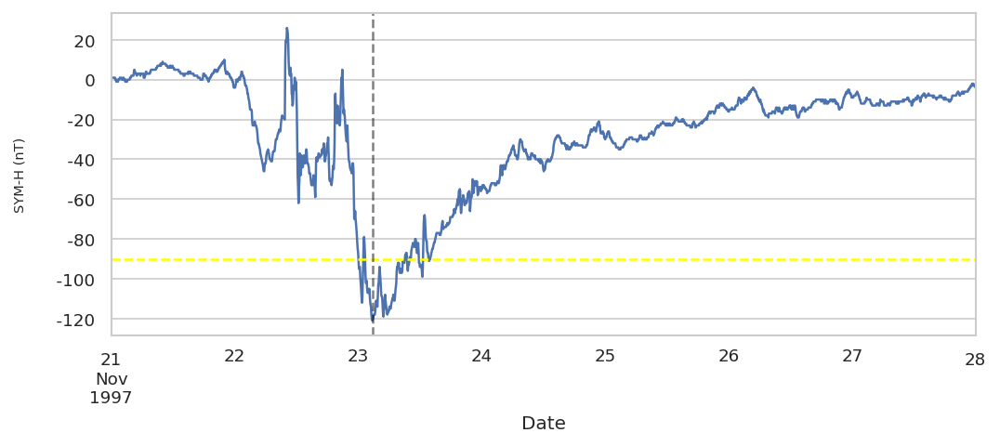

Plotting storm 152
Start date        1998-02-15 00:00:00
End date          1998-02-23 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -119
classification                    LOW
Name: 152, dtype: object
Minimum SYM-H value -119 at: 1998-02-18 00:45:00


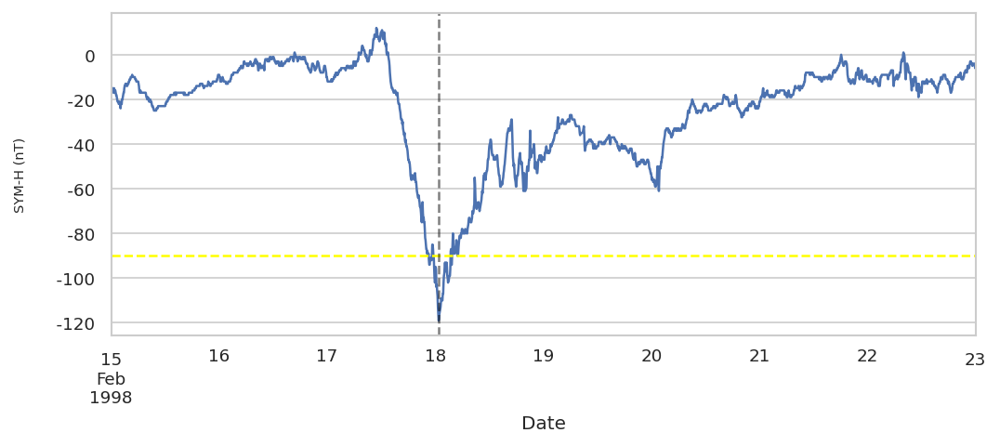

Plotting storm 153
Start date        1998-03-08 00:00:00
End date          1998-03-16 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -119
classification                    LOW
Name: 153, dtype: object
Minimum SYM-H value -119 at: 1998-03-10 20:40:00


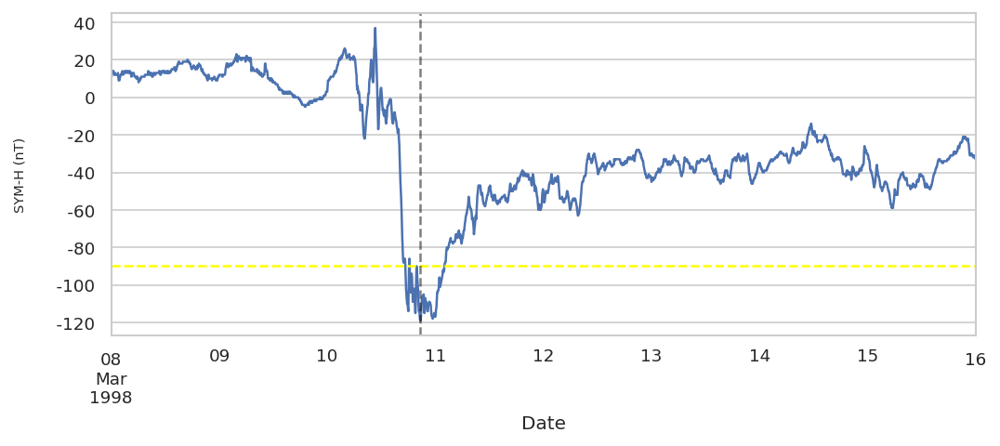

Plotting storm 155
Start date        1998-06-24 00:00:00
End date          1998-07-01 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -120
classification                    LOW
Name: 155, dtype: object
Minimum SYM-H value -120 at: 1998-06-26 04:40:00


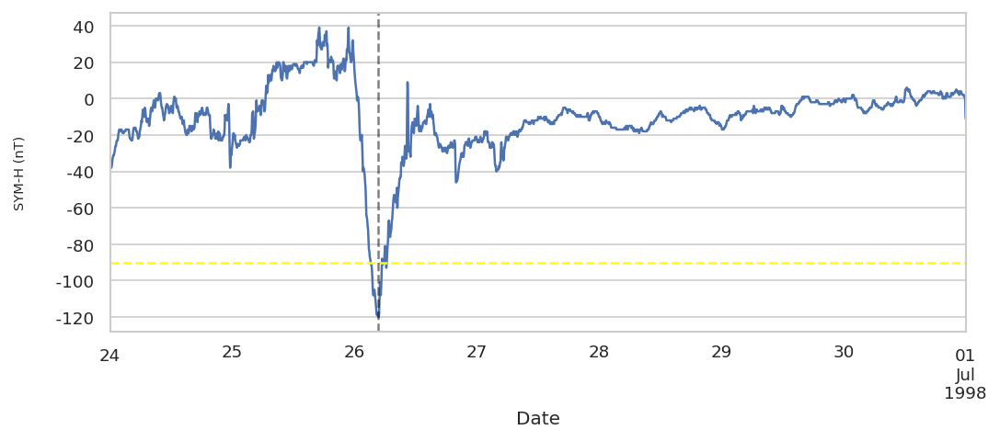

Plotting storm 159
Start date        1998-10-17 00:00:00
End date          1998-10-24 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -120
classification                    LOW
Name: 159, dtype: object
Minimum SYM-H value -120 at: 1998-10-19 15:20:00


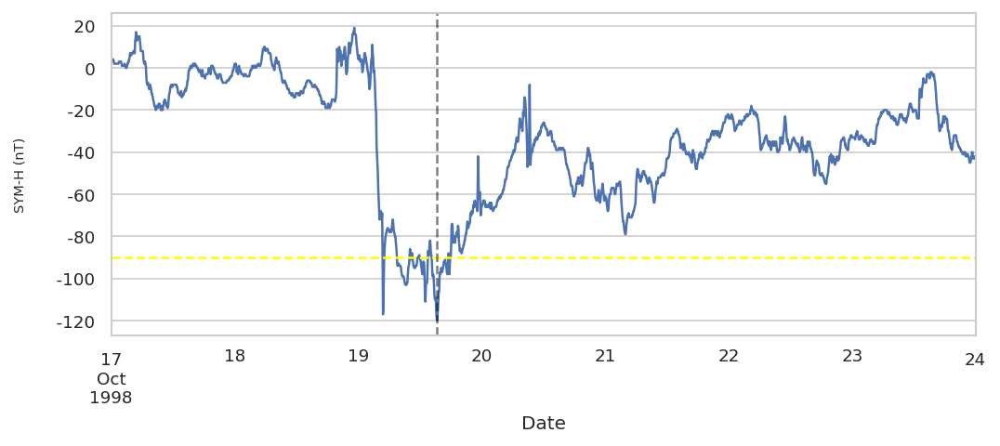

Plotting storm 161
Start date        1999-01-11 00:00:00
End date          1999-01-19 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -111
classification                    LOW
Name: 161, dtype: object
Minimum SYM-H value -111 at: 1999-01-13 23:35:00


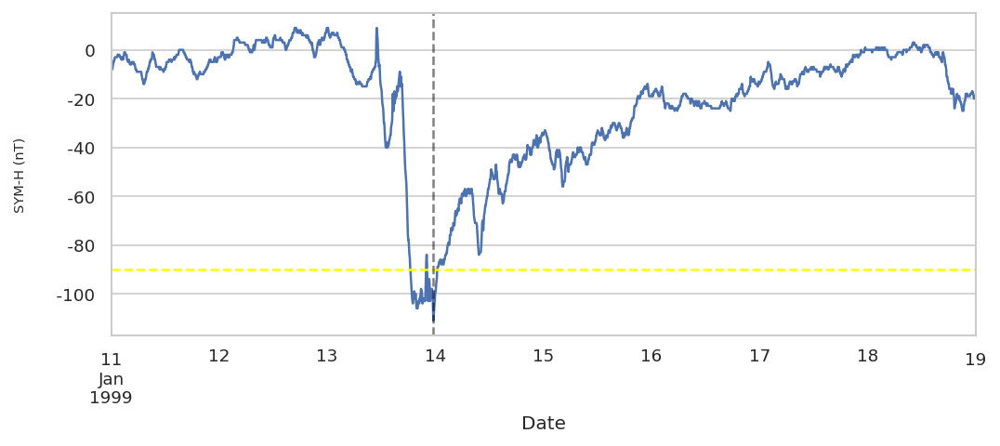

Plotting storm 162
Start date        1999-02-16 00:00:00
End date          1999-02-24 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -127
classification                    LOW
Name: 162, dtype: object
Minimum SYM-H value -127 at: 1999-02-18 09:35:00


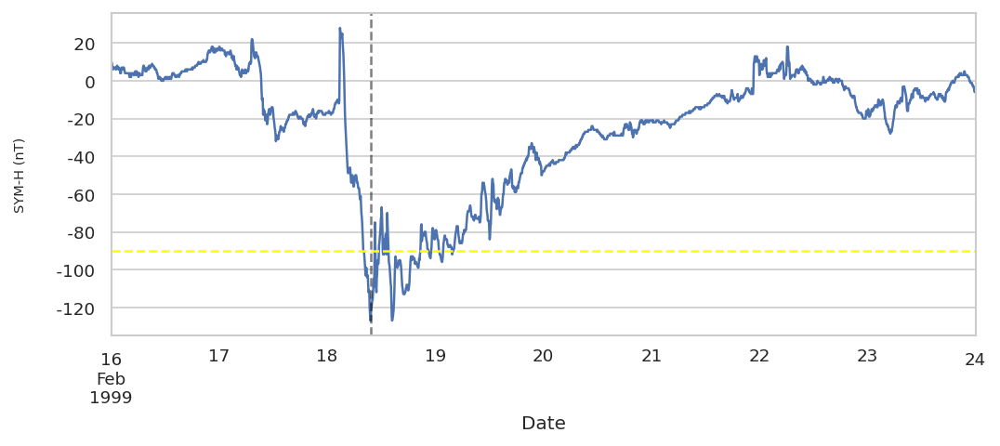

Plotting storm 163
Start date        1999-02-27 00:00:00
End date          1999-03-06 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -93
classification                    LOW
Name: 163, dtype: object
Minimum SYM-H value -93 at: 1999-03-01 01:20:00


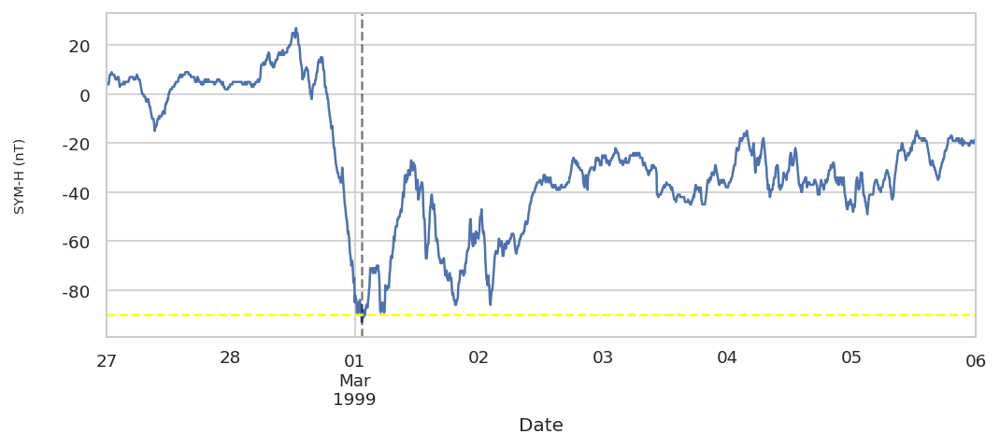

Plotting storm 164
Start date        1999-04-15 00:00:00
End date          1999-04-22 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -122
classification                    LOW
Name: 164, dtype: object
Minimum SYM-H value -122 at: 1999-04-17 04:15:00


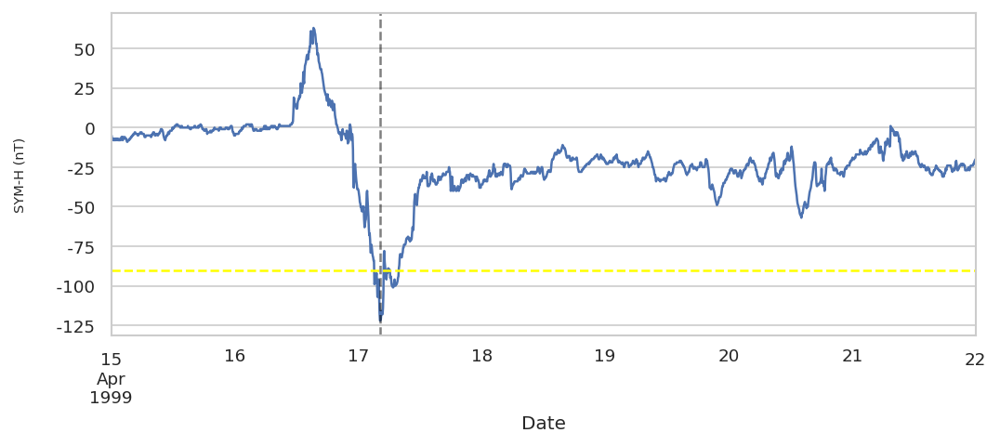

Plotting storm 167
Start date        1999-11-11 00:00:00
End date          1999-11-18 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -106
classification                    LOW
Name: 167, dtype: object
Minimum SYM-H value -106 at: 1999-11-13 20:10:00


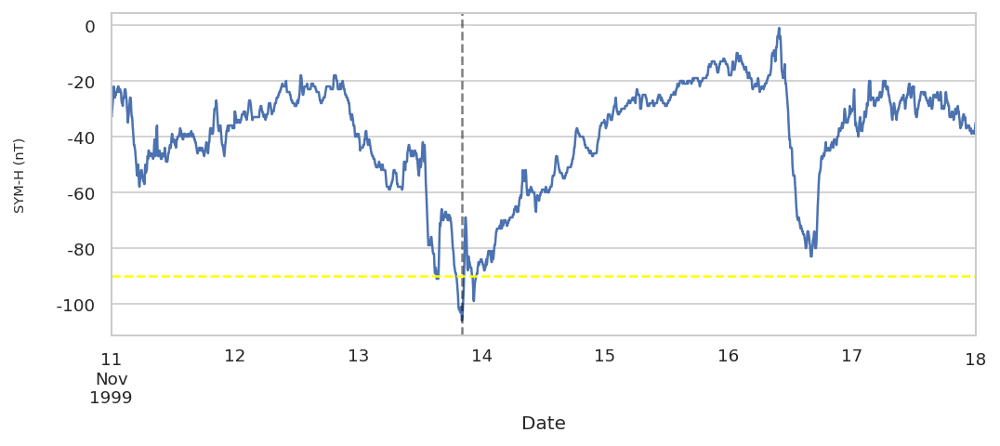

Plotting storm 168
Start date        1999-12-11 00:00:00
End date          1999-12-18 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -97
classification                    LOW
Name: 168, dtype: object
Minimum SYM-H value -97 at: 1999-12-13 09:00:00


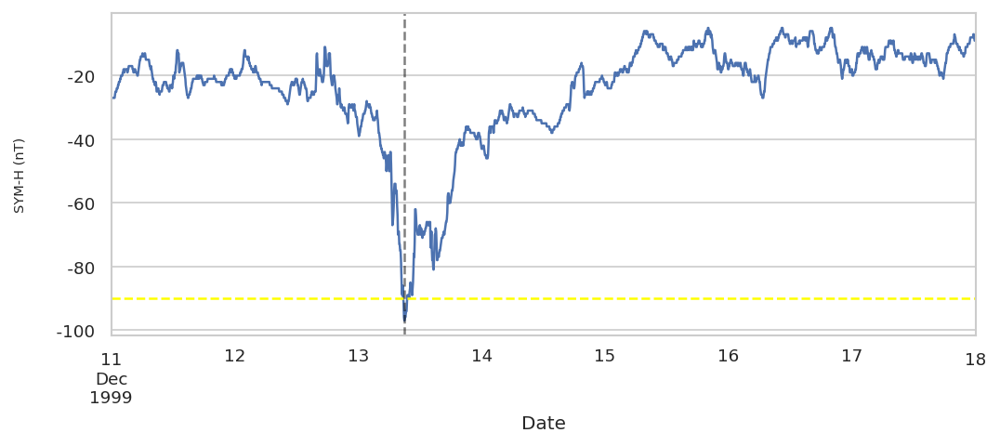

Plotting storm 169
Start date        2000-01-21 00:00:00
End date          2000-01-28 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -101
classification                    LOW
Name: 169, dtype: object
Minimum SYM-H value -101 at: 2000-01-23 02:55:00


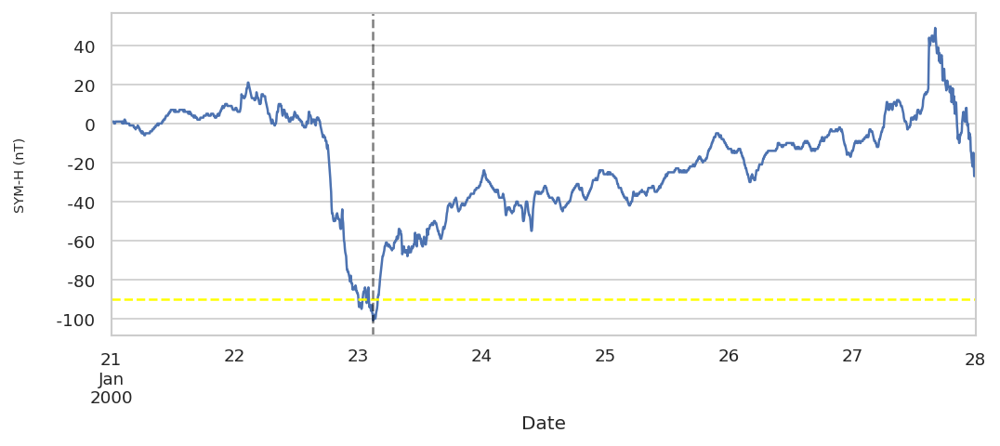

Plotting storm 172
Start date        2000-04-14 00:00:00
End date          2000-04-21 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -94
classification                    LOW
Name: 172, dtype: object
Minimum SYM-H value -94 at: 2000-04-16 11:00:00


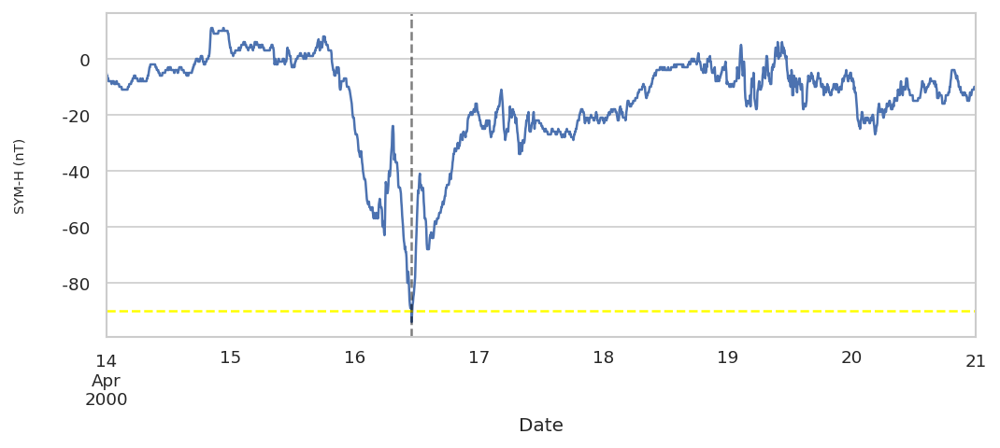

Plotting storm 179
Start date        2000-10-12 00:00:00
End date          2000-10-19 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -100
classification                    LOW
Name: 179, dtype: object
Minimum SYM-H value -100 at: 2000-10-14 14:30:00


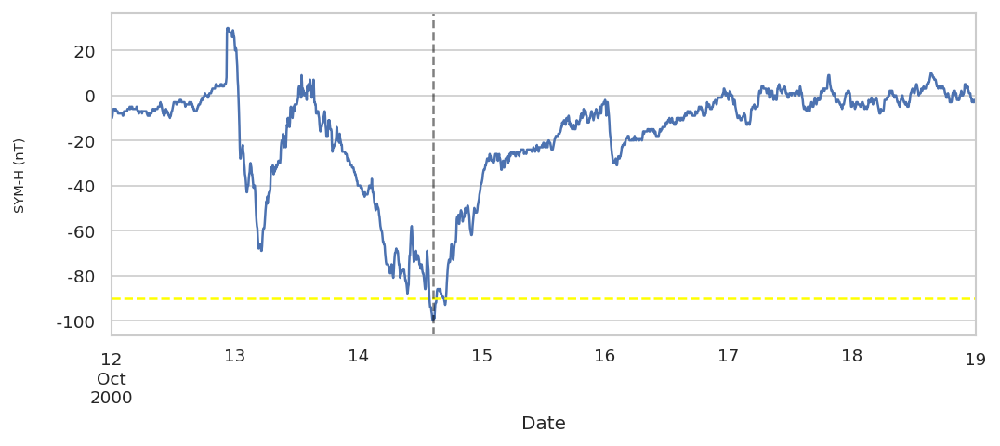

Plotting storm 180
Start date        2000-10-27 00:00:00
End date          2000-11-03 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -120
classification                    LOW
Name: 180, dtype: object
Minimum SYM-H value -120 at: 2000-10-29 02:35:00


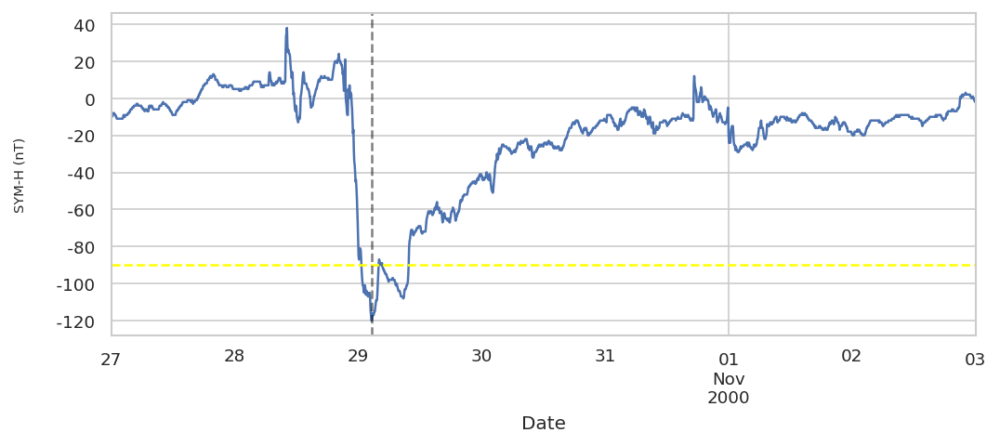

Plotting storm 182
Start date        2000-11-25 00:00:00
End date          2000-12-04 00:00:00
TD                    9 days 00:00:00
Min SYM-H                        -126
classification                    LOW
Name: 182, dtype: object
Minimum SYM-H value -126 at: 2000-11-29 13:45:00


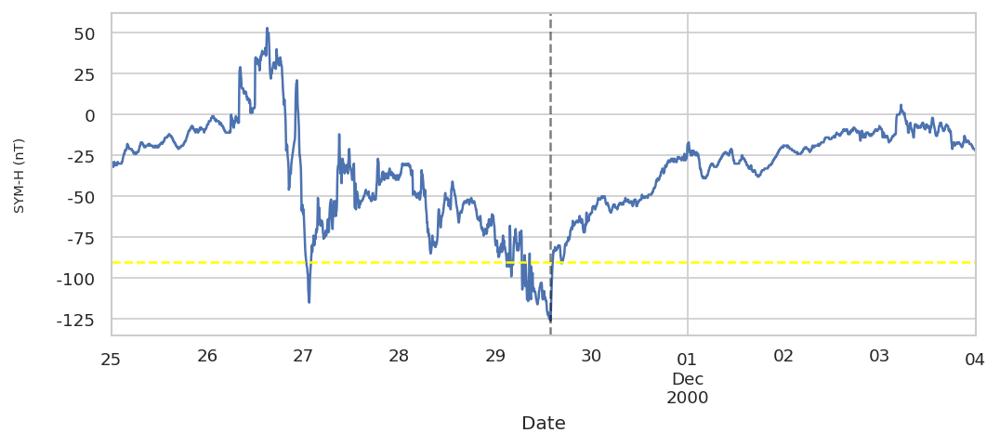

Plotting storm 192
Start date        2002-03-22 00:00:00
End date          2002-03-29 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -114
classification                    LOW
Name: 192, dtype: object
Minimum SYM-H value -114 at: 2002-03-24 08:30:00


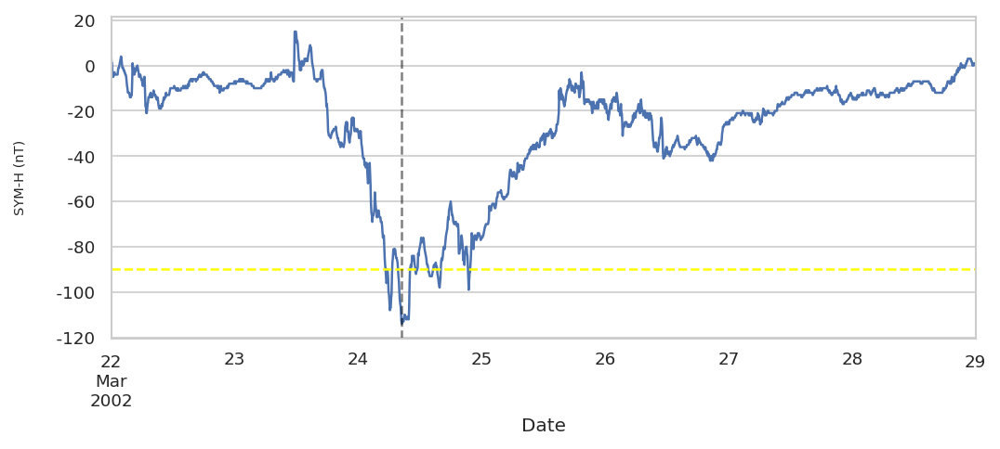

Plotting storm 194
Start date        2002-05-09 00:00:00
End date          2002-05-17 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -109
classification                    LOW
Name: 194, dtype: object
Minimum SYM-H value -109 at: 2002-05-11 19:55:00


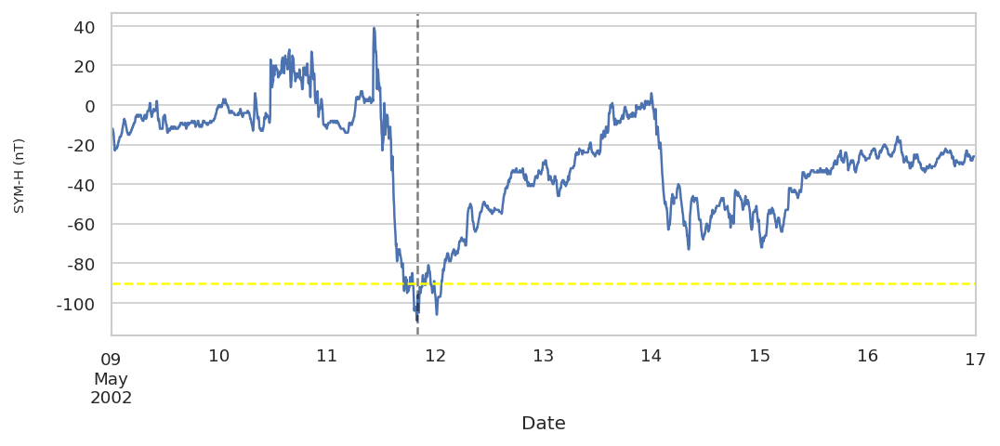

Plotting storm 195
Start date        2002-05-21 00:00:00
End date          2002-05-28 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -113
classification                    LOW
Name: 195, dtype: object
Minimum SYM-H value -113 at: 2002-05-23 17:10:00


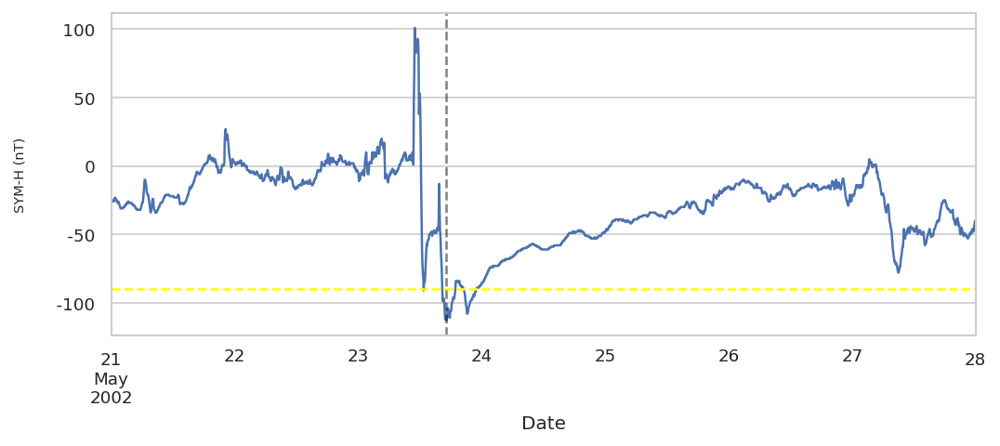

Plotting storm 196
Start date        2002-07-31 00:00:00
End date          2002-08-07 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -114
classification                    LOW
Name: 196, dtype: object
Minimum SYM-H value -114 at: 2002-08-02 04:50:00


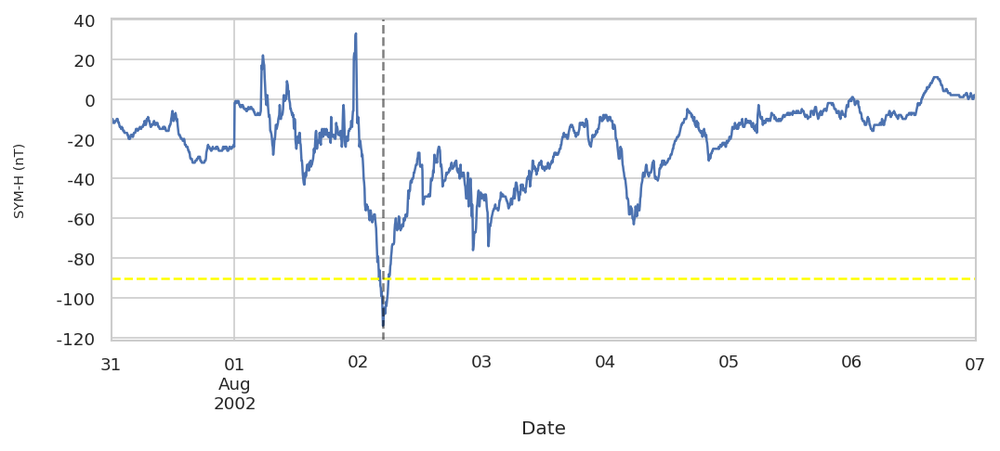

Plotting storm 197
Start date        2002-08-19 00:00:00
End date          2002-08-26 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -119
classification                    LOW
Name: 197, dtype: object
Minimum SYM-H value -119 at: 2002-08-21 05:20:00


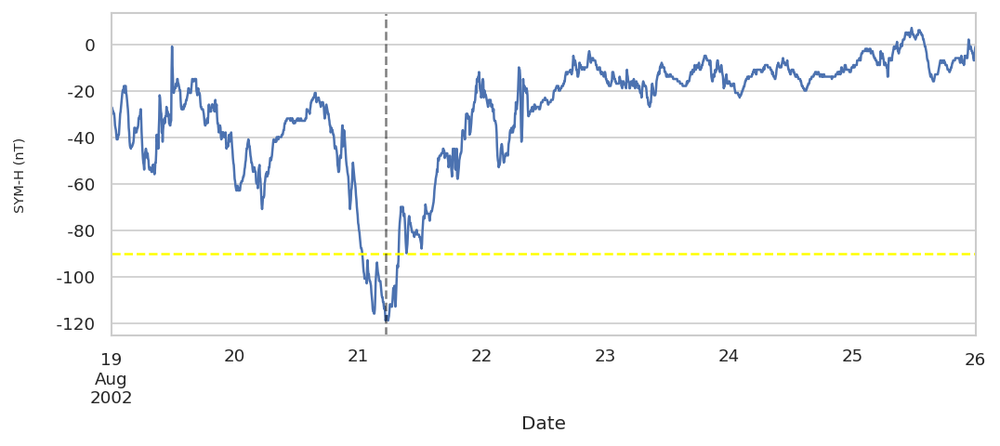

Plotting storm 200
Start date        2002-11-18 00:00:00
End date          2002-11-26 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -126
classification                    LOW
Name: 200, dtype: object
Minimum SYM-H value -126 at: 2002-11-21 10:10:00


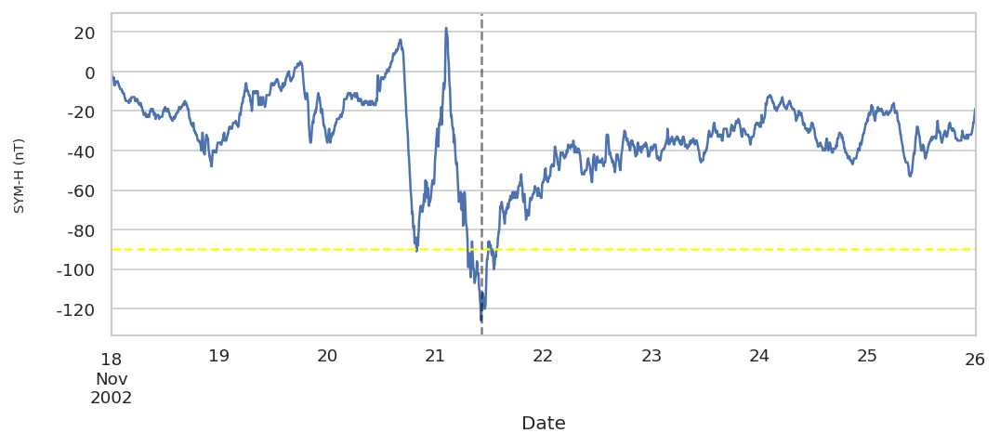

Plotting storm 202
Start date        2003-04-29 00:00:00
End date          2003-05-06 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -93
classification                    LOW
Name: 202, dtype: object
Minimum SYM-H value -93 at: 2003-05-01 00:50:00


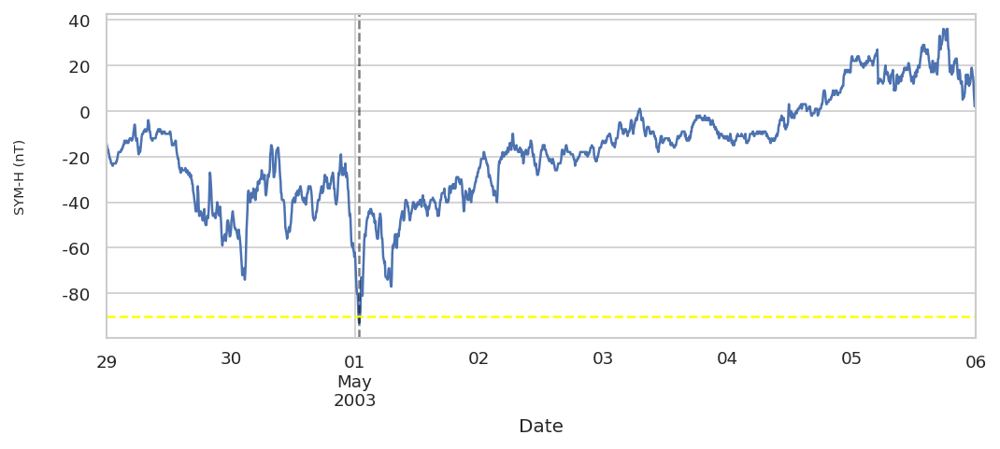

Plotting storm 203
Start date        2003-05-08 00:00:00
End date          2003-05-15 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -91
classification                    LOW
Name: 203, dtype: object
Minimum SYM-H value -91 at: 2003-05-10 07:35:00


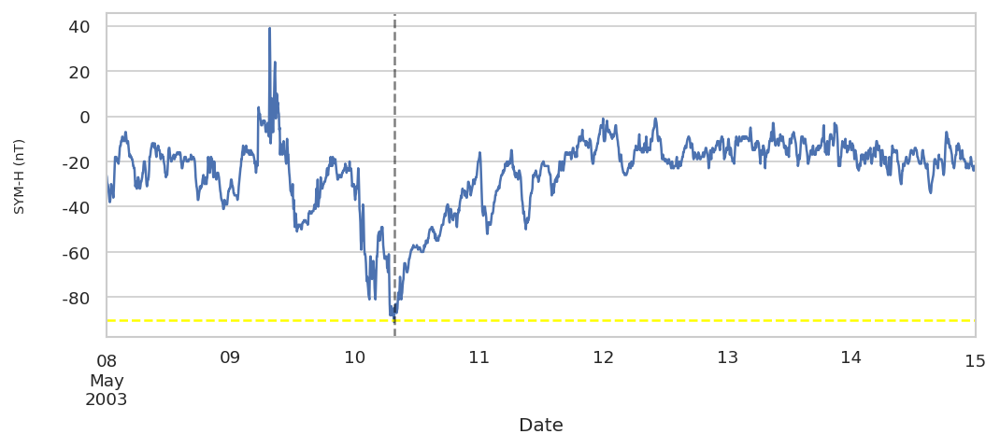

Plotting storm 206
Start date        2003-06-25 00:00:00
End date          2003-07-02 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -98
classification                    LOW
Name: 206, dtype: object
Minimum SYM-H value -98 at: 2003-06-27 23:50:00


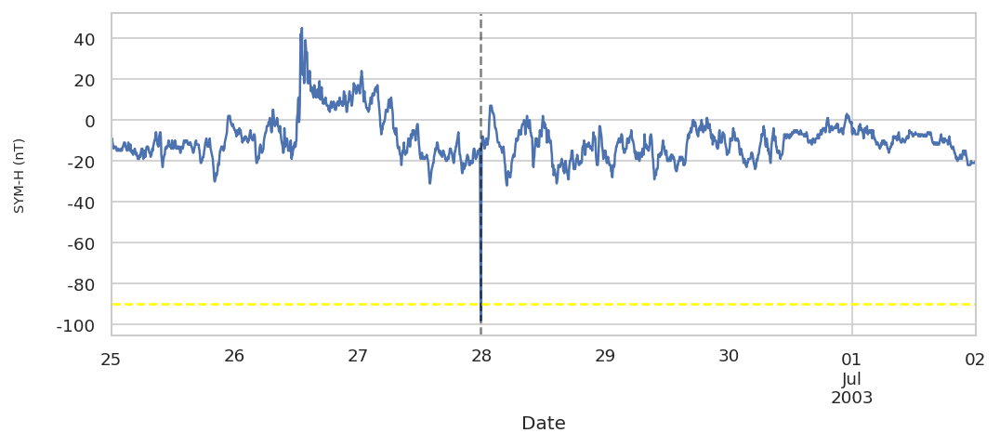

Plotting storm 207
Start date        2003-07-10 00:00:00
End date          2003-07-21 00:00:00
TD                   11 days 00:00:00
Min SYM-H                        -125
classification                    LOW
Name: 207, dtype: object
Minimum SYM-H value -125 at: 2003-07-12 05:35:00


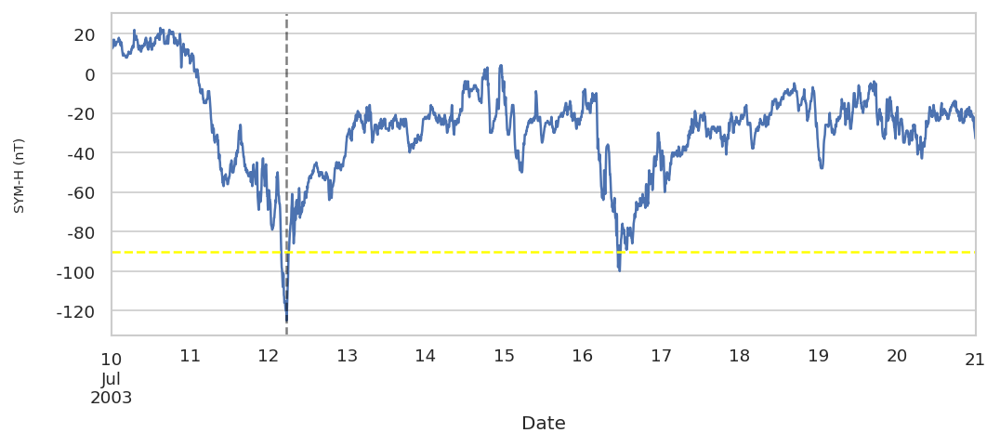

Plotting storm 209
Start date        2003-10-12 00:00:00
End date          2003-10-19 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -102
classification                    LOW
Name: 209, dtype: object
Minimum SYM-H value -102 at: 2003-10-14 23:00:00


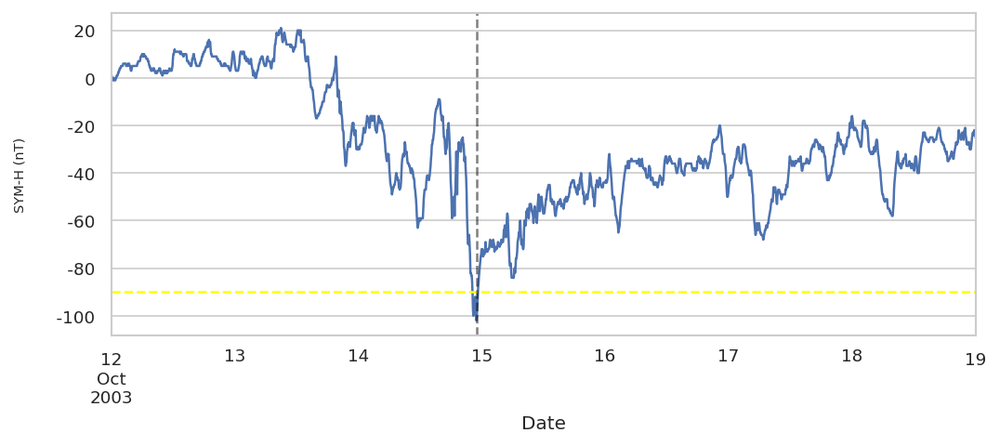

Plotting storm 213
Start date        2004-02-09 00:00:00
End date          2004-02-16 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -107
classification                    LOW
Name: 213, dtype: object
Minimum SYM-H value -107 at: 2004-02-11 17:10:00


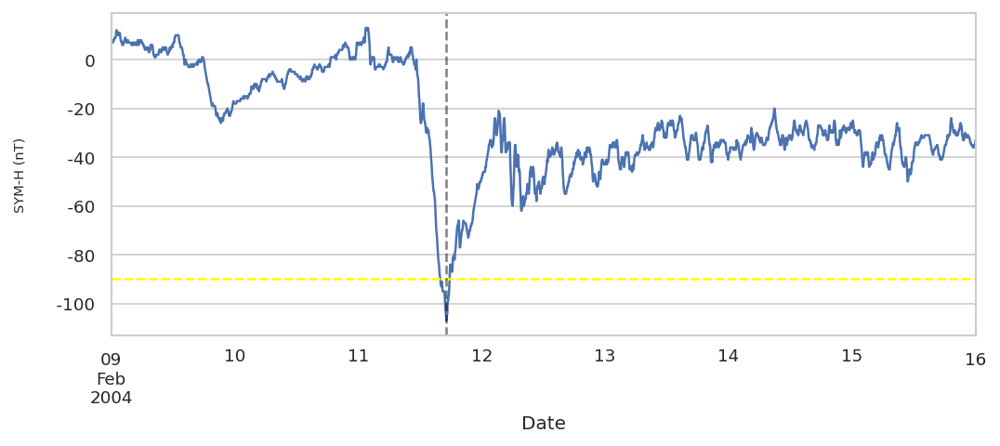

Plotting storm 214
Start date        2004-03-08 00:00:00
End date          2004-03-15 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -101
classification                    LOW
Name: 214, dtype: object
Minimum SYM-H value -101 at: 2004-03-10 05:30:00


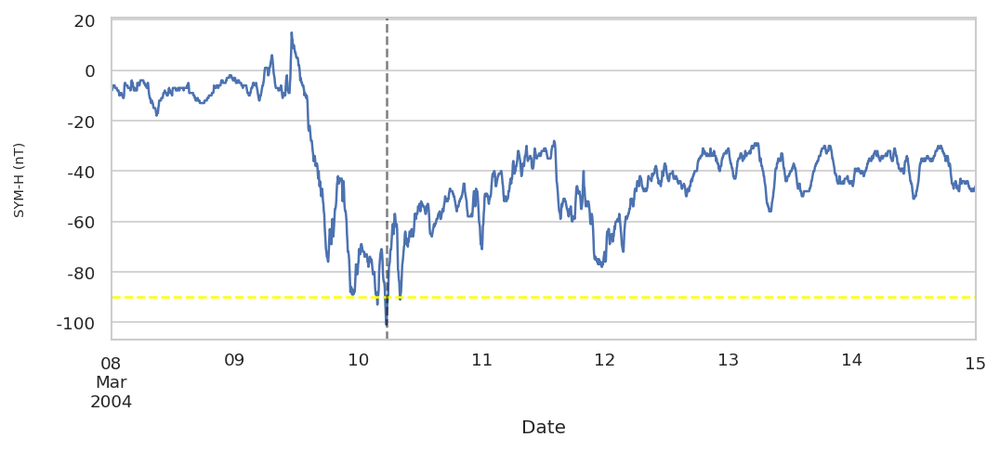

Plotting storm 217
Start date        2004-08-28 00:00:00
End date          2004-09-05 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -128
classification                    LOW
Name: 217, dtype: object
Minimum SYM-H value -128 at: 2004-08-30 22:50:00


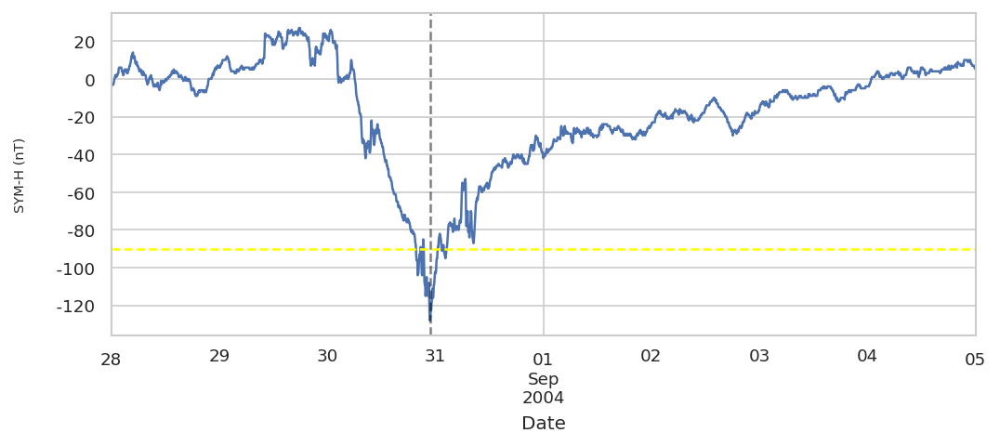

Plotting storm 219
Start date        2005-01-05 00:00:00
End date          2005-01-13 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -108
classification                    LOW
Name: 219, dtype: object
Minimum SYM-H value -108 at: 2005-01-08 00:05:00


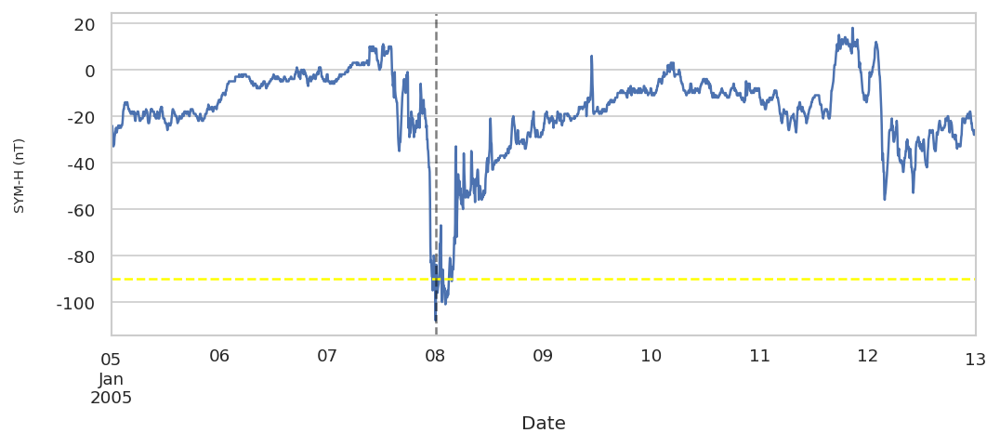

Plotting storm 220
Start date        2005-01-16 00:00:00
End date          2005-01-27 00:00:00
TD                   11 days 00:00:00
Min SYM-H                        -107
classification                    LOW
Name: 220, dtype: object
Minimum SYM-H value -107 at: 2005-01-18 08:20:00


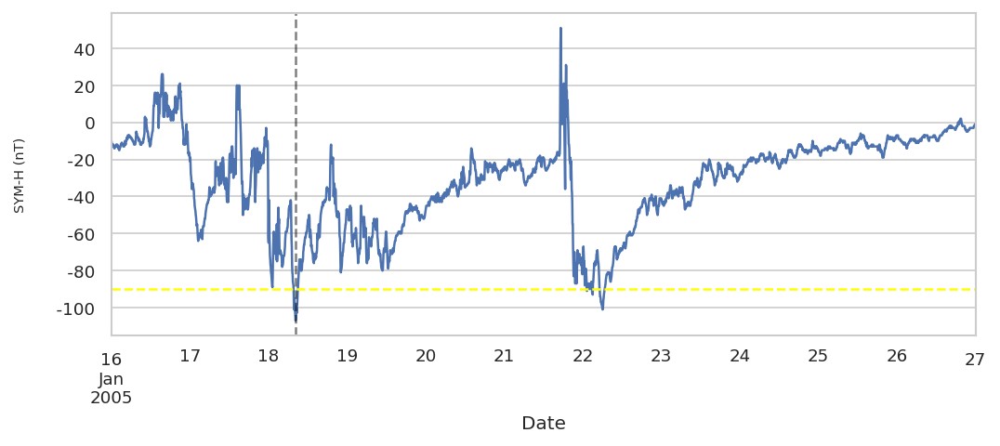

Plotting storm 221
Start date        2005-02-16 00:00:00
End date          2005-02-23 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -95
classification                    LOW
Name: 221, dtype: object
Minimum SYM-H value -95 at: 2005-02-18 01:55:00


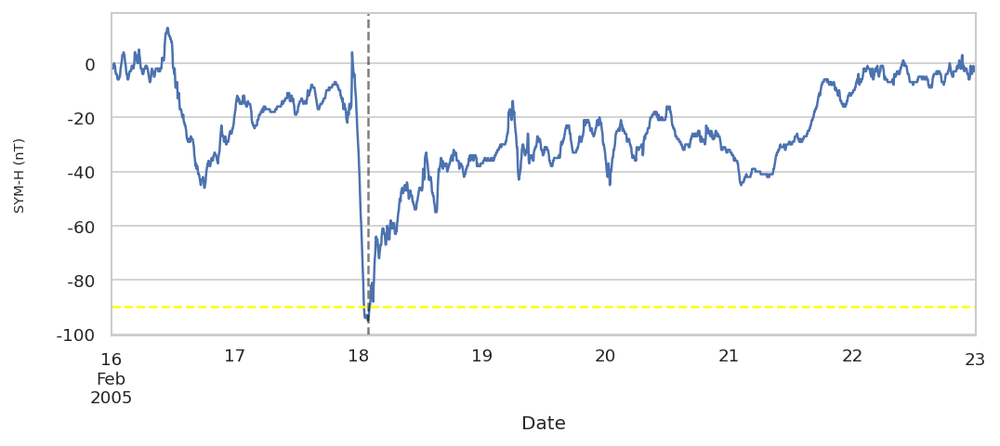

Plotting storm 222
Start date        2005-04-03 00:00:00
End date          2005-04-10 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -93
classification                    LOW
Name: 222, dtype: object
Minimum SYM-H value -93 at: 2005-04-05 02:35:00


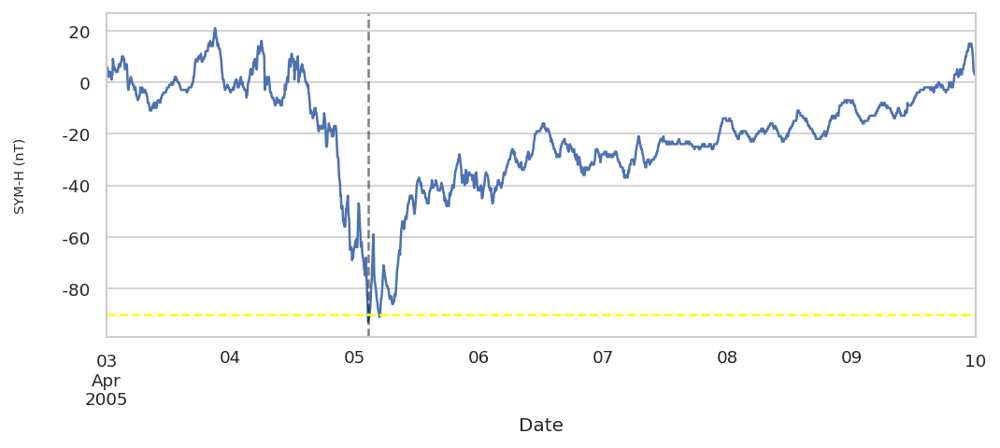

Plotting storm 224
Start date        2005-05-28 00:00:00
End date          2005-06-05 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -126
classification                    LOW
Name: 224, dtype: object
Minimum SYM-H value -126 at: 2005-05-30 18:20:00


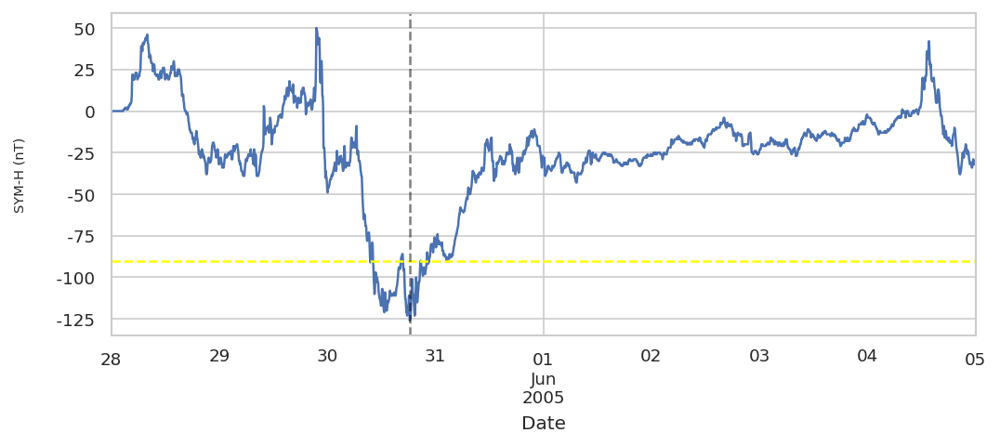

Plotting storm 225
Start date        2005-06-10 00:00:00
End date          2005-06-18 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -112
classification                    LOW
Name: 225, dtype: object
Minimum SYM-H value -112 at: 2005-06-13 00:35:00


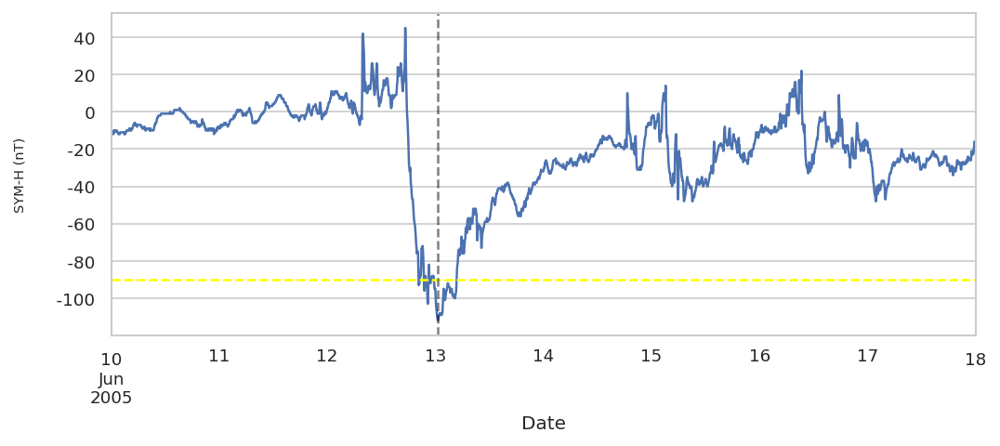

Plotting storm 226
Start date        2005-06-21 00:00:00
End date          2005-06-28 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -101
classification                    LOW
Name: 226, dtype: object
Minimum SYM-H value -101 at: 2005-06-23 10:45:00


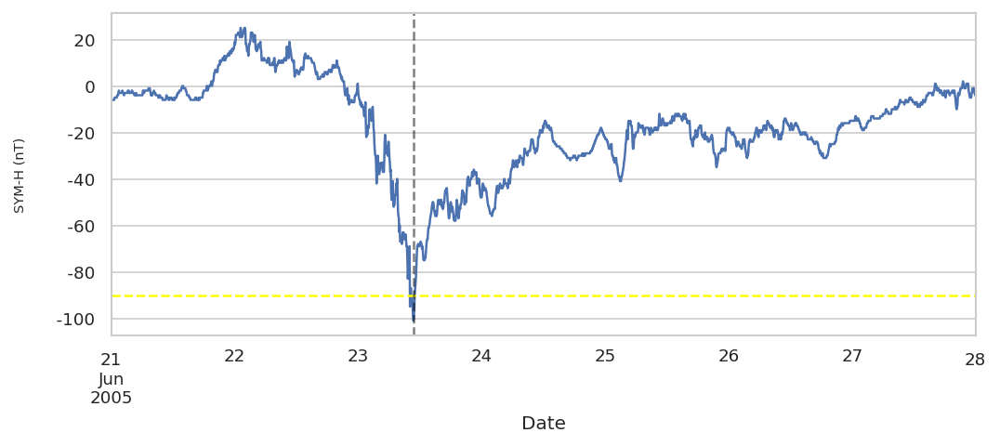

Plotting storm 227
Start date        2005-07-08 00:00:00
End date          2005-07-17 00:00:00
TD                    9 days 00:00:00
Min SYM-H                        -113
classification                    LOW
Name: 227, dtype: object
Minimum SYM-H value -113 at: 2005-07-10 20:10:00


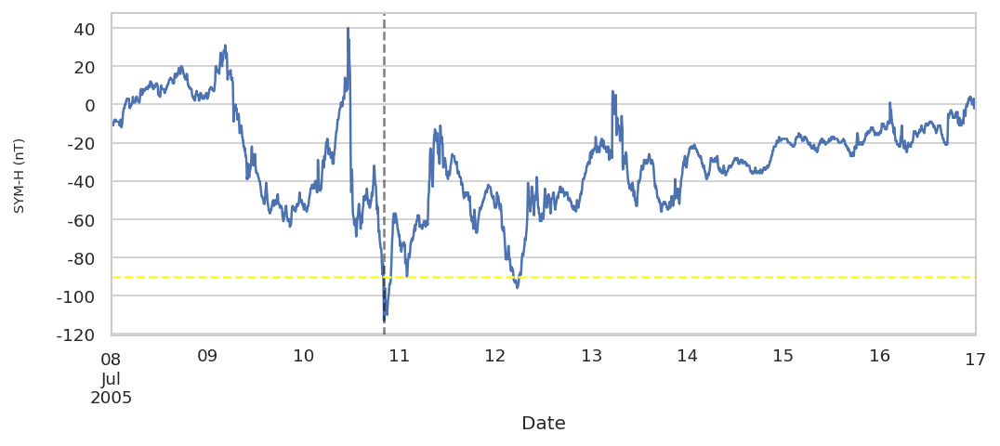

Plotting storm 230
Start date        2006-04-03 00:00:00
End date          2006-04-19 00:00:00
TD                   16 days 00:00:00
Min SYM-H                        -110
classification                    LOW
Name: 230, dtype: object
Minimum SYM-H value -110 at: 2006-04-14 09:20:00


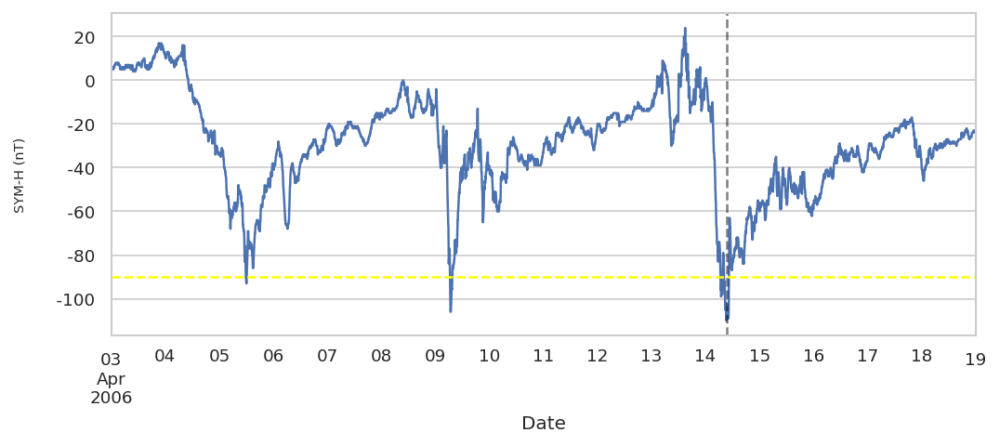

Plotting storm 231
Start date        2006-08-18 00:00:00
End date          2006-08-25 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -94
classification                    LOW
Name: 231, dtype: object
Minimum SYM-H value -94 at: 2006-08-20 01:05:00


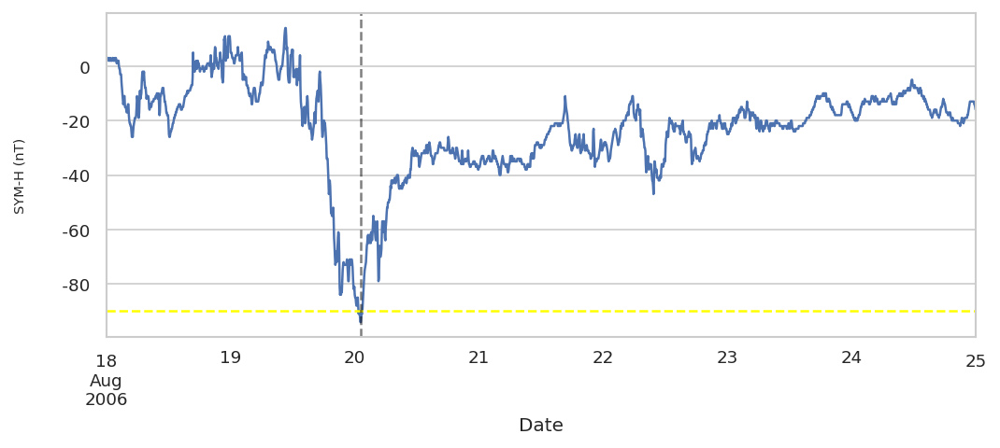

Plotting storm 233
Start date        2008-03-07 00:00:00
End date          2008-03-14 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -99
classification                    LOW
Name: 233, dtype: object
Minimum SYM-H value -99 at: 2008-03-09 05:30:00


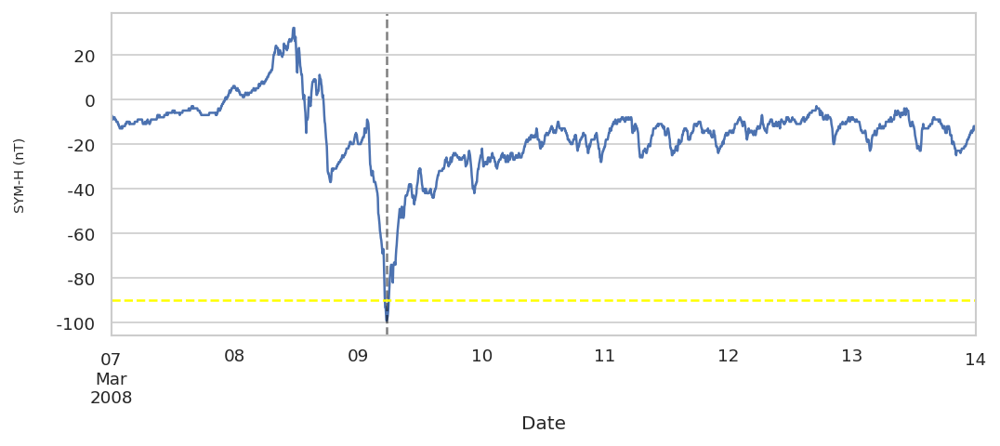

Plotting storm 234
Start date        2009-07-20 00:00:00
End date          2009-07-27 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -93
classification                    LOW
Name: 234, dtype: object
Minimum SYM-H value -93 at: 2009-07-22 05:55:00


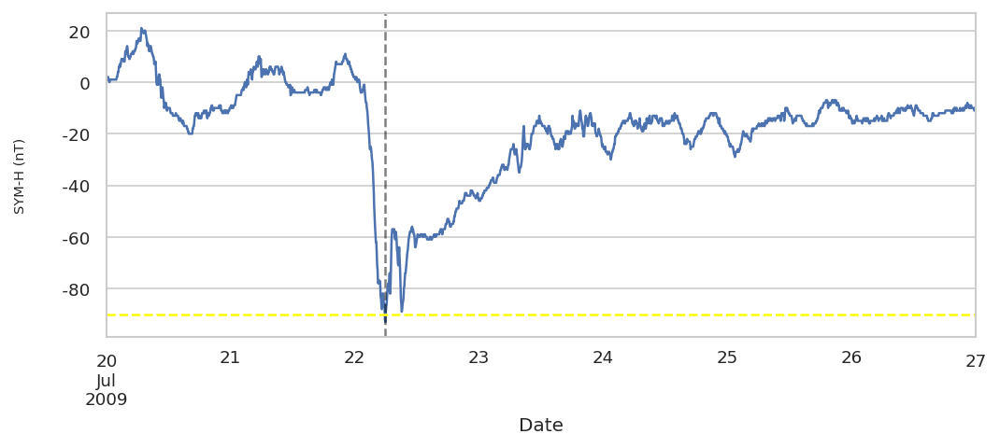

Plotting storm 235
Start date        2011-03-09 00:00:00
End date          2011-03-16 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -92
classification                    LOW
Name: 235, dtype: object
Minimum SYM-H value -92 at: 2011-03-11 05:20:00


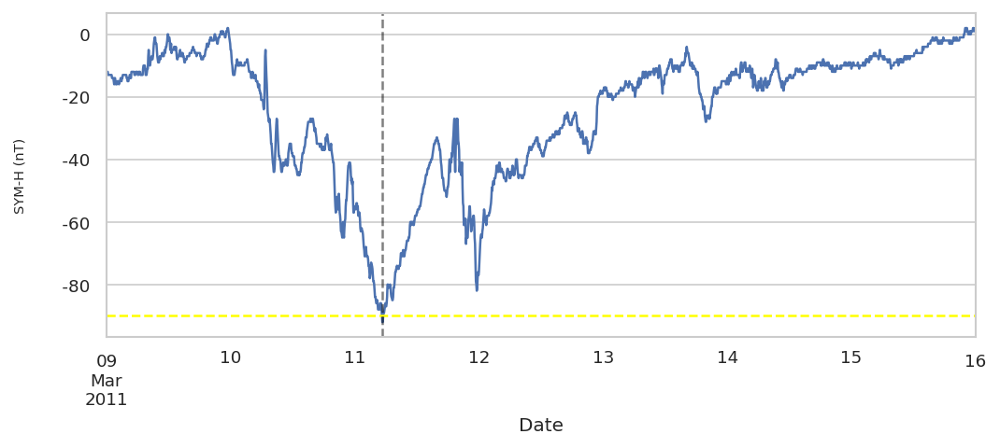

Plotting storm 236
Start date        2011-05-26 00:00:00
End date          2011-06-02 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -93
classification                    LOW
Name: 236, dtype: object
Minimum SYM-H value -93 at: 2011-05-28 11:10:00


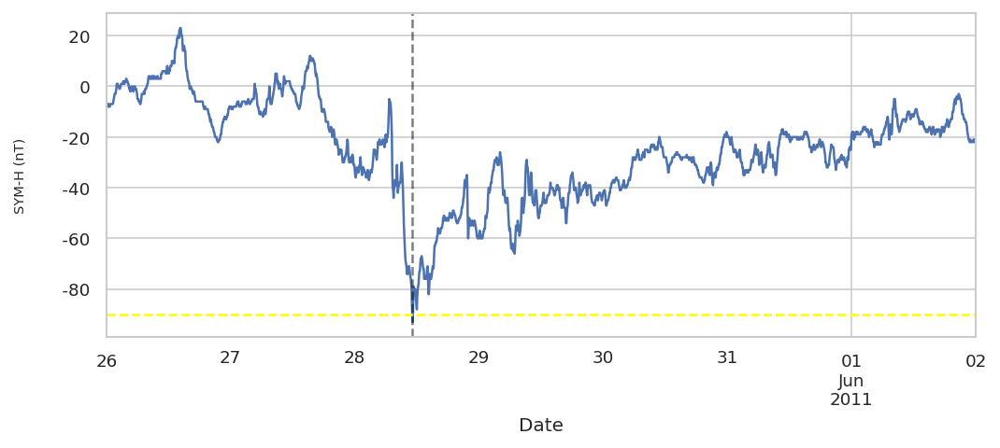

Plotting storm 237
Start date        2011-08-03 00:00:00
End date          2011-08-11 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -126
classification                    LOW
Name: 237, dtype: object
Minimum SYM-H value -126 at: 2011-08-06 03:20:00


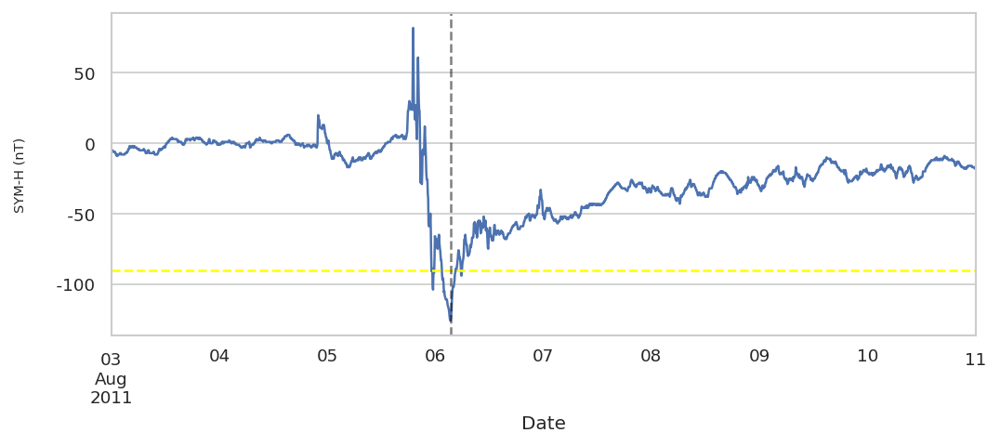

Plotting storm 238
Start date        2011-09-24 00:00:00
End date          2011-10-02 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -111
classification                    LOW
Name: 238, dtype: object
Minimum SYM-H value -111 at: 2011-09-26 22:35:00


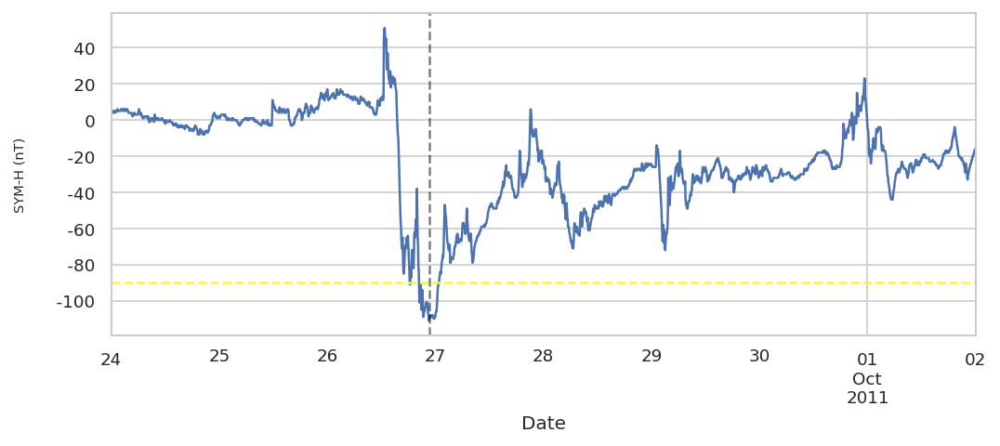

Plotting storm 241
Start date        2012-04-21 00:00:00
End date          2012-04-29 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -125
classification                    LOW
Name: 241, dtype: object
Minimum SYM-H value -125 at: 2012-04-24 03:25:00


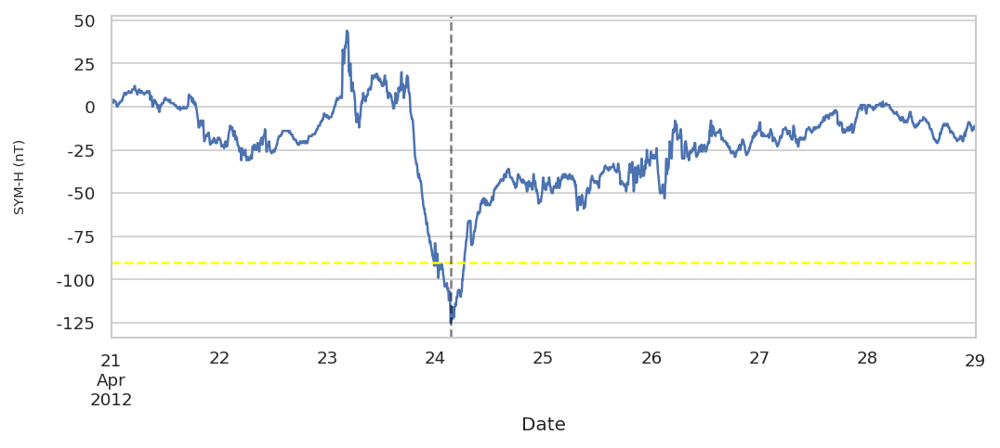

Plotting storm 242
Start date        2012-07-13 00:00:00
End date          2012-07-21 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -122
classification                    LOW
Name: 242, dtype: object
Minimum SYM-H value -122 at: 2012-07-15 10:00:00


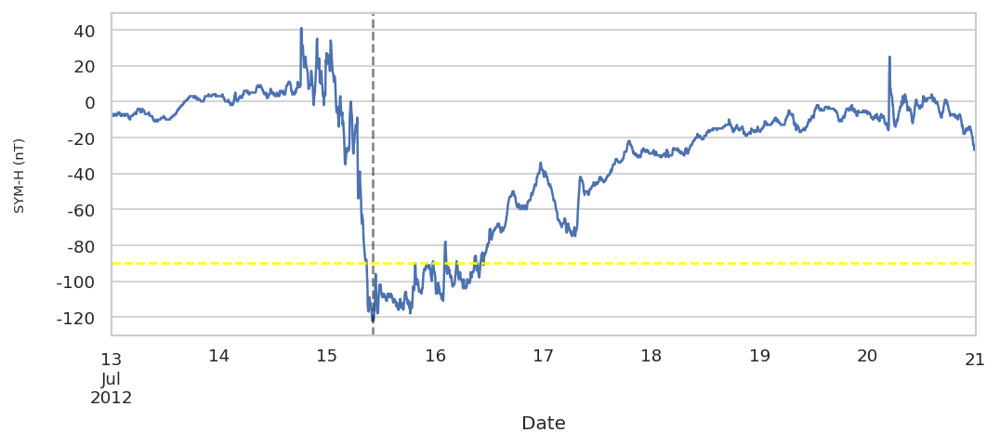

Plotting storm 244
Start date        2012-11-12 00:00:00
End date          2012-11-19 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -117
classification                    LOW
Name: 244, dtype: object
Minimum SYM-H value -117 at: 2012-11-14 07:25:00


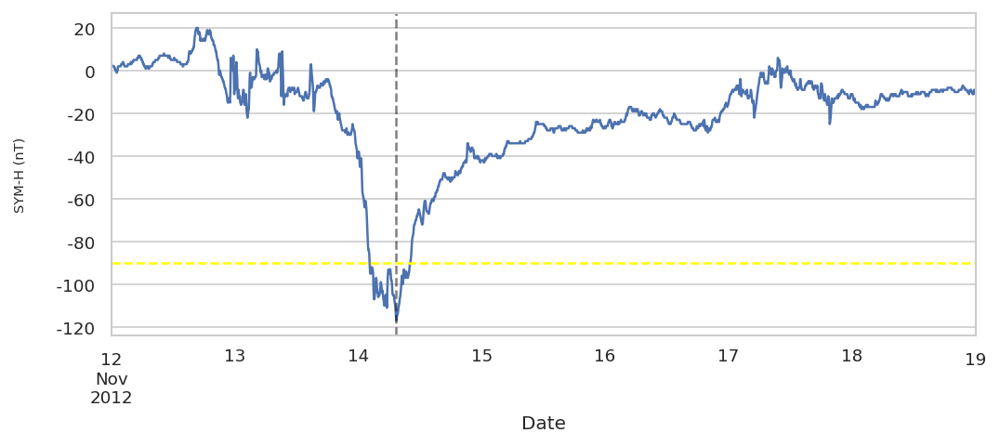

Plotting storm 247
Start date        2013-06-27 00:00:00
End date          2013-07-04 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -110
classification                    LOW
Name: 247, dtype: object
Minimum SYM-H value -110 at: 2013-06-29 06:30:00


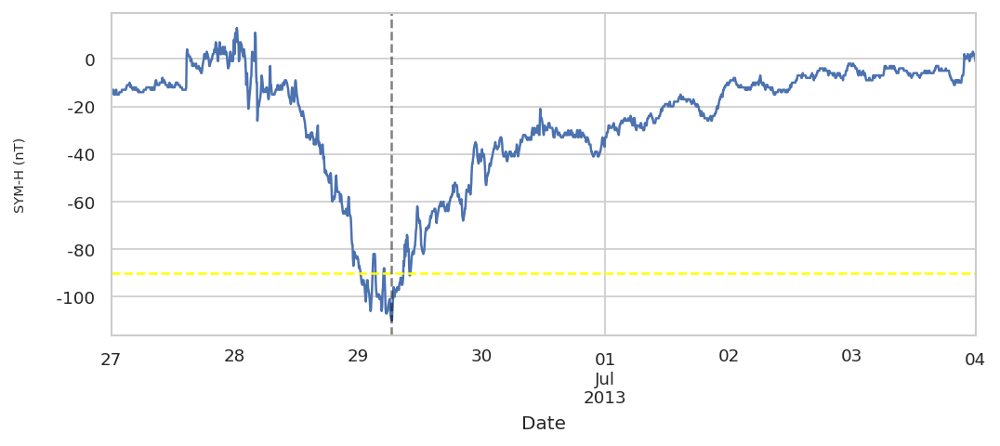

Plotting storm 248
Start date        2014-02-17 00:00:00
End date          2014-03-05 00:00:00
TD                   16 days 00:00:00
Min SYM-H                        -125
classification                    LOW
Name: 248, dtype: object
Minimum SYM-H value -125 at: 2014-02-19 08:20:00


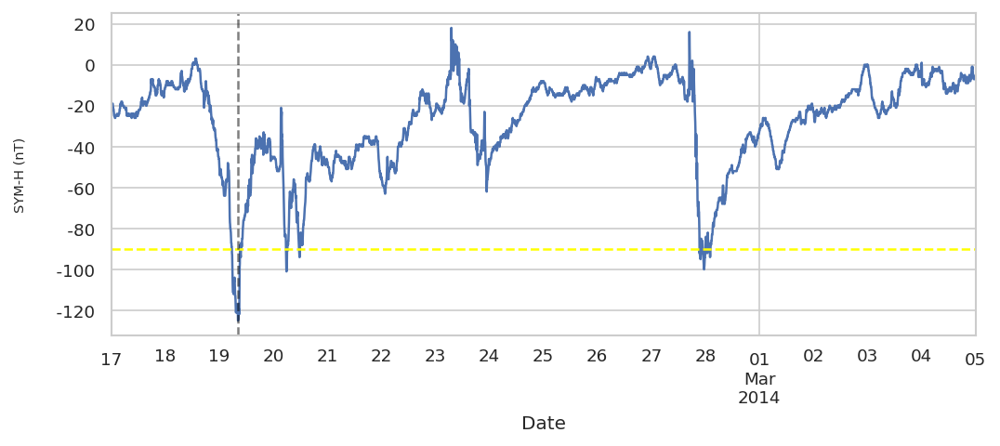

Plotting storm 249
Start date        2014-04-10 00:00:00
End date          2014-04-17 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -91
classification                    LOW
Name: 249, dtype: object
Minimum SYM-H value -91 at: 2014-04-12 08:25:00


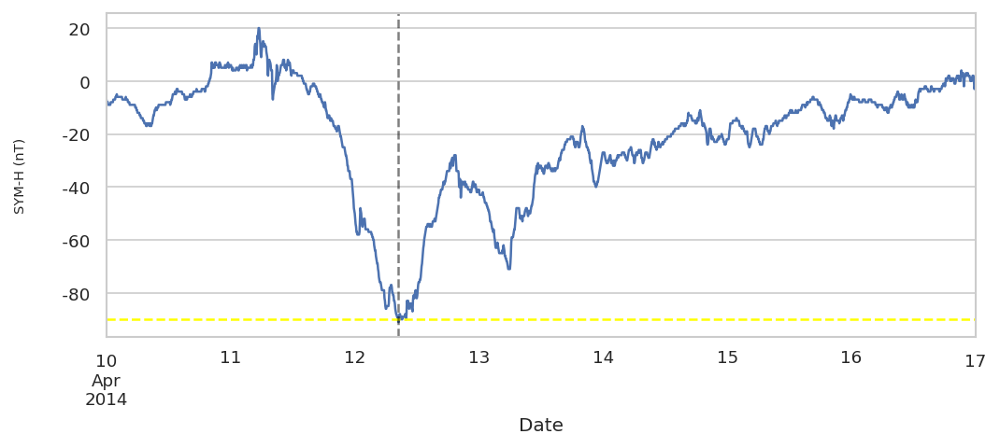

Plotting storm 250
Start date        2014-09-10 00:00:00
End date          2014-09-17 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -95
classification                    LOW
Name: 250, dtype: object
Minimum SYM-H value -95 at: 2014-09-12 23:05:00


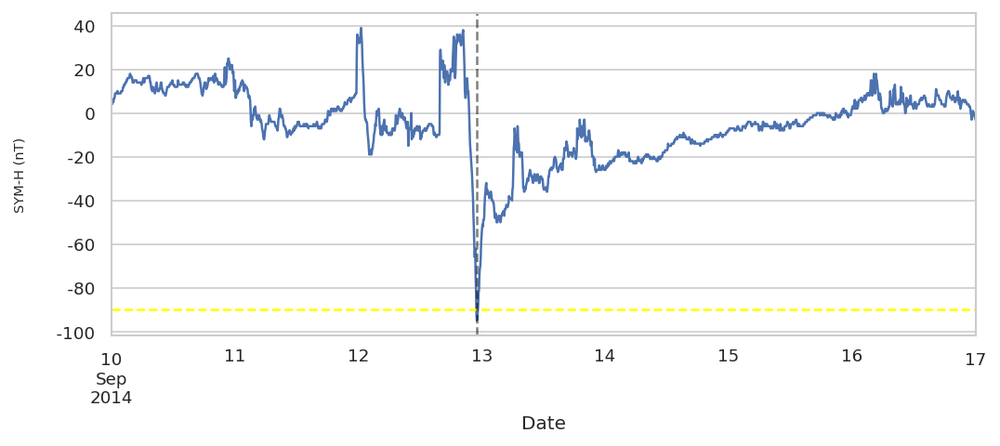

Plotting storm 253
Start date        2015-05-11 00:00:00
End date          2015-05-18 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -95
classification                    LOW
Name: 253, dtype: object
Minimum SYM-H value -95 at: 2015-05-13 06:45:00


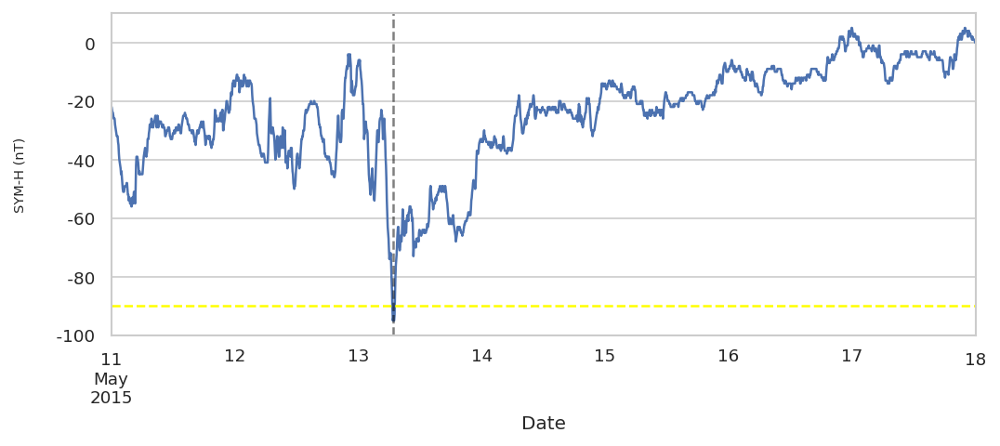

Plotting storm 254
Start date        2015-06-06 00:00:00
End date          2015-06-13 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -104
classification                    LOW
Name: 254, dtype: object
Minimum SYM-H value -104 at: 2015-06-08 07:45:00


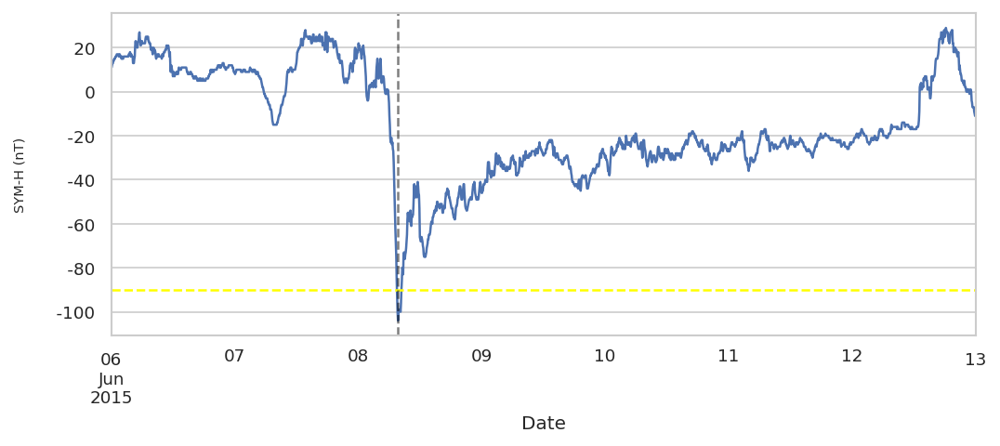

Plotting storm 256
Start date        2015-08-14 00:00:00
End date          2015-08-21 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -93
classification                    LOW
Name: 256, dtype: object
Minimum SYM-H value -93 at: 2015-08-16 07:30:00


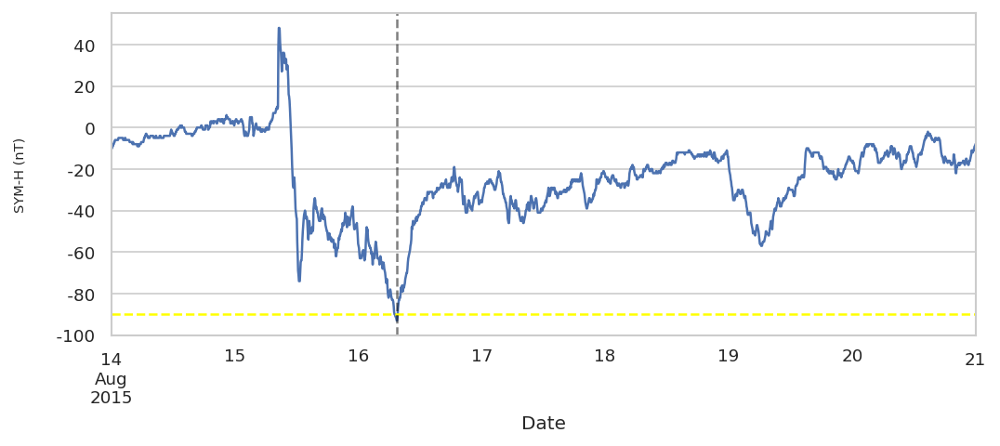

Plotting storm 257
Start date        2015-08-25 00:00:00
End date          2015-09-02 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -100
classification                    LOW
Name: 257, dtype: object
Minimum SYM-H value -100 at: 2015-08-27 20:30:00


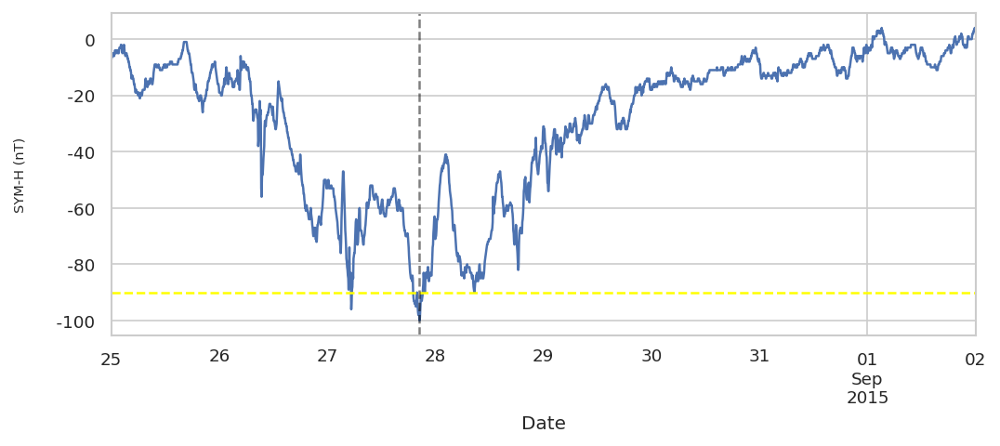

Plotting storm 258
Start date        2015-09-06 00:00:00
End date          2015-09-16 00:00:00
TD                   10 days 00:00:00
Min SYM-H                        -110
classification                    LOW
Name: 258, dtype: object
Minimum SYM-H value -110 at: 2015-09-09 08:00:00


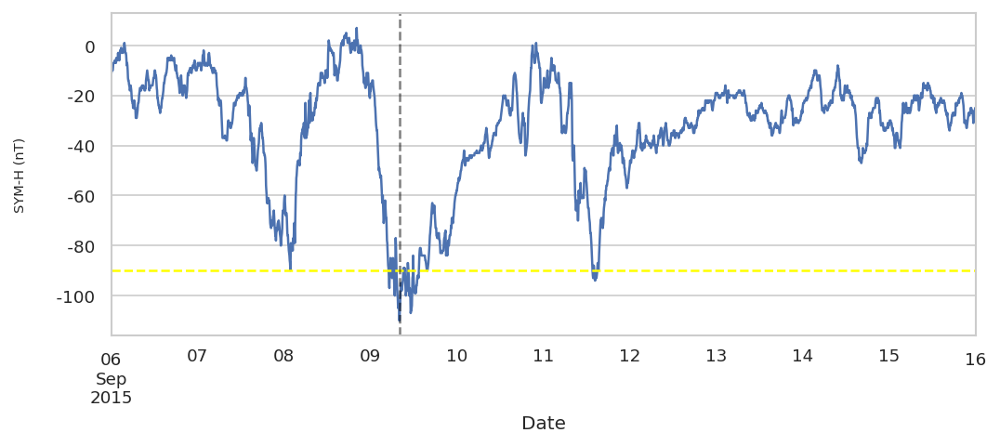

Plotting storm 259
Start date        2015-10-05 00:00:00
End date          2015-10-13 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -124
classification                    LOW
Name: 259, dtype: object
Minimum SYM-H value -124 at: 2015-10-07 22:25:00


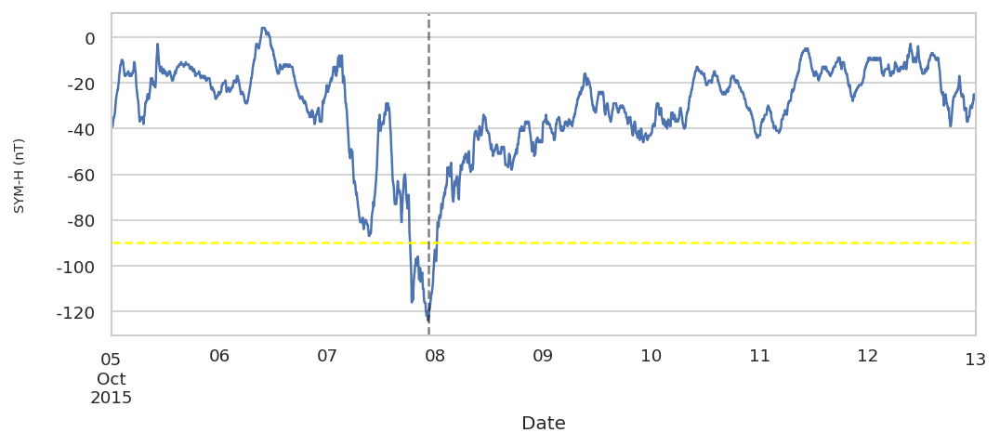

Plotting storm 260
Start date        2015-11-05 00:00:00
End date          2015-11-12 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -106
classification                    LOW
Name: 260, dtype: object
Minimum SYM-H value -106 at: 2015-11-07 06:05:00


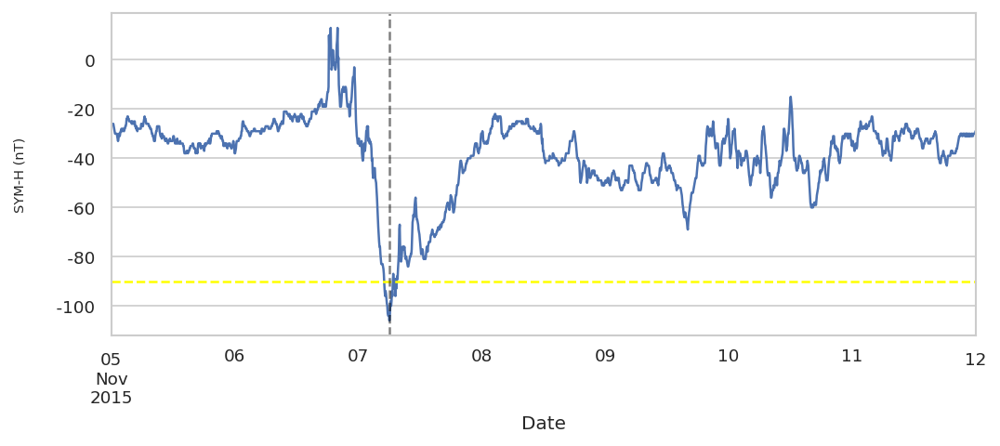

Plotting storm 262
Start date        2015-12-29 00:00:00
End date          2016-01-06 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -117
classification                    LOW
Name: 262, dtype: object
Minimum SYM-H value -117 at: 2016-01-01 01:05:00


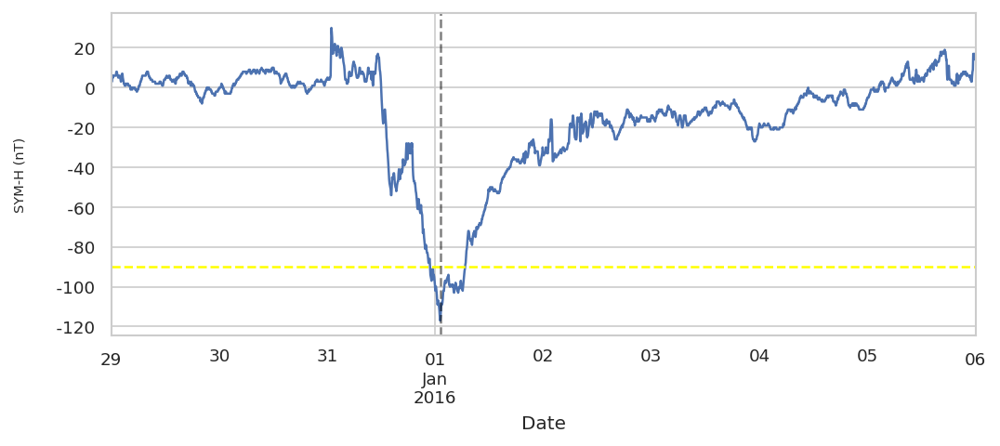

Plotting storm 263
Start date        2016-01-18 00:00:00
End date          2016-01-25 00:00:00
TD                    7 days 00:00:00
Min SYM-H                         -95
classification                    LOW
Name: 263, dtype: object
Minimum SYM-H value -95 at: 2016-01-20 17:05:00


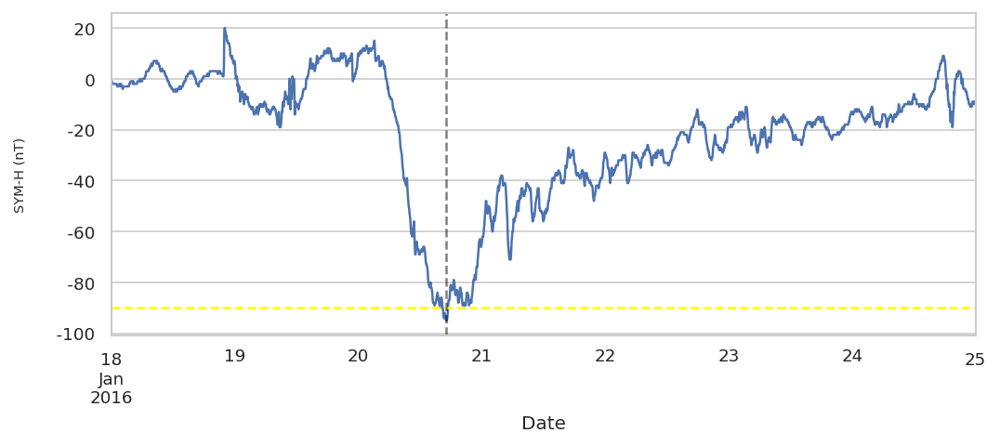

Plotting storm 264
Start date        2016-03-04 00:00:00
End date          2016-03-12 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -109
classification                    LOW
Name: 264, dtype: object
Minimum SYM-H value -109 at: 2016-03-06 21:20:00


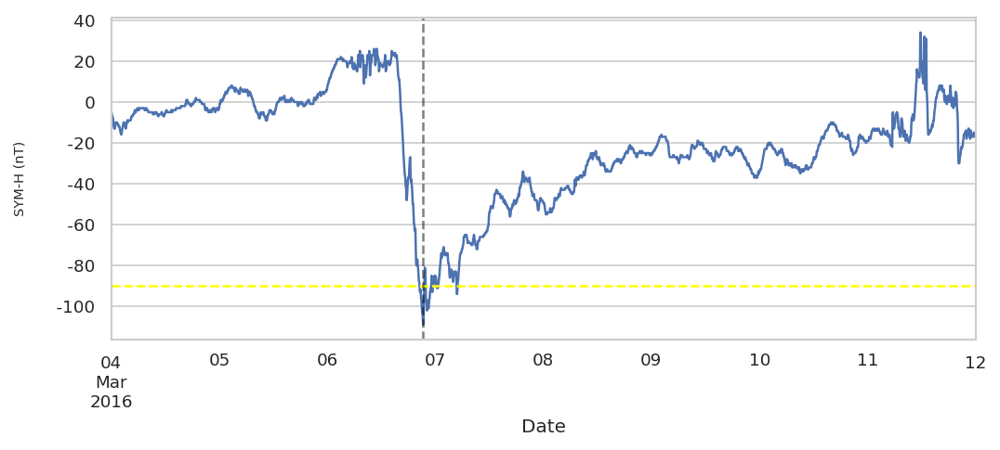

Plotting storm 265
Start date        2016-05-06 00:00:00
End date          2016-05-14 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -103
classification                    LOW
Name: 265, dtype: object
Minimum SYM-H value -103 at: 2016-05-08 08:15:00


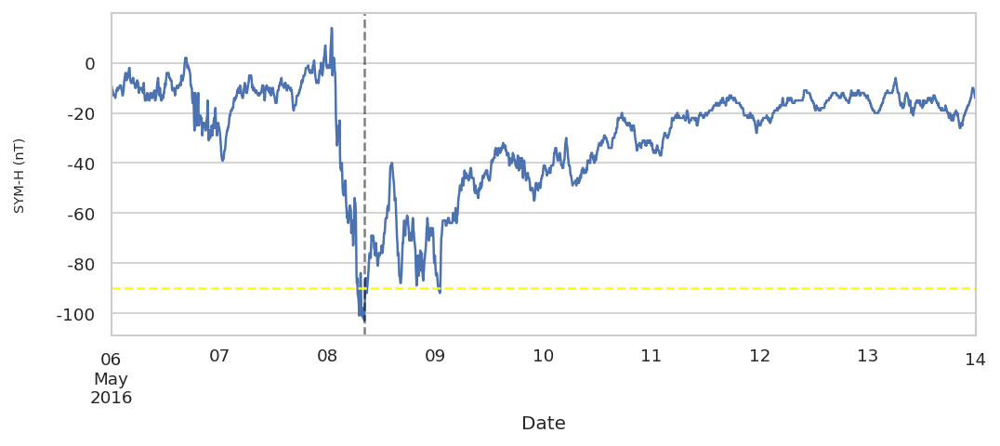

Plotting storm 266
Start date        2016-10-11 00:00:00
End date          2016-10-19 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -114
classification                    LOW
Name: 266, dtype: object
Minimum SYM-H value -114 at: 2016-10-13 23:45:00


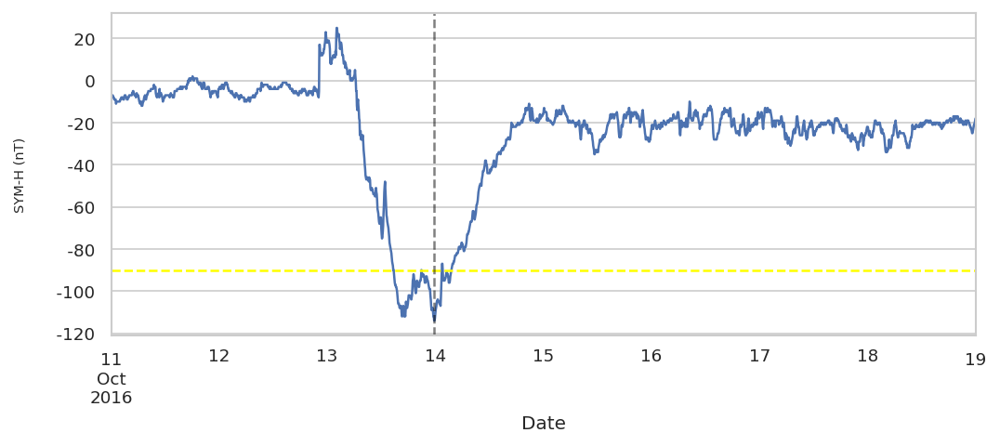

Plotting storm 271
Start date        2021-11-02 00:00:00
End date          2021-11-09 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -117
classification                    LOW
Name: 271, dtype: object
Minimum SYM-H value -117 at: 2021-11-04 12:40:00


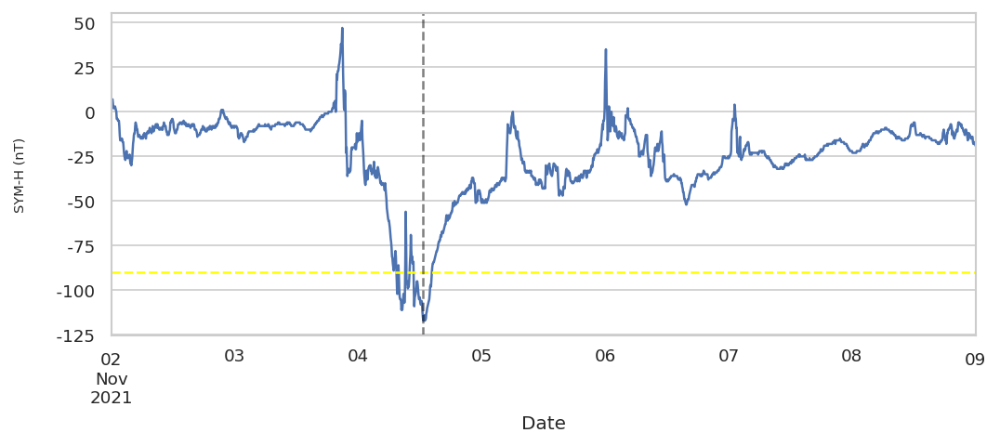

Plotting storm 272
Start date        2022-01-12 00:00:00
End date          2022-01-19 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -100
classification                    LOW
Name: 272, dtype: object
Minimum SYM-H value -100 at: 2022-01-14 22:15:00


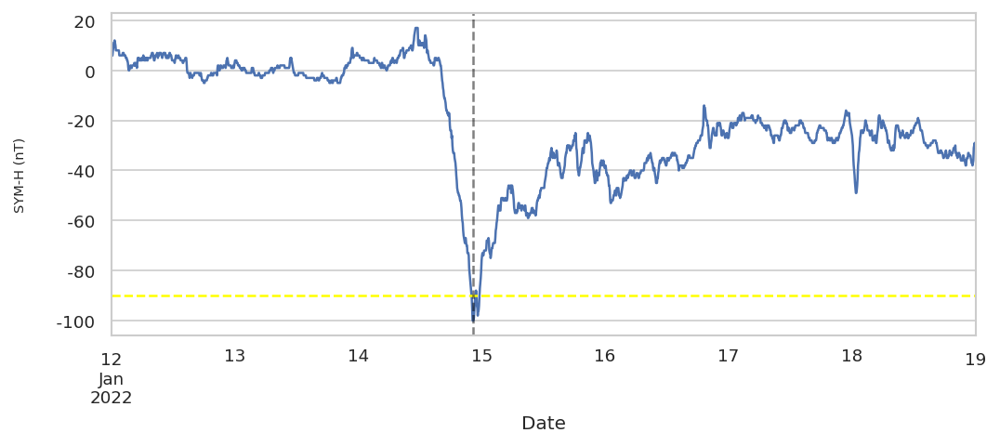

Plotting storm 273
Start date        2022-03-11 00:00:00
End date          2022-03-19 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -113
classification                    LOW
Name: 273, dtype: object
Minimum SYM-H value -113 at: 2022-03-13 23:35:00


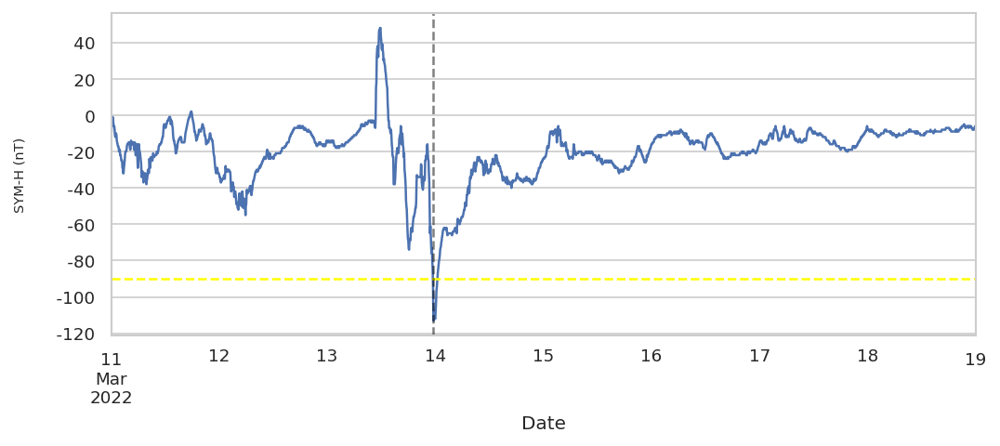

Plotting storm 274
Start date        2022-11-05 00:00:00
End date          2022-11-12 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -116
classification                    LOW
Name: 274, dtype: object
Minimum SYM-H value -116 at: 2022-11-07 17:20:00


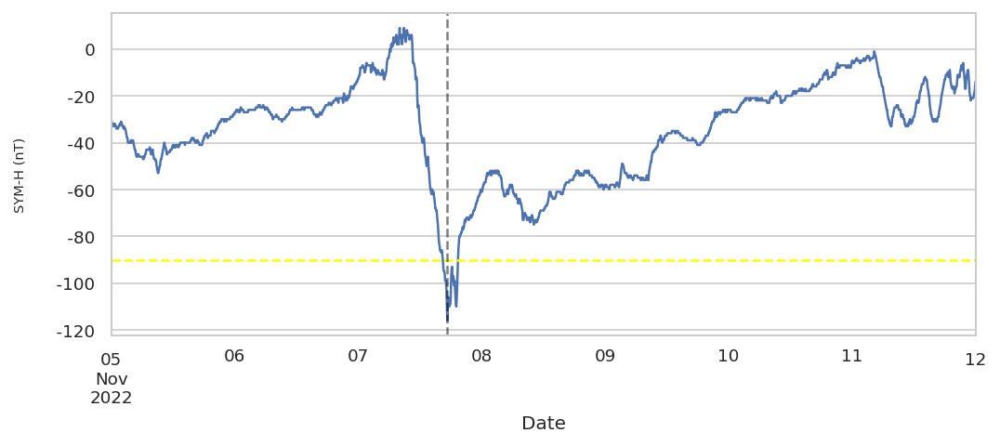

In [9]:
# Plot the storms of low intensity
# the yellow horizontal line corresponds to the low intensity threshold
print(f'{len(low_indices)} storms of low intensity')
for ix, ind in enumerate(low_indices):
    ax = utils.plot_storm_sym(dfx, summary_df_sym, ind)
    strm = utils.get_storm(dfx, summary_df_sym, ind)
    ax.axvline(strm['SYM_H'].idxmin(), linestyle = '--', color = 'black', alpha = 0.5)
    print(f'Minimum SYM-H value {strm["SYM_H"].min()} at: {strm["SYM_H"].idxmin()}')
    plt.show();

85 moderate storms
Plotting storm 0
Start date        1981-02-04 00:00:00
End date          1981-02-12 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -153
classification               MODERATE
Name: 0, dtype: object
Minimum SYM-H value -153 at: 1981-02-07 01:05:00


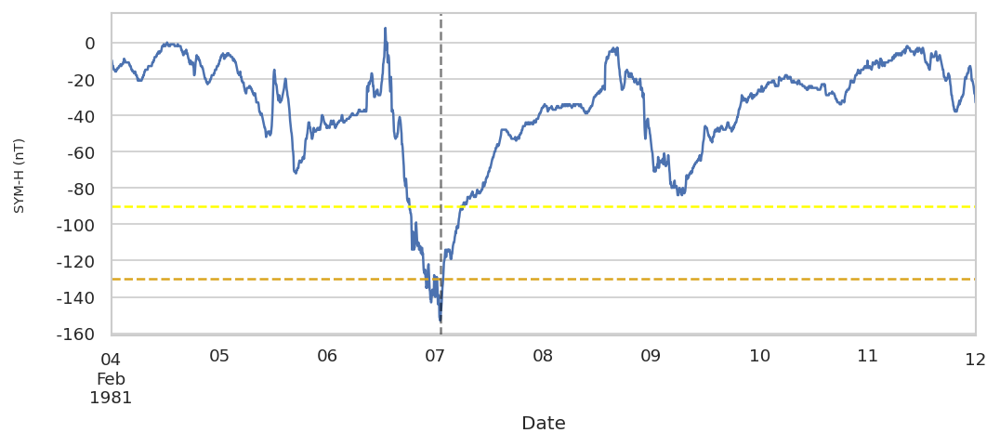

Plotting storm 4
Start date        1981-05-07 00:00:00
End date          1981-05-23 00:00:00
TD                   16 days 00:00:00
Min SYM-H                        -140
classification               MODERATE
Name: 4, dtype: object
Minimum SYM-H value -140 at: 1981-05-11 03:45:00


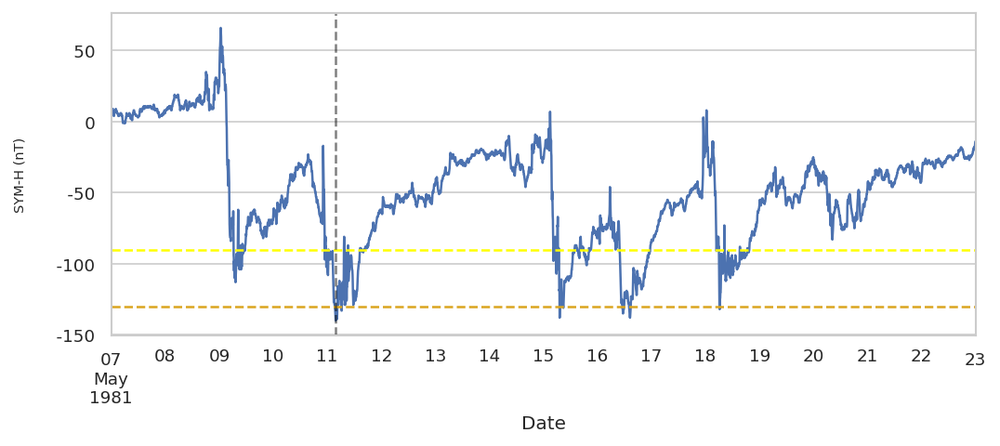

Plotting storm 8
Start date        1981-10-09 00:00:00
End date          1981-10-28 00:00:00
TD                   19 days 00:00:00
Min SYM-H                        -215
classification               MODERATE
Name: 8, dtype: object
Minimum SYM-H value -215 at: 1981-10-20 19:35:00


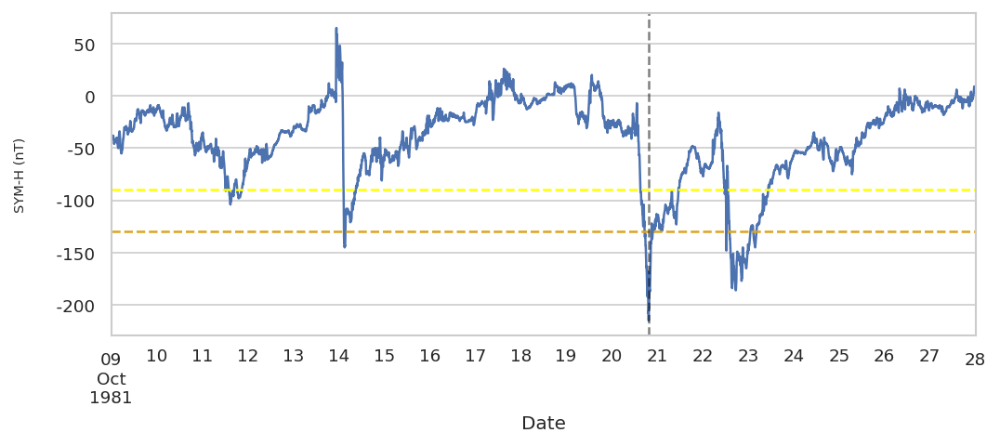

Plotting storm 9
Start date        1981-11-09 00:00:00
End date          1981-11-17 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -132
classification               MODERATE
Name: 9, dtype: object
Minimum SYM-H value -132 at: 1981-11-12 06:40:00


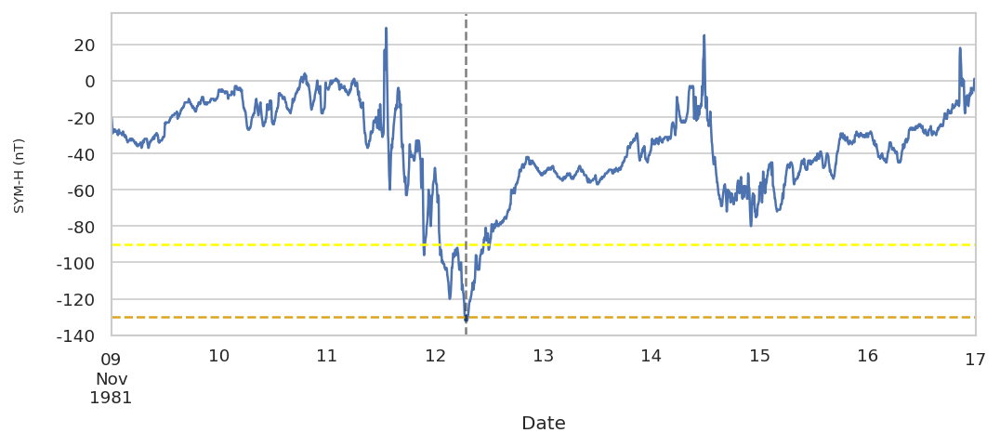

Plotting storm 12
Start date        1982-03-31 00:00:00
End date          1982-04-16 00:00:00
TD                   16 days 00:00:00
Min SYM-H                        -165
classification               MODERATE
Name: 12, dtype: object
Minimum SYM-H value -165 at: 1982-04-10 19:35:00


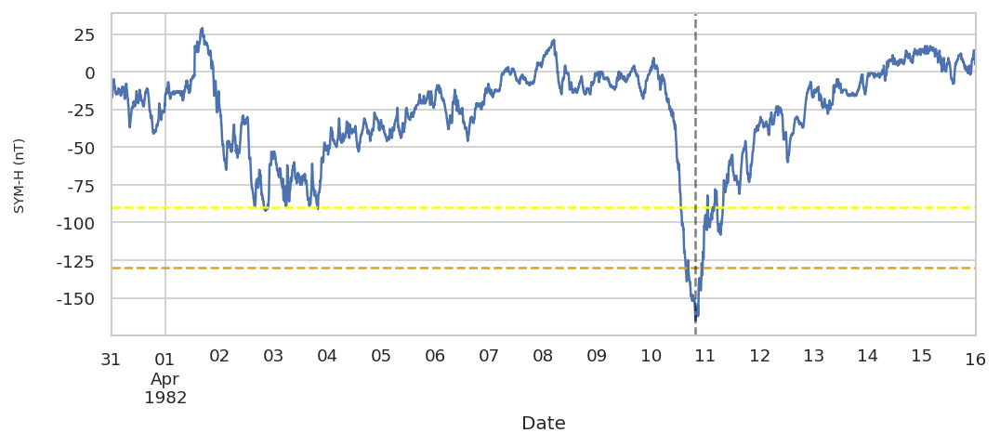

Plotting storm 15
Start date        1982-08-05 00:00:00
End date          1982-08-12 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -176
classification               MODERATE
Name: 15, dtype: object
Minimum SYM-H value -176 at: 1982-08-07 07:10:00


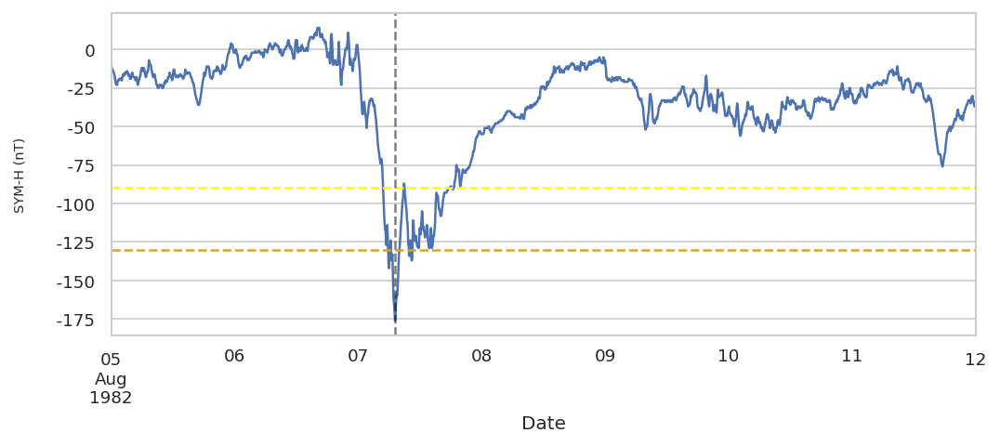

Plotting storm 17
Start date        1982-09-20 00:00:00
End date          1982-10-02 00:00:00
TD                   12 days 00:00:00
Min SYM-H                        -222
classification               MODERATE
Name: 17, dtype: object
Minimum SYM-H value -222 at: 1982-09-22 07:20:00


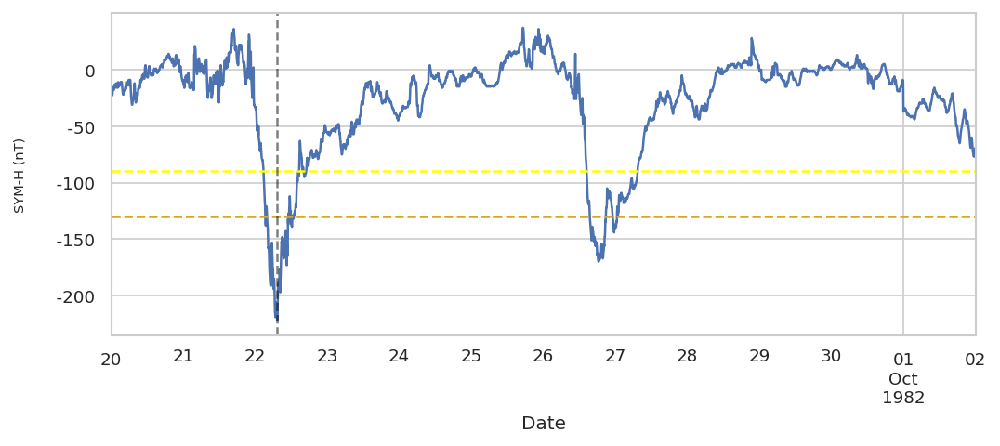

Plotting storm 19
Start date        1982-11-20 00:00:00
End date          1982-12-04 00:00:00
TD                   14 days 00:00:00
Min SYM-H                        -223
classification               MODERATE
Name: 19, dtype: object
Minimum SYM-H value -223 at: 1982-11-24 17:05:00


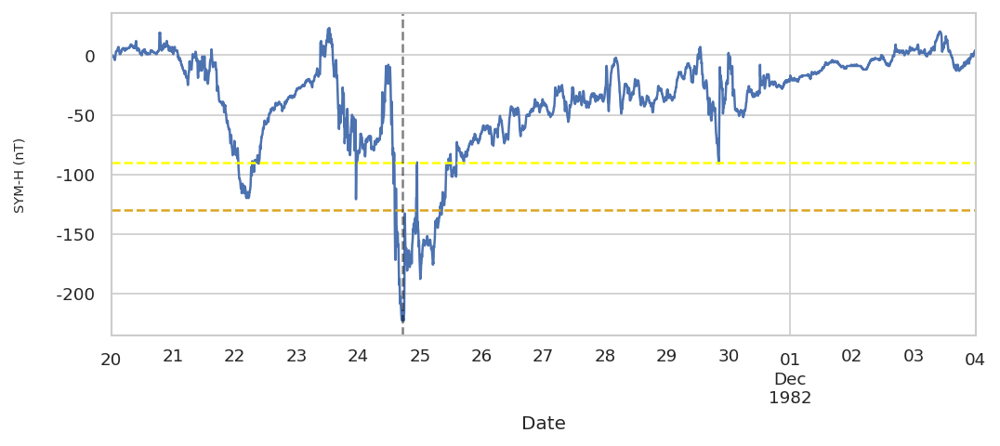

Plotting storm 22
Start date        1983-01-08 00:00:00
End date          1983-01-15 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -221
classification               MODERATE
Name: 22, dtype: object
Minimum SYM-H value -221 at: 1983-01-10 05:45:00


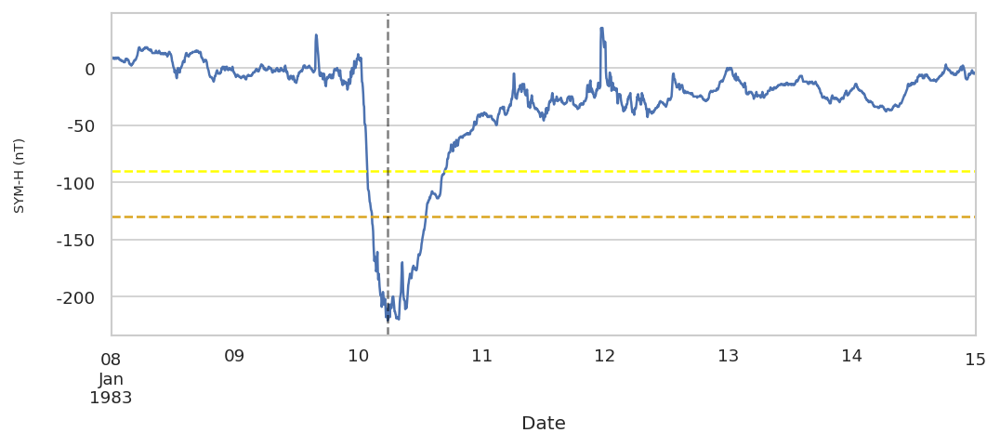

Plotting storm 23
Start date        1983-02-02 00:00:00
End date          1983-02-12 00:00:00
TD                   10 days 00:00:00
Min SYM-H                        -202
classification               MODERATE
Name: 23, dtype: object
Minimum SYM-H value -202 at: 1983-02-04 18:50:00


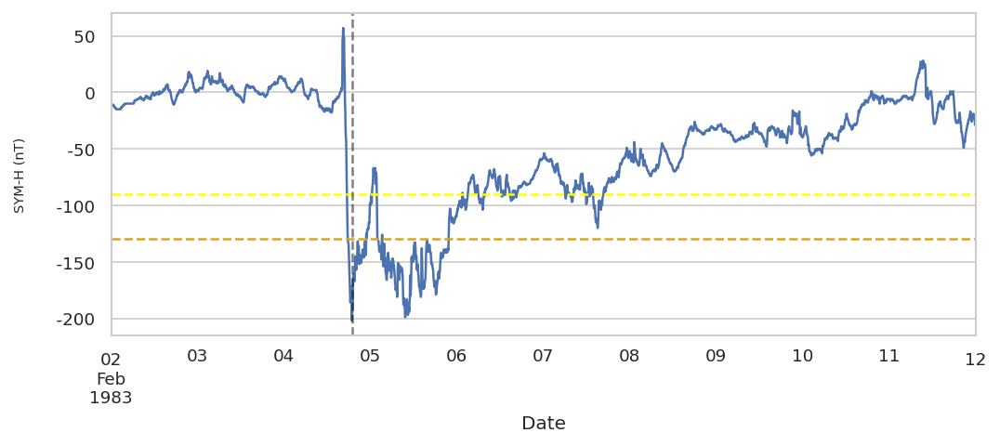

Plotting storm 25
Start date        1983-02-28 00:00:00
End date          1983-03-08 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -211
classification               MODERATE
Name: 25, dtype: object
Minimum SYM-H value -211 at: 1983-03-02 07:20:00


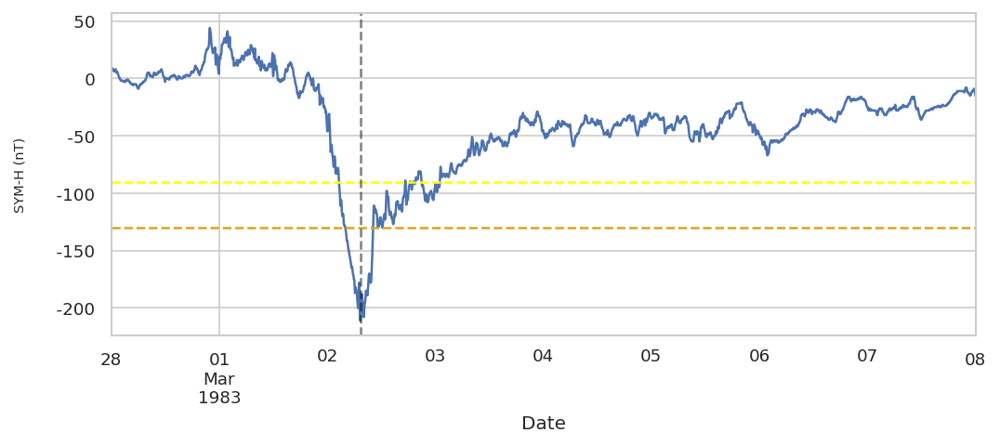

Plotting storm 28
Start date        1983-05-15 00:00:00
End date          1983-05-29 00:00:00
TD                   14 days 00:00:00
Min SYM-H                        -131
classification               MODERATE
Name: 28, dtype: object
Minimum SYM-H value -131 at: 1983-05-24 18:25:00


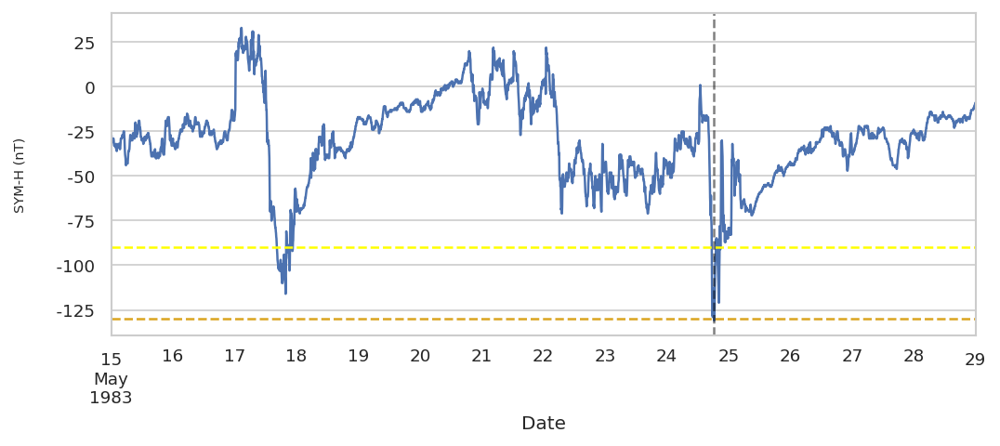

Plotting storm 29
Start date        1983-06-11 00:00:00
End date          1983-06-18 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -133
classification               MODERATE
Name: 29, dtype: object
Minimum SYM-H value -133 at: 1983-06-13 08:05:00


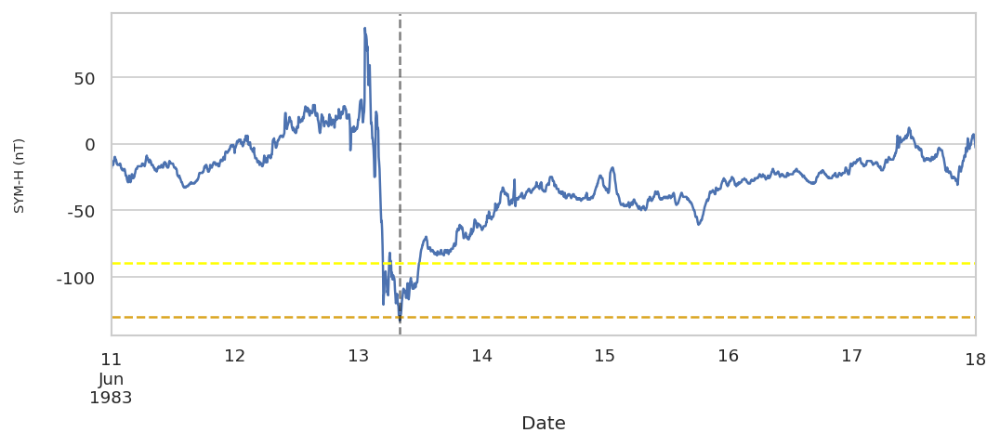

Plotting storm 30
Start date        1983-08-06 00:00:00
End date          1983-08-13 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -154
classification               MODERATE
Name: 30, dtype: object
Minimum SYM-H value -154 at: 1983-08-08 06:35:00


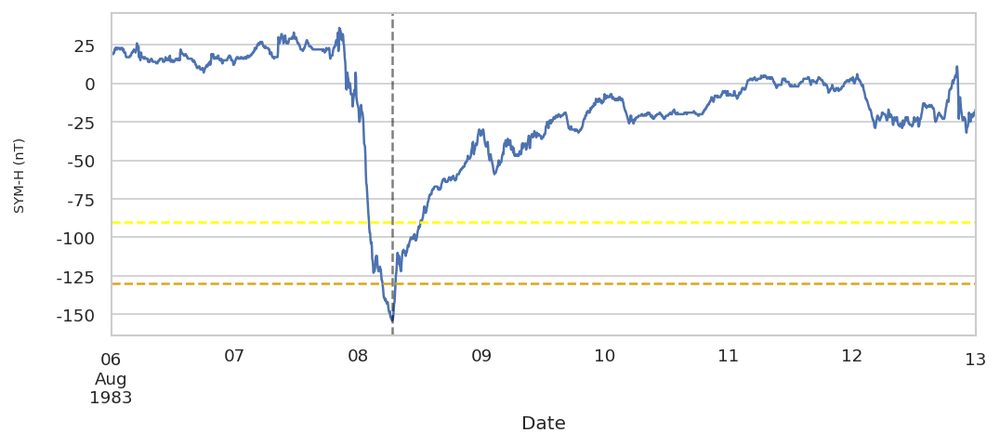

Plotting storm 38
Start date        1984-07-30 00:00:00
End date          1984-08-06 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -144
classification               MODERATE
Name: 38, dtype: object
Minimum SYM-H value -144 at: 1984-08-01 06:50:00


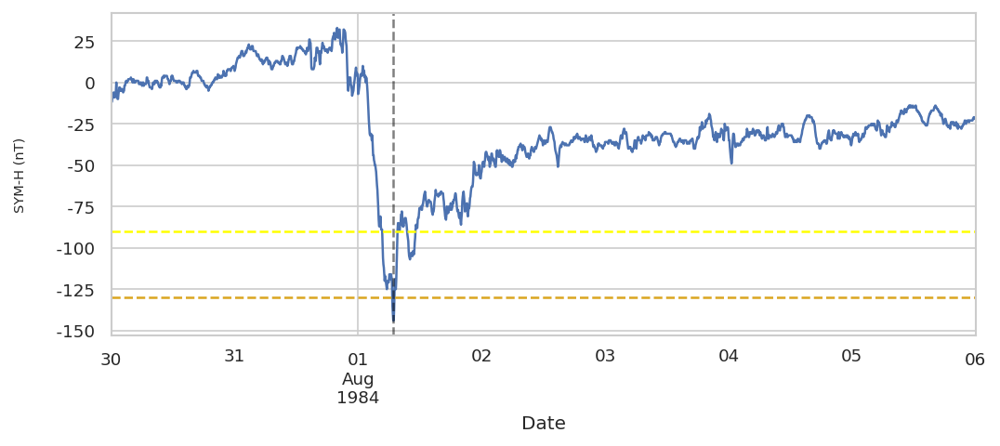

Plotting storm 39
Start date        1984-09-03 00:00:00
End date          1984-09-10 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -135
classification               MODERATE
Name: 39, dtype: object
Minimum SYM-H value -135 at: 1984-09-05 06:50:00


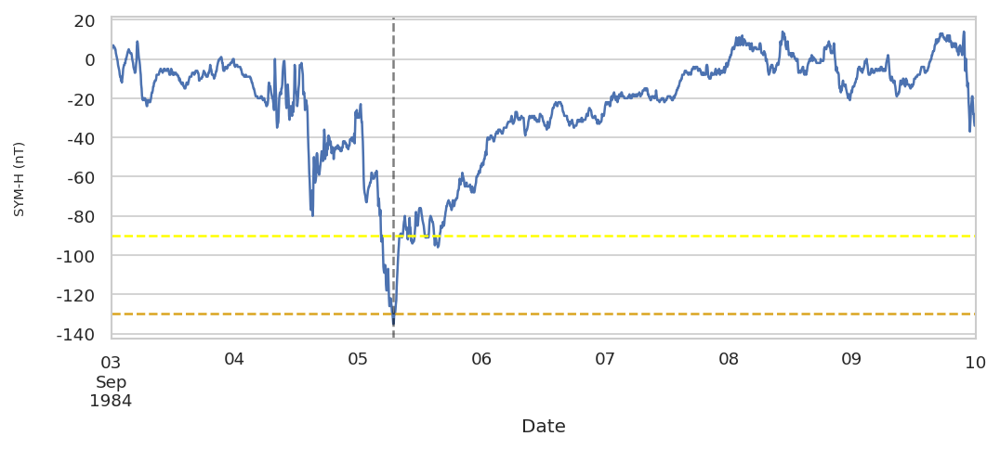

Plotting storm 42
Start date        1984-11-13 00:00:00
End date          1984-11-21 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -155
classification               MODERATE
Name: 42, dtype: object
Minimum SYM-H value -155 at: 1984-11-16 07:25:00


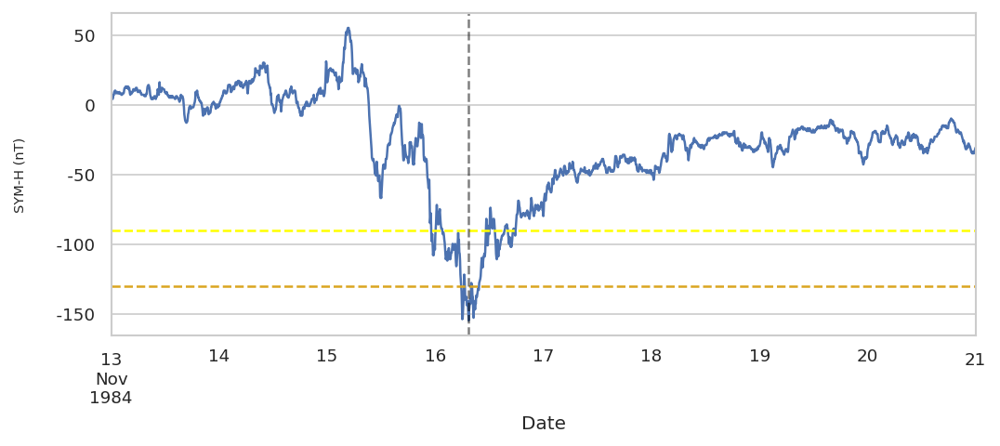

Plotting storm 45
Start date        1985-04-18 00:00:00
End date          1985-05-07 00:00:00
TD                   19 days 00:00:00
Min SYM-H                        -215
classification               MODERATE
Name: 45, dtype: object
Minimum SYM-H value -215 at: 1985-04-21 08:20:00


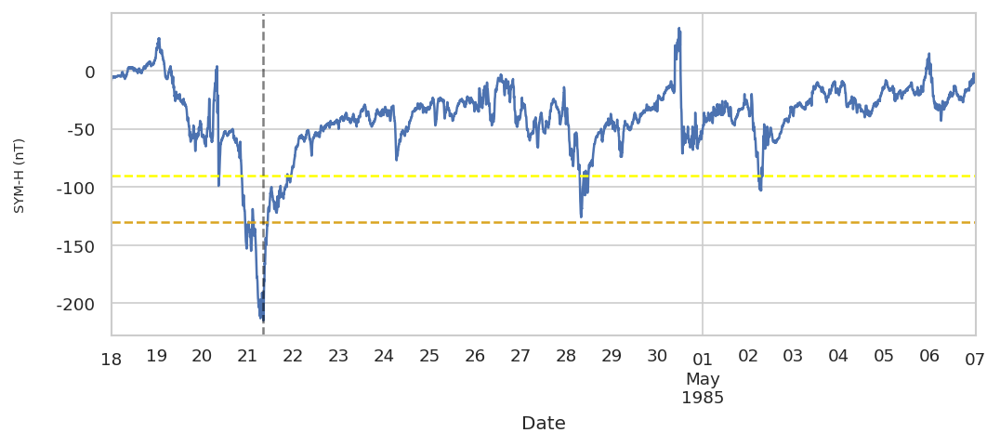

Plotting storm 46
Start date        1985-11-27 00:00:00
End date          1985-12-05 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -171
classification               MODERATE
Name: 46, dtype: object
Minimum SYM-H value -171 at: 1985-11-30 01:30:00


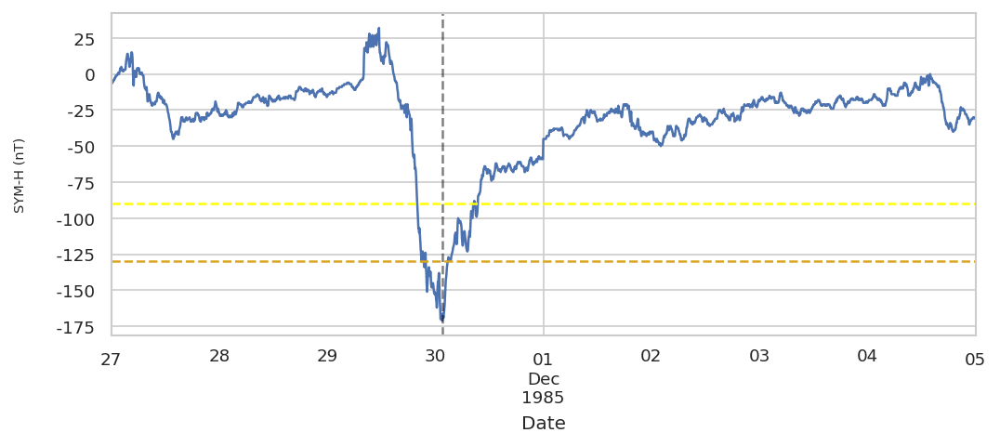

Plotting storm 49
Start date        1986-09-10 00:00:00
End date          1986-09-18 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -226
classification               MODERATE
Name: 49, dtype: object
Minimum SYM-H value -226 at: 1986-09-12 04:55:00


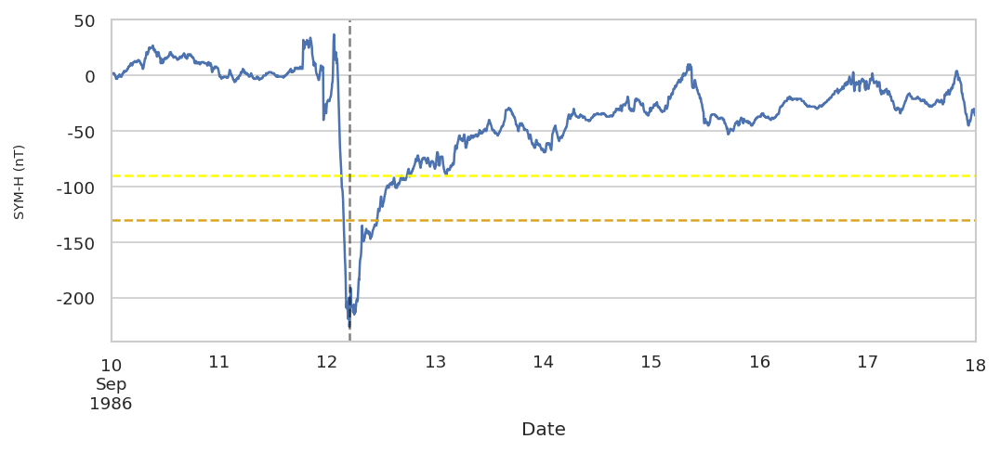

Plotting storm 56
Start date        1988-01-12 00:00:00
End date          1988-01-20 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -171
classification               MODERATE
Name: 56, dtype: object
Minimum SYM-H value -171 at: 1988-01-15 04:05:00


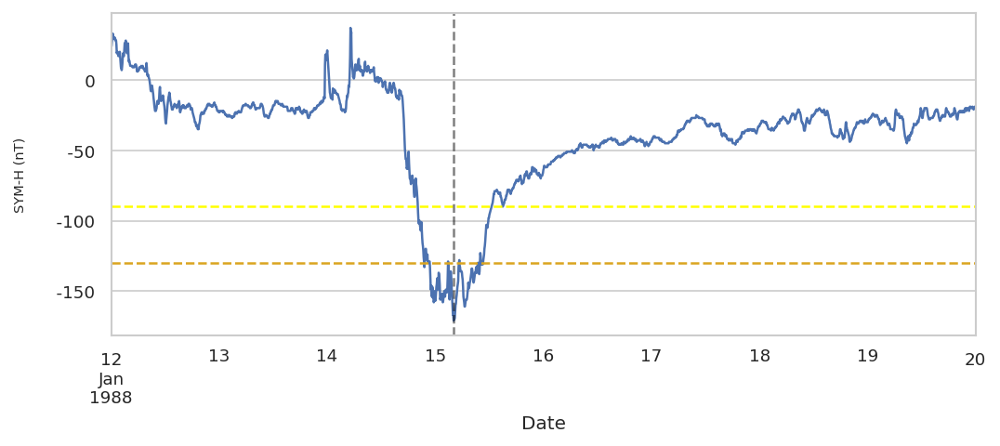

Plotting storm 57
Start date        1988-02-20 00:00:00
End date          1988-02-28 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -146
classification               MODERATE
Name: 57, dtype: object
Minimum SYM-H value -146 at: 1988-02-22 16:30:00


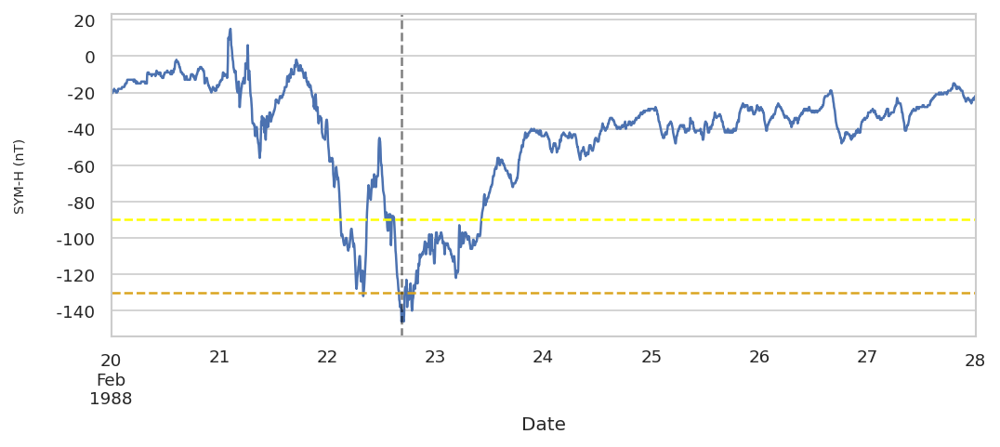

Plotting storm 58
Start date        1988-03-24 00:00:00
End date          1988-04-11 00:00:00
TD                   18 days 00:00:00
Min SYM-H                        -171
classification               MODERATE
Name: 58, dtype: object
Minimum SYM-H value -171 at: 1988-03-26 22:00:00


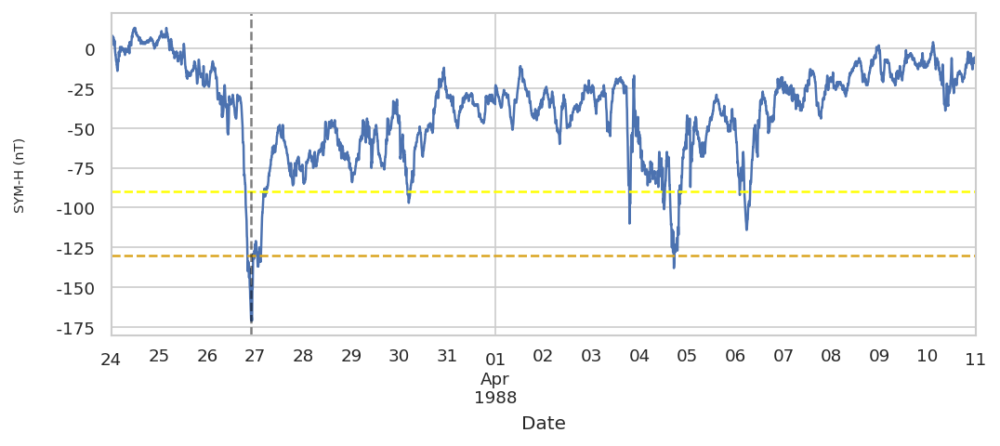

Plotting storm 60
Start date        1988-05-04 00:00:00
End date          1988-05-11 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -199
classification               MODERATE
Name: 60, dtype: object
Minimum SYM-H value -199 at: 1988-05-06 10:50:00


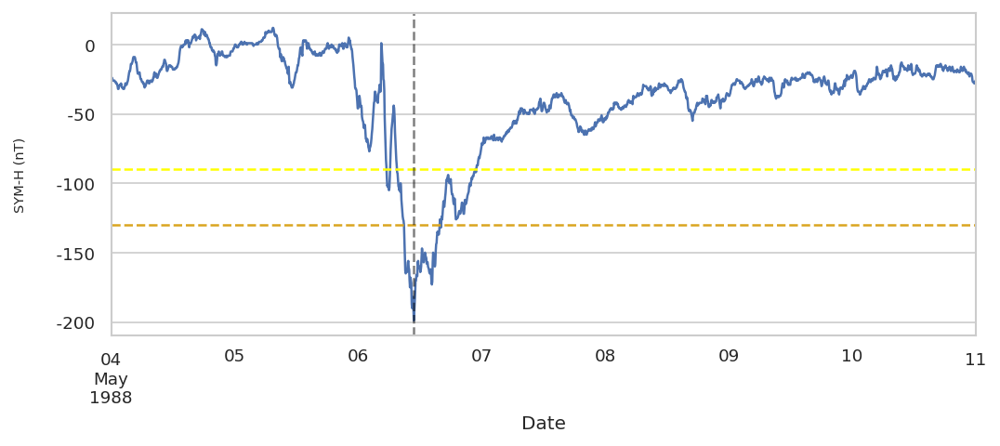

Plotting storm 62
Start date        1988-10-04 00:00:00
End date          1988-10-16 00:00:00
TD                   12 days 00:00:00
Min SYM-H                        -176
classification               MODERATE
Name: 62, dtype: object
Minimum SYM-H value -176 at: 1988-10-10 12:50:00


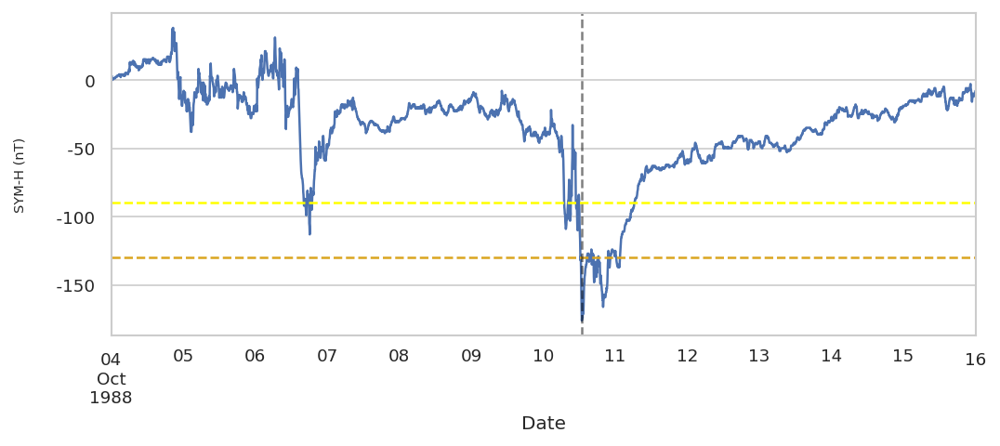

Plotting storm 65
Start date        1989-01-09 00:00:00
End date          1989-01-26 00:00:00
TD                   17 days 00:00:00
Min SYM-H                        -146
classification               MODERATE
Name: 65, dtype: object
Minimum SYM-H value -146 at: 1989-01-11 19:10:00


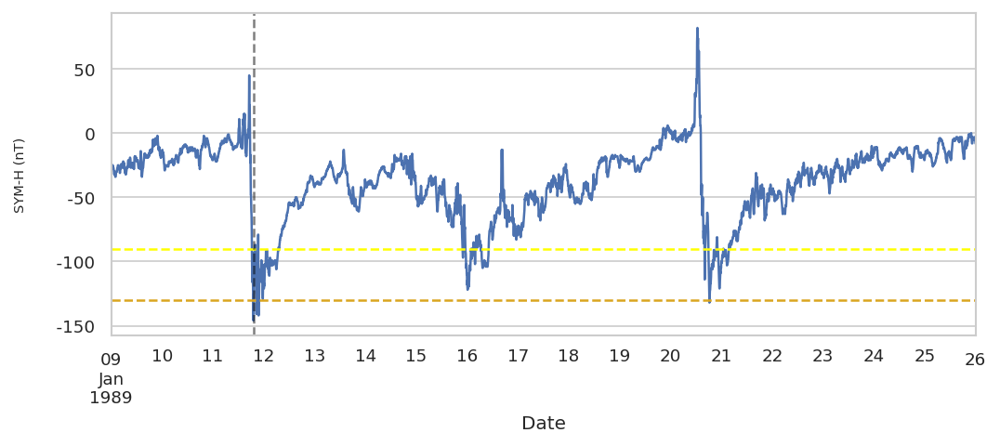

Plotting storm 69
Start date        1989-04-23 00:00:00
End date          1989-05-02 00:00:00
TD                    9 days 00:00:00
Min SYM-H                        -159
classification               MODERATE
Name: 69, dtype: object
Minimum SYM-H value -159 at: 1989-04-26 05:50:00


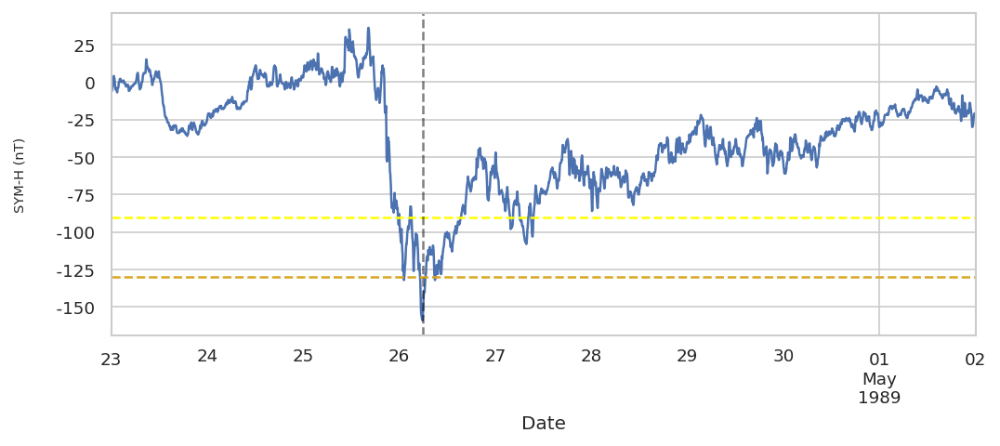

Plotting storm 72
Start date        1989-06-05 00:00:00
End date          1989-06-19 00:00:00
TD                   14 days 00:00:00
Min SYM-H                        -138
classification               MODERATE
Name: 72, dtype: object
Minimum SYM-H value -138 at: 1989-06-10 15:50:00


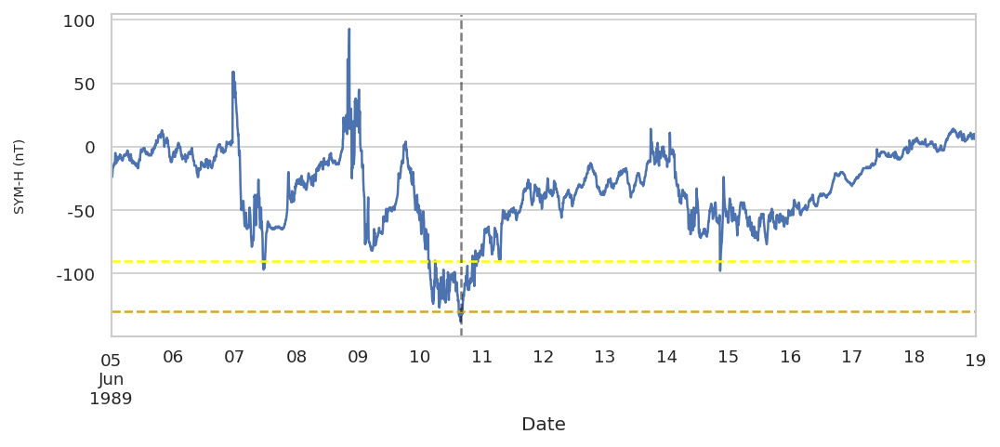

Plotting storm 73
Start date        1989-08-08 00:00:00
End date          1989-09-03 00:00:00
TD                   26 days 00:00:00
Min SYM-H                        -185
classification               MODERATE
Name: 73, dtype: object
Minimum SYM-H value -185 at: 1989-08-29 04:40:00


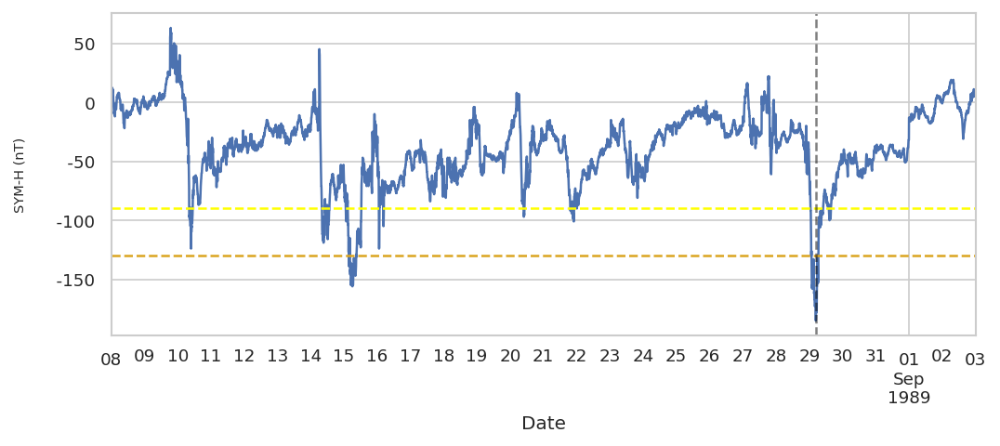

Plotting storm 80
Start date        1990-03-10 00:00:00
End date          1990-03-18 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -179
classification               MODERATE
Name: 80, dtype: object
Minimum SYM-H value -179 at: 1990-03-12 23:55:00


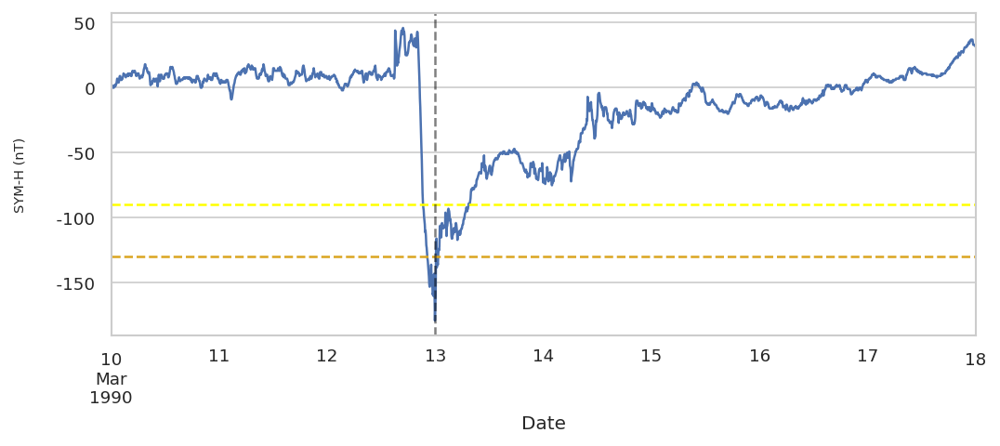

Plotting storm 81
Start date        1990-03-19 00:00:00
End date          1990-04-04 00:00:00
TD                   16 days 00:00:00
Min SYM-H                        -191
classification               MODERATE
Name: 81, dtype: object
Minimum SYM-H value -191 at: 1990-03-30 11:25:00


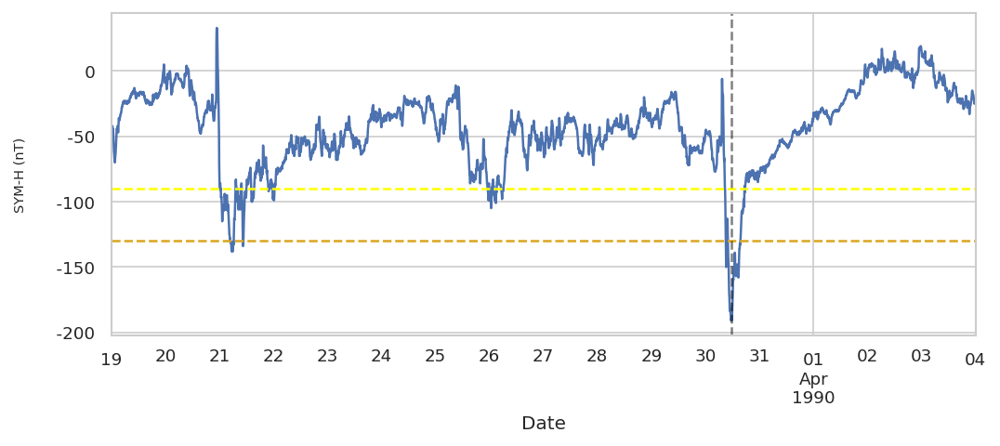

Plotting storm 84
Start date        1990-06-10 00:00:00
End date          1990-06-19 00:00:00
TD                    9 days 00:00:00
Min SYM-H                        -160
classification               MODERATE
Name: 84, dtype: object
Minimum SYM-H value -160 at: 1990-06-13 03:20:00


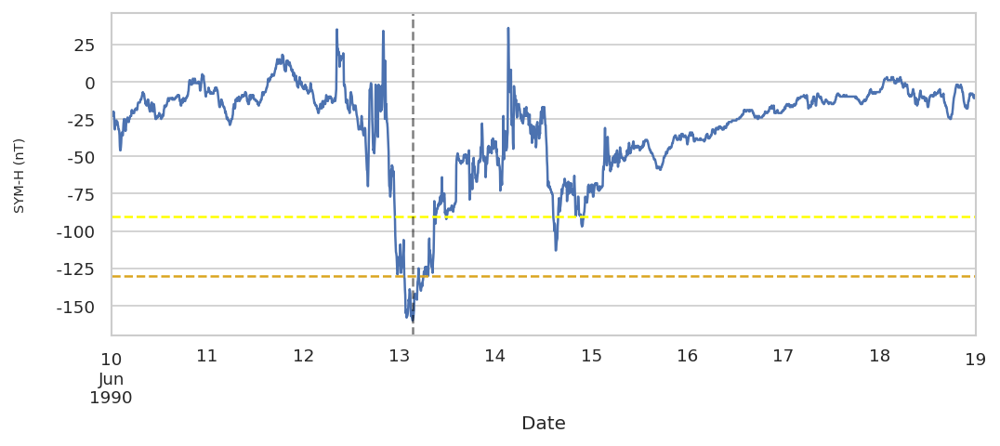

Plotting storm 85
Start date        1990-07-26 00:00:00
End date          1990-08-03 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -163
classification               MODERATE
Name: 85, dtype: object
Minimum SYM-H value -163 at: 1990-07-29 07:35:00


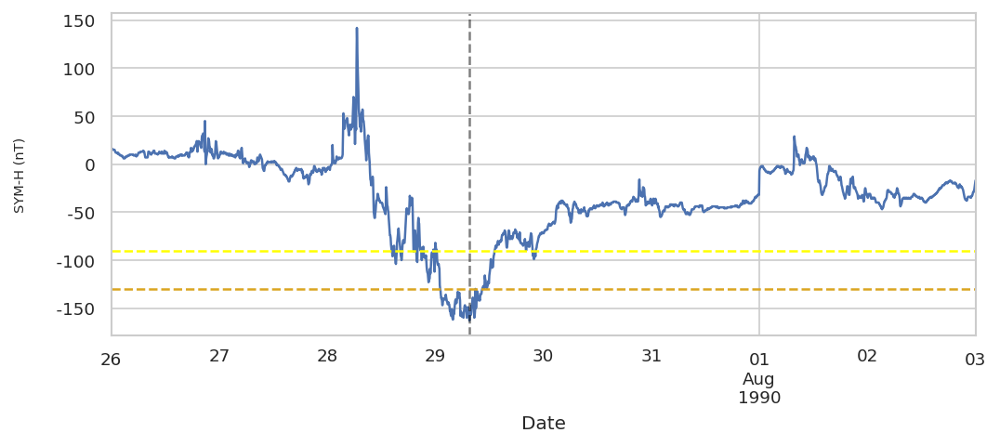

Plotting storm 87
Start date        1990-10-08 00:00:00
End date          1990-10-15 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -164
classification               MODERATE
Name: 87, dtype: object
Minimum SYM-H value -164 at: 1990-10-10 08:15:00


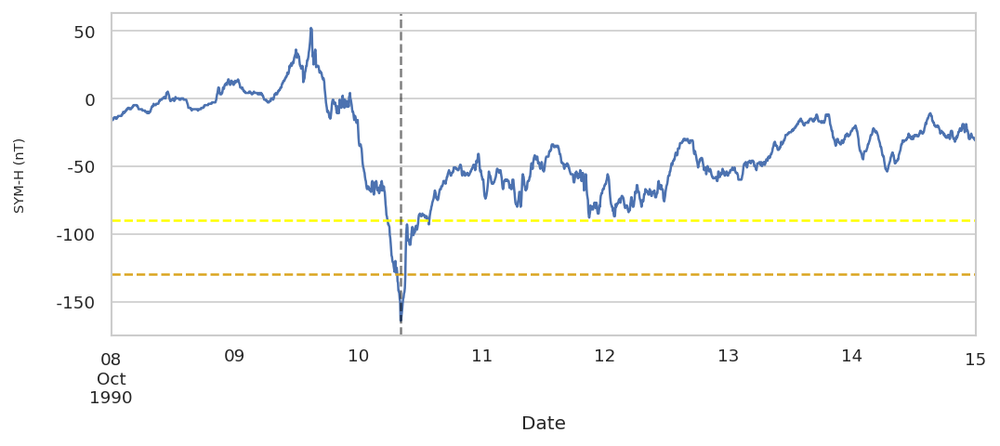

Plotting storm 88
Start date        1990-11-25 00:00:00
End date          1990-12-03 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -157
classification               MODERATE
Name: 88, dtype: object
Minimum SYM-H value -157 at: 1990-11-27 21:10:00


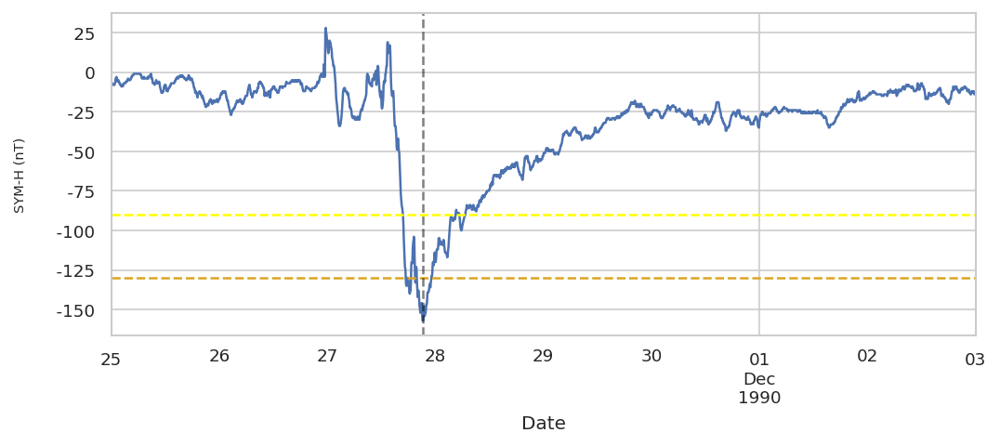

Plotting storm 92
Start date        1991-05-29 00:00:00
End date          1991-06-18 00:00:00
TD                   20 days 00:00:00
Min SYM-H                        -227
classification               MODERATE
Name: 92, dtype: object
Minimum SYM-H value -227 at: 1991-06-05 16:55:00


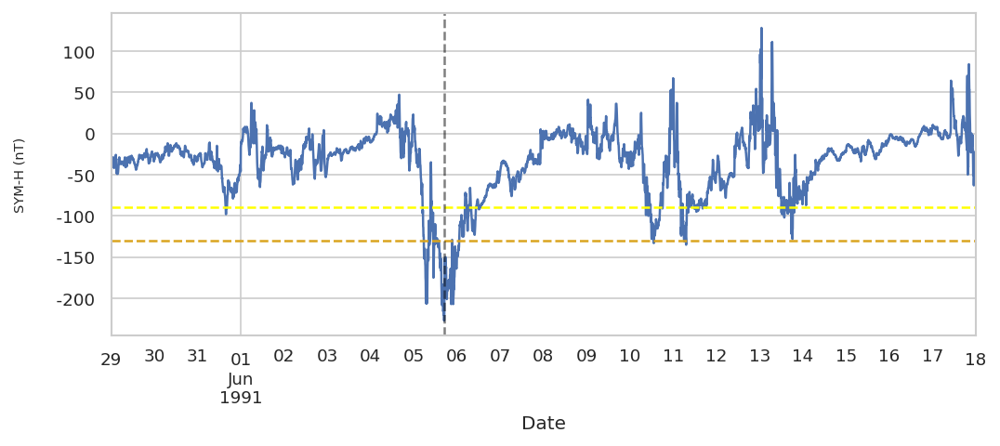

Plotting storm 95
Start date        1991-08-10 00:00:00
End date          1991-08-27 00:00:00
TD                   17 days 00:00:00
Min SYM-H                        -166
classification               MODERATE
Name: 95, dtype: object
Minimum SYM-H value -166 at: 1991-08-19 08:05:00


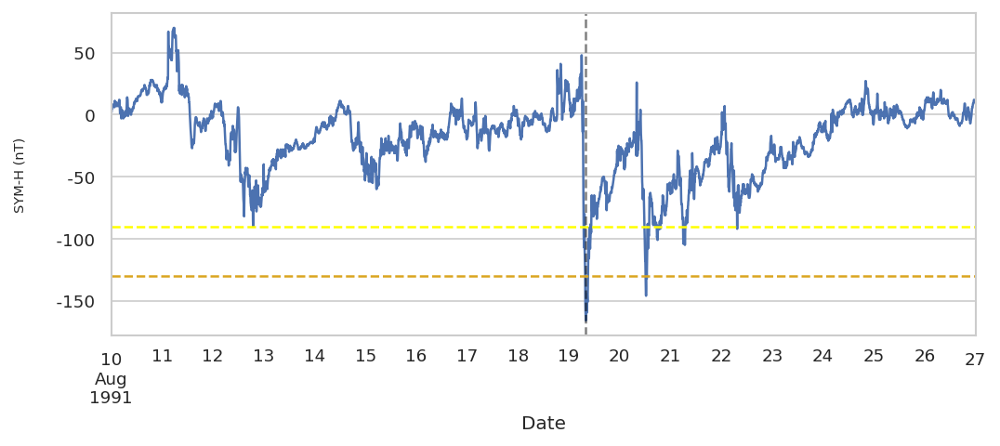

Plotting storm 98
Start date        1991-09-23 00:00:00
End date          1991-10-13 00:00:00
TD                   20 days 00:00:00
Min SYM-H                        -176
classification               MODERATE
Name: 98, dtype: object
Minimum SYM-H value -176 at: 1991-10-01 23:10:00


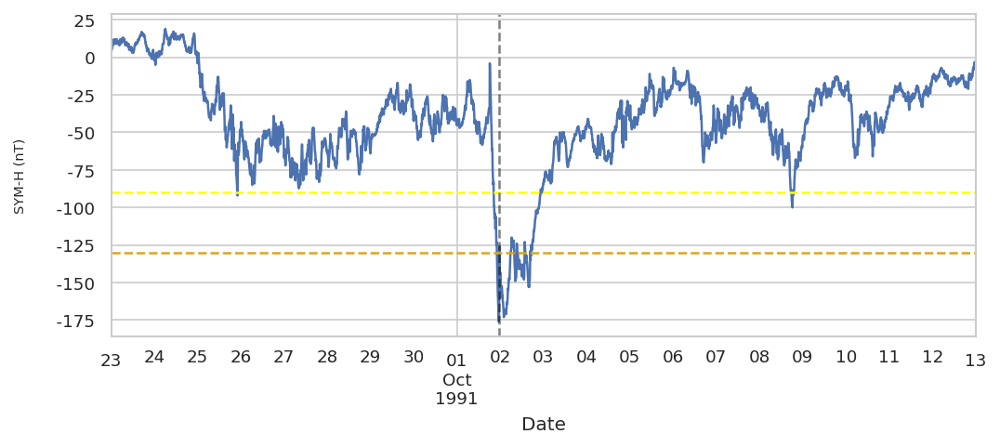

Plotting storm 102
Start date        1992-01-31 00:00:00
End date          1992-02-15 00:00:00
TD                   15 days 00:00:00
Min SYM-H                        -217
classification               MODERATE
Name: 102, dtype: object
Minimum SYM-H value -217 at: 1992-02-09 08:30:00


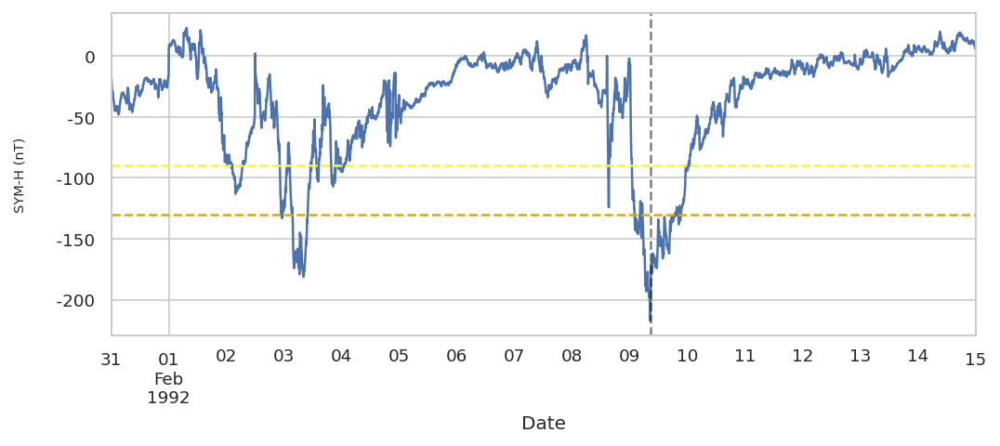

Plotting storm 103
Start date        1992-02-18 00:00:00
End date          1992-03-05 00:00:00
TD                   16 days 00:00:00
Min SYM-H                        -216
classification               MODERATE
Name: 103, dtype: object
Minimum SYM-H value -216 at: 1992-02-21 07:55:00


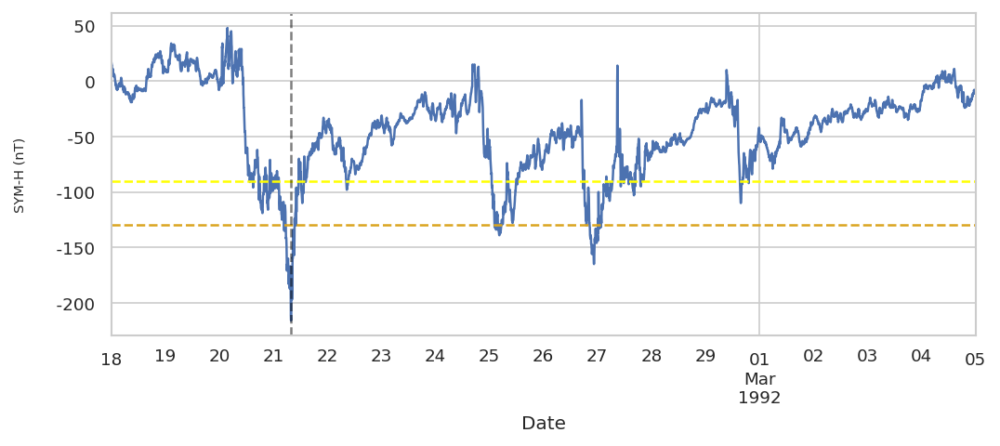

Plotting storm 111
Start date        1992-08-21 00:00:00
End date          1992-08-28 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -148
classification               MODERATE
Name: 111, dtype: object
Minimum SYM-H value -148 at: 1992-08-23 02:50:00


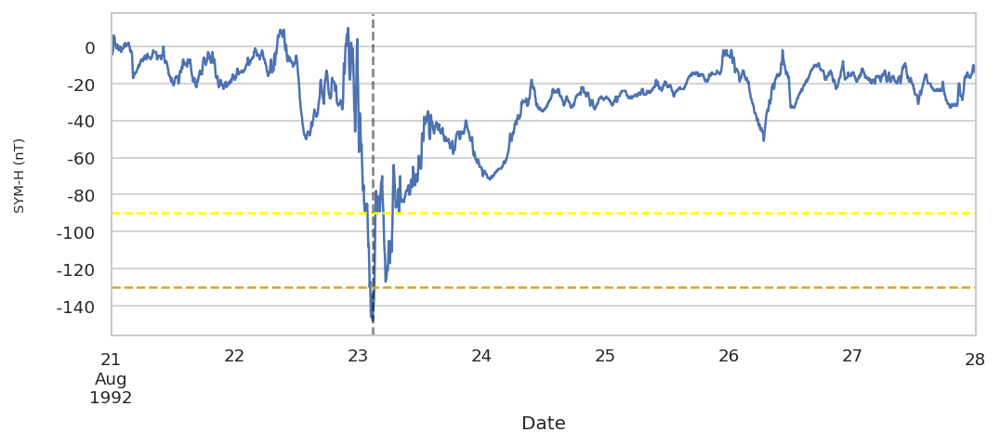

Plotting storm 112
Start date        1992-09-07 00:00:00
End date          1992-09-22 00:00:00
TD                   15 days 00:00:00
Min SYM-H                        -170
classification               MODERATE
Name: 112, dtype: object
Minimum SYM-H value -170 at: 1992-09-17 08:55:00


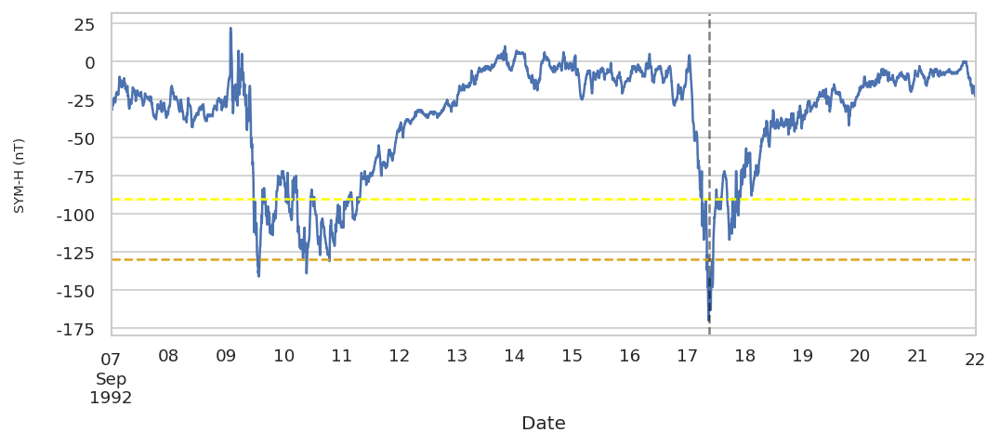

Plotting storm 113
Start date        1992-09-27 00:00:00
End date          1992-10-04 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -134
classification               MODERATE
Name: 113, dtype: object
Minimum SYM-H value -134 at: 1992-09-29 06:50:00


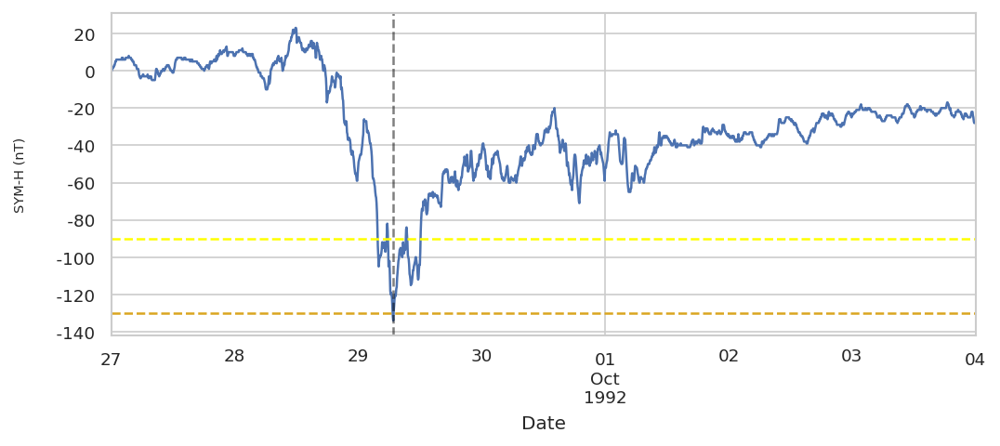

Plotting storm 118
Start date        1993-03-07 00:00:00
End date          1993-03-16 00:00:00
TD                    9 days 00:00:00
Min SYM-H                        -145
classification               MODERATE
Name: 118, dtype: object
Minimum SYM-H value -145 at: 1993-03-09 06:10:00


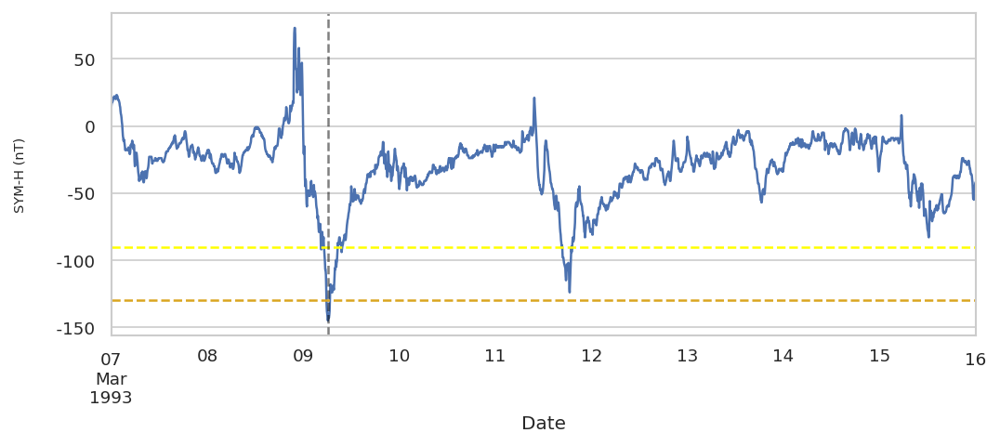

Plotting storm 120
Start date        1993-04-02 00:00:00
End date          1993-04-10 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -191
classification               MODERATE
Name: 120, dtype: object
Minimum SYM-H value -191 at: 1993-04-05 06:25:00


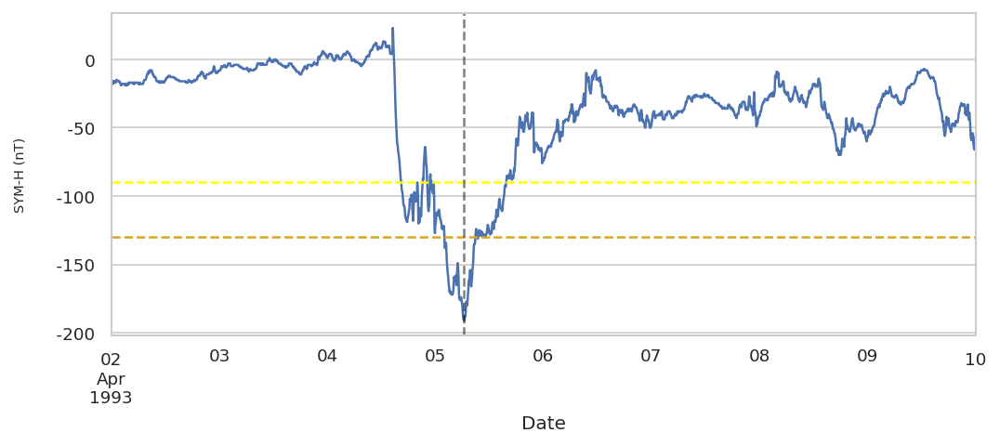

Plotting storm 123
Start date        1993-09-11 00:00:00
End date          1993-09-18 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -189
classification               MODERATE
Name: 123, dtype: object
Minimum SYM-H value -189 at: 1993-09-13 05:35:00


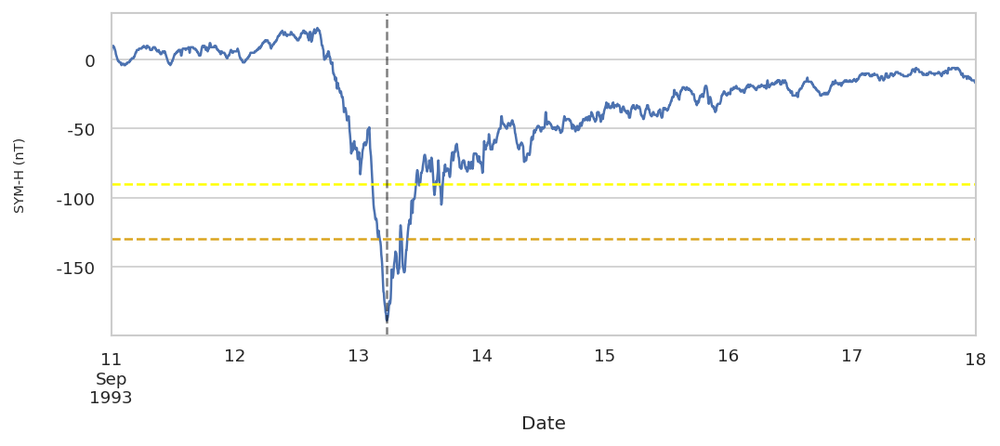

Plotting storm 128
Start date        1994-02-19 00:00:00
End date          1994-02-27 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -150
classification               MODERATE
Name: 128, dtype: object
Minimum SYM-H value -150 at: 1994-02-22 03:40:00


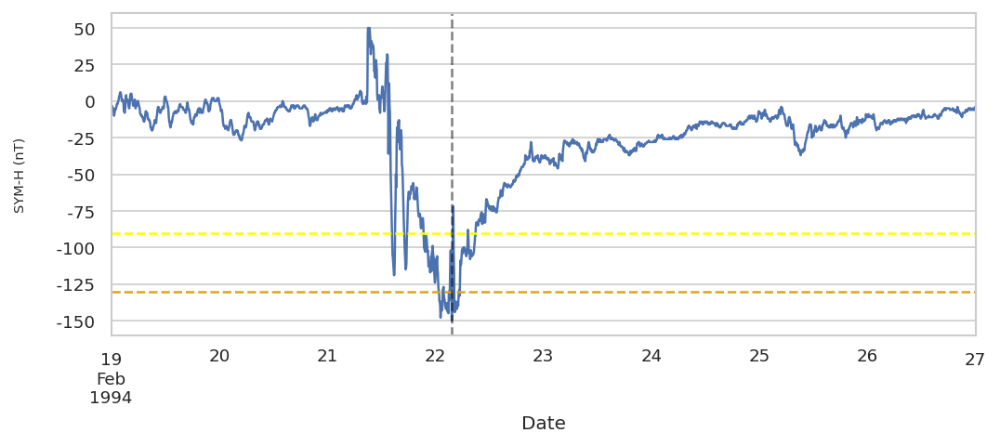

Plotting storm 139
Start date        1995-04-05 00:00:00
End date          1995-04-13 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -160
classification               MODERATE
Name: 139, dtype: object
Minimum SYM-H value -160 at: 1995-04-07 16:25:00


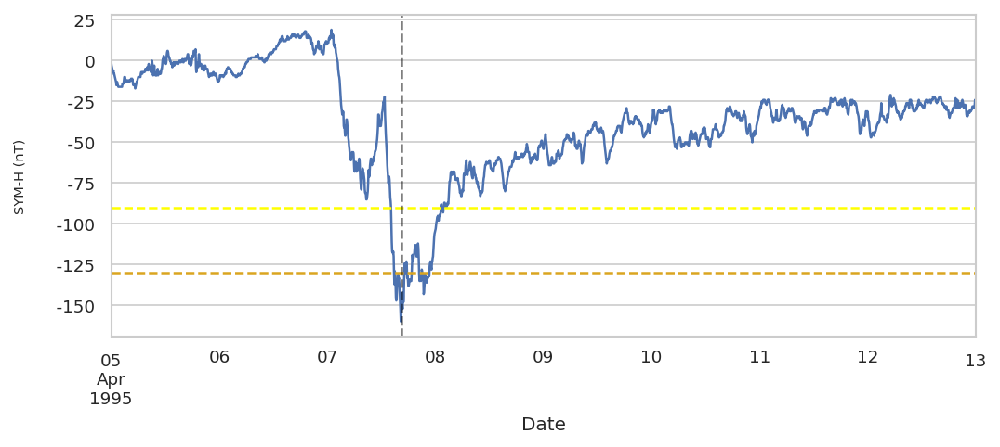

Plotting storm 149
Start date        1997-10-08 00:00:00
End date          1997-10-16 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -139
classification               MODERATE
Name: 149, dtype: object
Minimum SYM-H value -139 at: 1997-10-11 02:55:00


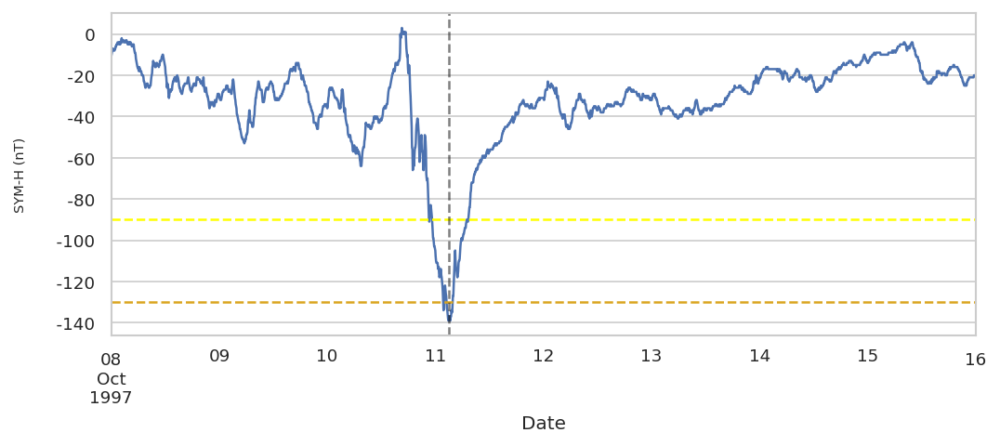

Plotting storm 156
Start date        1998-08-04 00:00:00
End date          1998-08-12 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -168
classification               MODERATE
Name: 156, dtype: object
Minimum SYM-H value -168 at: 1998-08-06 12:15:00


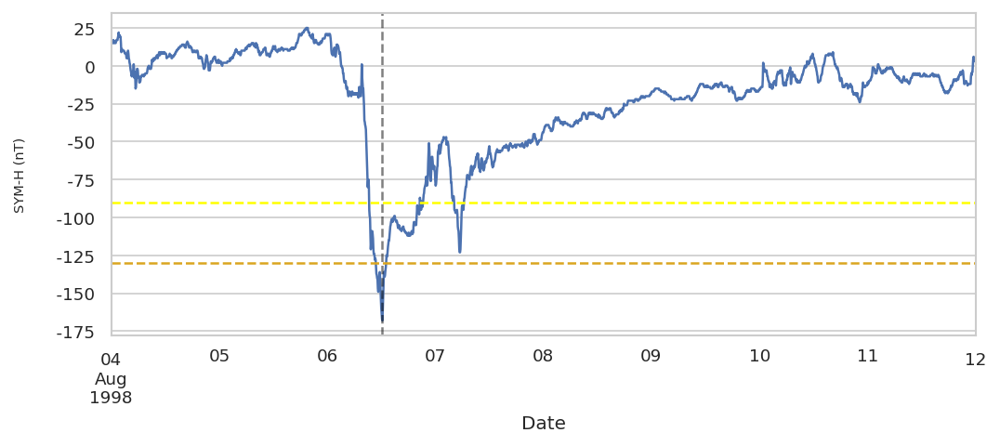

Plotting storm 157
Start date        1998-08-25 00:00:00
End date          1998-09-01 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -171
classification               MODERATE
Name: 157, dtype: object
Minimum SYM-H value -171 at: 1998-08-27 09:00:00


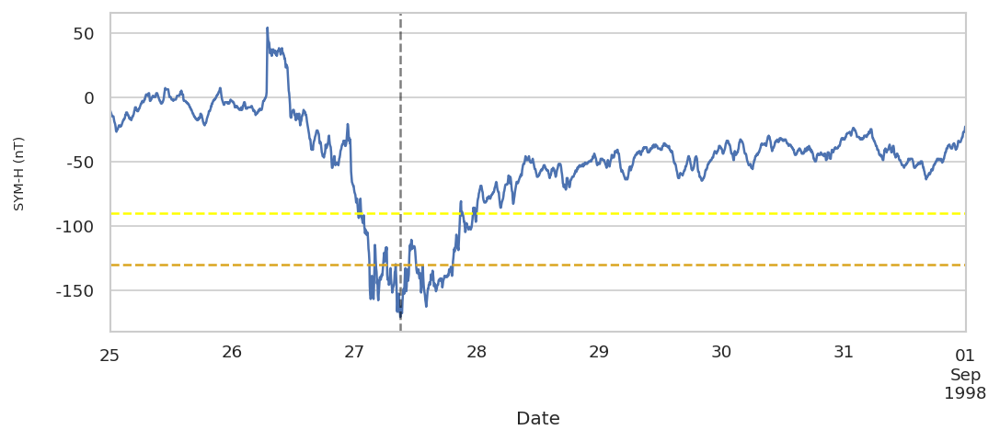

Plotting storm 158
Start date        1998-09-23 00:00:00
End date          1998-09-30 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -213
classification               MODERATE
Name: 158, dtype: object
Minimum SYM-H value -213 at: 1998-09-25 06:50:00


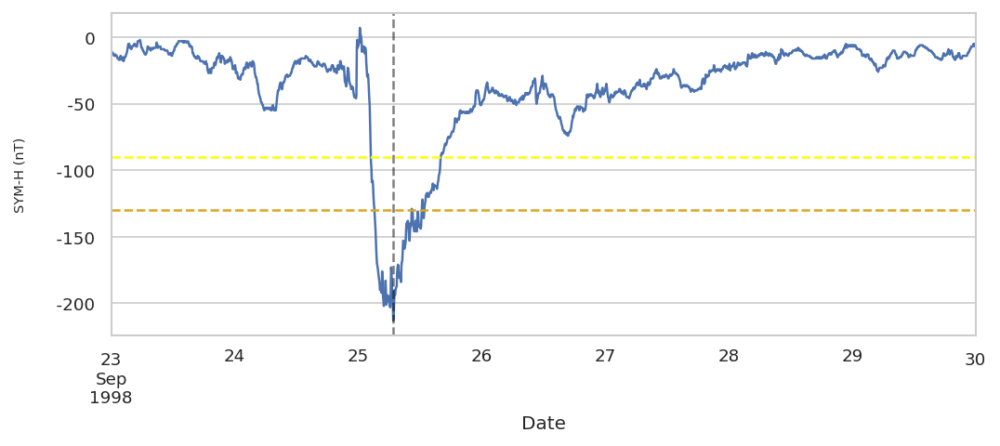

Plotting storm 160
Start date        1998-11-06 00:00:00
End date          1998-11-19 00:00:00
TD                   13 days 00:00:00
Min SYM-H                        -179
classification               MODERATE
Name: 160, dtype: object
Minimum SYM-H value -179 at: 1998-11-08 06:20:00


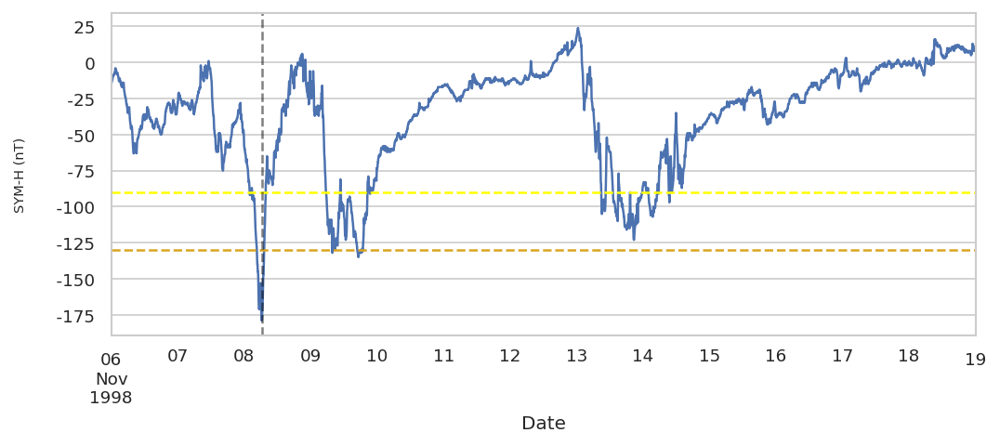

Plotting storm 165
Start date        1999-09-20 00:00:00
End date          1999-09-28 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -160
classification               MODERATE
Name: 165, dtype: object
Minimum SYM-H value -160 at: 1999-09-22 23:20:00


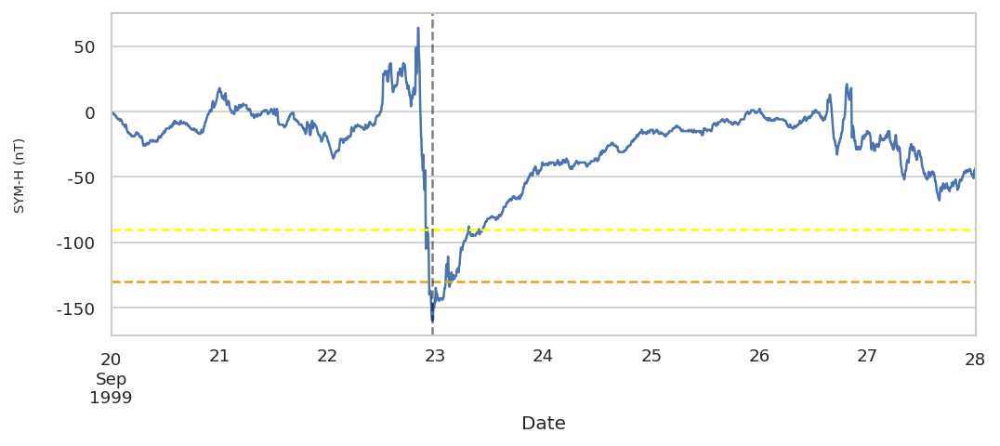

Plotting storm 166
Start date        1999-10-20 00:00:00
End date          1999-10-27 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -218
classification               MODERATE
Name: 166, dtype: object
Minimum SYM-H value -218 at: 1999-10-22 07:15:00


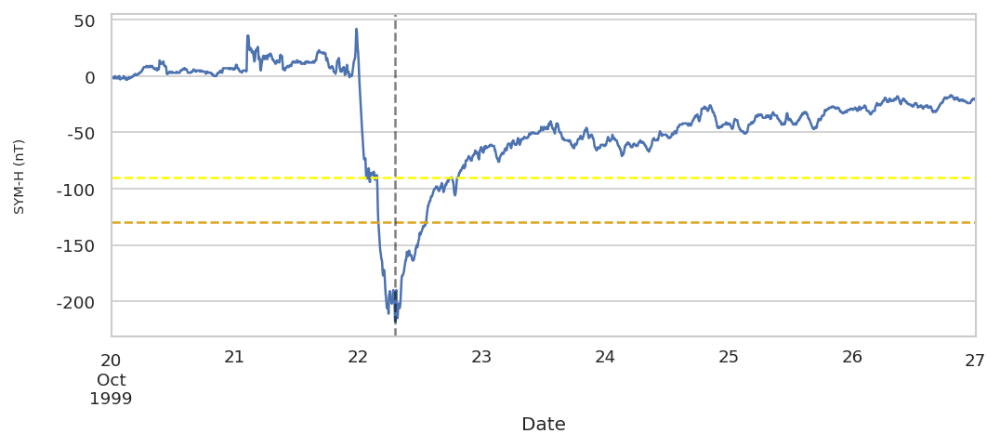

Plotting storm 170
Start date        2000-02-10 00:00:00
End date          2000-02-17 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -164
classification               MODERATE
Name: 170, dtype: object
Minimum SYM-H value -164 at: 2000-02-12 11:35:00


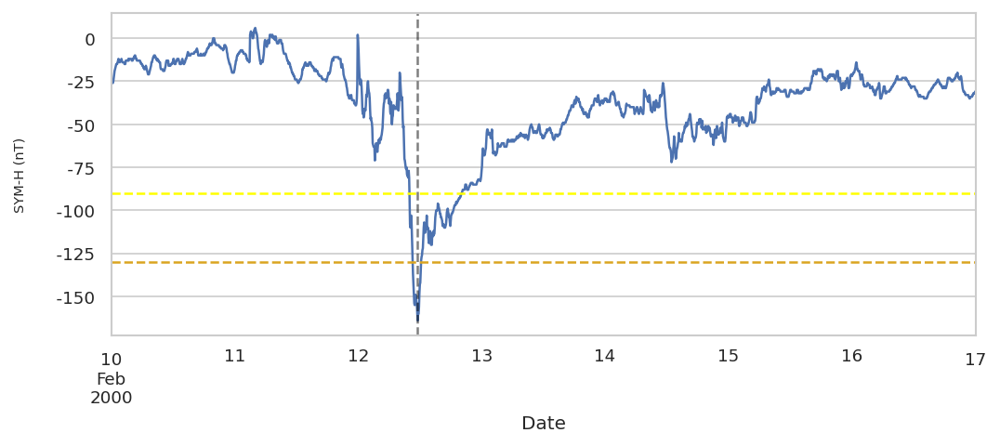

Plotting storm 173
Start date        2000-05-15 00:00:00
End date          2000-05-29 00:00:00
TD                   14 days 00:00:00
Min SYM-H                        -159
classification               MODERATE
Name: 173, dtype: object
Minimum SYM-H value -159 at: 2000-05-24 03:45:00


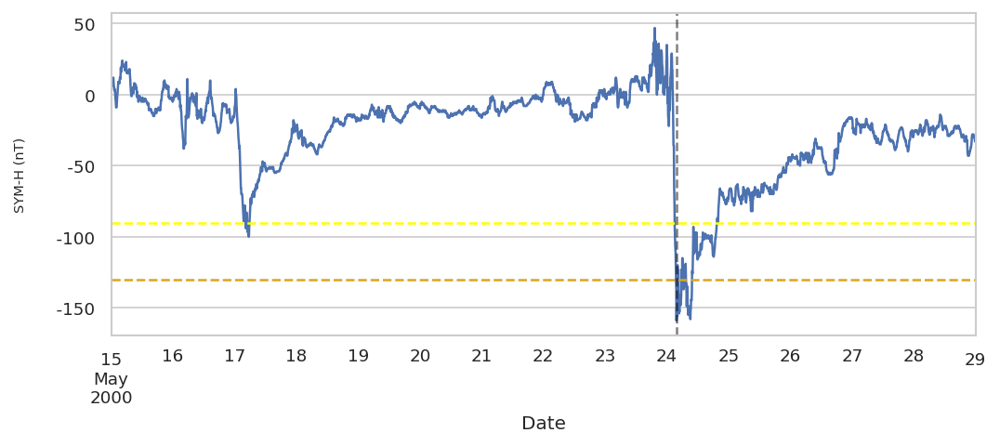

Plotting storm 177
Start date        2000-09-15 00:00:00
End date          2000-09-23 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -196
classification               MODERATE
Name: 177, dtype: object
Minimum SYM-H value -196 at: 2000-09-18 00:25:00


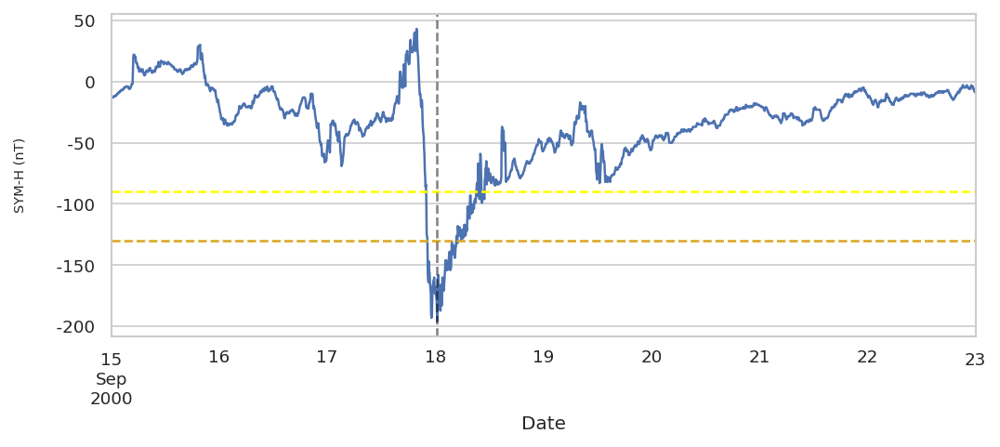

Plotting storm 178
Start date        2000-09-28 00:00:00
End date          2000-10-11 00:00:00
TD                   13 days 00:00:00
Min SYM-H                        -183
classification               MODERATE
Name: 178, dtype: object
Minimum SYM-H value -183 at: 2000-10-05 13:00:00


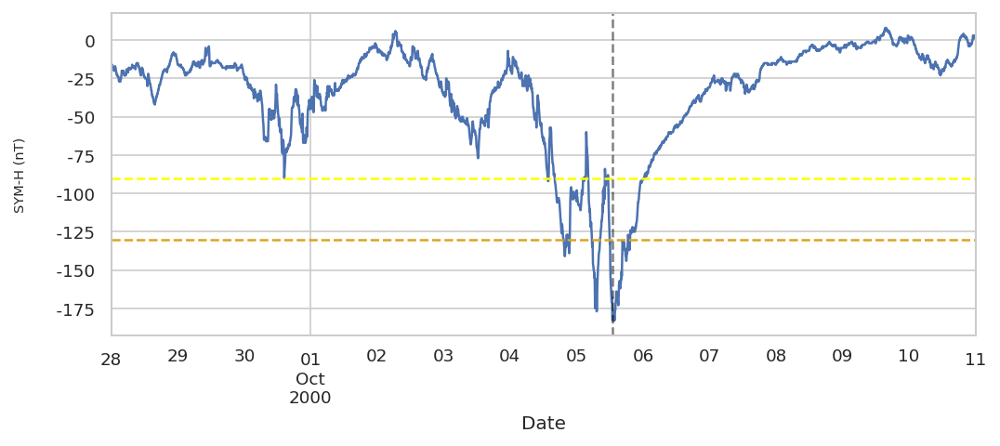

Plotting storm 181
Start date        2000-11-04 00:00:00
End date          2000-11-15 00:00:00
TD                   11 days 00:00:00
Min SYM-H                        -174
classification               MODERATE
Name: 181, dtype: object
Minimum SYM-H value -174 at: 2000-11-06 21:20:00


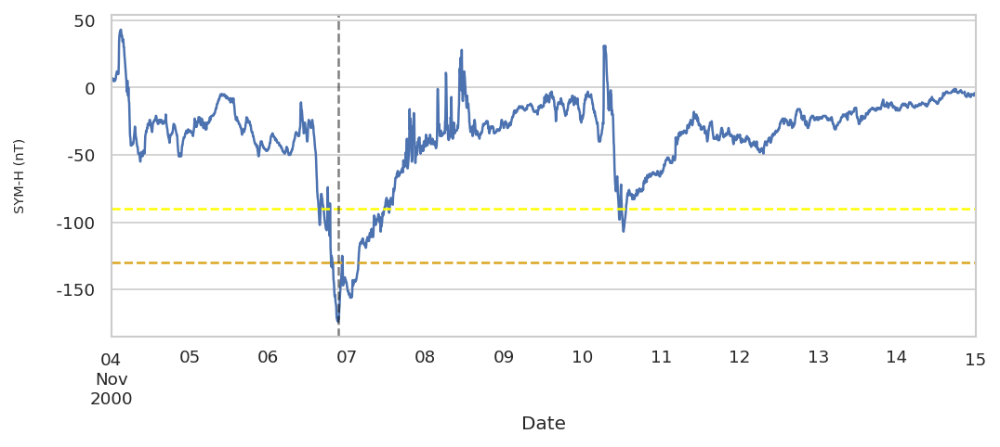

Plotting storm 183
Start date        2001-03-17 00:00:00
End date          2001-03-26 00:00:00
TD                    9 days 00:00:00
Min SYM-H                        -165
classification               MODERATE
Name: 183, dtype: object
Minimum SYM-H value -165 at: 2001-03-20 13:15:00


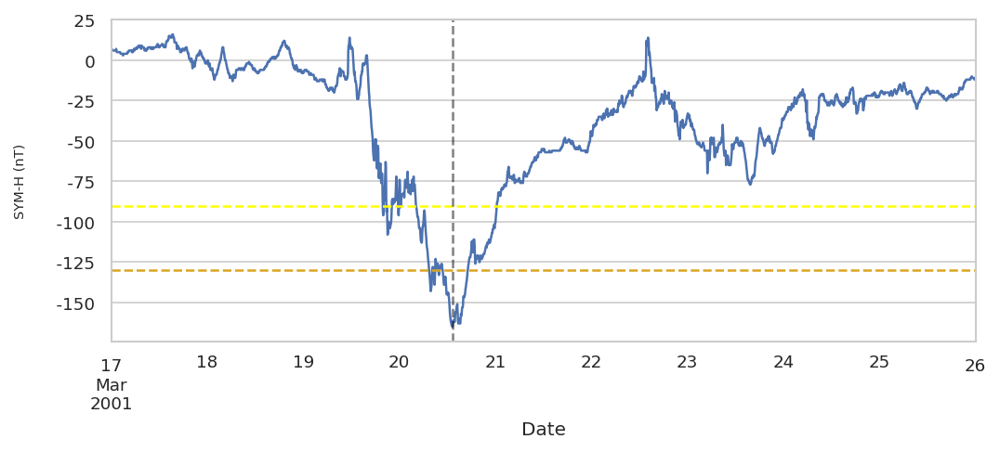

Plotting storm 188
Start date        2001-09-21 00:00:00
End date          2001-10-09 00:00:00
TD                   18 days 00:00:00
Min SYM-H                        -187
classification               MODERATE
Name: 188, dtype: object
Minimum SYM-H value -187 at: 2001-10-03 14:20:00


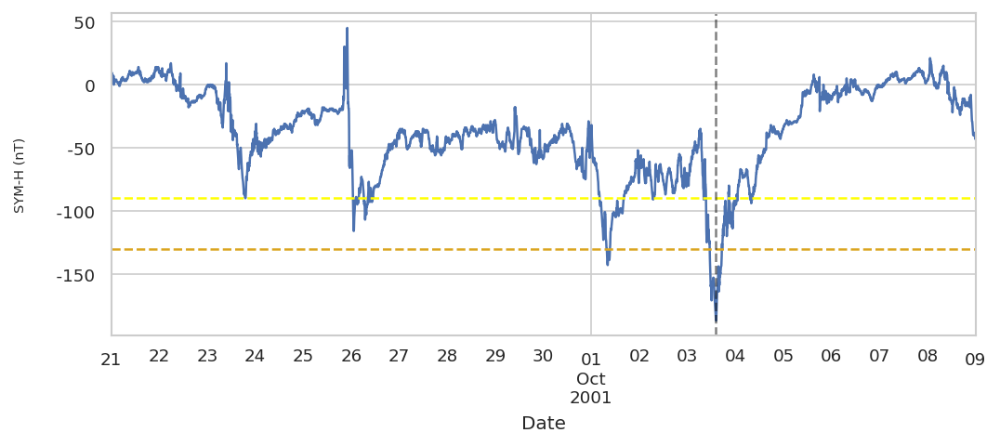

Plotting storm 193
Start date        2002-04-15 00:00:00
End date          2002-04-25 00:00:00
TD                   10 days 00:00:00
Min SYM-H                        -183
classification               MODERATE
Name: 193, dtype: object
Minimum SYM-H value -183 at: 2002-04-20 06:00:00


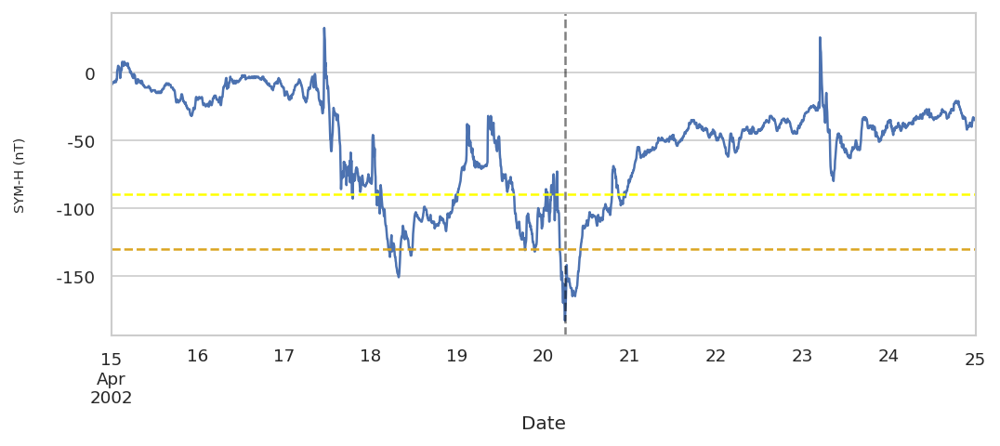

Plotting storm 198
Start date        2002-09-02 00:00:00
End date          2002-09-13 00:00:00
TD                   11 days 00:00:00
Min SYM-H                        -167
classification               MODERATE
Name: 198, dtype: object
Minimum SYM-H value -167 at: 2002-09-07 23:55:00


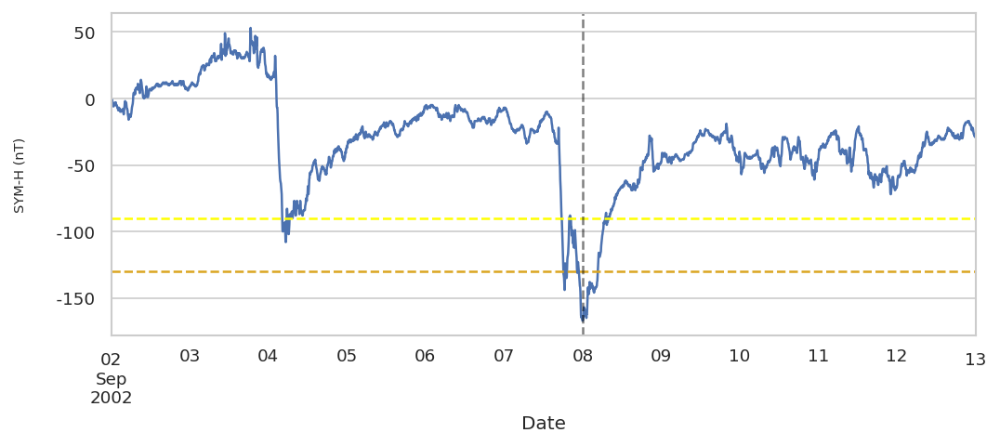

Plotting storm 199
Start date        2002-09-29 00:00:00
End date          2002-10-13 00:00:00
TD                   14 days 00:00:00
Min SYM-H                        -153
classification               MODERATE
Name: 199, dtype: object
Minimum SYM-H value -153 at: 2002-10-01 12:45:00


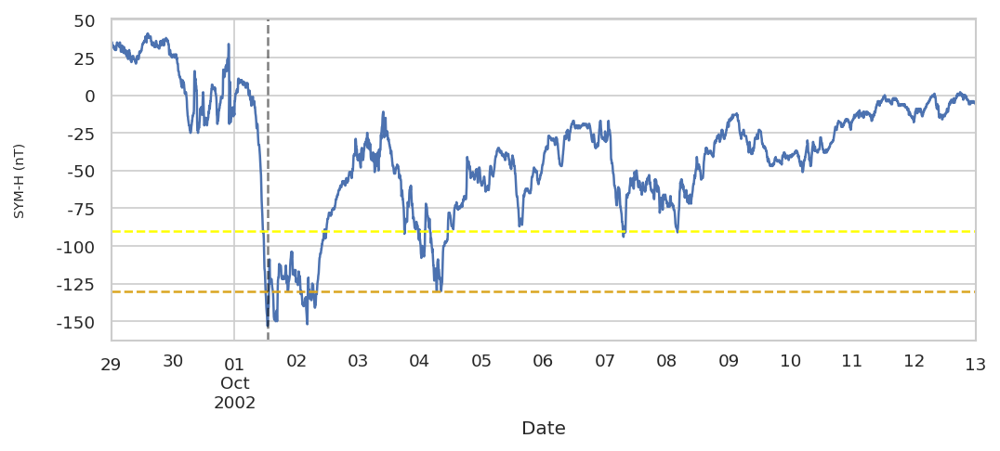

Plotting storm 204
Start date        2003-05-27 00:00:00
End date          2003-06-07 00:00:00
TD                   11 days 00:00:00
Min SYM-H                        -162
classification               MODERATE
Name: 204, dtype: object
Minimum SYM-H value -162 at: 2003-05-30 01:55:00


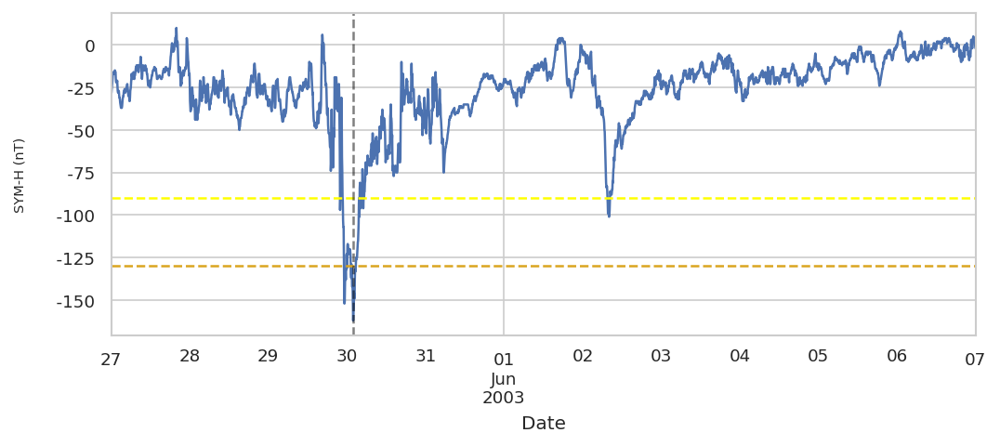

Plotting storm 205
Start date        2003-06-15 00:00:00
End date          2003-06-23 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -162
classification               MODERATE
Name: 205, dtype: object
Minimum SYM-H value -162 at: 2003-06-18 09:10:00


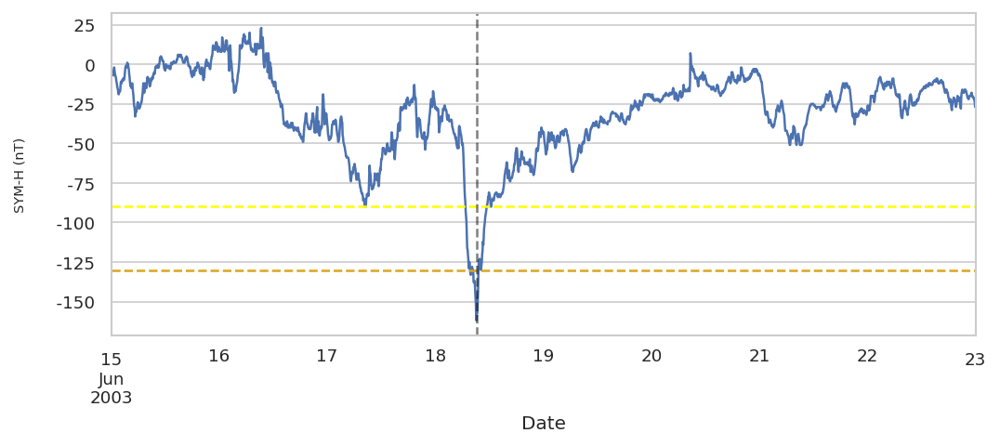

Plotting storm 208
Start date        2003-08-16 00:00:00
End date          2003-08-24 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -138
classification               MODERATE
Name: 208, dtype: object
Minimum SYM-H value -138 at: 2003-08-18 14:30:00


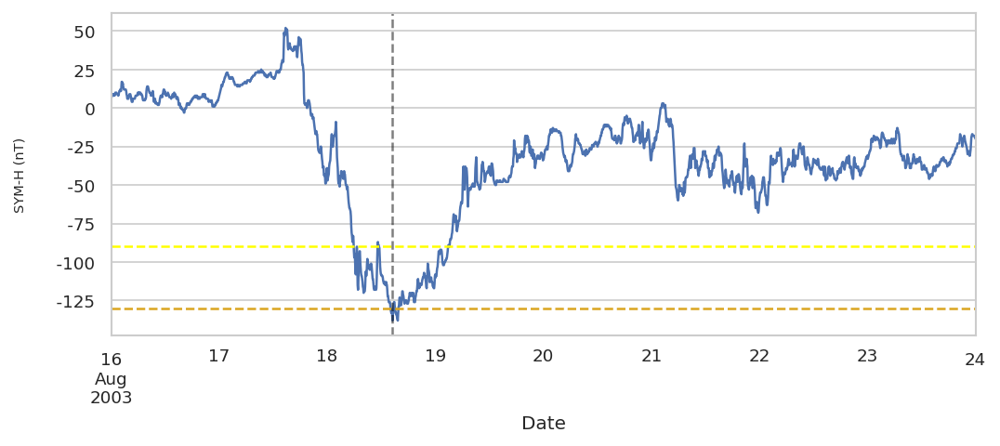

Plotting storm 212
Start date        2004-01-20 00:00:00
End date          2004-01-27 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -137
classification               MODERATE
Name: 212, dtype: object
Minimum SYM-H value -137 at: 2004-01-22 13:25:00


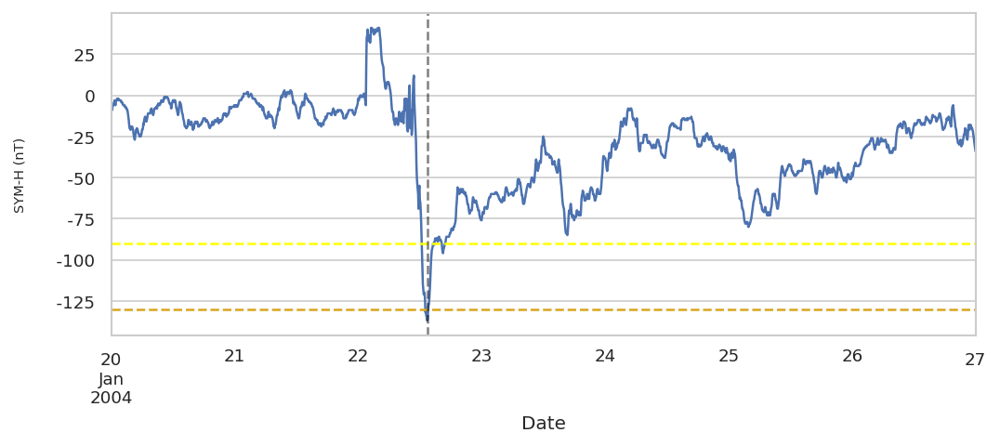

Plotting storm 215
Start date        2004-04-01 00:00:00
End date          2004-04-10 00:00:00
TD                    9 days 00:00:00
Min SYM-H                        -148
classification               MODERATE
Name: 215, dtype: object
Minimum SYM-H value -148 at: 2004-04-04 00:40:00


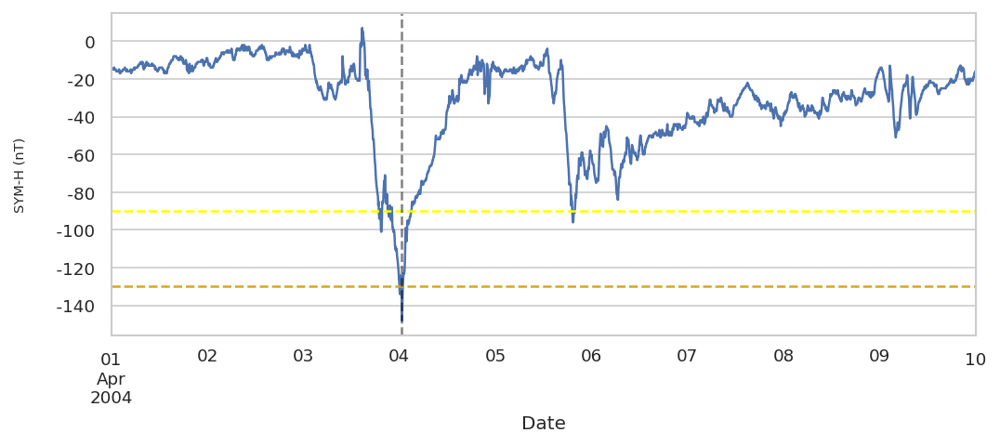

Plotting storm 216
Start date        2004-07-15 00:00:00
End date          2004-08-02 00:00:00
TD                   18 days 00:00:00
Min SYM-H                        -208
classification               MODERATE
Name: 216, dtype: object
Minimum SYM-H value -208 at: 2004-07-27 13:35:00


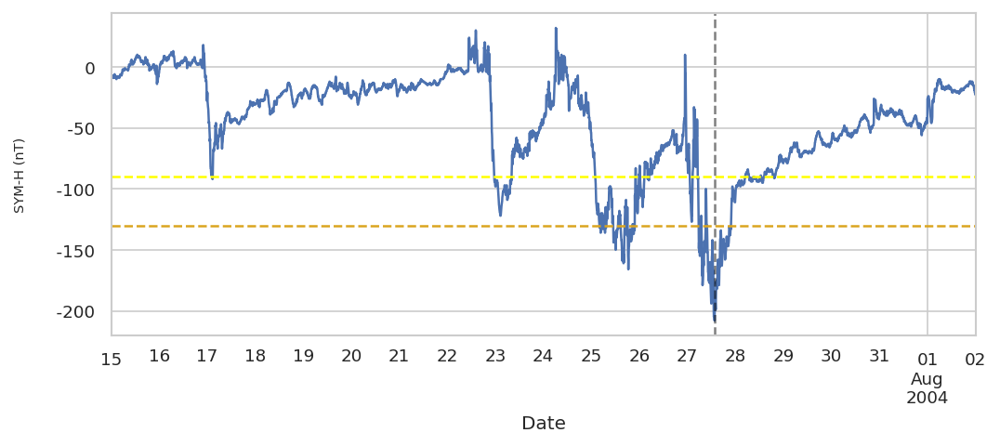

Plotting storm 228
Start date        2005-08-22 00:00:00
End date          2005-09-05 00:00:00
TD                   14 days 00:00:00
Min SYM-H                        -174
classification               MODERATE
Name: 228, dtype: object
Minimum SYM-H value -174 at: 2005-08-24 12:35:00


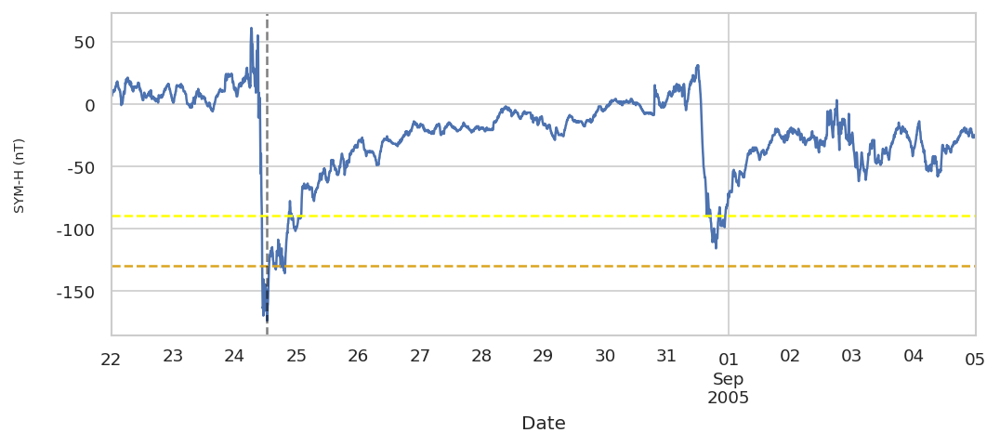

Plotting storm 229
Start date        2005-09-09 00:00:00
End date          2005-09-17 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -135
classification               MODERATE
Name: 229, dtype: object
Minimum SYM-H value -135 at: 2005-09-11 10:00:00


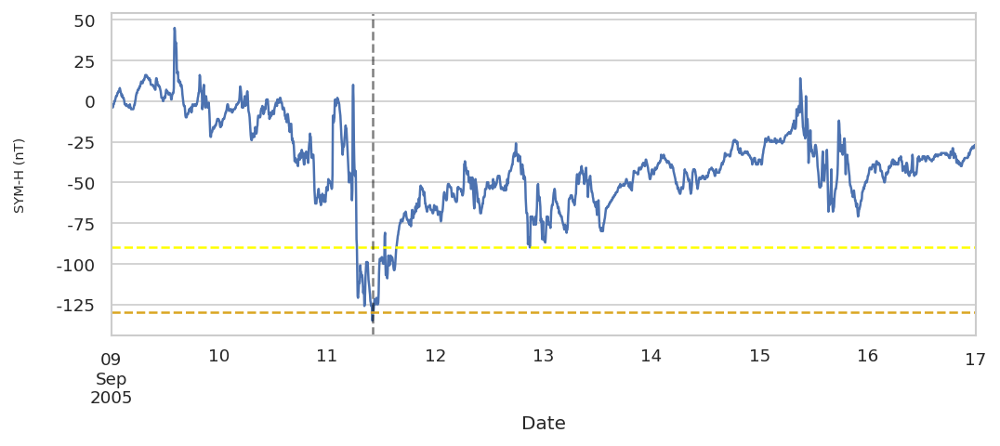

Plotting storm 232
Start date        2006-12-12 00:00:00
End date          2006-12-20 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -206
classification               MODERATE
Name: 232, dtype: object
Minimum SYM-H value -206 at: 2006-12-15 00:50:00


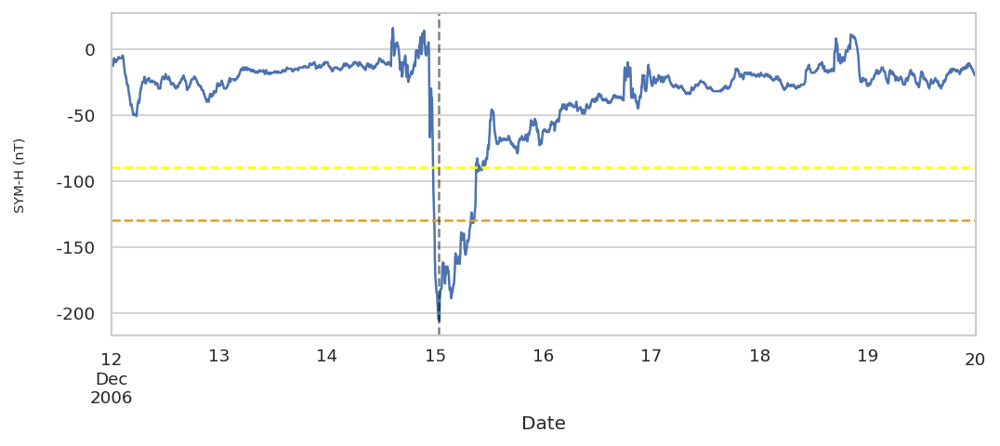

Plotting storm 239
Start date        2011-10-22 00:00:00
End date          2011-10-30 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -160
classification               MODERATE
Name: 239, dtype: object
Minimum SYM-H value -160 at: 2011-10-25 01:15:00


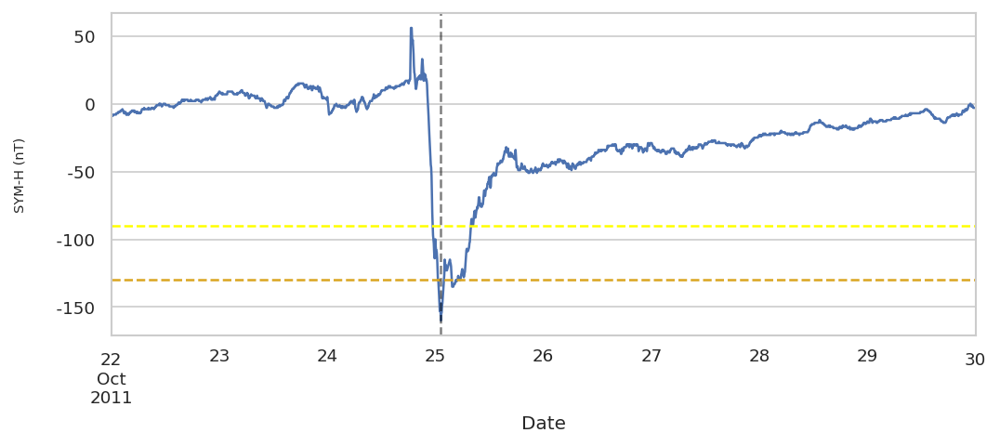

Plotting storm 240
Start date        2012-03-05 00:00:00
End date          2012-03-14 00:00:00
TD                    9 days 00:00:00
Min SYM-H                        -149
classification               MODERATE
Name: 240, dtype: object
Minimum SYM-H value -149 at: 2012-03-09 07:55:00


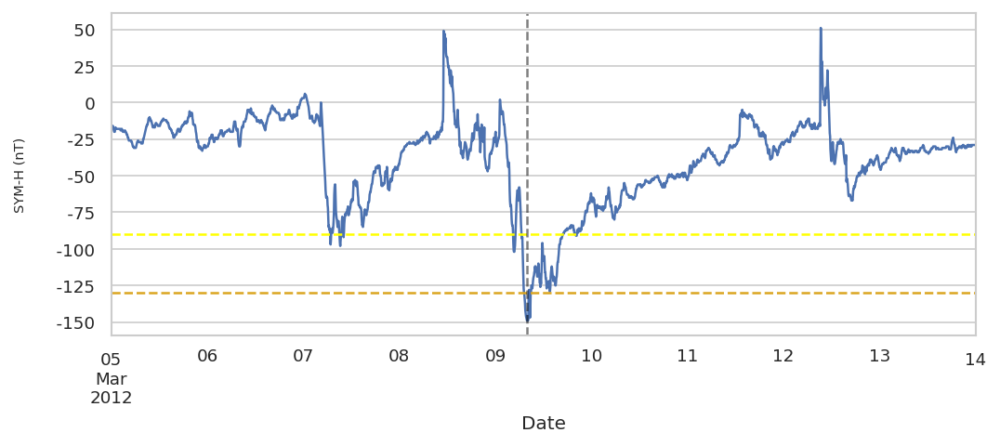

Plotting storm 243
Start date        2012-09-29 00:00:00
End date          2012-10-18 00:00:00
TD                   19 days 00:00:00
Min SYM-H                        -138
classification               MODERATE
Name: 243, dtype: object
Minimum SYM-H value -138 at: 2012-10-01 03:55:00


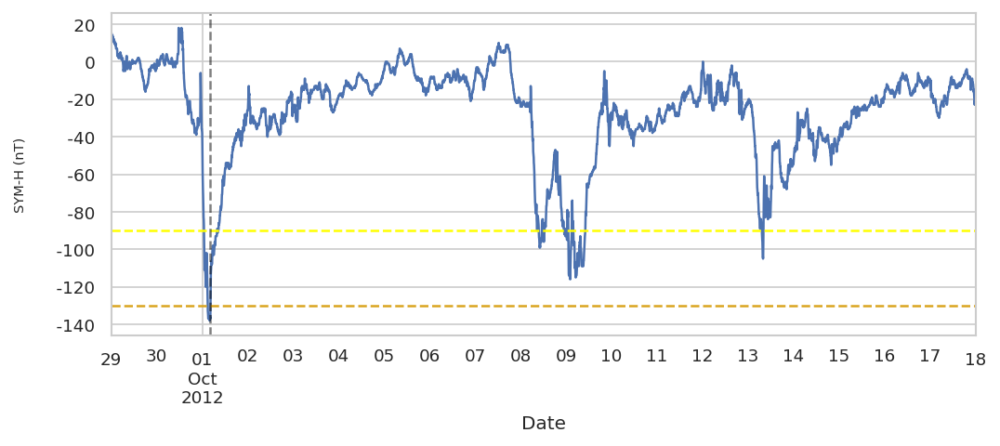

Plotting storm 245
Start date        2013-03-15 00:00:00
End date          2013-03-23 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -131
classification               MODERATE
Name: 245, dtype: object
Minimum SYM-H value -131 at: 2013-03-17 20:25:00


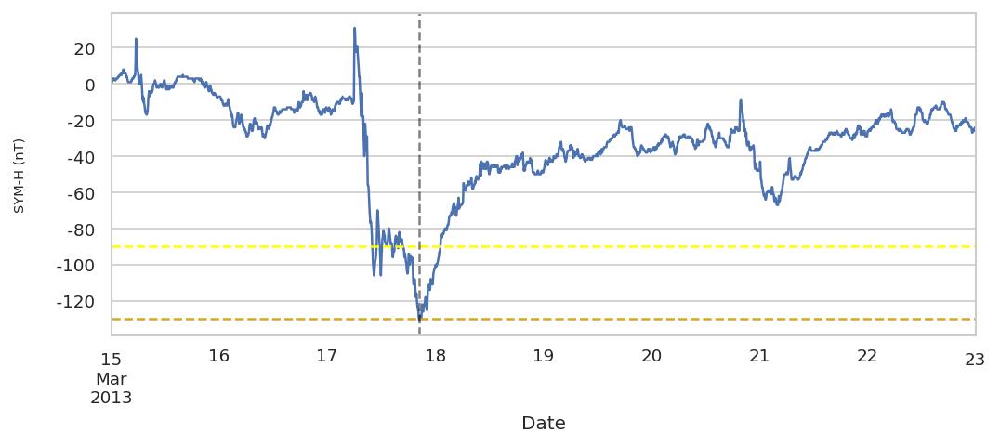

Plotting storm 246
Start date        2013-05-30 00:00:00
End date          2013-06-06 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -134
classification               MODERATE
Name: 246, dtype: object
Minimum SYM-H value -134 at: 2013-06-01 07:45:00


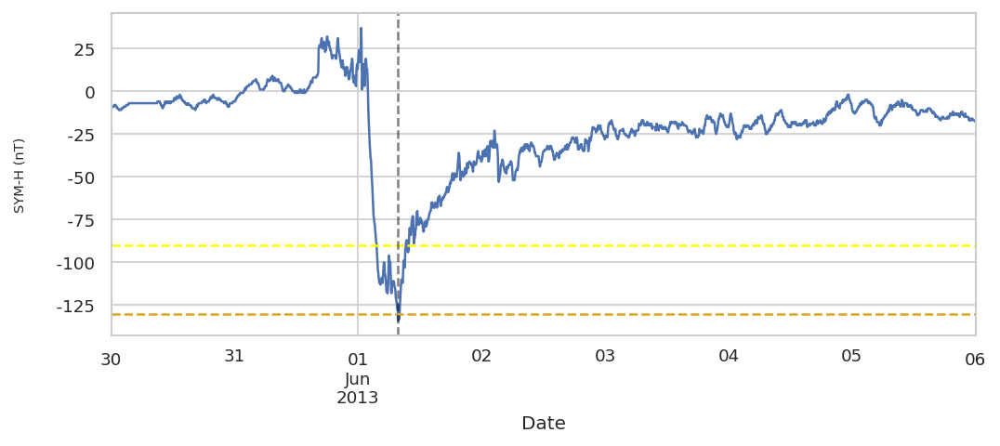

Plotting storm 251
Start date        2015-01-05 00:00:00
End date          2015-01-12 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -134
classification               MODERATE
Name: 251, dtype: object
Minimum SYM-H value -134 at: 2015-01-07 11:00:00


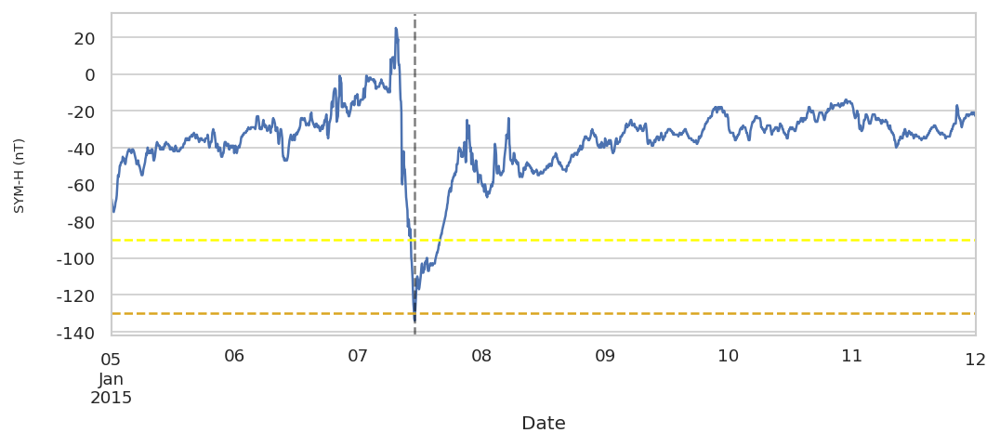

Plotting storm 255
Start date        2015-06-20 00:00:00
End date          2015-06-30 00:00:00
TD                   10 days 00:00:00
Min SYM-H                        -207
classification               MODERATE
Name: 255, dtype: object
Minimum SYM-H value -207 at: 2015-06-23 04:25:00


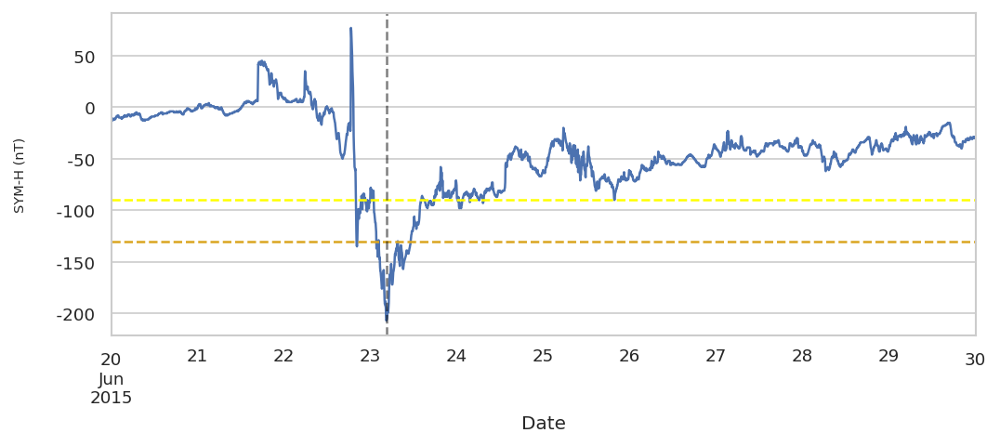

Plotting storm 261
Start date        2015-12-18 00:00:00
End date          2015-12-26 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -169
classification               MODERATE
Name: 261, dtype: object
Minimum SYM-H value -169 at: 2015-12-20 22:50:00


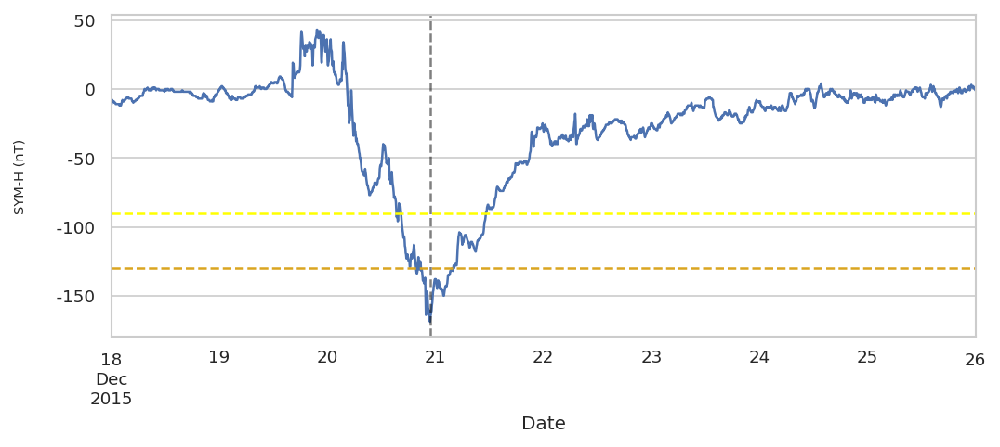

Plotting storm 267
Start date        2017-05-26 00:00:00
End date          2017-06-02 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -141
classification               MODERATE
Name: 267, dtype: object
Minimum SYM-H value -141 at: 2017-05-28 07:10:00


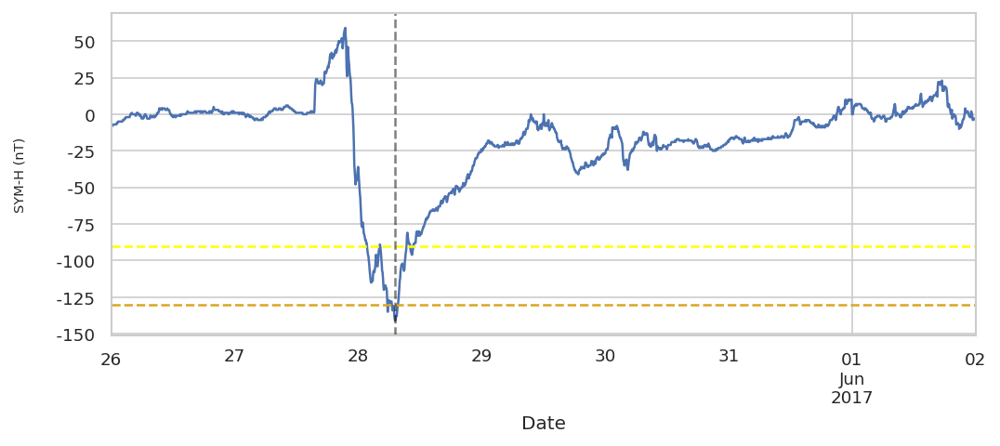

Plotting storm 268
Start date        2017-09-05 00:00:00
End date          2017-09-13 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -144
classification               MODERATE
Name: 268, dtype: object
Minimum SYM-H value -144 at: 2017-09-08 01:05:00


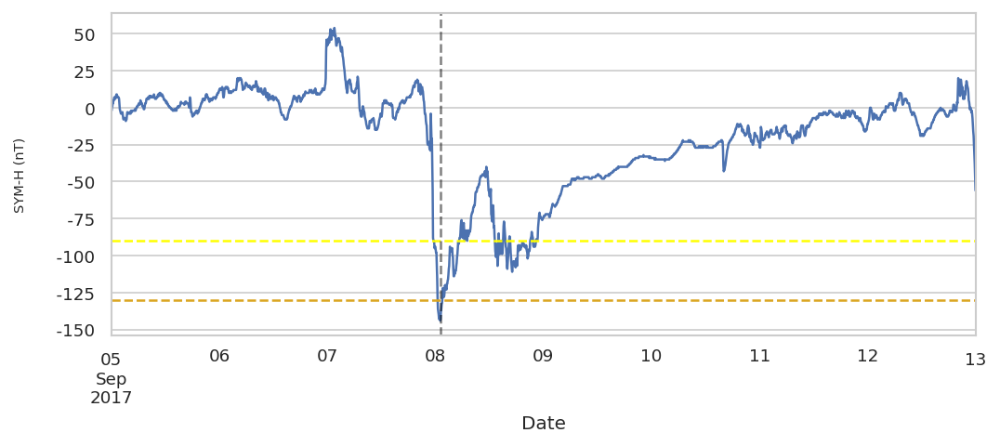

Plotting storm 269
Start date        2018-08-24 00:00:00
End date          2018-08-31 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -205
classification               MODERATE
Name: 269, dtype: object
Minimum SYM-H value -205 at: 2018-08-26 07:10:00


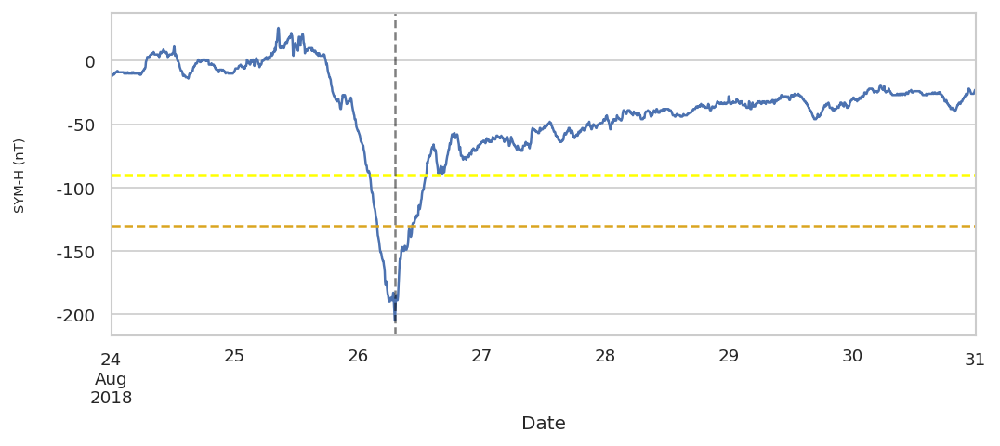

In [10]:
# Plot the storms of moderate intensity
# the yellow horizontal line corresponds to the low intensity threshold
# the orange horizontal line corresponds to the moderate intensity threshold
print(f'{len(moderate_indices)} moderate storms')
for ix, ind in enumerate(moderate_indices):
    ax = utils.plot_storm_sym(dfx, summary_df_sym, ind)
    strm = utils.get_storm(dfx, summary_df_sym, ind)
    ax.axvline(strm['SYM_H'].idxmin(), linestyle = '--', color = 'black', alpha = 0.5)
    print(f'Minimum SYM-H value {strm["SYM_H"].min()} at: {strm["SYM_H"].idxmin()}')
    plt.show();

23 intense storms
Plotting storm 1
Start date        1981-03-03 00:00:00
End date          1981-03-11 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -235
classification                INTENSE
Name: 1, dtype: object
Minimum SYM-H value -235 at: 1981-03-05 17:45:00


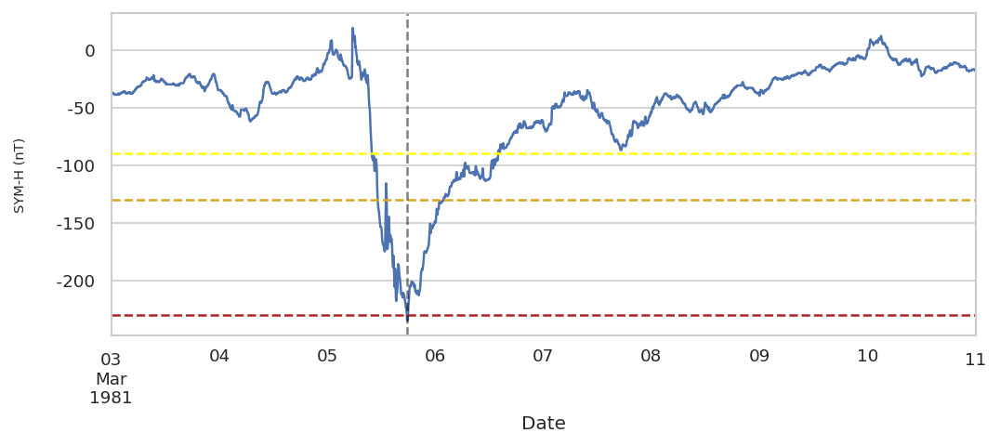

Plotting storm 3
Start date        1981-04-10 00:00:00
End date          1981-05-02 00:00:00
TD                   22 days 00:00:00
Min SYM-H                        -338
classification                INTENSE
Name: 3, dtype: object
Minimum SYM-H value -338 at: 1981-04-13 07:05:00


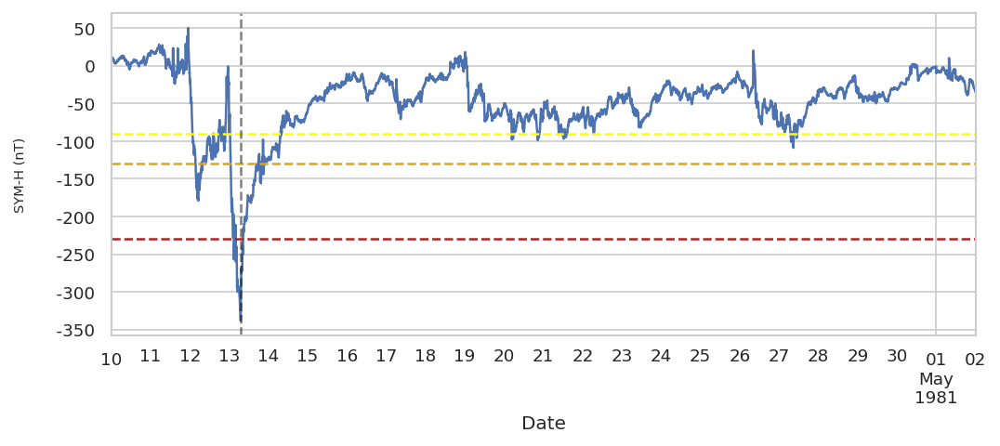

Plotting storm 6
Start date        1981-07-21 00:00:00
End date          1981-08-01 00:00:00
TD                   11 days 00:00:00
Min SYM-H                        -255
classification                INTENSE
Name: 6, dtype: object
Minimum SYM-H value -255 at: 1981-07-25 20:05:00


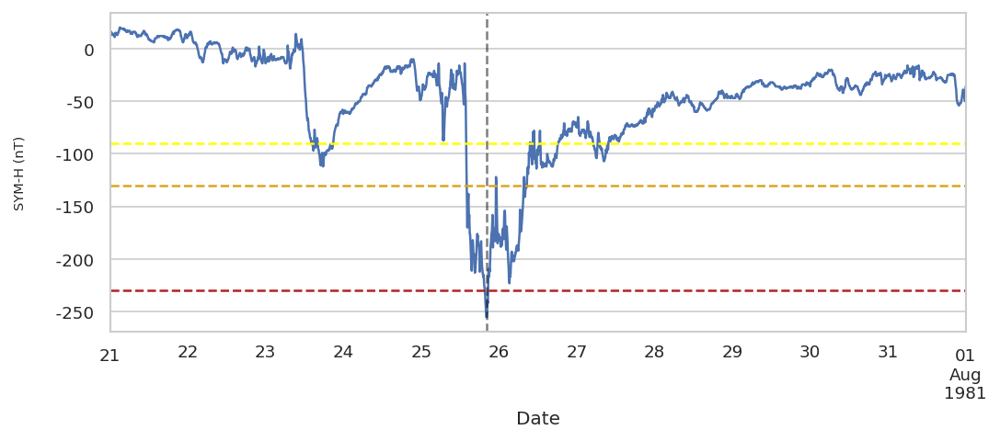

Plotting storm 11
Start date        1982-02-27 00:00:00
End date          1982-03-08 00:00:00
TD                    9 days 00:00:00
Min SYM-H                        -247
classification                INTENSE
Name: 11, dtype: object
Minimum SYM-H value -247 at: 1982-03-02 09:35:00


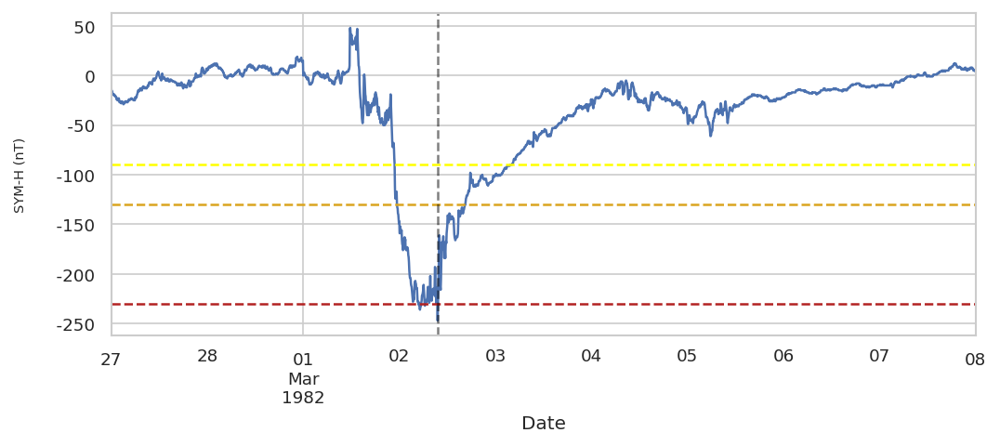

Plotting storm 16
Start date        1982-09-04 00:00:00
End date          1982-09-12 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -260
classification                INTENSE
Name: 16, dtype: object
Minimum SYM-H value -260 at: 1982-09-06 11:40:00


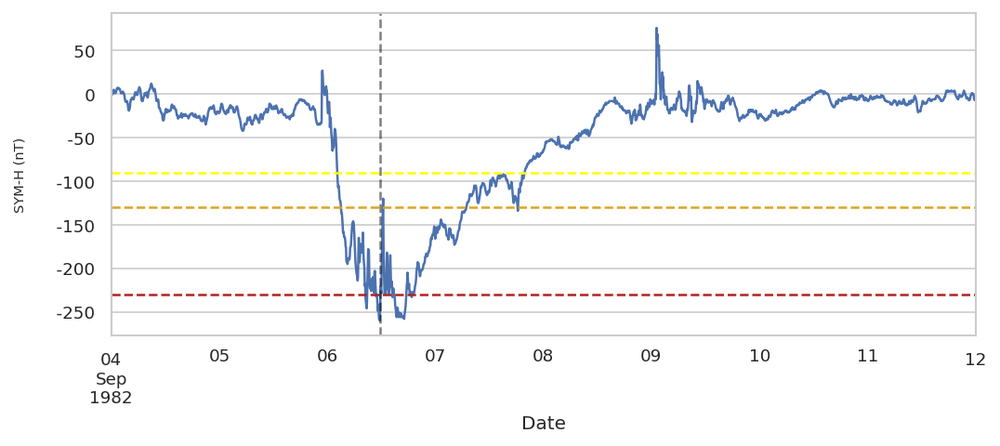

Plotting storm 47
Start date        1986-02-05 00:00:00
End date          1986-02-16 00:00:00
TD                   11 days 00:00:00
Min SYM-H                        -375
classification                INTENSE
Name: 47, dtype: object
Minimum SYM-H value -375 at: 1986-02-09 00:35:00


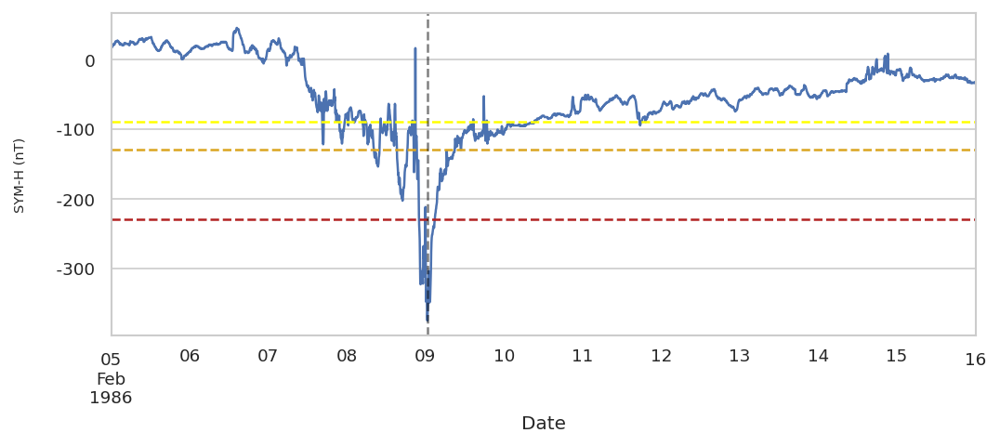

Plotting storm 74
Start date        1989-09-14 00:00:00
End date          1989-10-02 00:00:00
TD                   18 days 00:00:00
Min SYM-H                        -288
classification                INTENSE
Name: 74, dtype: object
Minimum SYM-H value -288 at: 1989-09-19 05:20:00


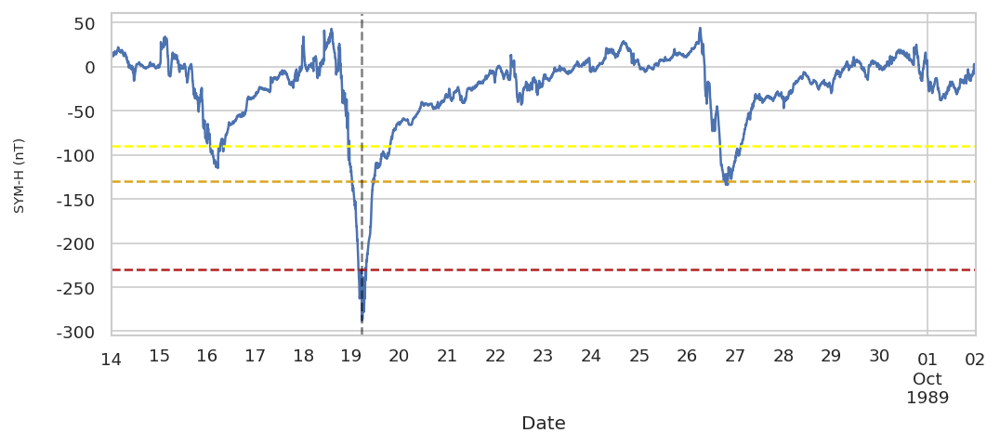

Plotting storm 75
Start date        1989-10-18 00:00:00
End date          1989-10-30 00:00:00
TD                   12 days 00:00:00
Min SYM-H                        -334
classification                INTENSE
Name: 75, dtype: object
Minimum SYM-H value -334 at: 1989-10-21 11:30:00


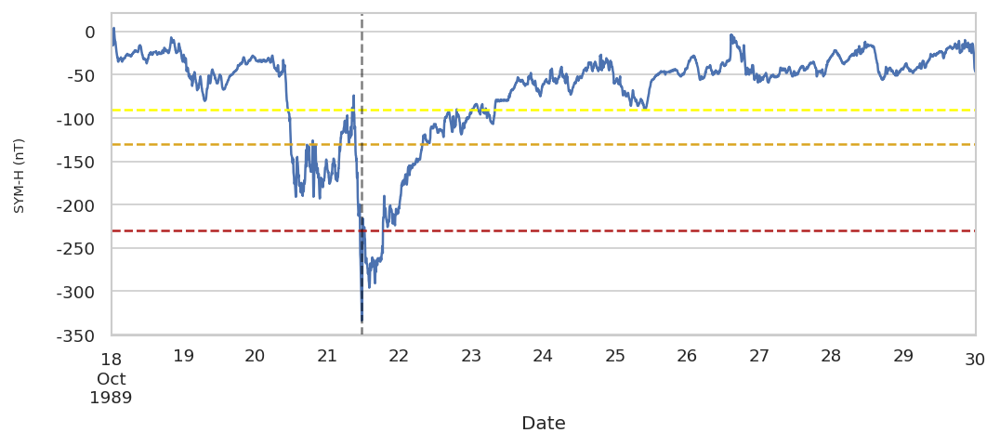

Plotting storm 76
Start date        1989-11-11 00:00:00
End date          1989-11-23 00:00:00
TD                   12 days 00:00:00
Min SYM-H                        -319
classification                INTENSE
Name: 76, dtype: object
Minimum SYM-H value -319 at: 1989-11-17 21:05:00


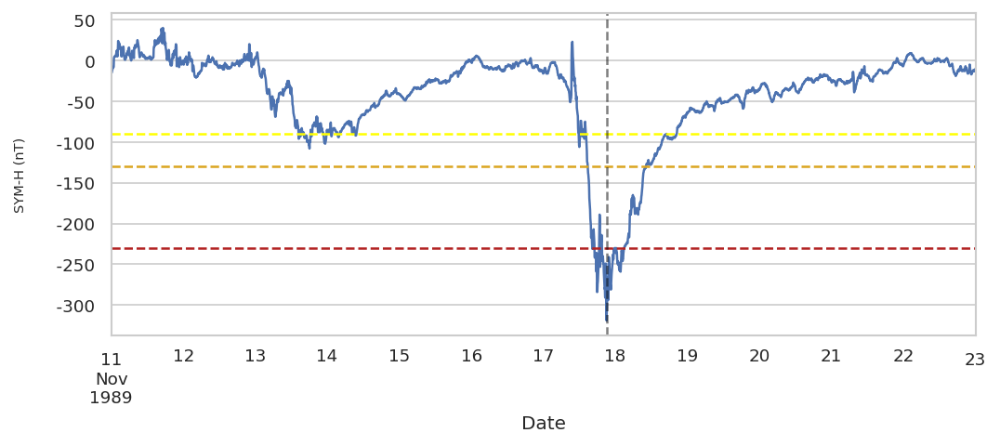

Plotting storm 82
Start date        1990-04-08 00:00:00
End date          1990-05-04 00:00:00
TD                   26 days 00:00:00
Min SYM-H                        -309
classification                INTENSE
Name: 82, dtype: object
Minimum SYM-H value -309 at: 1990-04-10 16:35:00


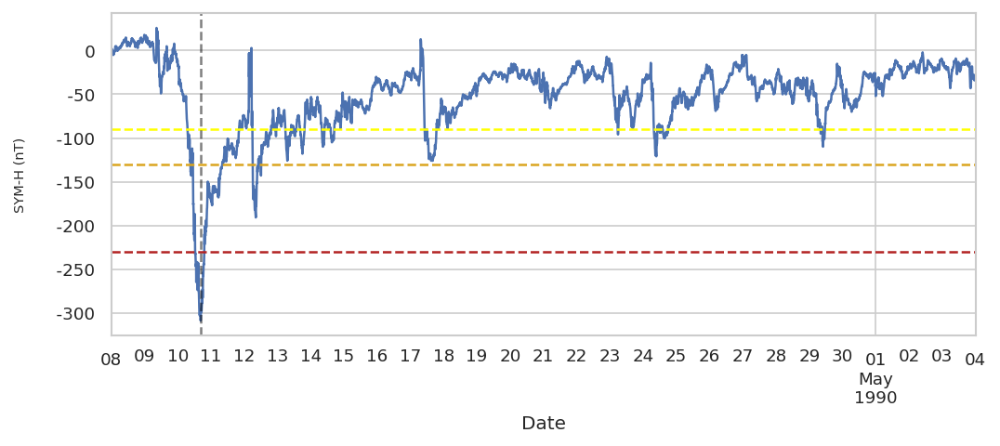

Plotting storm 89
Start date        1991-03-22 00:00:00
End date          1991-03-31 00:00:00
TD                    9 days 00:00:00
Min SYM-H                        -325
classification                INTENSE
Name: 89, dtype: object
Minimum SYM-H value -325 at: 1991-03-25 03:40:00


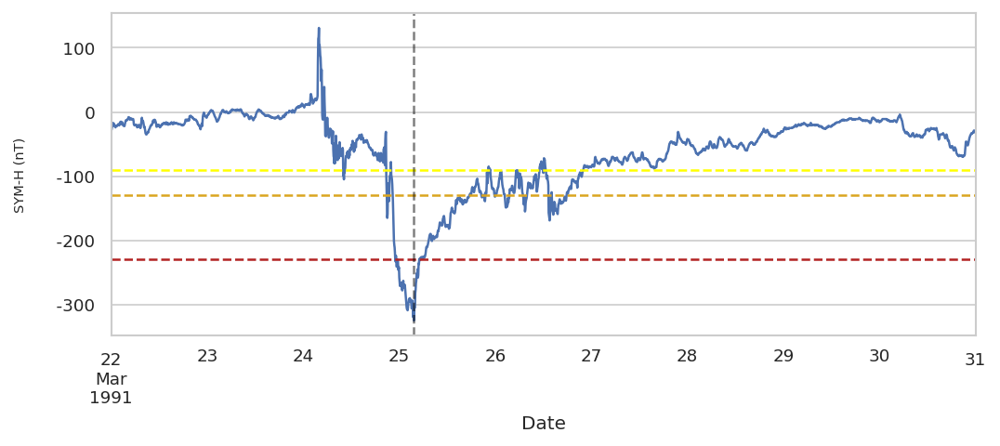

Plotting storm 93
Start date        1991-07-07 00:00:00
End date          1991-07-22 00:00:00
TD                   15 days 00:00:00
Min SYM-H                        -237
classification                INTENSE
Name: 93, dtype: object
Minimum SYM-H value -237 at: 1991-07-13 15:40:00


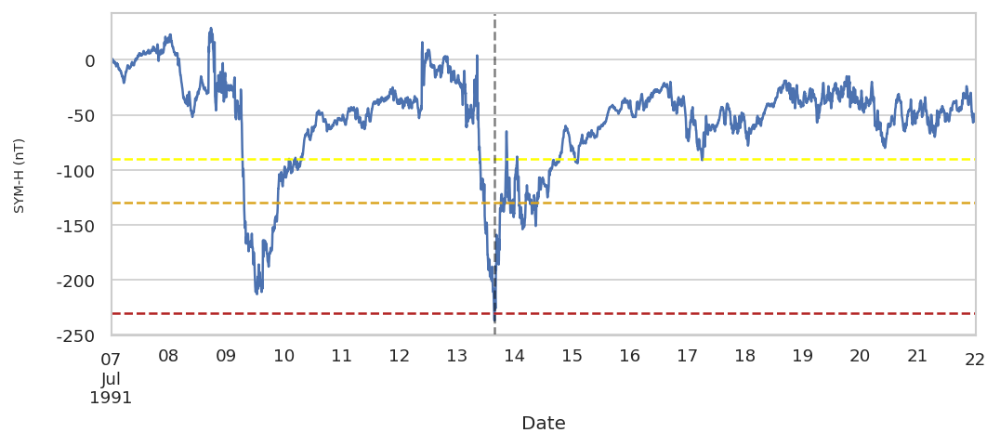

Plotting storm 105
Start date        1992-05-08 00:00:00
End date          1992-05-16 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -352
classification                INTENSE
Name: 105, dtype: object
Minimum SYM-H value -352 at: 1992-05-10 14:15:00


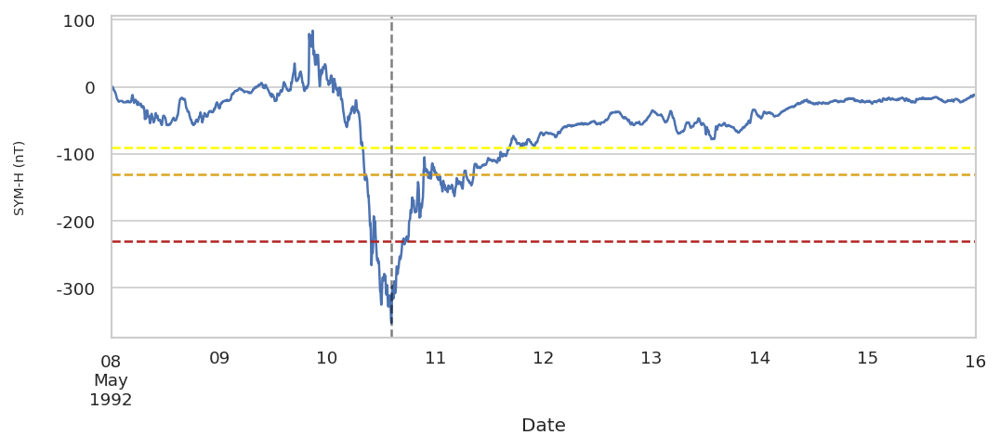

Plotting storm 131
Start date        1994-04-15 00:00:00
End date          1994-04-22 00:00:00
TD                    7 days 00:00:00
Min SYM-H                        -281
classification                INTENSE
Name: 131, dtype: object
Minimum SYM-H value -281 at: 1994-04-17 07:45:00


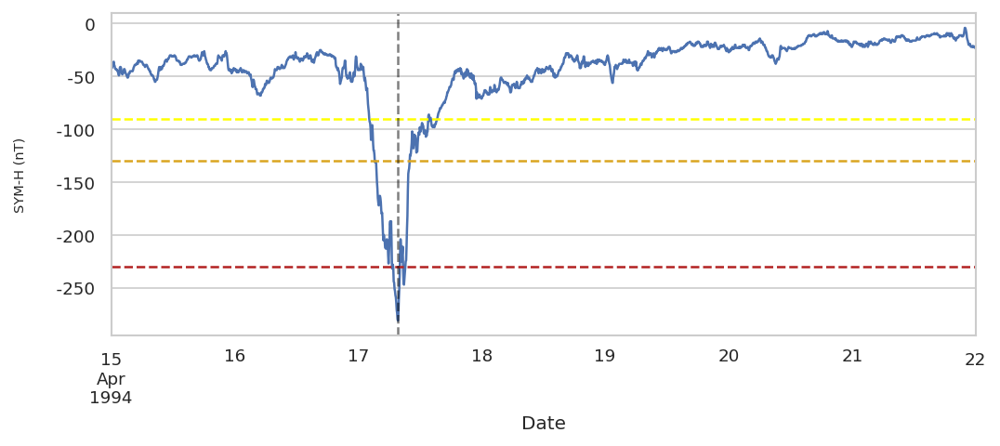

Plotting storm 154
Start date        1998-05-02 00:00:00
End date          1998-05-10 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -268
classification                INTENSE
Name: 154, dtype: object
Minimum SYM-H value -268 at: 1998-05-04 05:15:00


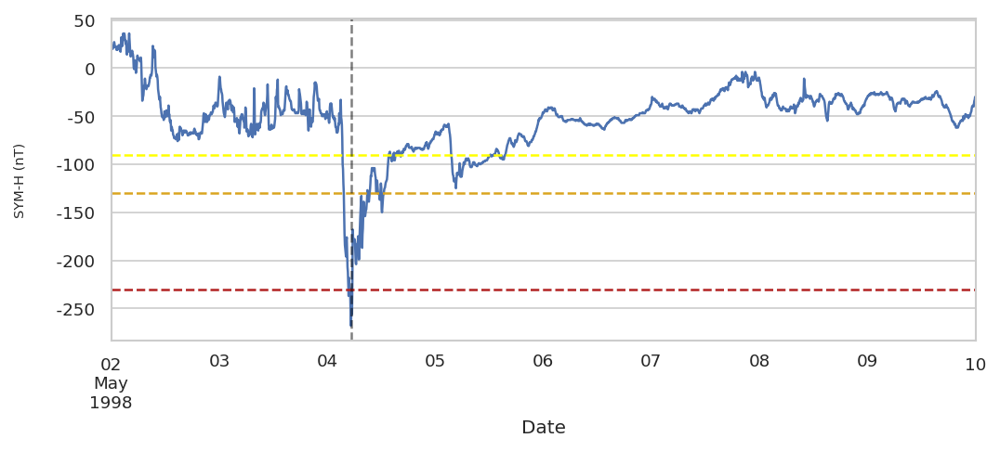

Plotting storm 171
Start date        2000-04-04 00:00:00
End date          2000-04-12 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -315
classification                INTENSE
Name: 171, dtype: object
Minimum SYM-H value -315 at: 2000-04-07 00:10:00


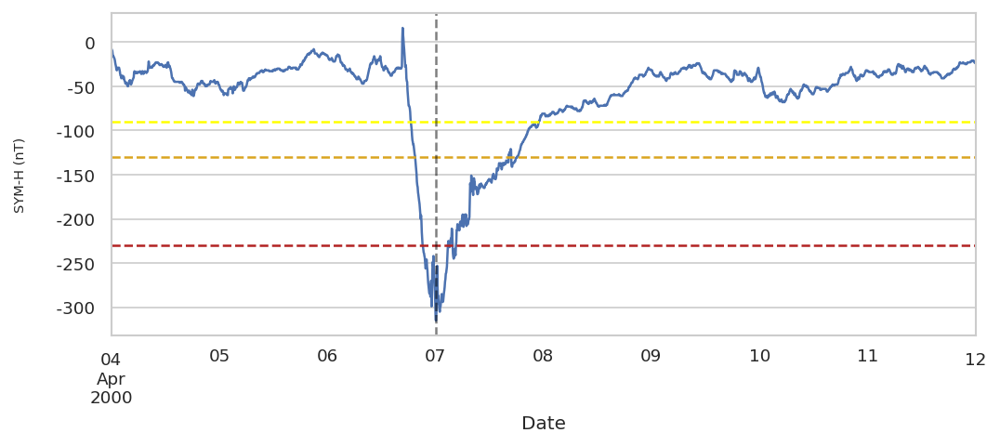

Plotting storm 175
Start date        2000-07-13 00:00:00
End date          2000-07-25 00:00:00
TD                   12 days 00:00:00
Min SYM-H                        -335
classification                INTENSE
Name: 175, dtype: object
Minimum SYM-H value -335 at: 2000-07-15 21:55:00


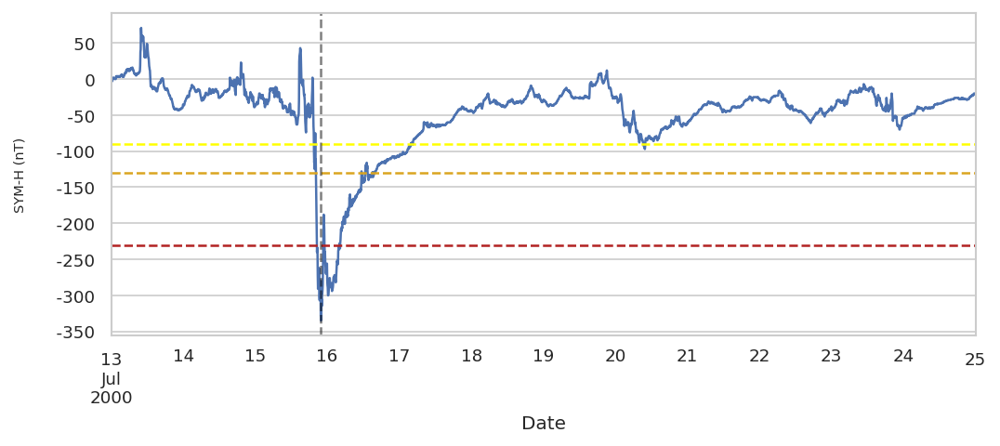

Plotting storm 176
Start date        2000-08-09 00:00:00
End date          2000-08-17 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -235
classification                INTENSE
Name: 176, dtype: object
Minimum SYM-H value -235 at: 2000-08-12 10:05:00


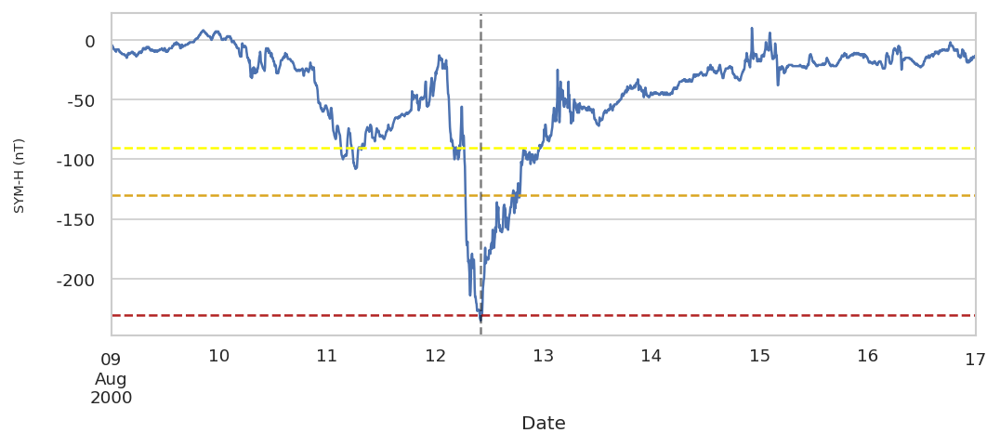

Plotting storm 185
Start date        2001-04-09 00:00:00
End date          2001-04-27 00:00:00
TD                   18 days 00:00:00
Min SYM-H                        -275
classification                INTENSE
Name: 185, dtype: object
Minimum SYM-H value -275 at: 2001-04-11 23:55:00


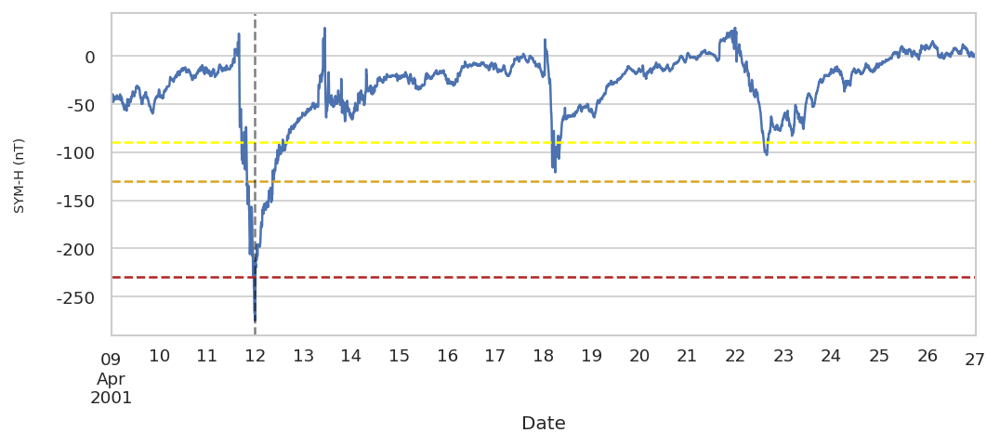

Plotting storm 189
Start date        2001-10-19 00:00:00
End date          2001-11-12 00:00:00
TD                   24 days 00:00:00
Min SYM-H                        -313
classification                INTENSE
Name: 189, dtype: object
Minimum SYM-H value -313 at: 2001-11-06 04:05:00


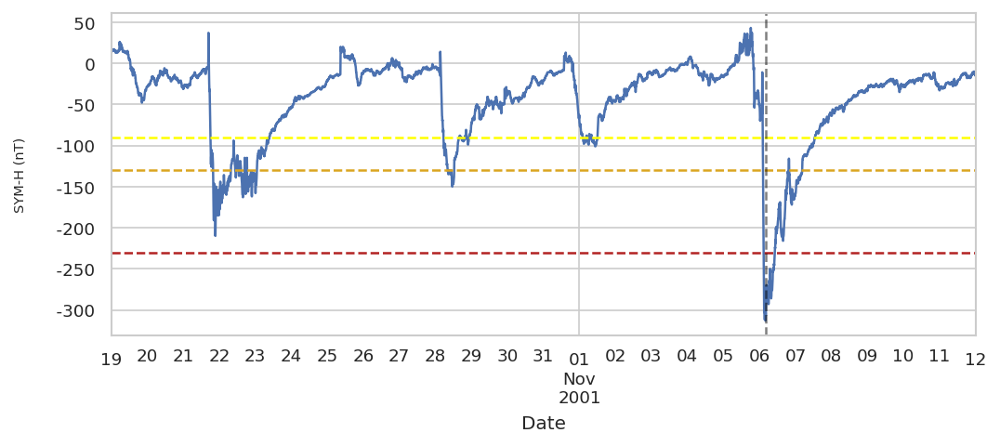

Plotting storm 190
Start date        2001-11-22 00:00:00
End date          2001-11-30 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -233
classification                INTENSE
Name: 190, dtype: object
Minimum SYM-H value -233 at: 2001-11-24 12:35:00


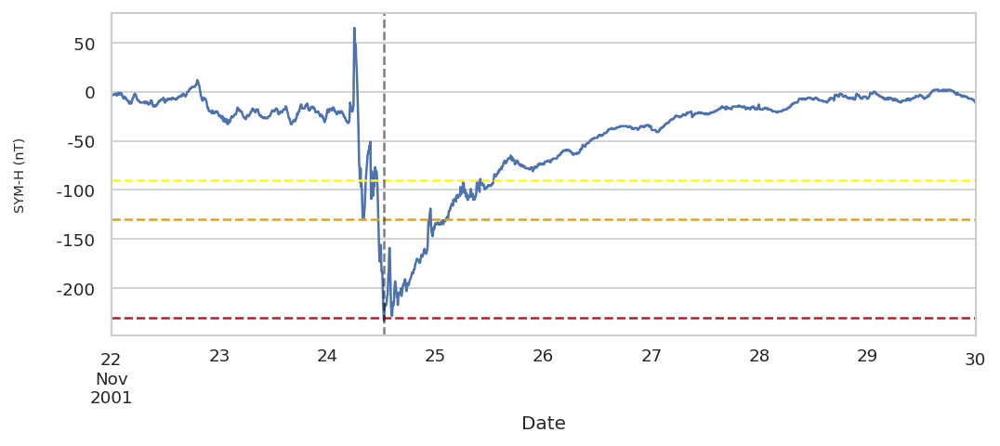

Plotting storm 223
Start date        2005-05-06 00:00:00
End date          2005-05-25 00:00:00
TD                   19 days 00:00:00
Min SYM-H                        -302
classification                INTENSE
Name: 223, dtype: object
Minimum SYM-H value -302 at: 2005-05-15 08:20:00


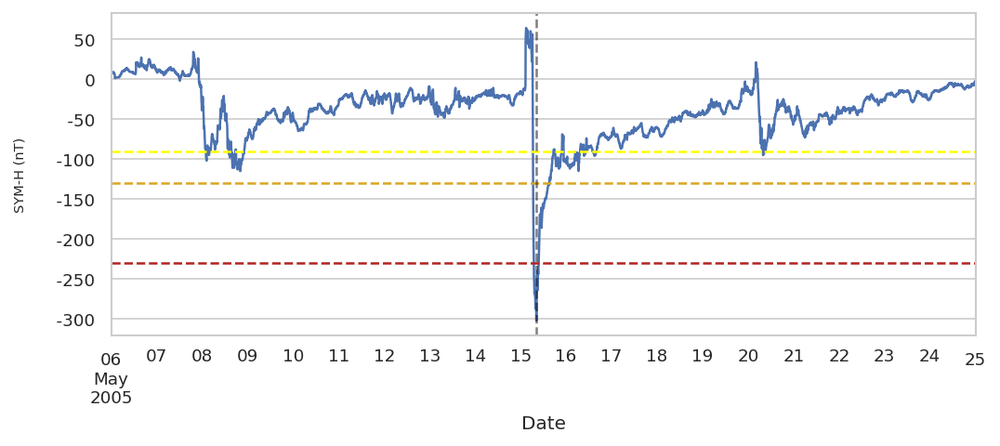

Plotting storm 252
Start date        2015-03-15 00:00:00
End date          2015-03-23 00:00:00
TD                    8 days 00:00:00
Min SYM-H                        -233
classification                INTENSE
Name: 252, dtype: object
Minimum SYM-H value -233 at: 2015-03-17 22:45:00


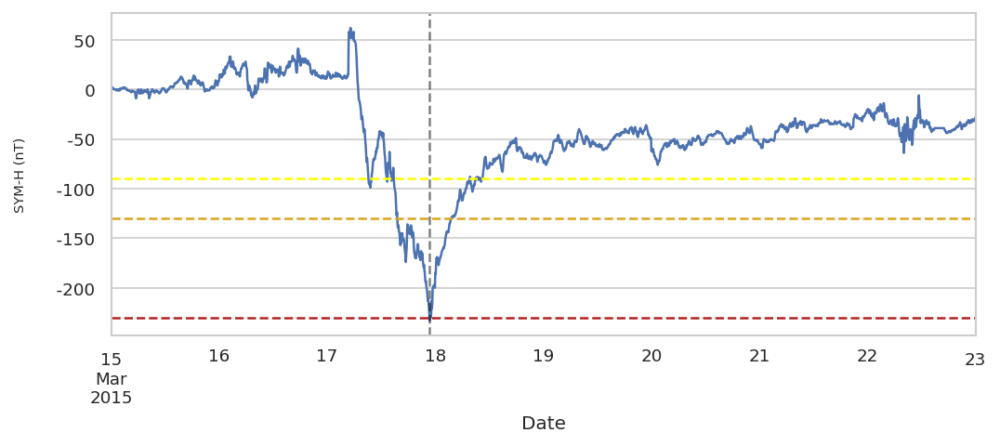

In [11]:
# Plot the intense storms
# the yellow horizontal line corresponds to the low intensity threshold
# the orange horizontal line corresponds to the moderate intensity threshold
# the red horizontal line corresponds to the intense threshold
print(f'{len(intense_indices)} intense storms')
for ix, ind in enumerate(intense_indices):
    ax = utils.plot_storm_sym(dfx, summary_df_sym, ind)
    strm = utils.get_storm(dfx, summary_df_sym, ind)
    ax.axvline(strm['SYM_H'].idxmin(), linestyle = '--', color = 'black', alpha = 0.5)
    print(f'Minimum SYM-H value {strm["SYM_H"].min()} at: {strm["SYM_H"].idxmin()}')
    plt.show();

7 superintense storms
Plotting storm 14
Start date        1982-07-11 00:00:00
End date          1982-07-29 00:00:00
TD                   18 days 00:00:00
Min SYM-H                        -420
classification           SUPERINTENSE
Name: 14, dtype: object
Minimum SYM-H value -420 at: 1982-07-14 01:05:00


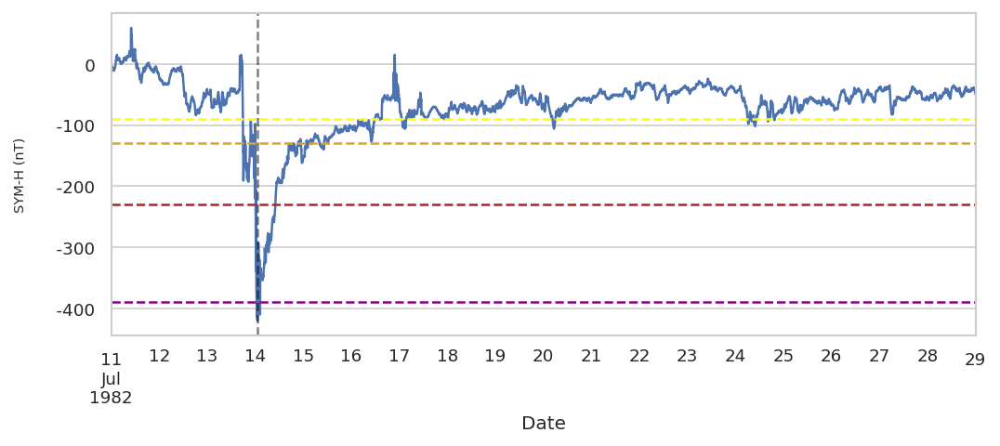

Plotting storm 66
Start date        1989-03-11 00:00:00
End date          1989-03-21 00:00:00
TD                   10 days 00:00:00
Min SYM-H                        -714
classification           SUPERINTENSE
Name: 66, dtype: object
Minimum SYM-H value -714 at: 1989-03-14 00:45:00


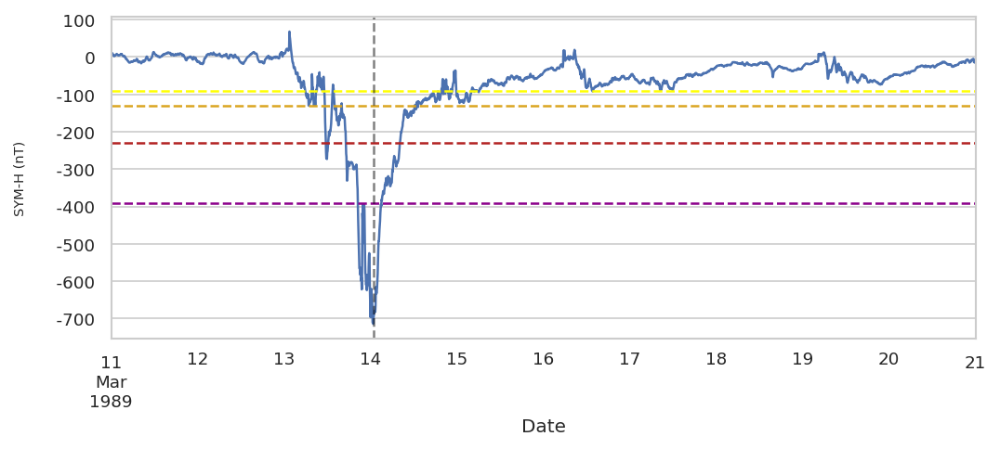

Plotting storm 99
Start date        1991-10-19 00:00:00
End date          1991-11-15 00:00:00
TD                   27 days 00:00:00
Min SYM-H                        -399
classification           SUPERINTENSE
Name: 99, dtype: object
Minimum SYM-H value -399 at: 1991-11-09 01:30:00


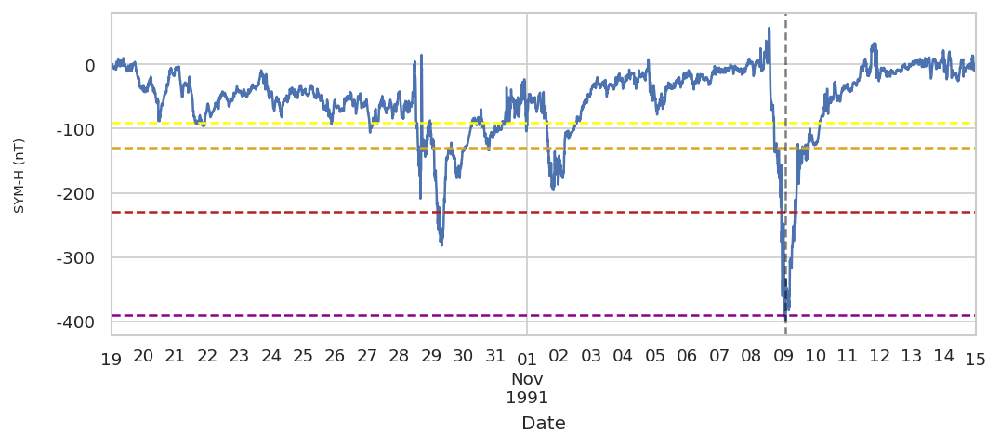

Plotting storm 184
Start date        2001-03-29 00:00:00
End date          2001-04-07 00:00:00
TD                    9 days 00:00:00
Min SYM-H                        -434
classification           SUPERINTENSE
Name: 184, dtype: object
Minimum SYM-H value -434 at: 2001-03-31 08:10:00


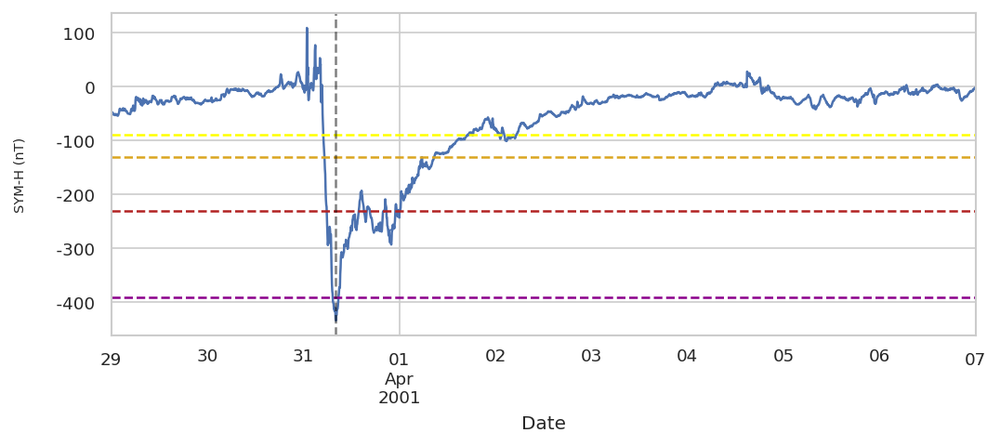

Plotting storm 210
Start date        2003-10-27 00:00:00
End date          2003-11-05 00:00:00
TD                    9 days 00:00:00
Min SYM-H                        -427
classification           SUPERINTENSE
Name: 210, dtype: object
Minimum SYM-H value -427 at: 2003-10-30 22:55:00


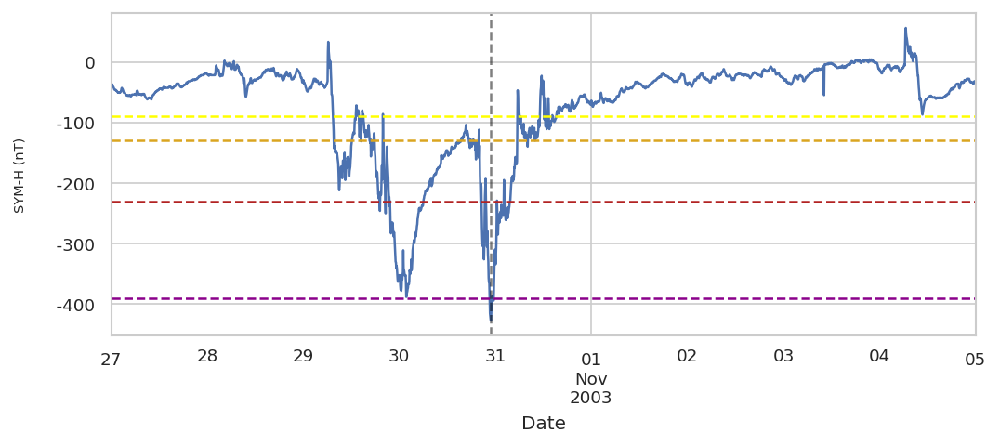

Plotting storm 211
Start date        2003-11-18 00:00:00
End date          2003-11-27 00:00:00
TD                    9 days 00:00:00
Min SYM-H                        -488
classification           SUPERINTENSE
Name: 211, dtype: object
Minimum SYM-H value -488 at: 2003-11-20 18:15:00


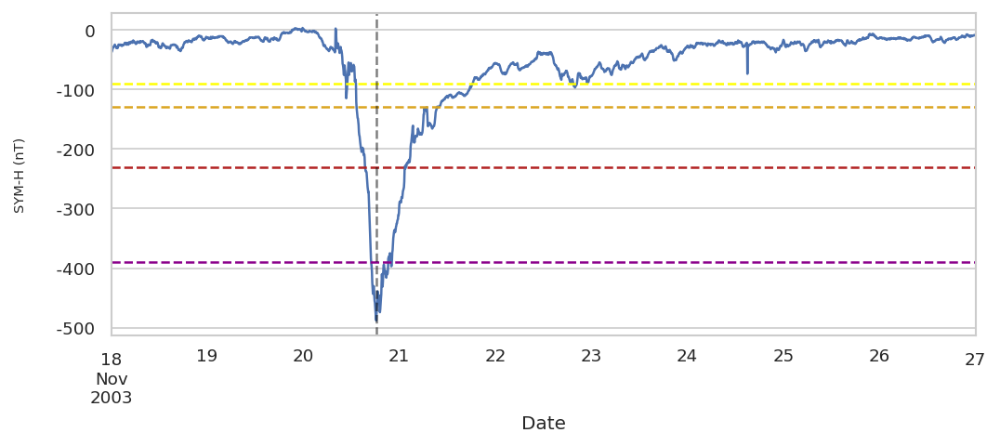

Plotting storm 218
Start date        2004-11-05 00:00:00
End date          2004-11-17 00:00:00
TD                   12 days 00:00:00
Min SYM-H                        -393
classification           SUPERINTENSE
Name: 218, dtype: object
Minimum SYM-H value -393 at: 2004-11-08 05:55:00


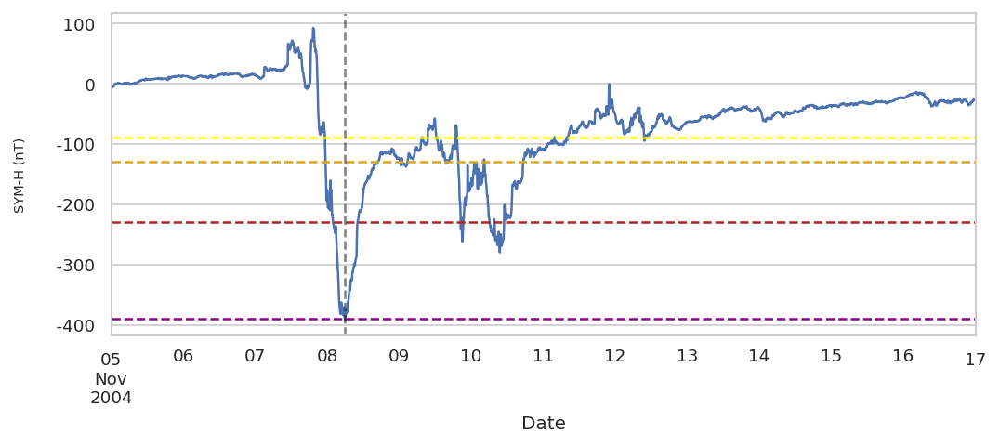

In [12]:
# Plot the super-intense storms
# the yellow horizontal line corresponds to the low intensity threshold
# the orange horizontal line corresponds to the moderate intensity threshold
# the red horizontal line corresponds to the intense threshold
# the magenta horizontal line corresponds to the super-intense threshold
print(f'{len(superintense_indices)} superintense storms')
for ix, ind in enumerate(superintense_indices):
    ax = utils.plot_storm_sym(dfx, summary_df_sym, ind)
    strm = utils.get_storm(dfx, summary_df_sym, ind)
    ax.axvline(strm['SYM_H'].idxmin(), linestyle = '--', color = 'black', alpha = 0.5)
    print(f'Minimum SYM-H value {strm["SYM_H"].min()} at: {strm["SYM_H"].idxmin()}')
    plt.show();

In [14]:
# Save the idesntified storms to a csv file in the format
# Start Date, End Date, Storm duration, Minimum SYM-H, Classification
summary_df_sym.to_csv('./storms_sym.csv', index = False)